Before running code, type into terminal:
    
    python –m venv venv\ 
^this creates the virtual enviornment

    venv\Scripts\activate
^this activates the virtual environment

    python -m pip install -r requirements.txt
^this installs packages according to the requirements.txt file

In [1]:
from pathlib import Path
from typing import Union, Optional
import copy

import numpy as np
import matplotlib.pyplot as pltvenv
from matplotlib import axes
import xarray as xr
import pandas as pd
from spotpy.algorithms import _algorithm
import spotpy
import tqdm
from scipy.stats import wasserstein_distance
import dask.array as da
import datetime as dt
import re


import os
from EditedFunctions251226mr import Model #Meghan's edits for roots
import ProfileFunction as pl #Profile function from GitHub
import PlottingFunctions as Plots #Plotting function from GitHub
#import pandas as pd #this works for Meghan using version 2.3.3
#import numpy as np #this works for Meghan using version 2.3.5
import matplotlib.pyplot as plt #this works for Meghan using version 3.10.7
import datetime


import phydrus as ps


In [2]:
#Doing working directory stuff

#set working directory manually (I'm sure there is a better way to do this)
#os.chdir('C:\\Users\\meghanrobinson\\Downloads\\Modeling\\PHydrusTest\\PipelineStructure')

#give path to exe file
exe = os.path.join(os.getcwd(), "H1D_CALC.EXE")

#name the folder files will fill
main_level = os.path.normpath(os.path.join(os.getcwd(), os.pardir))
newfolder = '2026-01-29'
ws = os.path.join(main_level, '3_Results', newfolder)

## Define Multidimensional Objective Functions

In [3]:
obj_func_direction = {
    'mse': 'minimize',
    'rmse': 'minimize',
    'nrmse': 'minimize',
    'nse': 'maximize',
    'pbias': 'minimize',
    'rmse_eta': 'minimize',
    'rmse_swe': 'minimize',
}

def mse_md(observation: np.ndarray, simulation: np.ndarray, return_dict: bool = False, axis=0):
    if observation.shape[axis] == simulation.shape[axis]:
        mse = np.nanmean((observation - simulation) ** 2, axis=axis)
        if return_dict:
            return {'mse': mse}
        else:
            return mse
    else:
        raise ValueError("evaluation and simulation data do not have the same length.")


def rmse_md(observation: np.ndarray, simulation: np.ndarray, return_dict: bool = False, axis=0):
    print("simulation.shape:", simulation.shape)
    print("observation.shape:", observation.shape)
    if observation.shape[axis] == simulation.shape[axis]:
        mse = mse_md(observation, simulation, axis=axis)
        rmse = np.sqrt(mse)
        if return_dict:
            return {'rmse': rmse}
        else:
            return rmse
    else:
        raise ValueError("evaluation and simulation data do not have the same length.")


def nrmse_md(observation: np.ndarray, simulation: np.ndarray, return_dict: bool = False, axis=0):
    if observation.shape[axis] == simulation.shape[axis]:
        nrmse = rmse_md(observation, simulation, axis=axis) / np.nanmean(observation, axis=axis)
        if return_dict:
            return {'nrmse': nrmse}
        else:
            return nrmse
    else:
        raise ValueError("evaluation and simulation data do not have the same length.")


def nse_md(observation: np.ndarray, simulation: np.ndarray, return_dict: bool = False, axis=0):
    if observation.shape[axis] == simulation.shape[axis]:
        mean_observed = np.nanmean(observation, axis=axis)
        # compute numerator and denominator
        numerator = np.nansum((observation - simulation) ** 2, axis=axis)
        denominator = np.nansum((observation - mean_observed) ** 2, axis=axis)
        # compute coefficient
        nse = 1 - (numerator / denominator)
        if return_dict:
            return {'nse': nse}
        else:
            return nse
    else:
        raise ValueError("evaluation and simulation data do not have the same length.")


def pbias_md(observation: np.ndarray, simulation: np.ndarray, return_dict: bool = False, axis=0):
    if observation.shape[axis] == simulation.shape[axis]:
        pbias = np.nansum(simulation - observation, axis=axis) / np.nansum(observation, axis=axis)
        if return_dict:
            return {'pbias': pbias}
        else:
            return pbias
    else:
        raise ValueError("evaluation and simulation data do not have the same length.")
    

# # These two functions didn't work because they were introducing a new dimension.
# def rmse_eta_md(observation: np.ndarray, simulation: np.ndarray, return_dict: bool = False, axis=0):
#     # # For SA
#     # observation = observation[0]
#     # simulation = simulation[0]

#     # For Calibration
#     observation = observation[:, 0]
#     simulation = simulation[:, 0]
#     if observation.shape[axis] == simulation.shape[axis]:
#         mse = mse_md(observation, simulation, axis=axis)
#         rmse = np.sqrt(mse)
#         if return_dict:
#             return {'rmse_eta': rmse}
#         else:
#             return rmse
#     else:
#         raise ValueError("evaluation and simulation data do not have the same length.")
    
# def rmse_swe_md(observation: np.ndarray, simulation: np.ndarray, return_dict: bool = False, axis=0):
#     # # For SA
#     # observation = observation[1]
#     # simulation = simulation[1]

#     # For Calibration
#     observation = observation[:, 1]
#     simulation = simulation[:, 1]
#     if observation.shape[axis] == simulation.shape[axis]:
#         mse = mse_md(observation, simulation, axis=axis)
#         rmse = np.sqrt(mse)
#         if return_dict:
#             return {'rmse_swe': rmse}
#         else:
#             return rmse
#     else:
#         raise ValueError("evaluation and simulation data do not have the same length.")
    
def rmse_eta_md(observation: np.ndarray, simulation: np.ndarray, return_dict: bool = False, axis=0):
    
    # Controlling different dimensions
    if len(observation.shape) == 2:
        # For SA
        observation = observation[:len(observation)//2]
        simulation = simulation[:len(simulation)//2]
    else:
        # For Calibration
        observation = observation[:, :len(observation[0])//2]
        simulation = simulation[:, :len(simulation[0])//2]

    # Actually running the analysis
    if observation.shape[axis] == simulation.shape[axis]:
        mse = mse_md(observation, simulation, axis=axis)
        rmse = np.sqrt(mse)
        if return_dict:
            return {'rmse_eta': rmse}
        else:
            return rmse
    else:
        raise ValueError("evaluation and simulation data do not have the same length.")
    
def rmse_swe_md(observation: np.ndarray, simulation: np.ndarray, return_dict: bool = False, axis=0):
    
    # Controlling different dimensions
    if len(observation.shape) == 2:
        # For SA
        observation = observation[len(observation)//2:]
        simulation = simulation[len(simulation)//2:]
    else:
        # For Calibration
        observation = observation[:, len(observation[0])//2:]
        simulation = simulation[:, len(simulation[0])//2:]

    # Actually running the analysis
    if observation.shape[axis] == simulation.shape[axis]:
        mse = mse_md(observation, simulation, axis=axis)
        rmse = np.sqrt(mse)
        if return_dict:
            return {'rmse_swe': rmse}
        else:
            return rmse
    else:
        raise ValueError("evaluation and simulation data do not have the same length.")


## Classes for MSC-UA Calibration

In [4]:
# Base class for a multidimensional database for the calibration. This could be used in future expansion to other formats
class MultiDimDb:
    format = None
    def __init__(
            self,
            dbname: str,
            dbpath: Union[str, Path],
            dims: Optional[dict] = None,
            dim_names: Optional[dict] = None,
            dbappend: bool = False,
            save_sim: bool = False,
    ):
        
        self.dbname = dbname
        self.cwd = dbpath
        self.dims = dims
        self.dim_names = dim_names
        self.dbappend = dbappend
        self.save_sim = save_sim

        self.ppu_upper = None
        self.ppu_lower = None
        self.pfactor = None
        self.rfactor = None
        self.thresholds = None
        self.best_sim = None
        self.best_params = None
        self.best_objfun = None


class MscuaSetup:
    # Define parameters here (before __init__) as variables

    def __init__(self, objective_funcs, type='run_interation', dbase: Optional[Union[str, Path, MultiDimDb]] = None):
        self.setup_type = type
        self.parameter_dimension = {}
        self.param_dim_names = {}
        self.indata = None
        self.observation_data = None
        if isinstance(objective_funcs, list):
            self.objfuncs = objective_funcs
        else:
            self.objfuncs = [objective_funcs]

    def parameters(self):
        pass
    
    def simulation(self):
        pass

    def evaluation(self):
        pass

    def objectivefunction(self, observation, simulation):
        pass


# accepts 2 types of setup classes, a MscuaSetup() object with attribute .setup_type = 'run_iteration' OR .setup_type = 'evaluate_iteration'
# Can use custom objective functions for filtering parameter sets but note that they must return a dictionary {'name_of_function': np.ndarray(values)}
class MsCua:
    
    algorithm_name = "MSCUA"
    
    def __init__(
            self,
            setup_class: MscuaSetup,
            dbname: str = 'mscuaDb',
            dbformat: str = 'memory',
            dbappend: bool = False,
            iter_db: Union[str, Path, None] = None

    ):
        self.setup = setup_class
        if dbformat == 'memory':
            self.database = MemDb(dbname=dbname)
        else:
            raise NotImplementedError("Other databases not supported yet, choose 'memory'")
        
        self.observation_data = self.setup.evaluation()

    def evaluate_iteration(self, dbase: MultiDimDb, objfunc_thresh: dict, min_pfactor: float = 0.35, min_refparams: int = 25):
        """
        Example objfunc_thresh dict:
        {'nse': 0.5, 'nrmse': 0.1}
            
        """
        if dbase.format == 'memory':
            if not dbase.parameter_samples:
                raise AttributeError("No paramter samples have been saved to the input database.")
            if len(dbase.simulation_results) == 0:
                raise AttributeError("No simulation data has been saved to the input database.")
            
            dbase.thresholds = objfunc_thresh
            dbase.thresholds.update({"pfactor_threshold": min_pfactor})
            dbase.thresholds.update({"min_refined_params_threshold": min_refparams})
            dbase._ref_par = copy.deepcopy(dbase._par_samples)
            reps = len(dbase.simulation_results)
            print("Evaluating Objective Function Values...")
            # need to convert simulation_results into an array here...sooner than it was
            sims_arr = np.array(dbase.simulation_results)
            ob = self.setup.objectivefunction(self.observation_data[None,:,:], sims_arr)
            if not isinstance(ob, dict):
                raise ValueError("The setup class's objective function method did not return a dictionary. " \
                "A dictionary of objective functions is required.")
            dbase.save(objective_func=ob)
            best_sim = {}
            best_obfn = {}
            best_params = {}
            for k,v in ob.items():
                if obj_func_direction[k] == 'minimize':
                    # print()
                    # print('array: ', sims_arr.shape)
                    # print(f'k: {k}, v: {v.shape}')
                    # print(f'{v.argmin(axis=0).shape}, :, {v.shape[1]}')
                    best_rep = sims_arr[v.argmin(axis=0),:,np.arange(v.shape[1])].T
                    best_ob = v[v.argmin(axis=0),np.arange(v.shape[1])]
                    best_par = {}
                    for pk,pv in dbase.refined_parameters.items():
                        best_par.update({pk: pv[v.argmin(axis=0), np.arange(v.shape[1])]})
                    
                    # print()
                    # print('array: ', sims_arr.shape)
                    # print(f'k: {k}, v: {v.shape}')
                    # print(f'{v.argmin(axis=1).shape}, :, {v.shape[2]}')
                    # best_rep = sims_arr[v.argmin(axis=1),:,np.arange(v.shape[2])].T
                    # best_ob = v[v.argmin(axis=1),np.arange(v.shape[2])]
                    # best_par = {}
                    # for pk,pv in dbase.refined_parameters.items():
                    #     best_par.update({pk: pv[v.argmin(axis=0), np.arange(v.shape[1])]})
                elif obj_func_direction[k] == 'maximize':
                    best_rep = sims_arr[v.argmax(axis=0),:,np.arange(v.shape[1])].T
                    best_ob = v[v.argmax(axis=0),np.arange(v.shape[1])]
                    best_par = {}
                    for pk,pv in dbase.refined_parameters.items():
                        best_par.update({pk: pv[v.argmax(axis=0), np.arange(v.shape[1])]})
                else:
                    raise ValueError("The objective function threshold direction is not recognized.")
                best_sim.update({k: best_rep})
                best_obfn.update({k: best_ob})
                best_params.update({k: best_par})
            dbase.best_sim = best_sim
            dbase.best_params = best_params
            dbase.best_objfun = best_obfn
            fil = {}
            for k,v in ob.items():
                if k not in list(objfunc_thresh.keys()):
                    raise ValueError(f"No threshold was provided for objective function {k}.")
                if obj_func_direction[k] == 'minimize':
                    filter = np.where(v > objfunc_thresh[k])
                elif obj_func_direction[k] == 'maximize':
                    filter = np.where(v < objfunc_thresh[k])
                else:
                    raise ValueError("The objective function threshold direction is not recognized.")
                fil[k] = filter
                for park in dbase.refined_parameters.keys():
                    for k, v in fil.items():
                        dbase._ref_par[park][v] = np.nan
            param_nans = np.isnan(dbase.refined_parameters[list(dbase.refined_parameters.keys())[0]])
            refined_param_cnt = np.count_nonzero(~param_nans, axis=0)
            print(f"Max number of refined parameter sets: {refined_param_cnt.max()}")
            print(f"Min number of refined parameter sets: {refined_param_cnt.min()}")
            ref_less_than = np.count_nonzero(refined_param_cnt < min_refparams)
            # Remove simulations from sim_arr that did not meet objective function thresholds
            ref_sims_idx = np.where(param_nans)
            sims_arr[ref_sims_idx[0],:,ref_sims_idx[1]] = np.nan
            ## calculate 95PPU here
            print("Calculating the 95PPU...")
            obs_sd = np.std(self.observation_data, axis=0)
            up95ppu = np.nanquantile(sims_arr, 0.975, axis=0)
            lo95ppu = np.nanquantile(sims_arr, 0.025, axis=0)
            print("Calculating p- and r-factor metrics...")
            pfac_arr = np.where((self.observation_data <= up95ppu) & (self.observation_data >= lo95ppu), 1, 0)
            pfac_cnt = np.count_nonzero(pfac_arr, axis=0)
            pfactor = pfac_cnt / up95ppu.shape[0]
            ppu_diff = (up95ppu - lo95ppu).mean(axis=0)
            rfactor = ppu_diff / obs_sd
            print(f"Max p-factor = {pfactor.max()}")
            print(f"Min p-factor = {pfactor.min()}")
            print(f"Min r-factor = {np.nanmin(rfactor)}")
            print(f"Max r-factor = {np.nanmax(rfactor)}")
            dbase.ppu_upper = up95ppu
            dbase.ppu_lower = lo95ppu
            dbase.pfactor = pfactor
            dbase.rfactor = rfactor

            if ref_less_than == 0:
                print(f"All models retained more refined parameter sets than the minimun: {min_refparams}.")
                if np.count_nonzero(pfactor < min_pfactor) == 0:
                    print(f"All models had p-factor greater than {min_pfactor}")
                else:
                    print(f"{np.count_nonzero(pfactor < min_pfactor)} models had a p-factor lower than the allowable minimum: {min_pfactor}. Returning array of failed indexes.")
                    return np.where(pfactor < min_pfactor)[0]
            else:
                print(f"{ref_less_than} models had fewer than the minimum allowable refined parameter sets: {min_refparams}. Either increase the number of samples or exclude these models.")
                print(f"Returning array of failed model indexes.")
                if np.count_nonzero(pfactor < min_pfactor) == 0:
                    print(f"All models had p-factor greater than {min_pfactor}")
                    return np.where(refined_param_cnt < min_refparams)[0]
                else:
                    print(f"{np.count_nonzero(pfactor < min_pfactor)} models had a p-factor lower than the allowable minimum: {min_pfactor}. Returning array of failed indexes.")
                    return np.where(pfactor < min_pfactor)[0], np.where(refined_param_cnt < min_refparams)[0]        

        else:
            raise NotImplementedError("Other databases not supported")

    def sample(self, reps: int, objfunc_thresholds: dict, min_pfactor: float = 0.35, min_refparams: int = 25, **kwargs):
        plist = build_parameter_list(self.setup, self.setup.parameter_dimension, self.setup.param_dim_names)
        samples, newdb = LHS_md(plist, repetitions=reps, dbase=self.database, **kwargs)
        self.database = newdb
        run_multidim_model_reps(self.setup, self.database)
        iter_result = self.evaluate_iteration(self.database, objfunc_thresholds, min_pfactor, min_refparams)
        if iter_result is None:
            return None
        else:
            return iter_result

    def _evaluate_rep(self, obs_data: np.ndarray, rep_simulations: np.ndarray, objfunc_thresh: dict):
        ob = self.setup.objectivefunction(obs_data, rep_simulations)
        if not isinstance(ob, dict):
            raise ValueError("The setup class's objective function method did not return a dictionary. A dictionary of objective functions is required.")
        fil = {}
        for k,v in ob.items():
            if k not in list(objfunc_thresh.keys()):
                raise ValueError(f"No threshold was provided for objective function {k}.")
            if obj_func_direction[k] == 'minimize':
                filter = np.where(v > objfunc_thresh[k])
            elif obj_func_direction[k] == 'maximize':
                filter = np.where(v < objfunc_thresh[k])
            else:
                raise ValueError("The objective function threshold direction is not recognized.")
            
            fil[k] = filter
        
        return ob, fil


class MsCuaAnalyzer:

    def __init__(self, dbase: Union[MultiDimDb, xr.Dataset]):
        
        if isinstance(dbase, MultiDimDb):
            self.dbase = dbase
            if self.dbase.format == 'memory':
                self.ds = self.dbase.to_xarray()
            else:
                self.ds = self.dbase
        else:
            self.dbase = None
            self.ds = dbase

    def plot_pfactor(self, threshold: bool = False):
        ax = plt.axes()
        ax.hist(self.ds.pfactor.values)
        if threshold:
            ax.axvline(self.ds.pfactor_threshold.values, color='black', ls='--', label='Threshold')
            ax.legend()
        ax.set_ylabel("Frequency", fontsize=12)
        ax.set_xlabel("pfactor Value", fontsize=12)
        plt.show()
    
    def plot_rfactor(self):
        ax = plt.axes()
        ax.hist(self.ds.rfactor.values)
        ax.set_ylabel("Frequency", fontsize=12)
        ax.set_xlabel("rfactor Value", fontsize=12)
        plt.show()
    
    def plot_refined_parameters(self, param: str, indx: int = 0, ax: Optional[axes.Axes] = None, **kwargs):
        if ax is None:
            ax = plt.axes()
        else:
            ax = ax
        ax.hist(self.ds[f"{param}_refined"].values[:,indx])
        ax.set_ylabel("Frequency", fontsize=12)
        ax.set_xlabel(f"Refined {param} Value", fontsize=12)
        plt.show()
    
    def compare_parameter_distributions(self, param: str, comp_dstb: Union[np.ndarray, list], indx: int = 0, ax: Optional[axes.Axes] = None, **kwargs):
        dims = self.ds[f"{param}_samples"].dims
        if ax is None:
            ax = plt.axes()
        else:
            ax = ax
        ax.hist(comp_dstb, label='comparison parameter values', **kwargs)
        ax.hist(self.ds[f"{param}_refined"].values[:,indx], label='refined parameter values', **kwargs)
        ax.set_ylabel("Frequency", fontsize=12)
        ax.set_xlabel(f"{param} Value", fontsize=12)
        ax.set_title(f"{dims[1]}: {indx}", fontsize=12)
        ax.legend()
        plt.show()
    
    def plot_ppu(self, indx: int = 0, best_sim: bool = False, obs_data: Optional[np.ndarray] = None, sort: bool = False, ax: Optional[axes.Axes] = None):
        dims = self.ds["95PPU_lower"].dims
        if ax is None:
            ax = plt.axes()
        else:
            ax = ax
        if sort:
            srt_idx = np.argsort(self.ds["95PPU_lower"].values[:,indx])
            ax.fill_between(np.arange(self.ds["95PPU_lower"].values.shape[0]), 
                            self.ds["95PPU_upper"].values[srt_idx,indx], 
                            self.ds["95PPU_lower"].values[srt_idx,indx], 
                            label="95 Percentile Prediction Uncertainty",
                            ec='blue',
                            alpha=0.3)
            if obs_data is not None:
                if self.ds["95PPU_lower"].values.shape != obs_data.shape:
                    raise ValueError("The input observation data does not match the size of the modeled 95 percent prediction uncertainty.")
                ax.plot(np.sort(obs_data[:,indx]), marker=None, ls='-', lw=1.2, color='black', label='Observed Values')
            if best_sim:
                for i in self.ds["objective_functions"].values:
                    ax.plot(self.ds[f"best_simulation_{i}"].values[srt_idx, indx], marker=None, ls='--', lw=1, color='red', label=f'Best Model Simulation - {i}')
        else:
            ax.fill_between(np.arange(self.ds["95PPU_lower"].values.shape[0]), 
                            self.ds["95PPU_upper"].values[:,indx], 
                            self.ds["95PPU_lower"].values[:,indx], 
                            label="95 Percentile Prediction Uncertainty")
            if obs_data is not None:
                if self.ds["95PPU_lower"].values.shape != obs_data.shape:
                    raise ValueError("The input observation data does not match the size of the modeled 95 percent prediction uncertainty.")
                ax.plot(obs_data[:,indx], marker=None, ls='-', lw=1.25, color='black', label='Observed Values')
            if best_sim:
                for i in self.ds["objective_functions"].values:
                    ax.plot(self.ds[f"best_simulation_{i}"].values[:, indx], marker=None, ls='--', lw=1, color='red', label=f'Best Model Simulation - {i}')
        ax.set_ylabel("Model Output Values", fontsize=12)
        ax.set_xlabel(dims[0], fontsize=12)
        ax.set_title(f"{dims[1]}: {indx}", fontsize=12)
        ax.legend()
        ax.set_yscale('log')
        plt.show()

    def plot_objective_functions(self, indx: int = 0, threshold: bool = False):
        n = len(self.ds.objective_functions)
        if n % 2 == 0:
            # fig, axs = plt.subplots(int(n/2), 2, sharex=True)
            fig, axs = plt.subplots(int(n/2), 2, sharex=False)
        else:
            # fig, axs = plt.subplots(int(n/2+1), 2, sharex=True)
            fig, axs = plt.subplots(int(n/2+1), 2, sharex=False)
        for i, v in enumerate(self.ds.objective_functions.values.tolist()):
            if i % 2 == 0:
                if len(axs.shape) > 1:
                    ax_i = axs[int(i/2), 0]
                else:
                    ax_i = axs[0]
                ax_i.hist(self.ds[v].values[:, indx])
                if threshold:
                    thresh = self.ds.obj_func_thresholds.sel(objective_functions=v).values
                    ax_i.axvline(thresh, color='black', ls='--', label='Threshold')
                    ax_i.legend()
                ax_i.set_title(f"{self.ds[v].dims[1]} {indx}: {v}")
            else:
                if len(axs.shape) > 1:
                    ax_i = axs[int(i/2), 1]
                else:
                    ax_i = axs[1]
                ax_i.hist(self.ds[v].values[:, indx])
                if threshold:
                    thresh = self.ds.obj_func_thresholds.sel(objective_functions=v).values
                    ax_i.axvline(thresh, color='black', ls='--', label='Threshold')
                    ax_i.legend()
                ax_i.set_title(f"{self.ds[v].dims[1]} {indx}: {v}")
        if n % 2 != 0:
            if len(axs.shape) > 1:
                for l in axs[int(n/2)-1,1].get_xaxis().get_majorticklabels():
                    l.set_visible(True)
                fig.delaxes(axs[int(n/2), 1])
                for ax in axs[-1, :]:
                    ax.set_xlabel('Objective Function Value')
                for ax in axs[:, 0]:
                    ax.set_ylabel('Frequency')
            else:
                for l in axs[1].get_xaxis().get_majorticklabels():
                    l.set_visible(True)
                fig.delaxes(axs[1])
                for ax in axs:
                    ax.set_xlabel('Objective Function Value')
                axs[0].set_ylabel('Frequency')
        plt.tight_layout()
        plt.show()

    def plot_best_objfuncs(self, threshold: bool = False):
        n = len(self.ds.objective_functions)
        if n % 2 == 0:
            # fig, axs = plt.subplots(int(n/2), 2, sharex=True)
            fig, axs = plt.subplots(int(n/2), 2, sharex=False)
        else:
            # fig, axs = plt.subplots(int(n/2+1), 2, sharex=True)
            fig, axs = plt.subplots(int(n/2+1), 2, sharex=False)
        for i, v in enumerate(self.ds.objective_functions.values.tolist()):
            if i % 2 == 0:
                if len(axs.shape) > 1:
                    ax_i = axs[int(i/2), 0]
                else:
                    ax_i = axs[0]
                ax_i.hist(self.ds.best_obj_function.sel(objective_functions=v).values)
                if threshold:
                    thresh = self.ds.obj_func_thresholds.sel(objective_functions=v).values
                    ax_i.axvline(thresh, color='black', ls='--', label='Threshold')
                    ax_i.legend()
                ax_i.set_title(f"Best {v} value per {self.ds[v].dims[1]}")
            else:
                if len(axs.shape) > 1:
                    ax_i = axs[int(i/2), 1]
                else:
                    ax_i = axs[1]
                ax_i.hist(self.ds.best_obj_function.sel(objective_functions=v).values)
                if threshold:
                    thresh = self.ds.obj_func_thresholds.sel(objective_functions=v).values
                    ax_i.axvline(thresh, color='black', ls='--', label='Threshold')
                    ax_i.legend()
                ax_i.set_title(f"Best {v} value per {self.ds[v].dims[1]}")
        if n % 2 != 0:
            if len(axs.shape) > 1:
                for l in axs[int(n/2)-1,1].get_xaxis().get_majorticklabels():
                    l.set_visible(True)
                fig.delaxes(axs[int(n/2), 1])
                for ax in axs[-1, :]:
                    ax.set_xlabel('Objective Function Value')
                for ax in axs[:, 0]:
                    ax.set_ylabel('Frequency')
            else:
                for l in axs[1].get_xaxis().get_majorticklabels():
                    l.set_visible(True)
                fig.delaxes(axs[1])
                for ax in axs:
                    ax.set_xlabel('Objective Function Value')
                axs[0].set_ylabel('Frequency')
        plt.tight_layout()
        plt.show()
    
    def plot_number_refined_params(self, threshold: bool = False):
        arb_parm = self.ds.parameters.values[0]
        nans = np.isnan(self.ds[f"{arb_parm}_refined"].values)
        nz = np.count_nonzero(~nans, axis=0)
        ax = plt.axes()
        ax.hist(nz)
        if threshold:
            ax.axvline(self.ds.min_refined_params_threshold.values, color='black', ls='--', label='Threshold')
            ax.legend()
        ax.set_ylabel("Frequency", fontsize=12)
        ax.set_xlabel("Number Refined Parameter Sets", fontsize=12)
        plt.show()
    
    def calc_param_distribution_change(self, param: str, comp_dstb: Union[np.ndarray, list], indx: int = 0):
        d1 = comp_dstb
        d2 = self.ds[f"{param}_refined"].values[:,indx]
        ws_dist = wasserstein_distance(d1[~np.isnan(d1)], d2[~np.isnan(d2)])

        return ws_dist


class SensitivityAnalysis:

    def __init__(self,
                 setup_class: MscuaSetup,
                 ):
        
        self.setup = setup_class
                
        self.observation_data = self.setup.evaluation()
        self.results = None

    def sample(self, reps: int = 10):
        plist = build_parameter_list(self.setup, self.setup.parameter_dimension, self.setup.param_dim_names)
        pnames = []
        objf_names = None
        init_samp = {}
        for p in plist:
            name = p.name
            pnames.append(name)
            sv = np.repeat(p(), p.dim)
            init_samp.update({name: sv})
        rslt = xr.Dataset()
        rslt.coords['parameters'] = (('parameters',), pnames)
        rslt.coords['repetitions'] = (('repetitions',), np.arange(reps)+1)
        rslt.coords[plist[0].dim_name] = ((plist[0].dim_name,), np.arange(plist[0].dim)+1)
        arr_sz = (len(pnames), reps, self.setup.parameter_dimension[pnames[0]])
        active_samp = copy.deepcopy(init_samp)
        segment = 1 / float(reps)
        rslt['samples'] = (('parameters', 'repetitions', plist[0].dim_name), da.from_array(np.empty(arr_sz), chunks='auto'))
        for i, p in enumerate(plist):
            # sample parameter space here
            parmin = p.minbound
            parmax = p.maxbound
            
            if isinstance(parmin, float):
                parmin = np.repeat(parmin, p.dim)
            if isinstance(parmax, float):
                parmax = np.repeat(parmax, p.dim)
                
            print(f"Sampling {reps} repetitions of the {p.name} parameter...")
            for r in tqdm.tqdm(range(reps), desc=f"{p.name} samples", leave=False):
                # iterate samples per paramter here, run simulation, calculate objective function and assign values
                segmentMin = r * segment
                pointInSegment = segmentMin + (np.random.random() * segment)
                parset = pointInSegment * (parmax - parmin) + parmin
                active_samp[p.name] = parset
                rslt['samples'].values[i, r, :] = parset
                sim = self.setup.simulation(active_samp)
                ob = self.setup.objectivefunction(self.observation_data, sim)
                if objf_names is None:
                    objf_names = []
                    for k in ob.keys():
                        objf_names.append(k)
                    rslt.coords['objective_functions'] = (('objective_functions',), objf_names)
                # logic to check for obj func name in dataset datavars, if not there, add (initialize dask empty dask array), if it is there append by index
                for k,v in ob.items():
                    if k not in list(rslt.data_vars):
                        rslt[k] = (('parameters', 'repetitions', p.dim_name), da.from_array(np.empty(arr_sz), chunks='auto'))
                        rslt[k].values[i,r,:] = v
                    else:
                        rslt[k].values[i,r,:] = v
            # result active samp
            active_samp[p.name] = init_samp[p.name]
        
        sens_indx = da.from_array(np.empty((len(rslt['objective_functions'].values), arr_sz[0], arr_sz[2])), chunks='auto')
        for i, obf in enumerate(rslt['objective_functions'].values.tolist()):
            d = np.nanmax(rslt[obf].values, axis=(0,1)) - np.nanmin(rslt[obf].values, axis=(0,1))
            for j, par in enumerate(rslt['parameters'].values.tolist()):
                n = np.nanmax(rslt[obf].sel(parameters=par).values, axis=0) - np.nanmin(rslt[obf].sel(parameters=par).values, axis=0)
                sens_arr = n / d
                sens_indx[i, j, :] = sens_arr
        rslt['sensitivity_index'] = (('objective_functions', 'parameters', plist[0].dim_name), sens_indx)
        self.results = rslt

    def plot_sensitivity_index(self, indx: int = 0):
        if self.results is None:
            raise AttributeError("The sensitivity analysis has not been run yet, the results are empty.")
        
        n = len(self.results.objective_functions)
        if n % 2 == 0:
            fig, axs = plt.subplots(int(n/2), 2)
        else:
            fig, axs = plt.subplots(int(n/2+1), 2)
        for i, v in enumerate(self.results.objective_functions.values.tolist()):
            if i % 2 == 0:
                if len(axs.shape) > 1:
                    ax_i = axs[int(i/2), 0]
                else:
                    ax_i = axs[0]
                ax_i.bar(self.results.parameters.values, self.results['sensitivity_index'].sel(objective_functions=v).values[:,indx])
                ax_i.set_title(f"{v}: {self.results['sensitivity_index'].dims[2]} {indx}")
            else:
                if len(axs.shape) > 1:
                    ax_i = axs[int(i/2), 1]
                else:
                    ax_i = axs[1]
                ax_i.bar(self.results.parameters.values, self.results['sensitivity_index'].sel(objective_functions=v).values[:,indx])
                ax_i.set_title(f"{v}: {self.results['sensitivity_index'].dims[2]} {indx}")
        if n % 2 != 0:
            if len(axs.shape) > 1:
                for l in axs[int(n/2)-1,1].get_xaxis().get_majorticklabels():
                    l.set_visible(True)
                fig.delaxes(axs[int(n/2), 1])
                for ax in axs[:, 0]:
                    ax.set_ylabel('Sensitivity Index')
            else:
                for l in axs[1].get_xaxis().get_majorticklabels():
                    l.set_visible(True)
                fig.delaxes(axs[1])
                axs[0].set_ylabel('Sensitivity Index')
        plt.tight_layout()
        plt.show()

    def plot_sensitivity_distribution(self, param: str):
        if self.results is None:
            raise AttributeError("The sensitivity analysis has not been run yet, the results are empty.")
        
        n = len(self.results.objective_functions)
        if n % 2 == 0:
            fig, axs = plt.subplots(int(n/2), 2)
        else:
            fig, axs = plt.subplots(int(n/2+1), 2)
        for i, v in enumerate(self.results.objective_functions.values.tolist()):
            if i % 2 == 0:
                if len(axs.shape) > 1:
                    ax_i = axs[int(i/2), 0]
                else:
                    ax_i = axs[0]
                ax_i.hist(self.results['sensitivity_index'].sel(objective_functions=v, parameters=param).values)
                ax_i.set_xlabel(f"{param} Sensitivity Indexes")
                ax_i.set_ylabel("Frequency")
                ax_i.set_title(f"{v}")
            else:
                if len(axs.shape) > 1:
                    ax_i = axs[int(i/2), 1]
                else:
                    ax_i = axs[1]
                ax_i.hist(self.results['sensitivity_index'].sel(objective_functions=v, parameters=param).values)
                ax_i.set_xlabel(f"{param} Sensitivity Indexes")
                ax_i.set_ylabel("Frequency")
                ax_i.set_title(f"{v}")
        if n % 2 != 0:
            if len(axs.shape) > 1:
                for l in axs[int(n/2)-1,1].get_xaxis().get_majorticklabels():
                    l.set_visible(True)
                fig.delaxes(axs[int(n/2), 1])
            else:
                for l in axs[1].get_xaxis().get_majorticklabels():
                    l.set_visible(True)
                fig.delaxes(axs[1])
        plt.tight_layout()
        plt.show()
    
    def plot_obj_func(self, obj_func: str, indx: int = 0):
        if self.results is None:
            raise AttributeError("The sensitivity analysis has not been run yet, the results are empty.")
        
        n = len(self.results.parameters)
        if n % 2 == 0:
            fig, axs = plt.subplots(int(n/2), 2)
        else:
            fig, axs = plt.subplots(int(n/2+1), 2)
        for i, v in enumerate(self.results.parameters.values.tolist()):
            if i % 2 == 0:
                if len(axs.shape) > 1:
                    ax_i = axs[int(i/2), 0]
                else:
                    ax_i = axs[0]
                ax_i.plot(self.results['samples'].sel(parameters=v).values[:,indx], self.results[obj_func].sel(parameters=v).values[:,indx])
                ax_i.set_xlabel(f"{v} Value")
                ax_i.set_ylabel(obj_func)
            else:
                if len(axs.shape) > 1:
                    ax_i = axs[int(i/2), 1]
                else:
                    ax_i = axs[1]
                ax_i.plot(self.results['samples'].sel(parameters=v).values[:,indx], self.results[obj_func].sel(parameters=v).values[:,indx])
                ax_i.set_xlabel(f"{v} Value")
                ax_i.set_ylabel(obj_func)
        if n % 2 != 0:
            if len(axs.shape) > 1:
                for l in axs[int(n/2)-1,1].get_xaxis().get_majorticklabels():
                    l.set_visible(True)
                fig.delaxes(axs[int(n/2), 1])
            else:
                for l in axs[1].get_xaxis().get_majorticklabels():
                    l.set_visible(True)
                fig.delaxes(axs[1])
        plt.tight_layout()
        plt.show()
    

# A child class of MultiDimDb that creates a set of zarr files to database calibration output
class ZarrDb(MultiDimDb):
    format = 'zarr'
    def __init__(self, *args, chunks: Optional[dict] = None, **kwargs):
        
        super(ZarrDb, self).__init__(*args, **kwargs)
        self.chunks = chunks
    
    def save(self):
        pass

    @staticmethod
    def load(dbpth: Union[str, Path]):
        pass


# create a netcdf with dummy data and then write to each region to fill it out...use chunks for dask capabilities?
class NetcdfDb(MultiDimDb):
    format = 'netcdf'
    def __init__(self, *args, chunks: Optional[dict] = None, **kwargs):
        
        super(NetcdfDb, self).__init__(*args, **kwargs)
        self.chunks = chunks
    
    def save(self):
        pass

    @staticmethod
    def load(dbpth: Union[str, Path]):
        pass


class MemDb(MultiDimDb):
    format = 'memory'

    def __init__(self, *args, **kwargs):
        
        super(MemDb, self).__init__(*args, dbpath=None, **kwargs)
        print("In Memory database initialized...")
        self._par_samples = {}
        self._ref_par = {}
        self._objfun = {}
        self._sim = []
        self._obs_index = None
    
    @property
    def simulation_results(self):
        return np.array(self._sim)
    
    @property
    def parameter_samples(self):
        return self._par_samples
    
    @property
    def refined_parameters(self):
        return self._ref_par

    @property
    def objective_func_values(self):
        return self._objfun

    @property
    def observation_labels(self):
        return self._obs_index
    
    @observation_labels.setter
    def observation_labels(self, new_in: np.ndarray):
        if self.simulation_results is None:
            raise AttributeError("No simulation results, save simulations first before assigning observation labels.")
        if new_in.size != self.simulation_results[0].shape[1]:
            raise ValueError("The input array is not the same length as observations dimension.")
        self._obs_index = new_in

    def save(self, param_dict: Optional[dict] = None, objective_func: Optional[dict] = None, simulations: Optional[np.ndarray] = None):
        if (param_dict is None) & (objective_func is None) & (simulations is None):
            print("No data to save")
        else:
            if param_dict is not None:
                if not self._par_samples:
                    self._par_samples.update(param_dict)
                else:
                    for k,v in param_dict.items():
                        self._par_samples[k] = np.vstack((self._par_samples[k], v))
            
            if objective_func is not None:
                if not self._objfun:
                    self._objfun.update(objective_func)
                else:
                    for k,v in objective_func.items():
                        self._objfun[k] = np.vstack((self._objfun[k], v))
            
            if simulations is not None:
                self._sim.append(simulations)

    def to_xarray(self):
        ds = xr.Dataset()
        param_names = []
        for k in list(self._par_samples.keys()):
            param_names.append(k)
        objfunc_names = []
        for k in list(self.objective_func_values):
            objfunc_names.append(k)
        if self.parameter_samples is not None:
            for pnm in param_names:
                ds[f"{pnm}_samples"] = (("repetition", self.dim_names[pnm]), self.parameter_samples[pnm], {"description": "original parameter sample"})
        if self.refined_parameters is not None:
            for pnm in param_names:
                ds[f"{pnm}_refined"] = (("repetition", self.dim_names[pnm]), self.refined_parameters[pnm], {"description": "refined parameter set"})
        if self.objective_func_values is not None:
            for obf in objfunc_names:
                ds[obf] = (("repetition", self.dim_names[list(self.dim_names.keys())[0]]), self.objective_func_values[obf], {"description": "objective function"})
                if self.best_sim is not None:
                    ds[f"best_simulation_{obf}"] = (("observation", self.dim_names[list(self.dim_names.keys())[0]]), self.best_sim[obf], {"description": f"the simulation repetition with the best {obf} value"})
                
            if self.best_objfun is not None:
                bst_obfn = []
                bst_params = []
                for obf in objfunc_names:
                    bst_obfn.append(self.best_objfun[obf])
                    bst_p_mid = []
                    if self.best_params is not None:
                        for pnm in param_names:
                            bst_p_mid.append(self.best_params[obf][pnm])
                        bst_p_arr = np.array(bst_p_mid)
                        bst_params.append(bst_p_arr)
                ds["best_obj_function"] = (("objective_functions", self.dim_names[list(self.dim_names.keys())[0]]), np.array(bst_obfn))
                if self.best_params is not None:
                    ds["best_parameter_set"] = (("objective_functions", "parameters", self.dim_names[list(self.dim_names.keys())[0]]), np.array(bst_params))
        
        if len(self.simulation_results) != 0:
            ds["simulation_results"] = (("repetition", "observation", self.dim_names[list(self.dim_names.keys())[0]]), np.array(self._sim))
        if self.pfactor is not None:
            ds["pfactor"] = ((self.dim_names[list(self.dim_names.keys())[0]]), self.pfactor)
        if self.rfactor is not None:
            ds["rfactor"] = ((self.dim_names[list(self.dim_names.keys())[0]]), self.rfactor)
        if self.ppu_lower is not None:
            ds["95PPU_lower"] = (("observation", self.dim_names[list(self.dim_names.keys())[0]]), self.ppu_lower)
        if self.ppu_upper is not None:
            ds["95PPU_upper"] = (("observation", self.dim_names[list(self.dim_names.keys())[0]]), self.ppu_upper)

        coord_dict = {}
        for k,v in ds.dims.items():
            if k == 'objective_functions':
                coord_dict[k] = (k, objfunc_names)
            elif k == 'parameters':
                coord_dict[k] = (k, param_names)
            else:
                coord_dict[k] = (k, np.arange(v)+1)
            
        ds = ds.assign_coords(coord_dict)
        
        if self.thresholds is not None:
            obfthrs = np.empty(len(objfunc_names))
            for k,v in self.thresholds.items():
                if k == 'pfactor_threshold':
                    ds[k] = (('scalar',), np.array([v]))
                elif k == 'min_refined_params_threshold':
                    ds[k] = (('scalar',), np.array([v]))
                else:
                    if k in objfunc_names:
                        obidx = objfunc_names.index(k)
                        obfthrs[obidx] = v
            if not np.isinf(obfthrs).all():
                ds['obj_func_thresholds'] = (('objective_functions',), obfthrs)

        
        return ds


# TODO - This needs lots of improvements to generalize to iterative database writing (like for zarr)
# TODO - There also needs to be functionality for using an existing distribution's percentiles versus remaking the distribution based only on the bounds (traditional LHS)
def LHS_md(params: list[spotpy.parameter.Base], repetitions: int, dbase: MultiDimDb, use_distribution: bool = False):
    """

    Args:
        params:
        repetitions:
        dbase_name:
        dbase_format:

    """
    database = copy.deepcopy(dbase)
    param_dims = {}
    param_dim_names = {}
    for p in params:
        ndim = {p.name: p.dim}
        ndimname = {p.name: p.dim_name}
        param_dims.update(ndim)
        param_dim_names.update(ndimname)
    
    database.dims = param_dims
    database.dim_names = param_dim_names

    if use_distribution:
        Is = np.linspace(0, 1, repetitions + 1)
        Ie = np.roll(Is, -1)
        Is = Is[:-1].copy()
        Ie = Ie[:-1].copy()
        paramdict = {}
        for p in params:
            if p.rndfunctype == 'List':
                val_arr = p.values
                if len(val_arr.shape) != 2:
                    raise ValueError("For multidimensional LHS, a 2D paramter array is required for 'List' type.")
            else:
                vals = np.linspace(p.minbound, p.maxbound, repetitions)
                val_arr = np.repeat(vals[:,None], p.dim, axis=1)
            print(f"Sampling {repetitions} repetitions of the {p.name} parameter...")
            samples = []
            for i in tqdm.tqdm(range(len(Is)), desc=f'{p.name} samples', leave=False):
                rs_p = np.random.uniform(Is[i], Ie[i], p.dim)
                rs_v = np.nanquantile(val_arr, rs_p, axis=0)
                p_samps = rs_v[np.arange(p.dim), np.arange(p.dim)]
                samples.append(p_samps)

            paramdict.update({p.name: np.array(samples)})
    else:
        segment = 1 / float(repetitions)
        paramdict = {}
        for p in params:
            parmin = p.minbound
            parmax = p.maxbound
            
            if isinstance(parmin, float):
                parmin = np.repeat(parmin, p.dim)
            if isinstance(parmax, float):
                parmax = np.repeat(parmax, p.dim)
                
            matrix = np.empty((repetitions, p.dim))
            print(f"Sampling {repetitions} repetitions of the {p.name} parameter...")
            for i in tqdm.tqdm(range(repetitions), desc=f"{p.name} samples", leave=False):
                segmentMin = i * segment
                pointInSegment = segmentMin + (np.random.random() * segment)
                parset = pointInSegment * (parmax - parmin) + parmin
                matrix[i,:] = parset
            paramdict.update({p.name: matrix})
        
    # "Shuffle" or randomize the parameter sets (or combinations)
    for k,v in paramdict.items():
        np.random.shuffle(v)
        paramdict[k] = v
    
    database.save(param_dict=paramdict)
    
    if database.format == 'memory':
        if paramdict != database.parameter_samples:
            raise ValueError("The sampled parameter dictionary does not match the database parameter records...")
        else:
            paramdict = copy.deepcopy(database.parameter_samples)
        return paramdict, database
    else:    
        return paramdict


# function to build parameter list to be input into LHS function, include dimensions and dimension names as attributes of spotpy.parameter objects
def build_parameter_list(setup: MscuaSetup, parameter_dim: dict, parameter_dim_name: dict):
    
    cls = type(setup)
    class_vars = vars(cls).items()
    parameters = []
    for attrname, attrobj in class_vars:
        # Check if it is a spotpy parameter
        if isinstance(attrobj, spotpy.parameter.Base):
            if not attrobj.name:
                attrobj.name = attrname
            
            attrobj.dim = parameter_dim[attrobj.name]
            attrobj.dim_name = parameter_dim_name[attrobj.name]
            
            if attrobj.rndfunctype == 'List':
                if isinstance(attrobj.values, list):
                    attrobj.values = np.array(attrobj.values)
                if len(attrobj.values.shape) == 1:
                    if attrobj.values.shape[0] != parameter_dim[attrobj.name]:
                        raise ValueError("The provided parameter dimensions do not match the length of the List Parameter values.")
                    attrobj.maxbound = np.nanmax(attrobj.values)
                    attrobj.minbound = np.nanmin(attrobj.values)
                elif len(attrobj.values.shape) == 2:
                    if attrobj.values.shape[1] != parameter_dim[attrobj.name]:
                        raise ValueError("The provided parameter dimensions do not match the length of the List Parameter values.")
                    attrobj.maxbound = np.nanmax(attrobj.values, axis=0)
                    attrobj.minbound = np.nanmin(attrobj.values, axis=0)
                else:
                    raise NotImplementedError("List Parameter type with > 2 dimensions is not supported.")

            # Add parameter
            parameters.append(attrobj)

    return parameters


def query_parameters(params: Union[dict, MultiDimDb], rep_id: int):
    
    if rep_id == 0:
        raise IndexError("The rep_id argument is not zero based, for the first sample use rep_id=1")
    idx = rep_id - 1
    
    if isinstance(params, dict):
        q_par = {}
        for k,v in params.items():
            try:
                q = {k: v[idx,:]}
            except IndexError:
                print(f"rep_id = {rep_id}, there are only {v.shape[0]} parameters samples to query")
            q_par.update(q)
    elif isinstance(params, MultiDimDb):
        if params.format == 'memory':
            q_par = {}
            for k,v in params.parameter_records.items():
                try:
                    q = {k: v[idx,:]}
                except IndexError:
                    print(f"rep_id = {rep_id}, there are only {v.shape[0]} parameters samples to query")
                q_par.update(q)
        else:
            # need to query xarray dataset here and return a dict
            q_par = {}
    
    return q_par


def run_multidim_model_reps(setup: MscuaSetup, dbase: MultiDimDb):
    if dbase.format == 'memory':
        if not dbase.parameter_samples:
            raise AttributeError("No paramter samples have been saved to the input database.")
        
        itst = list(dbase.parameter_samples.keys())[0]
        reps = dbase.parameter_samples[itst].shape[0]
        print(f"Running model for {reps} repetitions in database...")
        for i in tqdm.tqdm(np.arange(reps) + 1, desc='simulation', leave=False):
            qps = query_parameters(dbase.parameter_samples, i)
            mod = setup.simulation(qps)
            dbase.save(simulations=mod)


## Setting up Hydrus example

In [5]:
# Load and clean field data
np1 = pd.read_csv(os.path.join(main_level, '1_Input', 'FieldData', 'NP_DailyLiCor_20251023.csv'))
np1["Date"] = pd.to_datetime(np1["Date"])
np1

,Date,NP.LYS1_6
0,2025-01-28,0.307000
1,2025-01-29,0.307000
2,2025-01-30,0.307000
3,2025-01-31,0.306812
4,2025-02-01,0.306000
...,...,...
264,2025-10-19,0.388847
265,2025-10-20,0.386944
266,2025-10-21,0.384944
267,2025-10-22,0.382618


In [25]:
# filter sensor data to be same dates as hydrus output - NEED TO AUTOMATE
np1 = np1[np1.Date <= datetime.datetime.strptime("2025-09-12", "%Y-%m-%d")]

In [27]:
def run_hydrus(vgs):
    
    newfolder = ''.join(e for e in str(datetime.datetime.today()) if e.isalnum())
    ws = os.path.join(main_level, '3_Results', newfolder)
    
    #Atmospheric Input
    atm = pd.read_csv(os.path.join(main_level, '1_Input', 'WeatherData.csv'))
    days = len(atm['Date']) #save length of days column for later steps
    irrigation = pd.read_csv(os.path.join(main_level, '1_Input', 'IrrigationData.csv'))

    #merge weather and irrigation and add for a total water input column
    allatm = atm.join(irrigation.set_index('Date'), on='Date')
    allatm['WaterIn_cm'] = allatm['Precip'] + allatm['Amount_cm']

    #set potential evaporation and transpiration equal to zero by default (will edit in loop below)
    allatm['PotenitalEvap'] = 0
    allatm['PotentialTransp'] = 0

    #add month
    allatm['month'] = pd.to_datetime(allatm['Date']).dt.month

    #partition ET to either all evaporation or all transpiration based on month (April-Oct all transpiration, everything else evap)
    for i in range(1,len(allatm)):

        if allatm.loc[i, 'month'] in range(4, 10):
            allatm.loc[i,'PotentialTransp'] = allatm.loc[i, 'ET_cm']
        else:
            allatm.loc[i, 'PotenitalEvap'] = allatm.loc[i,'ET_cm']

    #create new dataframe to manipulate to be exactly what is needed for PHydrus (keeping old version w/ temperature info for now)
    atm2 = allatm[['WaterIn_cm', 'PotenitalEvap', 'PotentialTransp']]

    #these are required column names: 'tAtm', 'Prec', 'rSoil', 'rRoot', 'hCritA', 'rB', 'hB', 'hT'
    atm2 = atm2.rename(columns={'PotenitalEvap':'rSoil', 'WaterIn_cm':'Prec', 'PotentialTransp': 'rRoot'}) #rename columns that are there
    atm2['tAtm'] = range(1,len(atm2)+1)
    atm2['hCritA']= 1000000 #max allowed surface head, this is hydrus default
    atm2['rB']= 0 #bottom flux, is zero for free drainage boundary condition
    atm2['hB']= 0 #groundwater level, is zero if model is not being run with groundwater
    atm2['hT']= 0 #surface pressure head, zero if model uses free drainage

    #rearrange to match format input
    atm2 = atm2[['tAtm', 'Prec', 'rSoil', 'rRoot', 'hCritA', 'rB', 'hB', 'hT']]

    #Van Genuchten parameters
    vg_lists = []
    for j in range(len(vgs)):
        vgs_1 = vgs[j] #take one row 
        vglist1= list(vgs_1)
        vg_lists.append(vglist1)
    print('vg_lists:', vg_lists)

    #Observation Nodes
    obs = pd.read_csv(os.path.join(main_level, '1_Input', 'ObservationInput.csv'))
    obspts = obs.iloc[:, 2]
    obspts= obspts*-1
    obslist = list(obspts)

    #Timestep list 
    timesteps2 = [0.4, 0.001, 0.003, 0.005, 0.006, 0.0001, 0.0003, 0.0004, 0.01, 0.00002,
             0.00003, 0.00004, 0.00005, 0.00006, 0.00007, 0.00009, 0.0002, 0.0007, 0.0009,
             0.0055, 0.0065, 0.00015, 0.00055, 0.00095] #actual good time steps
    
    #Do model run with roots 1 data

    #loop iterating through time steps
    for i in range(len(timesteps2)):
   
        #basic model info (name, units)
        ml = ps.Model(exe_name=exe, #telling it to use single porosity exe
                ws_name=ws, #folder to create/fill (in 3_Results)
                name="model",
                mass_units="mmol", time_unit="days", length_unit="mm")
        #add time info
        ml.add_time_info(tinit=0, #first day
                            tmax=days, #last day
                            print_times=True, #true if want model to print t level info every day
                            # printinit= 1,
                            #printmax= 40,
                            #dtprint= 1,
                            dt=timesteps2[i], #initial time increment (this is what R iteratres through)
                            dtmax=0.5, #max time increment (didn't change)
                            #printinit=120 #this would specify when to start printing t level info
                            )
        
        #add waterflow information for selector on model type, boundary conditions, can add groundwater here (didn't)
        ml.add_waterflow(model= 0, #single porosity
                    top_bc=3, #top boundary condition is atmospheric with runoff
                    bot_bc=4, #bottom boundary condition is free drainage
                    )
        
        #this is a dataframe for soil materials, n=1 is number of materials
        m = ml.get_empty_material_df(n=len(vg_lists))
        
        #these are vg parameters for each depth
        m.loc[1:len(vg_lists)] = vg_lists

        #add materials to function
        ml.add_material(m)
        
        #create soil profile
        profile = ps.create_profile(bot= -150, #depth of soil profile
                                    dx= 1, #grid cells 1 cm
                                    h=-15 #intial pressure head
                                    )
               
        #add  profile to model
        ml.add_profile(profile)
        
        #observations nodes
        ml.add_obs_nodes(obslist)
        
        poptms= [-1 for i in range(len(vg_lists))] # -1 for each vg layer
        ml.add_root_uptake(model= 0, #feddes water uptake
                    p0= -1, #pressure head below which roots can extract water from soil
                    p2h= -500, #pressure head below which roots cannot extract water at maximum rate
                    p2l= -900, #manual says same as p2h exceot with potential transpiration of 'r2L'
                    p3= -1600, #wilting point: no root water extraction
                    r2h= 0.5,
                    r2l= 0.1,
                    poptm= poptms, #pressure head below which roots extract water at max rate, 1 per soil type
                    pexp= 3, #exponent for stress response function, accepting default of 3
                    crootmax= 1 #this is max concentration of solute for root uptake, this model doesn't have solutes but isn't working without
                    )
        
        #make table of root data
       # ml.add_root_growth(irootin = 1, #roots are a table
        #                ngrowth= len(atm2), #number of data points
         #               tgrowth= atm2['tAtm'], #days
          #              rootdepth= atm2['RootDepth'] #root depths
           #             )

        ml.add_root_growth(irootin= 2,
                           irfak= 0, #root growth is calculated from given data
                           trmin= 1, #day when roots start growing
                           trmed= 150, #time of a specific root growth benchmark
                           trmax= 365, #end of root growth period
                           xrmin= 20, #root depth at start of growth period
                           xrmed= 25, #root depth at trmed time
                           xrmax= 30, #max rooting depth
                           trperiod= 365 #number of days in root growth cycle
                           )  
    
        #add atmosphere input to Hydrus
        ml.add_atmospheric_bc(atm2)
        
        #write out input files
        ml.write_input()
     
        #run Hydrus!
        ml.simulate()        

        #check if model ran completely
        #first step: read in output
        tlevel = ml.read_tlevel()

        #check that output length equals input length, if TRUE stop loop, if FALSE keep going
        if len(tlevel) == days:
        # ml.plots.profile()
            break
        else:
            if i == len(timesteps2)-1:
                failed = pd.DataFrame()
                failed.to_csv(os.path.join(main_level, '3_Results', newfolder, 'FAILED.csv'))
    
    #Read in data 
    if ("FAILED.csv" in os.listdir(os.path.join(main_level, '3_Results', newfolder))) == False:
        
        #read in t level and obs node data
        tlevel = ml.read_tlevel(usecols= ['Time','rTop', 'rRoot', 'vTop', 'vRoot', 'vBot', 'sum(rTop)', 'sum(rRoot)', 'sum(vTop)',
            'sum(vRoot)', 'sum(vBot)', 'hTop', 'hRoot', 'hBot', 'RunOff', 'sum(RunOff)', 'Volume', 'sum(Infil)', 'sum(Evap)', 'Cum(WTrans)'])
        obsnode = ml.read_obs_node()

        #make obs node data into a dataframe
        allobs = pd.DataFrame()
        
        for i in range(len(obslist)):
            nodenum = obslist[i]*-1+1
            obstemp =obsnode[nodenum]
            obstemp= obstemp.rename(columns={'h':f"h{nodenum}",
                                    'theta':f"theta{nodenum}",
                                    'Temp':f"temp{nodenum}"})
            allobs = pd.concat([allobs, obstemp], axis=1)

        #merge data to create csv file
        output = pd.concat([tlevel, allobs], axis=1)
        outputr = output.reset_index(drop=True)
        alldata = pd.concat([atm, outputr], axis= 1)
        alldata["Date"] = pd.to_datetime(alldata["Date"])
        # save csv as HydrusMergedData.csv in 3_Results
        alldata.to_csv(os.path.join(main_level, '3_Results', newfolder, 'HydrusMergedData.csv'))
        
        # Filter hydrus_output for date and theta at observation node depth(s)
        cols_to_keep = ["Date"] # Need 'Date'
        for i in range(len(obs)): # loop through all observation depths
            cols_to_keep.append("theta" + str(obs.loc[i,"depth"]+1)) # figure out corresponding column in hydrus_ouput
        hydrus_output = alldata.loc[:,cols_to_keep] # ditch columns that aren't date or observation depth VWC
        hydrus_output = hydrus_output.loc[hydrus_output.Date <= max(np1.Date)] # ditch points outside of observation period
        hydrus_output = hydrus_output.loc[hydrus_output.Date >= min(np1.Date)]
        hydrus_output = hydrus_output.drop(columns=["Date"])
        
        print("run complete")
        print(hydrus_output)
        return np.array(hydrus_output)
    
    else: 
        print("Run failure")
        #return array with same shape as observation data, filled with 1s
        return np.full((np.array(np1.drop(columns=["Date"])).shape), 1.0)
    
    

In [28]:
# Format vgs to be an array
vgs = pd.read_csv(os.path.join(main_level, '1_Input', 'VGParams.csv')).iloc[:, 2:8]
vgs_array = np.array(vgs).reshape(1,len(vgs),6)[0]
vgs_array

array([[0.0677, 0.4162, 0.01  , 1.4872, 9.22  , 0.5   ]])

In [29]:
# Running model with default parameters to check that it works.
hydrus_output = run_hydrus(vgs_array) # works & takes ~0.6 second to run!
hydrus_output

C:\Users\x63d979\AppData\Local\Temp\ipykernel_15192\248076565.py:28: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.019002866' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  allatm.loc[i, 'PotenitalEvap'] = allatm.loc[i,'ET_cm']
C:\Users\x63d979\AppData\Local\Temp\ipykernel_15192\248076565.py:26: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.086936404' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  allatm.loc[i,'PotentialTransp'] = allatm.loc[i, 'ET_cm']
INFO: Directory c:\Users\x63d979\Documents\HydrusCoding\Hydrus\MSCUA_GC-NP1_20260129_gj\3_Results\20260129123430621469 created
INFO: model.__init__(): Directory c:\Users\x63d979\Documents\HydrusCoding\Hydrus\MSCUA_GC-NP1_20260129_gj\3_Results\20260129123430621469 created
c:\Users\x63d979

vg_lists: [[np.float64(0.0677), np.float64(0.4162), np.float64(0.01), np.float64(1.4872), np.float64(9.22), np.float64(0.5)]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3112
28    0.3101
29    0.3090
30    0.3079
31    0.3069
..       ...
250   0.2105
251   0.2104
252   0.2102
253   0.2100
254   0.2099

[228 rows x 1 columns]


c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:259: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  df1 = read_csv(path, skiprows=start, index_col=0, nrows=end - start - 1,


array([[0.3112],
       [0.3101],
       [0.309 ],
       [0.3079],
       [0.3069],
       [0.3058],
       [0.3047],
       [0.3037],
       [0.3026],
       [0.3016],
       [0.3005],
       [0.2995],
       [0.2985],
       [0.2975],
       [0.2966],
       [0.2957],
       [0.295 ],
       [0.2942],
       [0.2935],
       [0.2928],
       [0.2921],
       [0.2914],
       [0.2907],
       [0.29  ],
       [0.2892],
       [0.2885],
       [0.2878],
       [0.287 ],
       [0.2862],
       [0.2854],
       [0.2846],
       [0.2838],
       [0.2829],
       [0.282 ],
       [0.2811],
       [0.2802],
       [0.2793],
       [0.2783],
       [0.2774],
       [0.2766],
       [0.2759],
       [0.2751],
       [0.2744],
       [0.2737],
       [0.2729],
       [0.2722],
       [0.2715],
       [0.2707],
       [0.27  ],
       [0.2693],
       [0.2685],
       [0.2678],
       [0.2671],
       [0.2663],
       [0.2656],
       [0.2649],
       [0.2642],
       [0.2635],
       [0.2628

In [30]:
def nse_md(observation: np.ndarray, simulation: np.ndarray, return_dict: bool = False, axis=0):
    if observation.shape[axis] == simulation.shape[axis]:
        mean_observed = np.nanmean(observation, axis=axis)
        # compute numerator and denominator
        numerator = np.nansum((observation - simulation) ** 2, axis=axis)
        denominator = np.nansum((observation - mean_observed) ** 2, axis=axis)
        # compute coefficient
        nse = 1 - (numerator / denominator)
        if return_dict:
            return {'nse': nse}
        else:
            return nse
    else:
        raise ValueError("evaluation and simulation data do not have the same length.")

In [32]:
hydrus_output.shape

(228, 1)

In [33]:
observation = np.array(np1.drop(columns=["Date"]))
observation.shape

(228, 1)

In [34]:
# Calculate NSE for working example
nse_md(observation=observation, simulation=hydrus_output)

array([-9.77201873])

In [ ]:
#Running hydrus with vg params that don't converge
#vgs_array2 = [[0.05155815596297536, 0.356332672794434, 0.03951707478682992, 1.1822082040363524, 0.5, 414.730025875109]]
#hydrus_output2 = run_hydrus(vgs_array2) # Takes ~15 seconds to run
#hydrus_output2

In [ ]:
# Calculate NSE for unconverging output
#nse_md(observation=observation, simulation=hydrus_output2)

array([-91.85967453])

In [36]:
## parameter bounds to use for setup 

## listing correct order of parameters for reference
param_names = ["thetar","thetas","alpha","n","ksat","l"]

## defining parameter bounds
lb = [0.05, 0.35, 0.005, 1.1, 0.5, 5.0]
ub = [0.1, 0.5, 0.04, 2.0, 0.5, 500.0]
bounds = [[lb[i], ub[i]] for i in range(6)]  

In [ ]:
'''
# Create dictionary to store field data dfs
field_files = os.listdir(os.path.join(main_level, '1_Input', 'FieldData'))
field_dfs = [] 
for file_name in field_files: 
    field_dfs.append(pd.read_csv(os.path.join(main_level, '1_Input', 'FieldData', file_name)))

field_dict = dict(zip(field_files, field_dfs))
'''

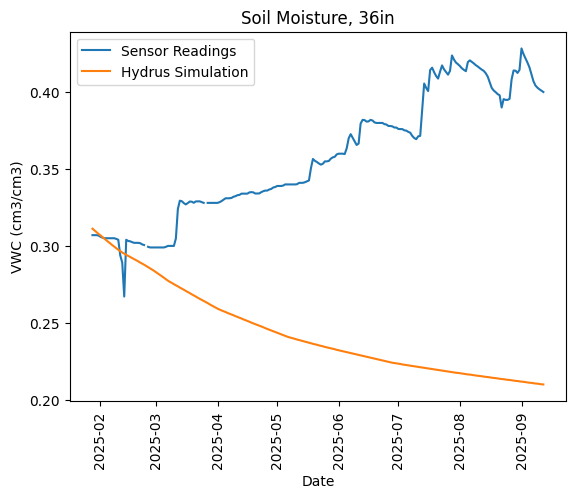

In [39]:
# plot observed and simulated results at observation node

plt.figure()
plt.plot(np1["Date"], np1["NP.LYS1_6"], label='Sensor Readings')
plt.plot(np1["Date"], hydrus_output, label='Hydrus Simulation')
plt.xlabel("Date")
plt.ylabel("VWC (cm3/cm3)")
plt.title("Soil Moisture, 36in")
plt.xticks(rotation= 90)
plt.legend()
plt.show()


## Now back to Calibration!

### Sensitivity Analysis (not working right now)

In [ ]:
param_names = ["thetar","thetas","alpha","n","ksat","l"]

In [ ]:
class MscuaSetupSA:
    # Define parameters here (before __init__) as variables
    # These are the parameters specific to your model and will need to be defined for each MscuaSetup class

    # Will need different variables for each layer, too (thetar_1, thetar_2, etc)
    
    # parse these within the run_hyrdus function, turn into df 
    thetar = spotpy.parameter.Uniform(low=0.05, high=0.1)
    thetas = spotpy.parameter.Uniform(low=0.35, high=0.5)
    alpha = spotpy.parameter.Uniform(low=0.005, high=0.04)
    n = spotpy.parameter.Uniform(low=1.1, high=2.0)
    l = spotpy.parameter.Uniform(low=0.5, high=0.5)
    ksat = spotpy.parameter.Uniform(low=5.0, high=500)

    def __init__(self, objective_funcs, dbase: Optional[Union[str, Path, MultiDimDb]] = None):
        # define the multidimensional parameter space here
        # use identical names as you did above for your spotpy parameter definitions (the variable assignment name)
        # if using spatial data this would be the number of features you are calibrating
        self.parameter_dimension = {
            "thetar": 1, 
            "thetas": 1, 
            "alpha": 1, 
            "n": 1, 
            "l": 1, 
            "ksat": 1
        }
        # This customizes the dimension name that is carried through the database, here I used "curve" but this could be
        #   feature, model, field, HRU, whatever descriptive name the parameter is attached to.
        self.param_dim_names = {
            "thetar": 'field', 
            "thetas": 'field', 
            "alpha": 'field', 
            "n": 'field', 
            "l": 'field', 
            "ksat": 'field'
        }
        # These attributes may be specific to your model setup, in-data might be a file path to an input file for instance
        #   and observation data may come from another file.
        self.observation_data = np.array(fcp1.drop(columns=["Date"]))

        # This can be left alone, this just ensures multiple objective functions can be passed during setup or treated as an iterable
        if isinstance(objective_funcs, list):
            self.objfuncs = objective_funcs
        else:
            self.objfuncs = [objective_funcs]
    
    # This method must be in the setup class, it is called during calibration to run the model, its only input should be a set
    #   of parameters. This could be an ordered list, tuple, however you want to set it up. I used a dictionary because it maintains
    #   reference to the parameter name and then you don't have to worry about order. This returns model output...for more complex model
    #   setups you might have a lot of code here to ingest parameters, change the parameters in the model files, and process the model outputs
    #   so that they can be returned as a Python object.
    def simulation(self, params):
        # may need to be changed so that I'm not passing random global variables.
        params_df = pd.DataFrame(params)
        params_array = []
        for row in range(len(params_df)):
            df = params_df.iloc[row, : ]
            params_array.append(list(df))
        modout = run_hydrus(vgs=params_array)

        # If run failed, return empty array with same shape as self.observation_data
        if modout.shape != np.array(fcp1.drop(columns=["Date"])).shape:
            modout = np.full((np.array(fcp1.drop(columns=["Date"])).shape), np.nan)
        return modout
        
    # This is a required method. It can be more complex if needed but it doesn't really need any arguments, it just needs to
    #   return the observation data to compare with the modeled data.
    def evaluation(self):
        return self.observation_data

    # This must return a dictionary where the keys are the objective function names
    # This is set up to calculate an entire 3D array of simulation results - dimensions (model reps, model vals, # models)
    # This can be customized to whatever you need for your model, the multidimensional objective functions included above can be manipulated by
    #   passing the axis argument (calculated objective function on a particular axis or for the entire array) they also include an option to return a
    #   dictionary with the objective function name (default is to just return numpy array), this dictionary is necessary for tracking results
    #   through the algorithm for each objective function.
    def objectivefunction(self, observation, simulation):
        print(observation.shape, simulation.shape)
        results = {}
        for o in tqdm.tqdm(self.objfuncs, desc="Calculating Objective Functions", leave=False):
            r = o(observation=observation, simulation=simulation, return_dict=True)
        
        return results

In [ ]:
# SAsetup = MscuaSetupSA([nrmse_md, rmse_md, pbias_md, nse_md])
SAsetup = MscuaSetupSA([nse_md])

In [ ]:
sa = SensitivityAnalysis(SAsetup)

In [ ]:
sa.sample() 

In [ ]:
sa.results

In [ ]:
print(sa.results.nse.values.shape)

## Since all of these results are insensitive to changing aw, this is the value associated with the "initial guess"
sa.results.nse.values[0].mean(axis=0)
# Try an initial threshold of 220?


In [ ]:
sa.plot_obj_func('nse', 0)

In [ ]:
sa.plot_sensitivity_index(0)

In [ ]:
for par in param_names:
    sa.plot_sensitivity_distribution(par)

# # one parameter
# sa.plot_sensitivity_distribution('ndvi_beta')

### Calibration Iteration 1

Now we define the Setup Class for the calibration algorithm. This is the key ingredient for the MSCUA multidimensional algorithm. The Setup Class is the custom class that links your model to the database, and the relevant algorithm methods. The structure can remain the same but most things will need to be tailored to your model.

In [99]:
class MscuaSetupIter1:
    # Define parameters here (before __init__) as variables
    # These are the parameters specific to your model and will need to be defined for each MscuaSetup class

    # Will need different variables for each layer, too (thetar_1, thetar_2, etc)
    
    # parse these within the run_hyrdus function, turn into df 
    thetar = spotpy.parameter.Uniform(low=0.05, high=0.1)
    thetas = spotpy.parameter.Uniform(low=0.35, high=0.5)
    alpha = spotpy.parameter.Uniform(low=0.005, high=0.04)
    n = spotpy.parameter.Uniform(low=1.1, high=2.0)
    l = spotpy.parameter.Uniform(low=0.5, high=0.5)
    ksat = spotpy.parameter.Uniform(low=5.0, high=500)

    def __init__(self, objective_funcs, dbase: Optional[Union[str, Path, MultiDimDb]] = None):
        # define the multidimensional parameter space here
        # use identical names as you did above for your spotpy parameter definitions (the variable assignment name)
        # if using spatial data this would be the number of features you are calibrating
        self.parameter_dimension = {
            "thetar": 1, 
            "thetas": 1, 
            "alpha": 1, 
            "n": 1, 
            "l": 1, 
            "ksat": 1
        }
        # This customizes the dimension name that is carried through the database, here I used "curve" but this could be
        #   feature, model, field, HRU, whatever descriptive name the parameter is attached to.
        self.param_dim_names = {
            "thetar": 'field', 
            "thetas": 'field', 
            "alpha": 'field', 
            "n": 'field', 
            "l": 'field', 
            "ksat": 'field'
        }
        # These attributes may be specific to your model setup, in-data might be a file path to an input file for instance
        #   and observation data may come from another file.
        self.observation_data = np.array(np1.drop(columns=["Date"]))

        # This can be left alone, this just ensures multiple objective functions can be passed during setup or treated as an iterable
        if isinstance(objective_funcs, list):
            self.objfuncs = objective_funcs
        else:
            self.objfuncs = [objective_funcs]
    
    # This method must be in the setup class, it is called during calibration to run the model, its only input should be a set
    #   of parameters. This could be an ordered list, tuple, however you want to set it up. I used a dictionary because it maintains
    #   reference to the parameter name and then you don't have to worry about order. This returns model output...for more complex model
    #   setups you might have a lot of code here to ingest parameters, change the parameters in the model files, and process the model outputs
    #   so that they can be returned as a Python object.
    def simulation(self, params):
        # may need to be changed so that I'm not passing random global variables.
        params_df = pd.DataFrame(params)
        params_array = []
        for row in range(len(params_df)):
            df = params_df.iloc[row, : ]
            params_array.append(list(df))
        modout = run_hydrus(vgs=params_array)

        return modout
        
    # This is a required method. It can be more complex if needed but it doesn't really need any arguments, it just needs to
    #   return the observation data to compare with the modeled data.
    def evaluation(self):
        return self.observation_data

    # This must return a dictionary where the keys are the objective function names
    # This is set up to calculate an entire 3D array of simulation results - dimensions (model reps, model vals, # models)
    # This can be customized to whatever you need for your model, the multidimensional objective functions included above can be manipulated by
    #   passing the axis argument (calculated objective function on a particular axis or for the entire array) they also include an option to return a
    #   dictionary with the objective function name (default is to just return numpy array), this dictionary is necessary for tracking results
    #   through the algorithm for each objective function.
    def objectivefunction(self, observation, simulation):
        print(observation.shape, simulation.shape)
        results = {}
        for o in tqdm.tqdm(self.objfuncs, desc="Calculating Objective Functions", leave=False):
            r = o(observation=observation, simulation=simulation, return_dict=True, axis=1)
            results.update(r)
        
        return results

And initialize the setup class with the normalized root mean square error objective function.

In [100]:
setup = MscuaSetupIter1([nse_md])

In [101]:
plist = build_parameter_list(setup, setup.parameter_dimension, setup.param_dim_names)

In [102]:
[p() for p in plist]

[0.07161180240073343,
 0.40211155178797675,
 0.024168466143603975,
 1.66633203517473,
 0.5,
 422.7491341704503]

Now we will initialize a new MsCua Sampler.

In [103]:
sampler = MsCua(setup)

In Memory database initialized...


Now we will run the ```.sample()``` method which will sample the parameters space based on the reps argument, run the model, calculate objective function values, and filter parameter distributions based on the provided thresholds. The ```.sample()``` method will return index arrays if certain threshold requirements are not met. While most of the work writes directly to the database, I assign the output "results" variable to capture any failed iterations. This can be used later to filter those problem indexes out.

In [104]:
results = sampler.sample(1000, {'nse': -0.05}, use_distribution=False)

Sampling 1000 repetitions of the thetar parameter...


Sampling 1000 repetitions of the thetas parameter...


Sampling 1000 repetitions of the alpha parameter...


Sampling 1000 repetitions of the n parameter...


Sampling 1000 repetitions of the l parameter...


Sampling 1000 repetitions of the ksat parameter...


Running model for 1000 repetitions in database...


simulation:   0%|          | 0/1000 [00:00<?, ?it/s]C:\Users\x63d979\AppData\Local\Temp\ipykernel_15192\248076565.py:28: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.019002866' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  allatm.loc[i, 'PotenitalEvap'] = allatm.loc[i,'ET_cm']
C:\Users\x63d979\AppData\Local\Temp\ipykernel_15192\248076565.py:26: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.086936404' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  allatm.loc[i,'PotentialTransp'] = allatm.loc[i, 'ET_cm']
INFO: Directory c:\Users\x63d979\Documents\HydrusCoding\Hydrus\MSCUA_GC-NP1_20260129_gj\3_Results\20260129140444710619 created
INFO: model.__init__(): Directory c:\Users\x63d979\Documents\HydrusCoding\Hydrus\MSCUA_GC-NP1_20260129_gj\3_R

vg_lists: [[0.0710633911120994, 0.4382817298511649, 0.01220149192437386, 1.8163098338053374, 0.5, 237.23597186694127]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4310
28    0.4310
29    0.4310
30    0.4310
31    0.4310
..       ...
250   0.4275
251   0.4275
252   0.4275
253   0.4275
254   0.4275

[228 rows x 1 columns]
vg_lists: [[0.07546258962034094, 0.44155013258191683, 0.020437991054388528, 1.6525392769981544, 0.5, 55.731145273128945]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4229
28    0.4229
29    0.4229
30    0.4229
31    0.4229
..       ...
250   0.4152
251   0.4152
252   0.4151
253   0.4151
254   0.4151

[228 rows x 1 columns]
vg_lists: [[0.05572339024708734, 0.49120688099486587, 0.005016898760384624, 1.140120741848006, 0.5, 147.0768525527289]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4861
28    0.4860
29    0.4859
30    0.4859
31    0.4858
..       ...
250   0.4812
251   0.4812
252   0.4812
253   0.4812
254   0.4812

[228 rows x 1 columns]
vg_lists: [[0.09342818225521143, 0.44682003650478075, 0.03390968533505176, 1.5051031143358258, 0.5, 238.6925818981989]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4121
28    0.4121
29    0.4121
30    0.4121
31    0.4121
..       ...
250   0.4121
251   0.4121
252   0.4121
253   0.4121
254   0.4121

[228 rows x 1 columns]
vg_lists: [[0.05016394439819214, 0.47617399283166995, 0.015471906226180478, 1.9093669035195968, 0.5, 425.2798609138014]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4642
28    0.4642
29    0.4642
30    0.4642
31    0.4642
..       ...
250   0.4642
251   0.4642
252   0.4642
253   0.4642
254   0.4642

[228 rows x 1 columns]
vg_lists: [[0.05496045411049481, 0.4080637096480032, 0.021985457268472137, 1.76942009316938, 0.5, 176.0231492543736]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3884
28    0.3884
29    0.3884
30    0.3884
31    0.3884
..       ...
250   0.3884
251   0.3884
252   0.3884
253   0.3884
254   0.3884

[228 rows x 1 columns]
vg_lists: [[0.09520535644130848, 0.35885353704545603, 0.03719233065453847, 1.987003017805712, 0.5, 130.90477984600435]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3254
28    0.3254
29    0.3254
30    0.3254
31    0.3254
..       ...
250   0.3254
251   0.3254
252   0.3254
253   0.3254
254   0.3254

[228 rows x 1 columns]
vg_lists: [[0.05195225467788774, 0.4508001714224382, 0.012955638366702847, 1.3507693026465297, 0.5, 204.9578926405298]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4402
28    0.4402
29    0.4402
30    0.4402
31    0.4402
..       ...
250   0.4402
251   0.4402
252   0.4402
253   0.4402
254   0.4402

[228 rows x 1 columns]
vg_lists: [[0.054816526545995684, 0.44504474152547485, 0.03215504166354288, 1.4175994051384198, 0.5, 136.04446735551784]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4116
28    0.4116
29    0.4116
30    0.4116
31    0.4116
..       ...
250   0.4116
251   0.4116
252   0.4116
253   0.4116
254   0.4116

[228 rows x 1 columns]
vg_lists: [[0.0966127271999008, 0.4814053849262333, 0.026471550332163328, 1.5825031975599932, 0.5, 64.08090025556461]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27     0.453
28     0.453
29     0.453
30     0.453
31     0.453
..       ...
250    0.453
251    0.453
252    0.453
253    0.453
254    0.453

[228 rows x 1 columns]
vg_lists: [[0.05537623228178569, 0.43988411297294305, 0.013617291976327783, 1.3636389782326184, 0.5, 162.42574121146527]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4289
28    0.4289
29    0.4289
30    0.4289
31    0.4289
..       ...
250   0.4284
251   0.4284
252   0.4284
253   0.4284
254   0.4284

[228 rows x 1 columns]
vg_lists: [[0.0944280063301713, 0.39412914543245836, 0.0375813857621601, 1.1684322902846336, 0.5, 425.22115414399786]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3768
28    0.3768
29    0.3768
30    0.3768
31    0.3768
..       ...
250   0.3768
251   0.3768
252   0.3768
253   0.3768
254   0.3768

[228 rows x 1 columns]
vg_lists: [[0.06136971936082926, 0.4412588111863679, 0.036600869524864105, 1.7954435156317792, 0.5, 219.3572722325174]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27     0.395
28     0.395
29     0.395
30     0.395
31     0.395
..       ...
250    0.395
251    0.395
252    0.395
253    0.395
254    0.395

[228 rows x 1 columns]
vg_lists: [[0.08287573230787879, 0.3657206147099606, 0.02560510546468723, 1.737428173222999, 0.5, 248.40626978700354]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3456
28    0.3456
29    0.3456
30    0.3456
31    0.3456
..       ...
250   0.3456
251   0.3456
252   0.3456
253   0.3456
254   0.3456

[228 rows x 1 columns]
vg_lists: [[0.08748225404635754, 0.4518624861336302, 0.010438997928977203, 1.796307710596576, 0.5, 94.4098238489818]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4395
28    0.4395
29    0.4395
30    0.4395
31    0.4394
..       ...
250   0.4331
251   0.4331
252   0.4331
253   0.4331
254   0.4331

[228 rows x 1 columns]
vg_lists: [[0.05997970441001591, 0.37169881153742795, 0.033153366578556775, 1.8780879332481666, 0.5, 298.3444901940528]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3388
28    0.3388
29    0.3388
30    0.3388
31    0.3388
..       ...
250   0.3388
251   0.3388
252   0.3388
253   0.3388
254   0.3388

[228 rows x 1 columns]
vg_lists: [[0.07982085668993678, 0.3593241812711079, 0.01807581370922235, 1.1154520624325186, 0.5, 336.7468351178974]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3533
28    0.3533
29    0.3533
30    0.3533
31    0.3533
..       ...
250   0.3533
251   0.3533
252   0.3533
253   0.3533
254   0.3533

[228 rows x 1 columns]
vg_lists: [[0.09481821652494571, 0.43548920018260984, 0.01637895224095686, 1.3268925355992753, 0.5, 371.35122595650154]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4236
28    0.4236
29    0.4236
30    0.4236
31    0.4236
..       ...
250   0.4236
251   0.4236
252   0.4236
253   0.4236
254   0.4236

[228 rows x 1 columns]
vg_lists: [[0.09860247119178486, 0.40997519397090404, 0.007585324539639821, 1.9019833295924207, 0.5, 119.60125131112149]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4010
28    0.4009
29    0.4008
30    0.4007
31    0.4006
..       ...
250   0.3958
251   0.3958
252   0.3957
253   0.3957
254   0.3957

[228 rows x 1 columns]
vg_lists: [[0.06952458785355395, 0.4130116925222578, 0.0293331597848589, 1.6666280614019082, 0.5, 403.8610302878922]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3832
28    0.3832
29    0.3832
30    0.3832
31    0.3832
..       ...
250   0.3832
251   0.3832
252   0.3832
253   0.3832
254   0.3832

[228 rows x 1 columns]
vg_lists: [[0.061925534653297865, 0.40222711564772035, 0.012930339439587064, 1.9479712850183255, 0.5, 462.4226498557533]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3956
28    0.3956
29    0.3956
30    0.3956
31    0.3956
..       ...
250   0.3956
251   0.3956
252   0.3956
253   0.3956
254   0.3956

[228 rows x 1 columns]
vg_lists: [[0.06034891429619419, 0.41620587617681765, 0.016931997069677487, 1.9422314532753024, 0.5, 167.55651801149534]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4047
28    0.4047
29    0.4047
30    0.4047
31    0.4047
..       ...
250   0.4045
251   0.4044
252   0.4044
253   0.4044
254   0.4044

[228 rows x 1 columns]
vg_lists: [[0.0686776760014898, 0.47841449427865246, 0.03457424423919547, 1.1236354061146696, 0.5, 240.93888203277584]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4612
28    0.4612
29    0.4612
30    0.4612
31    0.4612
..       ...
250   0.4612
251   0.4612
252   0.4612
253   0.4612
254   0.4612

[228 rows x 1 columns]
vg_lists: [[0.0836988303383715, 0.45033623583048854, 0.026616362816905565, 1.7009622476102597, 0.5, 303.89609548749644]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4227
28    0.4227
29    0.4227
30    0.4227
31    0.4227
..       ...
250   0.4227
251   0.4227
252   0.4227
253   0.4227
254   0.4227

[228 rows x 1 columns]
vg_lists: [[0.09264832506986312, 0.3676532521851477, 0.021112227644021066, 1.7193231452857363, 0.5, 89.14065587512928]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3531
28    0.3531
29    0.3531
30    0.3531
31    0.3531
..       ...
250   0.3526
251   0.3526
252   0.3526
253   0.3525
254   0.3525

[228 rows x 1 columns]
vg_lists: [[0.08797919743522335, 0.4031774661032679, 0.022349927967572264, 1.8692754994681509, 0.5, 252.235423926009]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3858
28    0.3858
29    0.3858
30    0.3858
31    0.3858
..       ...
250   0.3858
251   0.3858
252   0.3858
253   0.3858
254   0.3858

[228 rows x 1 columns]
vg_lists: [[0.06365598794654144, 0.4056283950290371, 0.035859304690940834, 1.8714223913692343, 0.5, 382.1674081427451]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3649
28    0.3649
29    0.3649
30    0.3649
31    0.3649
..       ...
250   0.3649
251   0.3649
252   0.3649
253   0.3649
254   0.3649

[228 rows x 1 columns]
vg_lists: [[0.07761156256057833, 0.4333226520370669, 0.020693041409824618, 1.3166605022908562, 0.5, 14.504259890766114]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4143
28    0.4141
29    0.4139
30    0.4136
31    0.4134
..       ...
250   0.3917
251   0.3917
252   0.3916
253   0.3916
254   0.3915

[228 rows x 1 columns]
vg_lists: [[0.05437342149225463, 0.37651934908243223, 0.022993618216777683, 1.9775538337362235, 0.5, 411.95170529861895]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3587
28    0.3587
29    0.3587
30    0.3587
31    0.3587
..       ...
250   0.3587
251   0.3587
252   0.3587
253   0.3587
254   0.3587

[228 rows x 1 columns]
vg_lists: [[0.06204614823432111, 0.4721084044064352, 0.013249595543720655, 1.4090656021147652, 0.5, 45.24731950802231]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4564
28    0.4562
29    0.4561
30    0.4559
31    0.4557
..       ...
250   0.4425
251   0.4424
252   0.4424
253   0.4424
254   0.4423

[228 rows x 1 columns]
vg_lists: [[0.05099672640983046, 0.3547186904397901, 0.015973381607346064, 1.9100267857121538, 0.5, 203.36601066055425]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3457
28    0.3457
29    0.3457
30    0.3457
31    0.3457
..       ...
250   0.3457
251   0.3457
252   0.3457
253   0.3457
254   0.3457

[228 rows x 1 columns]
vg_lists: [[0.07596454265208928, 0.46070551280417416, 0.02255998122922373, 1.3688839954515712, 0.5, 427.0742611159917]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4401
28    0.4401
29    0.4401
30    0.4401
31    0.4401
..       ...
250   0.4401
251   0.4401
252   0.4401
253   0.4401
254   0.4401

[228 rows x 1 columns]
vg_lists: [[0.08190030850917857, 0.3508325546147705, 0.012292552996314089, 1.4358032016612374, 0.5, 135.50294392913355]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3440
28    0.3440
29    0.3439
30    0.3439
31    0.3439
..       ...
250   0.3406
251   0.3406
252   0.3406
253   0.3405
254   0.3405

[228 rows x 1 columns]
vg_lists: [[0.0977251692695615, 0.4569848767351484, 0.01040133781551887, 1.6432130166197165, 0.5, 361.9695970798838]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4505
28    0.4505
29    0.4505
30    0.4505
31    0.4505
..       ...
250   0.4505
251   0.4505
252   0.4505
253   0.4505
254   0.4505

[228 rows x 1 columns]
vg_lists: [[0.0857463378259148, 0.43874462872247166, 0.012728326922938252, 1.1302645845188808, 0.5, 408.4021670319998]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27     0.433
28     0.433
29     0.433
30     0.433
31     0.433
..       ...
250    0.433
251    0.433
252    0.433
253    0.433
254    0.433

[228 rows x 1 columns]
vg_lists: [[0.08706630471041935, 0.368325829509527, 0.015011511613768645, 1.839402534928384, 0.5, 196.72432017859924]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3604
28    0.3604
29    0.3604
30    0.3604
31    0.3604
..       ...
250   0.3597
251   0.3597
252   0.3597
253   0.3596
254   0.3596

[228 rows x 1 columns]
vg_lists: [[0.07226919383545444, 0.4199772419296374, 0.03403559504211868, 1.7422413271322672, 0.5, 347.07771100176024]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3822
28    0.3822
29    0.3822
30    0.3822
31    0.3822
..       ...
250   0.3822
251   0.3822
252   0.3822
253   0.3822
254   0.3822

[228 rows x 1 columns]
vg_lists: [[0.09845525844829733, 0.4222395904560846, 0.03244786983568359, 1.2208489435356102, 0.5, 162.210260424306]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4025
28    0.4025
29    0.4025
30    0.4025
31    0.4025
..       ...
250   0.4025
251   0.4025
252   0.4025
253   0.4025
254   0.4025

[228 rows x 1 columns]
vg_lists: [[0.0574692737276226, 0.4332323406896397, 0.023577535069284956, 1.5954109759673925, 0.5, 376.805455825809]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4096
28    0.4096
29    0.4096
30    0.4096
31    0.4096
..       ...
250   0.4096
251   0.4096
252   0.4096
253   0.4096
254   0.4096

[228 rows x 1 columns]
vg_lists: [[0.06665472700922578, 0.46440754264526873, 0.03046775159329268, 1.9185669961459189, 0.5, 159.61158057168194]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4279
28    0.4279
29    0.4279
30    0.4279
31    0.4279
..       ...
250   0.4279
251   0.4279
252   0.4279
253   0.4279
254   0.4279

[228 rows x 1 columns]
vg_lists: [[0.07835800393960766, 0.49668451224578014, 0.026103067023497215, 1.234126442005612, 0.5, 89.4593646046069]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4755
28    0.4755
29    0.4755
30    0.4755
31    0.4755
..       ...
250   0.4755
251   0.4755
252   0.4755
253   0.4755
254   0.4755

[228 rows x 1 columns]
vg_lists: [[0.06643729282391211, 0.4620607648442433, 0.014934816043447995, 1.4381002497341957, 0.5, 369.87835533382577]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27     0.449
28     0.449
29     0.449
30     0.449
31     0.449
..       ...
250    0.449
251    0.449
252    0.449
253    0.449
254    0.449

[228 rows x 1 columns]
vg_lists: [[0.05039360430546183, 0.4798504718393425, 0.036875226304920156, 1.551379819534392, 0.5, 472.6474803211469]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4315
28    0.4315
29    0.4315
30    0.4315
31    0.4315
..       ...
250   0.4315
251   0.4315
252   0.4315
253   0.4315
254   0.4315

[228 rows x 1 columns]
vg_lists: [[0.09648643113071968, 0.38256347778786726, 0.03639985783670429, 1.5018225174900048, 0.5, 440.11338504877966]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27     0.352
28     0.352
29     0.352
30     0.352
31     0.352
..       ...
250    0.352
251    0.352
252    0.352
253    0.352
254    0.352

[228 rows x 1 columns]
vg_lists: [[0.07715799062188888, 0.4611479738467014, 0.008630091242197891, 1.6848699982466506, 0.5, 372.7511400218574]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4563
28    0.4563
29    0.4563
30    0.4563
31    0.4563
..       ...
250   0.4541
251   0.4541
252   0.4541
253   0.4541
254   0.4541

[228 rows x 1 columns]
vg_lists: [[0.09747415615784066, 0.3719663639728581, 0.027162191727282962, 1.6006301549210376, 0.5, 421.98512031838544]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3509
28    0.3509
29    0.3509
30    0.3509
31    0.3509
..       ...
250   0.3509
251   0.3509
252   0.3509
253   0.3509
254   0.3509

[228 rows x 1 columns]
vg_lists: [[0.09492864042639466, 0.49060673195982096, 0.029587626233418835, 1.7530606053673052, 0.5, 98.19736359617423]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4556
28    0.4556
29    0.4556
30    0.4556
31    0.4556
..       ...
250   0.4556
251   0.4556
252   0.4556
253   0.4556
254   0.4556

[228 rows x 1 columns]
vg_lists: [[0.060807291080109176, 0.45307745965123336, 0.028977380906147678, 1.4497207855941832, 0.5, 464.67184251494297]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4225
28    0.4225
29    0.4225
30    0.4225
31    0.4225
..       ...
250   0.4225
251   0.4225
252   0.4225
253   0.4225
254   0.4225

[228 rows x 1 columns]
vg_lists: [[0.056149347143606074, 0.42783974900962407, 0.026814238647023998, 1.302548720620059, 0.5, 491.13958345542954]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4055
28    0.4055
29    0.4055
30    0.4055
31    0.4055
..       ...
250   0.4055
251   0.4055
252   0.4055
253   0.4055
254   0.4055

[228 rows x 1 columns]
vg_lists: [[0.06927077622999445, 0.43525365173342784, 0.02404693360878993, 1.8477747070579316, 0.5, 59.64668123020685]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4122
28    0.4122
29    0.4122
30    0.4122
31    0.4122
..       ...
250   0.4064
251   0.4063
252   0.4062
253   0.4061
254   0.4061

[228 rows x 1 columns]
vg_lists: [[0.07343200930182862, 0.4032906380353608, 0.029252566786647432, 1.2786672695903136, 0.5, 16.88509472010547]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3824
28    0.3824
29    0.3824
30    0.3824
31    0.3824
..       ...
250   0.3693
251   0.3693
252   0.3692
253   0.3692
254   0.3692

[228 rows x 1 columns]
vg_lists: [[0.08357490654748806, 0.44231784754946246, 0.009671905188147971, 1.1458965642188077, 0.5, 364.19291261388463]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4376
28    0.4376
29    0.4376
30    0.4376
31    0.4376
..       ...
250   0.4376
251   0.4376
252   0.4376
253   0.4376
254   0.4376

[228 rows x 1 columns]
vg_lists: [[0.06838457117229041, 0.3767181588199035, 0.03336501503092785, 1.70814287178472, 0.5, 132.76756686478936]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3444
28    0.3444
29    0.3444
30    0.3444
31    0.3444
..       ...
250   0.3444
251   0.3444
252   0.3444
253   0.3444
254   0.3444

[228 rows x 1 columns]
vg_lists: [[0.09168843503974276, 0.4930740226811725, 0.0209696261808718, 1.9336068813775302, 0.5, 106.14748797251163]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4739
28    0.4739
29    0.4739
30    0.4739
31    0.4739
..       ...
250   0.4738
251   0.4738
252   0.4738
253   0.4738
254   0.4738

[228 rows x 1 columns]
vg_lists: [[0.09866725766865844, 0.4164314311356814, 0.00647854905819896, 1.114972199197627, 0.5, 232.0457258686152]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4134
28    0.4134
29    0.4134
30    0.4134
31    0.4133
..       ...
250   0.4111
251   0.4111
252   0.4111
253   0.4111
254   0.4111

[228 rows x 1 columns]
vg_lists: [[0.08414647766026043, 0.3742352534369908, 0.033563442059663225, 1.4201916256355738, 0.5, 356.3799592138009]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27     0.348
28     0.348
29     0.348
30     0.348
31     0.348
..       ...
250    0.348
251    0.348
252    0.348
253    0.348
254    0.348

[228 rows x 1 columns]
vg_lists: [[0.059478939417501535, 0.42534315095146646, 0.039566677843620064, 1.6103514909518273, 0.5, 342.85781143611064]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3788
28    0.3788
29    0.3788
30    0.3788
31    0.3788
..       ...
250   0.3788
251   0.3788
252   0.3788
253   0.3788
254   0.3788

[228 rows x 1 columns]
vg_lists: [[0.08534935775604066, 0.4057235857381202, 0.023897541110500017, 1.6246839898181589, 0.5, 48.92013344580876]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3851
28    0.3851
29    0.3851
30    0.3851
31    0.3851
..       ...
250   0.3775
251   0.3775
252   0.3775
253   0.3775
254   0.3775

[228 rows x 1 columns]
vg_lists: [[0.08884809250025186, 0.37334134648109624, 0.016671043820055104, 1.888316826556389, 0.5, 442.823306853133]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3641
28    0.3641
29    0.3641
30    0.3641
31    0.3641
..       ...
250   0.3641
251   0.3641
252   0.3641
253   0.3641
254   0.3641

[228 rows x 1 columns]
vg_lists: [[0.0596065619919087, 0.48124952812948396, 0.02842432937027769, 1.645166268794272, 0.5, 410.28183892038993]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4464
28    0.4464
29    0.4464
30    0.4464
31    0.4464
..       ...
250   0.4464
251   0.4464
252   0.4464
253   0.4464
254   0.4464

[228 rows x 1 columns]
vg_lists: [[0.07758538366654177, 0.43745473316527617, 0.024391415631822136, 1.4161280321652245, 0.5, 80.99033249041415]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4153
28    0.4153
29    0.4153
30    0.4153
31    0.4153
..       ...
250   0.4153
251   0.4153
252   0.4153
253   0.4153
254   0.4153

[228 rows x 1 columns]
vg_lists: [[0.07366080634168282, 0.4579149473758092, 0.005541052740679519, 1.9756508218553388, 0.5, 118.31633642113242]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4461
28    0.4459
29    0.4457
30    0.4456
31    0.4455
..       ...
250   0.4381
251   0.4381
252   0.4381
253   0.4381
254   0.4381

[228 rows x 1 columns]
vg_lists: [[0.062265835368147476, 0.45952152645599764, 0.03746399540908071, 1.2663311968306157, 0.5, 111.8936186002641]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27     0.428
28     0.428
29     0.428
30     0.428
31     0.428
..       ...
250    0.428
251    0.428
252    0.428
253    0.428
254    0.428

[228 rows x 1 columns]
vg_lists: [[0.08107385834492502, 0.379191035034064, 0.037815276339314044, 1.5264670801797646, 0.5, 394.0672455767744]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3452
28    0.3452
29    0.3452
30    0.3452
31    0.3452
..       ...
250   0.3452
251   0.3452
252   0.3452
253   0.3452
254   0.3452

[228 rows x 1 columns]
vg_lists: [[0.05009658102916664, 0.49812715161844856, 0.005273227903944448, 1.4002883322097275, 0.5, 296.3655597930515]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4924
28    0.4923
29    0.4922
30    0.4922
31    0.4921
..       ...
250   0.4890
251   0.4890
252   0.4890
253   0.4890
254   0.4890

[228 rows x 1 columns]
vg_lists: [[0.07258679862981884, 0.4946948853280094, 0.036447915570260586, 1.4026570587650888, 0.5, 207.82571625287446]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4536
28    0.4536
29    0.4536
30    0.4536
31    0.4536
..       ...
250   0.4536
251   0.4536
252   0.4536
253   0.4536
254   0.4536

[228 rows x 1 columns]
vg_lists: [[0.05943160957947062, 0.3515511920332074, 0.016097076580838345, 1.572743766494072, 0.5, 400.75759992738267]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3409
28    0.3409
29    0.3409
30    0.3409
31    0.3409
..       ...
250   0.3409
251   0.3409
252   0.3409
253   0.3409
254   0.3409

[228 rows x 1 columns]
vg_lists: [[0.05400109065529493, 0.38774013070267294, 0.009489812201950783, 1.5993615103498282, 0.5, 153.599297320809]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3801
28    0.3801
29    0.3800
30    0.3800
31    0.3800
..       ...
250   0.3761
251   0.3761
252   0.3761
253   0.3761
254   0.3760

[228 rows x 1 columns]
vg_lists: [[0.09626926553007217, 0.47812925573633935, 0.012816606967698901, 1.4473936510849112, 0.5, 147.96483866287687]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4679
28    0.4679
29    0.4679
30    0.4679
31    0.4679
..       ...
250   0.4643
251   0.4643
252   0.4643
253   0.4643
254   0.4643

[228 rows x 1 columns]
vg_lists: [[0.08850207590794043, 0.36096114941556123, 0.006816893289091596, 1.6284820410980325, 0.5, 305.0212314047828]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3570
28    0.3569
29    0.3569
30    0.3568
31    0.3567
..       ...
250   0.3551
251   0.3551
252   0.3551
253   0.3551
254   0.3551

[228 rows x 1 columns]
vg_lists: [[0.08786936613935338, 0.40613061722119287, 0.010529733605960203, 1.890784289852975, 0.5, 475.9192171014195]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4016
28    0.4016
29    0.4016
30    0.4016
31    0.4016
..       ...
250   0.4016
251   0.4016
252   0.4016
253   0.4016
254   0.4016

[228 rows x 1 columns]
vg_lists: [[0.06746390009210662, 0.47736746981795364, 0.023783743073501496, 1.4623018914421022, 0.5, 102.54883385253096]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4522
28    0.4522
29    0.4522
30    0.4522
31    0.4522
..       ...
250   0.4522
251   0.4522
252   0.4522
253   0.4522
254   0.4522

[228 rows x 1 columns]
vg_lists: [[0.08518246201470242, 0.35456026802666174, 0.01418749558484421, 1.651499354412994, 0.5, 387.4484831709753]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3467
28    0.3467
29    0.3467
30    0.3467
31    0.3467
..       ...
250   0.3467
251   0.3467
252   0.3467
253   0.3467
254   0.3467

[228 rows x 1 columns]
vg_lists: [[0.07684899211968074, 0.359519780235188, 0.015827935832051915, 1.4658476511967253, 0.5, 289.52445210338334]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3494
28    0.3494
29    0.3494
30    0.3494
31    0.3494
..       ...
250   0.3494
251   0.3494
252   0.3494
253   0.3494
254   0.3494

[228 rows x 1 columns]
vg_lists: [[0.09393795256096704, 0.36580196581461655, 0.03661959953542712, 1.2444456833523725, 0.5, 275.83683231307174]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3458
28    0.3458
29    0.3458
30    0.3458
31    0.3458
..       ...
250   0.3458
251   0.3458
252   0.3458
253   0.3458
254   0.3458

[228 rows x 1 columns]
vg_lists: [[0.05323919791111521, 0.46090029557369205, 0.03529730456842267, 1.7613050388665688, 0.5, 282.48530762227796]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4141
28    0.4141
29    0.4141
30    0.4141
31    0.4141
..       ...
250   0.4141
251   0.4141
252   0.4141
253   0.4141
254   0.4141

[228 rows x 1 columns]
vg_lists: [[0.09170831664348064, 0.46474897868140963, 0.010108357997070157, 1.43201886570046, 0.5, 327.21020466709695]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4575
28    0.4575
29    0.4575
30    0.4575
31    0.4575
..       ...
250   0.4575
251   0.4575
252   0.4575
253   0.4575
254   0.4575

[228 rows x 1 columns]
vg_lists: [[0.057635088833377306, 0.3604883253851989, 0.014766173428774353, 1.2852948399290018, 0.5, 184.9286184296391]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3516
28    0.3516
29    0.3516
30    0.3516
31    0.3516
..       ...
250   0.3516
251   0.3516
252   0.3516
253   0.3516
254   0.3516

[228 rows x 1 columns]
vg_lists: [[0.06630000105753195, 0.38752251853414654, 0.020173899278383388, 1.4257682524669395, 0.5, 302.50656925410084]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3719
28    0.3719
29    0.3719
30    0.3719
31    0.3719
..       ...
250   0.3719
251   0.3719
252   0.3719
253   0.3719
254   0.3719

[228 rows x 1 columns]
vg_lists: [[0.05374588253689075, 0.45362812182567974, 0.028150949443071047, 1.8884848490975785, 0.5, 43.478885896089714]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4213
28    0.4213
29    0.4213
30    0.4213
31    0.4213
..       ...
250   0.4177
251   0.4176
252   0.4176
253   0.4175
254   0.4174

[228 rows x 1 columns]
vg_lists: [[0.05395226618703566, 0.40635160574307544, 0.030601180746146074, 1.1463862711683366, 0.5, 290.49598528577894]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3912
28    0.3912
29    0.3912
30    0.3912
31    0.3912
..       ...
250   0.3912
251   0.3912
252   0.3912
253   0.3912
254   0.3912

[228 rows x 1 columns]
vg_lists: [[0.06520721744284942, 0.4778699794292498, 0.020565347877176513, 1.4423572349804146, 0.5, 391.7923697990719]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4571
28    0.4571
29    0.4571
30    0.4571
31    0.4571
..       ...
250   0.4571
251   0.4571
252   0.4571
253   0.4571
254   0.4571

[228 rows x 1 columns]
vg_lists: [[0.06646590180749884, 0.3737450873504913, 0.023661896526335564, 1.4908784178126735, 0.5, 301.98441018396346]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3548
28    0.3548
29    0.3548
30    0.3548
31    0.3548
..       ...
250   0.3548
251   0.3548
252   0.3548
253   0.3548
254   0.3548

[228 rows x 1 columns]
vg_lists: [[0.09876927184984653, 0.4619810566808167, 0.026916448848600293, 1.8739379527887696, 0.5, 84.475589832225]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4346
28    0.4346
29    0.4346
30    0.4346
31    0.4346
..       ...
250   0.4346
251   0.4346
252   0.4346
253   0.4346
254   0.4346

[228 rows x 1 columns]
vg_lists: [[0.09959696504872881, 0.4773274905121935, 0.01241966187540577, 1.9193823661217202, 0.5, 432.86277536266584]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4703
28    0.4703
29    0.4703
30    0.4703
31    0.4703
..       ...
250   0.4703
251   0.4703
252   0.4703
253   0.4703
254   0.4703

[228 rows x 1 columns]
vg_lists: [[0.09973817224943088, 0.3571785130971692, 0.03003508261184541, 1.5616410629101027, 0.5, 171.59962571775208]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3348
28    0.3348
29    0.3348
30    0.3348
31    0.3348
..       ...
250   0.3348
251   0.3348
252   0.3348
253   0.3348
254   0.3348

[228 rows x 1 columns]
vg_lists: [[0.08902594992052407, 0.3650481162175563, 0.024713833979228415, 1.6789876159742, 0.5, 322.0078565395293]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3464
28    0.3464
29    0.3464
30    0.3464
31    0.3464
..       ...
250   0.3464
251   0.3464
252   0.3464
253   0.3464
254   0.3464

[228 rows x 1 columns]
vg_lists: [[0.08457081898779156, 0.48603237032346913, 0.030553562158825726, 1.7054844424340134, 0.5, 141.91318037965266]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4489
28    0.4489
29    0.4489
30    0.4489
31    0.4489
..       ...
250   0.4489
251   0.4489
252   0.4489
253   0.4489
254   0.4489

[228 rows x 1 columns]
vg_lists: [[0.05512868611282048, 0.4497443239668573, 0.035942227942493535, 1.5906825154855624, 0.5, 219.07968311596306]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4058
28    0.4058
29    0.4058
30    0.4058
31    0.4058
..       ...
250   0.4058
251   0.4058
252   0.4058
253   0.4058
254   0.4058

[228 rows x 1 columns]
vg_lists: [[0.08402863967683569, 0.4897641728938886, 0.03265515888695427, 1.2140744096761333, 0.5, 149.02820679585616]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4654
28    0.4654
29    0.4654
30    0.4654
31    0.4654
..       ...
250   0.4654
251   0.4654
252   0.4654
253   0.4654
254   0.4654

[228 rows x 1 columns]
vg_lists: [[0.0589202137433612, 0.3517035236895053, 0.021023969674936284, 1.434391180510345, 0.5, 348.7888372057925]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3366
28    0.3366
29    0.3366
30    0.3366
31    0.3366
..       ...
250   0.3366
251   0.3366
252   0.3366
253   0.3366
254   0.3366

[228 rows x 1 columns]
vg_lists: [[0.07012857704599183, 0.41761723329379613, 0.039430621077881166, 1.20236722449088, 0.5, 298.89694178280445]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3936
28    0.3936
29    0.3936
30    0.3936
31    0.3936
..       ...
250   0.3936
251   0.3936
252   0.3936
253   0.3936
254   0.3936

[228 rows x 1 columns]
vg_lists: [[0.08121011674195505, 0.49601636423179424, 0.012989469590744221, 1.9209861336219287, 0.5, 493.3826930876432]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4877
28    0.4877
29    0.4877
30    0.4877
31    0.4877
..       ...
250   0.4877
251   0.4877
252   0.4877
253   0.4877
254   0.4877

[228 rows x 1 columns]
vg_lists: [[0.07665294448198479, 0.3787365892205559, 0.030937053680499798, 1.5607836959330714, 0.5, 105.24972667168183]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3514
28    0.3514
29    0.3514
30    0.3514
31    0.3514
..       ...
250   0.3514
251   0.3514
252   0.3514
253   0.3514
254   0.3514

[228 rows x 1 columns]
vg_lists: [[0.0818417758608352, 0.4364481376592789, 0.012882876643792132, 1.7660315012670376, 0.5, 481.6294622613657]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4283
28    0.4283
29    0.4283
30    0.4283
31    0.4283
..       ...
250   0.4283
251   0.4283
252   0.4283
253   0.4283
254   0.4283

[228 rows x 1 columns]
vg_lists: [[0.07305490369758288, 0.3968986329270515, 0.03277311243280923, 1.5948417322182304, 0.5, 247.68889840546356]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3649
28    0.3649
29    0.3649
30    0.3649
31    0.3649
..       ...
250   0.3649
251   0.3649
252   0.3649
253   0.3649
254   0.3649

[228 rows x 1 columns]
vg_lists: [[0.05226258988432622, 0.3635303476060587, 0.017003137498429296, 1.2015844914381641, 0.5, 405.8409489903465]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3544
28    0.3544
29    0.3544
30    0.3544
31    0.3544
..       ...
250   0.3544
251   0.3544
252   0.3544
253   0.3544
254   0.3544

[228 rows x 1 columns]
vg_lists: [[0.07407958310219416, 0.3550106259681762, 0.03792868636773249, 1.970296293227834, 0.5, 357.4293422706743]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3183
28    0.3183
29    0.3183
30    0.3183
31    0.3183
..       ...
250   0.3183
251   0.3183
252   0.3183
253   0.3183
254   0.3183

[228 rows x 1 columns]
vg_lists: [[0.05841145945940845, 0.41266976367628144, 0.009325755071093634, 1.5521210178347746, 0.5, 77.02052335444102]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4007
28    0.4006
29    0.4005
30    0.4004
31    0.4002
..       ...
250   0.3908
251   0.3908
252   0.3907
253   0.3907
254   0.3907

[228 rows x 1 columns]
vg_lists: [[0.07362124170922318, 0.48024414259013315, 0.038009936092477076, 1.9921356998005753, 0.5, 49.7562149430434]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4269
28    0.4269
29    0.4269
30    0.4269
31    0.4269
..       ...
250   0.4269
251   0.4269
252   0.4269
253   0.4269
254   0.4269

[228 rows x 1 columns]
vg_lists: [[0.09753351910283924, 0.461226018915563, 0.020055007512397815, 1.735442660778752, 0.5, 91.77009234700608]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4436
28    0.4436
29    0.4436
30    0.4436
31    0.4436
..       ...
250   0.4424
251   0.4424
252   0.4423
253   0.4423
254   0.4423

[228 rows x 1 columns]
vg_lists: [[0.06278474673572612, 0.4527986101806902, 0.006842798056349804, 1.1818318304682047, 0.5, 330.89175915538266]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4489
28    0.4489
29    0.4489
30    0.4488
31    0.4488
..       ...
250   0.4468
251   0.4467
252   0.4467
253   0.4467
254   0.4467

[228 rows x 1 columns]
vg_lists: [[0.06908288042269303, 0.4322485904179153, 0.010389094042867572, 1.5173893214840526, 0.5, 497.1571079958957]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4252
28    0.4252
29    0.4252
30    0.4252
31    0.4252
..       ...
250   0.4252
251   0.4252
252   0.4252
253   0.4252
254   0.4252

[228 rows x 1 columns]
vg_lists: [[0.07774744011015389, 0.40064373904560113, 0.012593000758572042, 1.1274238189432924, 0.5, 77.73815576710469]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3951
28    0.3951
29    0.3950
30    0.3950
31    0.3949
..       ...
250   0.3901
251   0.3901
252   0.3900
253   0.3900
254   0.3900

[228 rows x 1 columns]
vg_lists: [[0.06738419019444886, 0.41862367584766946, 0.03113435078926011, 1.6237922654350365, 0.5, 193.4076368610881]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3858
28    0.3858
29    0.3858
30    0.3858
31    0.3858
..       ...
250   0.3858
251   0.3858
252   0.3858
253   0.3858
254   0.3858

[228 rows x 1 columns]
vg_lists: [[0.09668668592323842, 0.3510609037193393, 0.029901207046462104, 1.280304370620902, 0.5, 249.68457342402283]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3346
28    0.3346
29    0.3346
30    0.3346
31    0.3346
..       ...
250   0.3346
251   0.3346
252   0.3346
253   0.3346
254   0.3346

[228 rows x 1 columns]
vg_lists: [[0.08282913659611263, 0.3633455053267105, 0.016847953275616806, 1.1472981174454997, 0.5, 123.07913289075782]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3567
28    0.3567
29    0.3567
30    0.3567
31    0.3567
..       ...
250   0.3551
251   0.3551
252   0.3551
253   0.3551
254   0.3551

[228 rows x 1 columns]
vg_lists: [[0.05823412865990657, 0.44784871441564655, 0.007833080479457872, 1.5195388329599908, 0.5, 265.03371915442216]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4418
28    0.4417
29    0.4416
30    0.4415
31    0.4414
..       ...
250   0.4381
251   0.4381
252   0.4381
253   0.4381
254   0.4381

[228 rows x 1 columns]
vg_lists: [[0.08764598789353371, 0.37030178806173497, 0.0342687956742349, 1.7351733535313771, 0.5, 451.8950287765749]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3393
28    0.3393
29    0.3393
30    0.3393
31    0.3393
..       ...
250   0.3393
251   0.3393
252   0.3393
253   0.3393
254   0.3393

[228 rows x 1 columns]
vg_lists: [[0.0724815349934297, 0.4801802013739154, 0.009796337429934274, 1.9684592024387857, 0.5, 309.4546315253752]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4734
28    0.4733
29    0.4733
30    0.4733
31    0.4732
..       ...
250   0.4702
251   0.4702
252   0.4702
253   0.4702
254   0.4701

[228 rows x 1 columns]
vg_lists: [[0.06352933939677277, 0.36773866804524014, 0.034526591056139595, 1.4098516110307158, 0.5, 480.8381883713732]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3397
28    0.3397
29    0.3397
30    0.3397
31    0.3397
..       ...
250   0.3397
251   0.3397
252   0.3397
253   0.3397
254   0.3397

[228 rows x 1 columns]
vg_lists: [[0.07998372472549545, 0.38209842856529636, 0.02489086632325727, 1.304740404316813, 0.5, 420.75398079197345]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3654
28    0.3654
29    0.3654
30    0.3654
31    0.3654
..       ...
250   0.3654
251   0.3654
252   0.3654
253   0.3654
254   0.3654

[228 rows x 1 columns]
vg_lists: [[0.056729723204316865, 0.4117920529801072, 0.03524646402906871, 1.5592405592530831, 0.5, 442.4037023626871]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3739
28    0.3739
29    0.3739
30    0.3739
31    0.3739
..       ...
250   0.3739
251   0.3739
252   0.3739
253   0.3739
254   0.3739

[228 rows x 1 columns]
vg_lists: [[0.06509675875744494, 0.36555706620944006, 0.009064238857814107, 1.3435224959341285, 0.5, 287.1709686037044]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3605
28    0.3605
29    0.3605
30    0.3605
31    0.3605
..       ...
250   0.3588
251   0.3588
252   0.3588
253   0.3588
254   0.3588

[228 rows x 1 columns]
vg_lists: [[0.08520058455084605, 0.3878986689669845, 0.03763766721927541, 1.5626564234033056, 0.5, 24.260818225716264]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3527
28    0.3527
29    0.3527
30    0.3527
31    0.3527
..       ...
250   0.3509
251   0.3509
252   0.3509
253   0.3508
254   0.3508

[228 rows x 1 columns]
vg_lists: [[0.08420074960538407, 0.4146900318398449, 0.037099862083469125, 1.1638852309704613, 0.5, 446.9284667631421]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3962
28    0.3962
29    0.3962
30    0.3962
31    0.3962
..       ...
250   0.3962
251   0.3962
252   0.3962
253   0.3962
254   0.3962

[228 rows x 1 columns]
vg_lists: [[0.059828501441105665, 0.4745881768001502, 0.02247548293281033, 1.45707782186176, 0.5, 170.99778276576015]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27     0.451
28     0.451
29     0.451
30     0.451
31     0.451
..       ...
250    0.451
251    0.451
252    0.451
253    0.451
254    0.451

[228 rows x 1 columns]
vg_lists: [[0.08318313963148596, 0.4036316435174797, 0.03961067590412018, 1.9961135162271635, 0.5, 233.67863255280938]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3587
28    0.3587
29    0.3587
30    0.3587
31    0.3587
..       ...
250   0.3587
251   0.3587
252   0.3587
253   0.3587
254   0.3587

[228 rows x 1 columns]
vg_lists: [[0.07979921014488234, 0.4494273884249707, 0.025953846382174683, 1.7181587137023375, 0.5, 319.4510880194671]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4226
28    0.4226
29    0.4226
30    0.4226
31    0.4226
..       ...
250   0.4226
251   0.4226
252   0.4226
253   0.4226
254   0.4226

[228 rows x 1 columns]
vg_lists: [[0.07971607822453526, 0.4489602171377716, 0.027475388331466462, 1.9810882934871672, 0.5, 210.22068201125018]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4209
28    0.4209
29    0.4209
30    0.4209
31    0.4209
..       ...
250   0.4209
251   0.4209
252   0.4209
253   0.4209
254   0.4209

[228 rows x 1 columns]
vg_lists: [[0.06590714891102173, 0.42441933124003145, 0.015607523860456832, 1.1168746631389843, 0.5, 75.78257241984197]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4177
28    0.4177
29    0.4177
30    0.4177
31    0.4177
..       ...
250   0.4135
251   0.4135
252   0.4135
253   0.4135
254   0.4135

[228 rows x 1 columns]
vg_lists: [[0.08677570226199038, 0.3738578653362797, 0.0181193507438196, 1.5067430850222934, 0.5, 378.4497077092077]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3614
28    0.3614
29    0.3614
30    0.3614
31    0.3614
..       ...
250   0.3614
251   0.3614
252   0.3614
253   0.3614
254   0.3614

[228 rows x 1 columns]
vg_lists: [[0.061544502514381386, 0.4741286085266436, 0.028260775663196788, 1.9041269352241996, 0.5, 417.9703852089325]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4406
28    0.4406
29    0.4406
30    0.4406
31    0.4406
..       ...
250   0.4406
251   0.4406
252   0.4406
253   0.4406
254   0.4406

[228 rows x 1 columns]
vg_lists: [[0.09614084100324274, 0.4119208878305884, 0.0184002625707547, 1.3764355012248983, 0.5, 69.0722192793662]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3986
28    0.3986
29    0.3986
30    0.3986
31    0.3986
..       ...
250   0.3941
251   0.3941
252   0.3941
253   0.3941
254   0.3941

[228 rows x 1 columns]
vg_lists: [[0.07712047749457039, 0.3551759395820904, 0.01358513606054874, 1.5857721410205154, 0.5, 213.4555899410796]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3474
28    0.3474
29    0.3474
30    0.3474
31    0.3474
..       ...
250   0.3473
251   0.3473
252   0.3473
253   0.3473
254   0.3473

[228 rows x 1 columns]
vg_lists: [[0.07675873706318864, 0.48162189407801487, 0.032172011666971305, 1.364658855543395, 0.5, 207.2607181382457]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27     0.449
28     0.449
29     0.449
30     0.449
31     0.449
..       ...
250    0.449
251    0.449
252    0.449
253    0.449
254    0.449

[228 rows x 1 columns]
vg_lists: [[0.05882314709945785, 0.48395156512384224, 0.03509676050723854, 1.2709454445879262, 0.5, 384.6148735686451]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27     0.452
28     0.452
29     0.452
30     0.452
31     0.452
..       ...
250    0.452
251    0.452
252    0.452
253    0.452
254    0.452

[228 rows x 1 columns]
vg_lists: [[0.06636902077256843, 0.4789387861450042, 0.010598774459418927, 1.8566401668083758, 0.5, 307.34037274013]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4728
28    0.4728
29    0.4728
30    0.4728
31    0.4728
..       ...
250   0.4698
251   0.4698
252   0.4698
253   0.4698
254   0.4698

[228 rows x 1 columns]
vg_lists: [[0.08735898975685892, 0.480968094690535, 0.023940029162281544, 1.4904946242032615, 0.5, 61.38296967631337]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4563
28    0.4563
29    0.4563
30    0.4563
31    0.4563
..       ...
250   0.4560
251   0.4560
252   0.4559
253   0.4559
254   0.4559

[228 rows x 1 columns]
vg_lists: [[0.08792204448620533, 0.4247488432965875, 0.027064386863757114, 1.4945176331704055, 0.5, 216.7045005862156]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27       0.4
28       0.4
29       0.4
30       0.4
31       0.4
..       ...
250      0.4
251      0.4
252      0.4
253      0.4
254      0.4

[228 rows x 1 columns]
vg_lists: [[0.08133645216563248, 0.36971580484074196, 0.0074357072759358555, 1.6559097007186874, 0.5, 188.46316843393944]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3635
28    0.3635
29    0.3635
30    0.3635
31    0.3635
..       ...
250   0.3607
251   0.3607
252   0.3607
253   0.3607
254   0.3607

[228 rows x 1 columns]
vg_lists: [[0.08812185574132728, 0.47025784668793824, 0.022795125906125882, 1.653001741318504, 0.5, 474.3262107548941]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4473
28    0.4473
29    0.4473
30    0.4473
31    0.4473
..       ...
250   0.4473
251   0.4473
252   0.4473
253   0.4473
254   0.4473

[228 rows x 1 columns]
vg_lists: [[0.0645362751135756, 0.45567326440789147, 0.0314633564476231, 1.11040480607297, 0.5, 86.83354896032695]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4419
28    0.4419
29    0.4419
30    0.4419
31    0.4419
..       ...
250   0.4419
251   0.4419
252   0.4419
253   0.4419
254   0.4419

[228 rows x 1 columns]
vg_lists: [[0.05591264092026139, 0.41845721493592253, 0.006009000482274249, 1.3429317794820212, 0.5, 457.0392616291312]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4149
28    0.4149
29    0.4149
30    0.4149
31    0.4149
..       ...
250   0.4136
251   0.4136
252   0.4136
253   0.4136
254   0.4136

[228 rows x 1 columns]
vg_lists: [[0.06874394268666133, 0.4524174219659465, 0.008144490694677034, 1.459282433172322, 0.5, 222.90807762162686]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4458
28    0.4457
29    0.4456
30    0.4455
31    0.4455
..       ...
250   0.4421
251   0.4421
252   0.4421
253   0.4421
254   0.4421

[228 rows x 1 columns]
vg_lists: [[0.06045620245301609, 0.4594374074333031, 0.030310056257252735, 1.8315577604878297, 0.5, 483.9067723061262]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4228
28    0.4228
29    0.4228
30    0.4228
31    0.4228
..       ...
250   0.4228
251   0.4228
252   0.4228
253   0.4228
254   0.4228

[228 rows x 1 columns]
vg_lists: [[0.06449605805182818, 0.4689917959746278, 0.0298017325672075, 1.7252927937868345, 0.5, 444.4893939662513]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4328
28    0.4328
29    0.4328
30    0.4328
31    0.4328
..       ...
250   0.4328
251   0.4328
252   0.4328
253   0.4328
254   0.4328

[228 rows x 1 columns]
vg_lists: [[0.08887674276180065, 0.4666302855753102, 0.012384409280771893, 1.7162339830657571, 0.5, 32.74319638548036]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4453
28    0.4449
29    0.4446
30    0.4442
31    0.4439
..       ...
250   0.4266
251   0.4266
252   0.4265
253   0.4265
254   0.4264

[228 rows x 1 columns]
vg_lists: [[0.0679575603015641, 0.48680932318048054, 0.036327503722436115, 1.1797174374791182, 0.5, 375.84027379227723]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4622
28    0.4622
29    0.4622
30    0.4622
31    0.4622
..       ...
250   0.4622
251   0.4622
252   0.4622
253   0.4622
254   0.4622

[228 rows x 1 columns]
vg_lists: [[0.07062838257754175, 0.492073447636445, 0.03488105804433554, 1.6872760607825592, 0.5, 64.7010580353447]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4453
28    0.4453
29    0.4453
30    0.4453
31    0.4453
..       ...
250   0.4453
251   0.4453
252   0.4453
253   0.4453
254   0.4453

[228 rows x 1 columns]
vg_lists: [[0.09065785960668117, 0.4048556221396584, 0.015714790919570384, 1.38033918474119, 0.5, 109.26651293216851]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3940
28    0.3940
29    0.3940
30    0.3940
31    0.3940
..       ...
250   0.3905
251   0.3905
252   0.3905
253   0.3905
254   0.3905

[228 rows x 1 columns]
vg_lists: [[0.0942796829112389, 0.41597478658786335, 0.02728367280891615, 1.3207934676220274, 0.5, 138.5914313997824]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3957
28    0.3957
29    0.3957
30    0.3957
31    0.3957
..       ...
250   0.3957
251   0.3957
252   0.3957
253   0.3957
254   0.3957

[228 rows x 1 columns]
vg_lists: [[0.05394911560471047, 0.44601749273859326, 0.03564965040449079, 1.8291289366508052, 0.5, 250.97550057472668]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3999
28    0.3999
29    0.3999
30    0.3999
31    0.3999
..       ...
250   0.3999
251   0.3999
252   0.3999
253   0.3999
254   0.3999

[228 rows x 1 columns]
vg_lists: [[0.06846241310050585, 0.4045175284453285, 0.011790853648046176, 1.2897264578329277, 0.5, 27.436484019298856]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3910
28    0.3908
29    0.3906
30    0.3904
31    0.3903
..       ...
250   0.3754
251   0.3754
252   0.3754
253   0.3753
254   0.3753

[228 rows x 1 columns]
vg_lists: [[0.06793372008718093, 0.39988609941095987, 0.016345311021286082, 1.7812068751703745, 0.5, 477.2252174884986]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3886
28    0.3886
29    0.3886
30    0.3886
31    0.3886
..       ...
250   0.3886
251   0.3886
252   0.3886
253   0.3886
254   0.3886

[228 rows x 1 columns]
vg_lists: [[0.076879066867628, 0.3889842770667606, 0.027795364992181548, 1.8846355360258855, 0.5, 314.9038485339124]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3642
28    0.3642
29    0.3642
30    0.3642
31    0.3642
..       ...
250   0.3642
251   0.3642
252   0.3642
253   0.3642
254   0.3642

[228 rows x 1 columns]
vg_lists: [[0.05580719031781773, 0.44003253443555645, 0.014569910107992485, 1.2744119943696002, 0.5, 108.051583417237]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4291
28    0.4291
29    0.4291
30    0.4291
31    0.4291
..       ...
250   0.4257
251   0.4257
252   0.4257
253   0.4257
254   0.4257

[228 rows x 1 columns]
vg_lists: [[0.08727230305652273, 0.3746636123026458, 0.01123043319311742, 1.7620200007600864, 0.5, 436.05492888615913]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3694
28    0.3694
29    0.3694
30    0.3694
31    0.3694
..       ...
250   0.3694
251   0.3694
252   0.3694
253   0.3694
254   0.3694

[228 rows x 1 columns]
vg_lists: [[0.057104227691011415, 0.4582314749212344, 0.01099929516658434, 1.7108412461635774, 0.5, 128.2499194394753]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4476
28    0.4475
29    0.4475
30    0.4475
31    0.4475
..       ...
250   0.4424
251   0.4424
252   0.4424
253   0.4424
254   0.4424

[228 rows x 1 columns]
vg_lists: [[0.0874231249918658, 0.4462559053938421, 0.03503450506468454, 1.2599875088666224, 0.5, 314.54650474990547]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27      0.42
28      0.42
29      0.42
30      0.42
31      0.42
..       ...
250     0.42
251     0.42
252     0.42
253     0.42
254     0.42

[228 rows x 1 columns]
vg_lists: [[0.09978595259129786, 0.4262806486514814, 0.010895061104257786, 1.1983595759773957, 0.5, 130.51581222315926]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4203
28    0.4203
29    0.4203
30    0.4202
31    0.4202
..       ...
250   0.4165
251   0.4165
252   0.4165
253   0.4165
254   0.4165

[228 rows x 1 columns]
vg_lists: [[0.09936298452440273, 0.3538977176151857, 0.03262704954444901, 1.745305091843984, 0.5, 348.16092109268027]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3279
28    0.3279
29    0.3279
30    0.3279
31    0.3279
..       ...
250   0.3279
251   0.3279
252   0.3279
253   0.3279
254   0.3279

[228 rows x 1 columns]
vg_lists: [[0.08730396527213458, 0.49356203457432735, 0.029921585396279066, 1.7858428341935926, 0.5, 380.2658207534888]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27     0.457
28     0.457
29     0.457
30     0.457
31     0.457
..       ...
250    0.457
251    0.457
252    0.457
253    0.457
254    0.457

[228 rows x 1 columns]
vg_lists: [[0.054054612385962514, 0.46768939053770164, 0.02250063956701708, 1.9126864894750866, 0.5, 170.57530485600876]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27     0.445
28     0.445
29     0.445
30     0.445
31     0.445
..       ...
250    0.445
251    0.445
252    0.445
253    0.445
254    0.445

[228 rows x 1 columns]
vg_lists: [[0.05810989233321869, 0.4015832453775299, 0.014998498281432834, 1.9799267645962857, 0.5, 115.61408856647928]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3905
28    0.3903
29    0.3901
30    0.3899
31    0.3896
..       ...
250   0.3830
251   0.3829
252   0.3829
253   0.3828
254   0.3828

[228 rows x 1 columns]
vg_lists: [[0.08447059087726927, 0.49047178330850516, 0.030169465434501986, 1.2115490884735793, 0.5, 264.8748897960753]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4681
28    0.4681
29    0.4681
30    0.4681
31    0.4681
..       ...
250   0.4681
251   0.4681
252   0.4681
253   0.4681
254   0.4681

[228 rows x 1 columns]
vg_lists: [[0.08751441184117381, 0.429814688287214, 0.023613579763124597, 1.3588524961928405, 0.5, 360.66374147760695]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4106
28    0.4106
29    0.4106
30    0.4106
31    0.4106
..       ...
250   0.4106
251   0.4106
252   0.4106
253   0.4106
254   0.4106

[228 rows x 1 columns]
vg_lists: [[0.07797235752721578, 0.44193229502857573, 0.013886363791317888, 1.9246988960032239, 0.5, 428.4298440022403]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4337
28    0.4337
29    0.4337
30    0.4337
31    0.4337
..       ...
250   0.4337
251   0.4337
252   0.4337
253   0.4337
254   0.4337

[228 rows x 1 columns]
vg_lists: [[0.07180314309610876, 0.3686685782732879, 0.008444331912138444, 1.479045117143758, 0.5, 291.8167624830348]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3643
28    0.3643
29    0.3642
30    0.3642
31    0.3642
..       ...
250   0.3626
251   0.3626
252   0.3625
253   0.3625
254   0.3625

[228 rows x 1 columns]
vg_lists: [[0.07845085631812398, 0.45901041966443723, 0.00853901079123136, 1.6539133859716444, 0.5, 427.9875987315096]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4541
28    0.4541
29    0.4541
30    0.4541
31    0.4541
..       ...
250   0.4520
251   0.4520
252   0.4520
253   0.4520
254   0.4520

[228 rows x 1 columns]
vg_lists: [[0.08023928760633081, 0.48577604259516993, 0.012749672639166432, 1.692774715771034, 0.5, 385.26787230823453]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4761
28    0.4761
29    0.4761
30    0.4761
31    0.4761
..       ...
250   0.4761
251   0.4761
252   0.4761
253   0.4761
254   0.4761

[228 rows x 1 columns]
vg_lists: [[0.07098937051519244, 0.4585390896716586, 0.029104423521479534, 1.3292690869594883, 0.5, 48.05695560394164]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4320
28    0.4320
29    0.4320
30    0.4320
31    0.4320
..       ...
250   0.4319
251   0.4319
252   0.4319
253   0.4319
254   0.4319

[228 rows x 1 columns]
vg_lists: [[0.08757337453917668, 0.4661972113772448, 0.017381859259151852, 1.4696277829201247, 0.5, 146.27055121815945]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4508
28    0.4508
29    0.4508
30    0.4508
31    0.4508
..       ...
250   0.4508
251   0.4508
252   0.4508
253   0.4508
254   0.4508

[228 rows x 1 columns]
vg_lists: [[0.09418039677505231, 0.45934364091842794, 0.008585047293499907, 1.2315422479790785, 0.5, 283.1834618316924]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4541
28    0.4541
29    0.4541
30    0.4541
31    0.4541
..       ...
250   0.4525
251   0.4525
252   0.4525
253   0.4525
254   0.4525

[228 rows x 1 columns]
vg_lists: [[0.05293252254088494, 0.47522760130462927, 0.007757210631624621, 1.6314583713945328, 0.5, 485.9910113815919]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4704
28    0.4704
29    0.4704
30    0.4704
31    0.4704
..       ...
250   0.4684
251   0.4684
252   0.4684
253   0.4684
254   0.4684

[228 rows x 1 columns]
vg_lists: [[0.06265676915436519, 0.45108351629886256, 0.0306302511221493, 1.4649835293091342, 0.5, 110.53597791185253]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4183
28    0.4183
29    0.4183
30    0.4183
31    0.4183
..       ...
250   0.4183
251   0.4183
252   0.4183
253   0.4183
254   0.4183

[228 rows x 1 columns]
vg_lists: [[0.050017750862212995, 0.38145225082474604, 0.028863068085661074, 1.3915684744296257, 0.5, 59.04361924112636]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3571
28    0.3571
29    0.3571
30    0.3571
31    0.3571
..       ...
250   0.3571
251   0.3571
252   0.3571
253   0.3571
254   0.3571

[228 rows x 1 columns]
vg_lists: [[0.08701910688507081, 0.3641168762632534, 0.03496104765397934, 1.954104241774771, 0.5, 250.12257248087943]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3323
28    0.3323
29    0.3323
30    0.3323
31    0.3323
..       ...
250   0.3323
251   0.3323
252   0.3323
253   0.3323
254   0.3323

[228 rows x 1 columns]
vg_lists: [[0.09985204986942052, 0.41397256046935077, 0.0253371728213071, 1.6189288541895739, 0.5, 186.71390285683148]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27     0.392
28     0.392
29     0.392
30     0.392
31     0.392
..       ...
250    0.392
251    0.392
252    0.392
253    0.392
254    0.392

[228 rows x 1 columns]
vg_lists: [[0.09601277033128738, 0.40084508421713544, 0.015267043654471051, 1.902866523073603, 0.5, 192.22072701850956]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3925
28    0.3925
29    0.3925
30    0.3925
31    0.3925
..       ...
250   0.3907
251   0.3907
252   0.3906
253   0.3906
254   0.3906

[228 rows x 1 columns]
vg_lists: [[0.055445301051344306, 0.44373793764665115, 0.006227960929818821, 1.1364861363802983, 0.5, 78.84305735857808]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4378
28    0.4377
29    0.4376
30    0.4375
31    0.4374
..       ...
250   0.4309
251   0.4309
252   0.4309
253   0.4308
254   0.4308

[228 rows x 1 columns]
vg_lists: [[0.07901031994258262, 0.4923641314143914, 0.010036382353009032, 1.9725554647791528, 0.5, 420.2831763374703]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4876
28    0.4876
29    0.4876
30    0.4876
31    0.4876
..       ...
250   0.4850
251   0.4850
252   0.4850
253   0.4850
254   0.4850

[228 rows x 1 columns]
vg_lists: [[0.07905712912152962, 0.4910567504238774, 0.01576890207203512, 1.1019581091443307, 0.5, 295.0936671583246]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27     0.484
28     0.484
29     0.484
30     0.484
31     0.484
..       ...
250    0.484
251    0.484
252    0.484
253    0.484
254    0.484

[228 rows x 1 columns]
vg_lists: [[0.09241810867776953, 0.41510769561502875, 0.02009027364054062, 1.9148364308458903, 0.5, 82.12907280712507]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4006
28    0.4006
29    0.4006
30    0.4006
31    0.4006
..       ...
250   0.3938
251   0.3938
252   0.3938
253   0.3938
254   0.3938

[228 rows x 1 columns]
vg_lists: [[0.0651183363917616, 0.412279698673449, 0.014111712225780091, 1.8246933524377775, 0.5, 215.36132269198527]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4034
28    0.4034
29    0.4034
30    0.4034
31    0.4034
..       ...
250   0.4028
251   0.4028
252   0.4027
253   0.4027
254   0.4027

[228 rows x 1 columns]
vg_lists: [[0.06606471608602466, 0.4316046386637328, 0.009901376681652026, 1.322005850696046, 0.5, 125.85117581624043]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4235
28    0.4234
29    0.4233
30    0.4232
31    0.4231
..       ...
250   0.4187
251   0.4187
252   0.4187
253   0.4187
254   0.4187

[228 rows x 1 columns]
vg_lists: [[0.07103365499572327, 0.3541726972066575, 0.011545378801763456, 1.990149330012792, 0.5, 49.49847016529147]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3386
28    0.3386
29    0.3385
30    0.3385
31    0.3384
..       ...
250   0.3291
251   0.3291
252   0.3290
253   0.3290
254   0.3290

[228 rows x 1 columns]
vg_lists: [[0.06440931808129338, 0.3572116368592257, 0.018498731176747562, 1.7731144360831697, 0.5, 23.698859520581465]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3353
28    0.3349
29    0.3346
30    0.3342
31    0.3339
..       ...
250   0.3170
251   0.3169
252   0.3169
253   0.3168
254   0.3168

[228 rows x 1 columns]
vg_lists: [[0.059043319234726575, 0.3783156386819908, 0.025469560016051985, 1.9201500782638083, 0.5, 486.6841389176767]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3567
28    0.3567
29    0.3567
30    0.3567
31    0.3567
..       ...
250   0.3567
251   0.3567
252   0.3567
253   0.3567
254   0.3567

[228 rows x 1 columns]
vg_lists: [[0.09397515836435297, 0.4856186635921085, 0.005933660774086501, 1.1064444672123712, 0.5, 100.92150526762747]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4812
28    0.4811
29    0.4810
30    0.4810
31    0.4809
..       ...
250   0.4758
251   0.4758
252   0.4758
253   0.4758
254   0.4758

[228 rows x 1 columns]
vg_lists: [[0.05286655640336187, 0.3999680909997437, 0.033997320600612585, 1.8658688088765107, 0.5, 402.5096952100102]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3619
28    0.3619
29    0.3619
30    0.3619
31    0.3619
..       ...
250   0.3619
251   0.3619
252   0.3619
253   0.3619
254   0.3619

[228 rows x 1 columns]
vg_lists: [[0.09581800779544303, 0.41706479644886496, 0.021768056712070726, 1.3729175268449496, 0.5, 193.0081989993059]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4005
28    0.4005
29    0.4005
30    0.4005
31    0.4005
..       ...
250   0.4005
251   0.4005
252   0.4005
253   0.4005
254   0.4005

[228 rows x 1 columns]
vg_lists: [[0.059381287921710796, 0.4030064627071931, 0.03857108455821524, 1.6363211920115384, 0.5, 234.25124515562402]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3602
28    0.3602
29    0.3602
30    0.3602
31    0.3602
..       ...
250   0.3602
251   0.3602
252   0.3602
253   0.3602
254   0.3602

[228 rows x 1 columns]
vg_lists: [[0.07524126596590162, 0.3929584386051555, 0.035467724686609, 1.843437631362279, 0.5, 324.0552172933175]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3558
28    0.3558
29    0.3558
30    0.3558
31    0.3558
..       ...
250   0.3558
251   0.3558
252   0.3558
253   0.3558
254   0.3558

[228 rows x 1 columns]
vg_lists: [[0.056891593542537186, 0.362349866943444, 0.03132407348124379, 1.226477810246108, 0.5, 197.37012081493438]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3441
28    0.3441
29    0.3441
30    0.3441
31    0.3441
..       ...
250   0.3441
251   0.3441
252   0.3441
253   0.3441
254   0.3441

[228 rows x 1 columns]
vg_lists: [[0.06029036931325074, 0.45469593266317815, 0.030998074910828212, 1.109897572033206, 0.5, 108.71703784696346]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27     0.441
28     0.441
29     0.441
30     0.441
31     0.441
..       ...
250    0.441
251    0.441
252    0.441
253    0.441
254    0.441

[228 rows x 1 columns]
vg_lists: [[0.07067450332039937, 0.43790692953110444, 0.005802789325527626, 1.1693203140190094, 0.5, 224.63328166086282]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4337
28    0.4337
29    0.4336
30    0.4336
31    0.4335
..       ...
250   0.4307
251   0.4307
252   0.4307
253   0.4307
254   0.4307

[228 rows x 1 columns]
vg_lists: [[0.08844324105206387, 0.49389790041571463, 0.007693253417668083, 1.3072024068186807, 0.5, 109.56589413298731]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4849
28    0.4847
29    0.4846
30    0.4845
31    0.4845
..       ...
250   0.4778
251   0.4778
252   0.4778
253   0.4778
254   0.4777

[228 rows x 1 columns]
vg_lists: [[0.08460375645616017, 0.40097502064283147, 0.033101367556019855, 1.2932029163488252, 0.5, 37.28858356865518]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3775
28    0.3775
29    0.3775
30    0.3775
31    0.3775
..       ...
250   0.3769
251   0.3769
252   0.3769
253   0.3769
254   0.3769

[228 rows x 1 columns]
vg_lists: [[0.08768925672778421, 0.3872648399184104, 0.023205367535534753, 1.9628334165003705, 0.5, 465.87947578766267]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3703
28    0.3703
29    0.3703
30    0.3703
31    0.3703
..       ...
250   0.3703
251   0.3703
252   0.3703
253   0.3703
254   0.3703

[228 rows x 1 columns]
vg_lists: [[0.09762581864632906, 0.4660710993902412, 0.024926554696416026, 1.1195457966553528, 0.5, 458.5473438349522]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27     0.455
28     0.455
29     0.455
30     0.455
31     0.455
..       ...
250    0.455
251    0.455
252    0.455
253    0.455
254    0.455

[228 rows x 1 columns]
vg_lists: [[0.08473293563954556, 0.359131589772698, 0.008820639753521937, 1.4786613309176926, 0.5, 431.33231193447153]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3548
28    0.3548
29    0.3548
30    0.3548
31    0.3548
..       ...
250   0.3548
251   0.3548
252   0.3548
253   0.3548
254   0.3548

[228 rows x 1 columns]
vg_lists: [[0.0793184970999207, 0.361663537614084, 0.029624222489976978, 1.563582200818002, 0.5, 244.3737221860001]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3375
28    0.3375
29    0.3375
30    0.3375
31    0.3375
..       ...
250   0.3375
251   0.3375
252   0.3375
253   0.3375
254   0.3375

[228 rows x 1 columns]
vg_lists: [[0.09215259109259073, 0.35199839979759645, 0.016273710032336092, 1.2829164532535695, 0.5, 33.61560723368169]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3409
28    0.3409
29    0.3408
30    0.3407
31    0.3406
..       ...
250   0.3306
251   0.3306
252   0.3306
253   0.3305
254   0.3305

[228 rows x 1 columns]
vg_lists: [[0.05921732599839356, 0.45617162365705494, 0.030341214920623222, 1.2092931461992127, 0.5, 479.23620073084044]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4344
28    0.4344
29    0.4344
30    0.4344
31    0.4344
..       ...
250   0.4344
251   0.4344
252   0.4344
253   0.4344
254   0.4344

[228 rows x 1 columns]
vg_lists: [[0.06700754249876704, 0.39008391237367934, 0.016499384614423206, 1.3595837240503506, 0.5, 216.8751409254895]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3784
28    0.3784
29    0.3784
30    0.3784
31    0.3784
..       ...
250   0.3784
251   0.3784
252   0.3784
253   0.3784
254   0.3784

[228 rows x 1 columns]
vg_lists: [[0.07208648486097502, 0.4573297904080459, 0.026879099965484533, 1.1086359870580733, 0.5, 357.7434226084429]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4458
28    0.4458
29    0.4458
30    0.4458
31    0.4458
..       ...
250   0.4458
251   0.4458
252   0.4458
253   0.4458
254   0.4458

[228 rows x 1 columns]
vg_lists: [[0.06304847354063578, 0.41568089722235746, 0.02386021016742789, 1.2632312209005319, 0.5, 158.72995842698168]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3984
28    0.3984
29    0.3984
30    0.3984
31    0.3984
..       ...
250   0.3984
251   0.3984
252   0.3984
253   0.3984
254   0.3984

[228 rows x 1 columns]
vg_lists: [[0.0541467460886449, 0.4586889657358906, 0.013690882583341942, 1.1319062305665855, 0.5, 361.1639786703225]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4515
28    0.4515
29    0.4515
30    0.4515
31    0.4515
..       ...
250   0.4515
251   0.4515
252   0.4515
253   0.4515
254   0.4515

[228 rows x 1 columns]
vg_lists: [[0.08551932589337666, 0.4037870373276287, 0.02911990244772404, 1.503669274580286, 0.5, 329.2329763707431]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3779
28    0.3779
29    0.3779
30    0.3779
31    0.3779
..       ...
250   0.3779
251   0.3779
252   0.3779
253   0.3779
254   0.3779

[228 rows x 1 columns]
vg_lists: [[0.08277080263137206, 0.3558425551596901, 0.03849742538400326, 1.7990903247205745, 0.5, 395.10630595487055]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27      0.32
28      0.32
29      0.32
30      0.32
31      0.32
..       ...
250     0.32
251     0.32
252     0.32
253     0.32
254     0.32

[228 rows x 1 columns]
vg_lists: [[0.08018364586753493, 0.3989797519037793, 0.03227145786985045, 1.8013705329046052, 0.5, 220.82749259757628]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3667
28    0.3667
29    0.3667
30    0.3667
31    0.3667
..       ...
250   0.3667
251   0.3667
252   0.3667
253   0.3667
254   0.3667

[228 rows x 1 columns]
vg_lists: [[0.054331744889353974, 0.3529950453698205, 0.033548152008751976, 1.9646655376294269, 0.5, 453.506456293202]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27     0.321
28     0.321
29     0.321
30     0.321
31     0.321
..       ...
250    0.321
251    0.321
252    0.321
253    0.321
254    0.321

[228 rows x 1 columns]
vg_lists: [[0.08975594240847395, 0.42144034172198813, 0.037774482124488515, 1.3130152344409483, 0.5, 373.5543890062024]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3921
28    0.3921
29    0.3921
30    0.3921
31    0.3921
..       ...
250   0.3921
251   0.3921
252   0.3921
253   0.3921
254   0.3921

[228 rows x 1 columns]
vg_lists: [[0.093229127184817, 0.3698716576804595, 0.03184684377790209, 1.294176495838098, 0.5, 197.98727009432054]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3502
28    0.3502
29    0.3502
30    0.3502
31    0.3502
..       ...
250   0.3502
251   0.3502
252   0.3502
253   0.3502
254   0.3502

[228 rows x 1 columns]
vg_lists: [[0.09926580510689076, 0.4679700289438248, 0.03972489479164028, 1.1559141418729115, 0.5, 233.04074807231177]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4468
28    0.4468
29    0.4468
30    0.4468
31    0.4468
..       ...
250   0.4468
251   0.4468
252   0.4468
253   0.4468
254   0.4468

[228 rows x 1 columns]
vg_lists: [[0.0915394439630289, 0.35537715636608386, 0.036843462314540075, 1.4544129207734555, 0.5, 464.32837964070745]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3279
28    0.3279
29    0.3279
30    0.3279
31    0.3279
..       ...
250   0.3279
251   0.3279
252   0.3279
253   0.3279
254   0.3279

[228 rows x 1 columns]
vg_lists: [[0.06539062383399685, 0.4580246744013812, 0.011829626347418867, 1.1120031276826112, 0.5, 269.27446870546856]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4527
28    0.4527
29    0.4527
30    0.4527
31    0.4527
..       ...
250   0.4524
251   0.4524
252   0.4524
253   0.4524
254   0.4524

[228 rows x 1 columns]
vg_lists: [[0.050461559969864525, 0.3524525703249521, 0.018723621502107855, 1.6898978147995964, 0.5, 63.017021673831714]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3390
28    0.3389
29    0.3389
30    0.3388
31    0.3388
..       ...
250   0.3310
251   0.3310
252   0.3309
253   0.3309
254   0.3308

[228 rows x 1 columns]
vg_lists: [[0.07927421081131525, 0.4735524500104802, 0.01712195568197244, 1.759056524299191, 0.5, 487.14746825052356]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4589
28    0.4589
29    0.4589
30    0.4589
31    0.4589
..       ...
250   0.4589
251   0.4589
252   0.4589
253   0.4589
254   0.4589

[228 rows x 1 columns]
vg_lists: [[0.061560876599061364, 0.4113331016378182, 0.013991793324834523, 1.6068323041185364, 0.5, 300.50548968895345]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4011
28    0.4011
29    0.4011
30    0.4011
31    0.4011
..       ...
250   0.4011
251   0.4011
252   0.4011
253   0.4011
254   0.4011

[228 rows x 1 columns]
vg_lists: [[0.07793123055835552, 0.4377278299688446, 0.023132697531531403, 1.396303113339598, 0.5, 146.84143601566274]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4173
28    0.4173
29    0.4173
30    0.4173
31    0.4173
..       ...
250   0.4173
251   0.4173
252   0.4173
253   0.4173
254   0.4173

[228 rows x 1 columns]
vg_lists: [[0.06146818547909509, 0.4755023395070537, 0.039971828323596886, 1.8551677076761226, 0.5, 247.41897802966437]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4175
28    0.4175
29    0.4175
30    0.4175
31    0.4175
..       ...
250   0.4175
251   0.4175
252   0.4175
253   0.4175
254   0.4175

[228 rows x 1 columns]
vg_lists: [[0.08312451434124629, 0.4714919143308309, 0.014809894607385271, 1.744376598619314, 0.5, 122.21604128502463]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27     0.460
28     0.460
29     0.460
30     0.460
31     0.460
..       ...
250    0.455
251    0.455
252    0.455
253    0.455
254    0.455

[228 rows x 1 columns]
vg_lists: [[0.07394513824587937, 0.37973152785390574, 0.019170200103688043, 1.4130159263829827, 0.5, 5.225232273257804]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3563
28    0.3559
29    0.3555
30    0.3551
31    0.3548
..       ...
250   0.3191
251   0.3190
252   0.3189
253   0.3188
254   0.3187

[228 rows x 1 columns]
vg_lists: [[0.08294199755159874, 0.45391839022075636, 0.031798284654400974, 1.6505088315721563, 0.5, 83.24434444347409]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27     0.418
28     0.418
29     0.418
30     0.418
31     0.418
..       ...
250    0.418
251    0.418
252    0.418
253    0.418
254    0.418

[228 rows x 1 columns]
vg_lists: [[0.09818226638602022, 0.4616842093889514, 0.038700438473197825, 1.6780823699482283, 0.5, 78.60284277163368]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4153
28    0.4153
29    0.4153
30    0.4153
31    0.4153
..       ...
250   0.4153
251   0.4153
252   0.4153
253   0.4153
254   0.4153

[228 rows x 1 columns]
vg_lists: [[0.06932649854132722, 0.38489388497166344, 0.009202785641495468, 1.4531868660009106, 0.5, 25.228111266416054]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3675
28    0.3672
29    0.3669
30    0.3667
31    0.3665
..       ...
250   0.3494
251   0.3494
252   0.3493
253   0.3493
254   0.3492

[228 rows x 1 columns]
vg_lists: [[0.05067008040234023, 0.49408319780660215, 0.01783341541144491, 1.9895046880336942, 0.5, 138.90401061155495]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4789
28    0.4789
29    0.4789
30    0.4789
31    0.4789
..       ...
250   0.4769
251   0.4769
252   0.4768
253   0.4768
254   0.4768

[228 rows x 1 columns]
vg_lists: [[0.0838160153103164, 0.42279224845956026, 0.025072265222170362, 1.8115836632229723, 0.5, 161.85964841518765]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3997
28    0.3997
29    0.3997
30    0.3997
31    0.3997
..       ...
250   0.3997
251   0.3997
252   0.3997
253   0.3997
254   0.3997

[228 rows x 1 columns]
vg_lists: [[0.060996525662805084, 0.4902674247129071, 0.02552222048446475, 1.5570634927712752, 0.5, 243.66903305894957]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4603
28    0.4603
29    0.4603
30    0.4603
31    0.4603
..       ...
250   0.4603
251   0.4603
252   0.4603
253   0.4603
254   0.4603

[228 rows x 1 columns]
vg_lists: [[0.07016251808406951, 0.46722407837115487, 0.007880332105256474, 1.70918141835261, 0.5, 372.2064239160605]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4623
28    0.4622
29    0.4621
30    0.4620
31    0.4620
..       ...
250   0.4602
251   0.4602
252   0.4602
253   0.4602
254   0.4602

[228 rows x 1 columns]
vg_lists: [[0.07743027482487613, 0.36476165056203724, 0.01719461800294286, 1.268723067239753, 0.5, 202.2050579314387]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3549
28    0.3549
29    0.3549
30    0.3549
31    0.3549
..       ...
250   0.3549
251   0.3549
252   0.3549
253   0.3549
254   0.3549

[228 rows x 1 columns]
vg_lists: [[0.09684269374049141, 0.3932792942568863, 0.027205761671404996, 1.4856438567982242, 0.5, 13.892844537109646]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3698
28    0.3696
29    0.3694
30    0.3692
31    0.3689
..       ...
250   0.3467
251   0.3467
252   0.3466
253   0.3465
254   0.3465

[228 rows x 1 columns]
vg_lists: [[0.055877455785956376, 0.4555726425946157, 0.007860899338992717, 1.1930458965087465, 0.5, 453.30048724137333]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4507
28    0.4507
29    0.4507
30    0.4507
31    0.4507
..       ...
250   0.4507
251   0.4507
252   0.4507
253   0.4507
254   0.4507

[228 rows x 1 columns]
vg_lists: [[0.06695997304135837, 0.3643250669233703, 0.0344090294011989, 1.5671704069242711, 0.5, 12.788945281934229]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3333
28    0.3333
29    0.3333
30    0.3333
31    0.3332
..       ...
250   0.3121
251   0.3121
252   0.3120
253   0.3120
254   0.3119

[228 rows x 1 columns]
vg_lists: [[0.08832094135017077, 0.462340522608633, 0.017617983290882294, 1.9402897085749617, 0.5, 326.08062215572863]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4493
28    0.4493
29    0.4493
30    0.4493
31    0.4493
..       ...
250   0.4493
251   0.4493
252   0.4493
253   0.4493
254   0.4493

[228 rows x 1 columns]
vg_lists: [[0.07551021189215339, 0.4236713966033906, 0.022745510349811458, 1.6296298974483836, 0.5, 114.40737716010054]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4028
28    0.4028
29    0.4028
30    0.4028
31    0.4028
..       ...
250   0.4028
251   0.4028
252   0.4028
253   0.4028
254   0.4028

[228 rows x 1 columns]
vg_lists: [[0.09685755321762118, 0.4224285409770739, 0.024767572196348713, 1.25285184715642, 0.5, 279.44195068913746]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4062
28    0.4062
29    0.4062
30    0.4062
31    0.4062
..       ...
250   0.4062
251   0.4062
252   0.4062
253   0.4062
254   0.4062

[228 rows x 1 columns]
vg_lists: [[0.060220498419172985, 0.3681436512446816, 0.03861447184083737, 1.3107076530421466, 0.5, 235.3248002019213]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3404
28    0.3404
29    0.3404
30    0.3404
31    0.3404
..       ...
250   0.3404
251   0.3404
252   0.3404
253   0.3404
254   0.3404

[228 rows x 1 columns]
vg_lists: [[0.0931541198941196, 0.4128288189310422, 0.015530390205230598, 1.659072770303104, 0.5, 242.6027737380583]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4022
28    0.4022
29    0.4022
30    0.4022
31    0.4022
..       ...
250   0.4022
251   0.4022
252   0.4022
253   0.4022
254   0.4022

[228 rows x 1 columns]
vg_lists: [[0.0800128422963853, 0.3717913540177501, 0.006111807902722171, 1.9614152442478274, 0.5, 338.9218084846279]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3670
28    0.3669
29    0.3669
30    0.3669
31    0.3669
..       ...
250   0.3653
251   0.3653
252   0.3653
253   0.3653
254   0.3653

[228 rows x 1 columns]
vg_lists: [[0.06902258492757023, 0.44220239745809753, 0.030680645031871536, 1.5179747221286344, 0.5, 93.45458582410706]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4095
28    0.4095
29    0.4095
30    0.4095
31    0.4095
..       ...
250   0.4095
251   0.4095
252   0.4095
253   0.4095
254   0.4095

[228 rows x 1 columns]
vg_lists: [[0.06859601435059555, 0.3588097128585231, 0.016653966675627633, 1.9827832834389854, 0.5, 327.94928961610947]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27      0.35
28      0.35
29      0.35
30      0.35
31      0.35
..       ...
250     0.35
251     0.35
252     0.35
253     0.35
254     0.35

[228 rows x 1 columns]
vg_lists: [[0.09098675011913843, 0.4691142251690019, 0.013936446845564197, 1.3254552412606486, 0.5, 365.7890092835953]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4583
28    0.4583
29    0.4583
30    0.4583
31    0.4583
..       ...
250   0.4583
251   0.4583
252   0.4583
253   0.4583
254   0.4583

[228 rows x 1 columns]
vg_lists: [[0.052962287383615816, 0.46492449104657624, 0.02093952746807102, 1.2972169393573325, 0.5, 248.69256886564787]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4464
28    0.4464
29    0.4464
30    0.4464
31    0.4464
..       ...
250   0.4464
251   0.4464
252   0.4464
253   0.4464
254   0.4464

[228 rows x 1 columns]
vg_lists: [[0.06220281577501429, 0.41887103544608517, 0.038856661430989044, 1.9540441445874168, 0.5, 345.819067662046]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3704
28    0.3704
29    0.3704
30    0.3704
31    0.3704
..       ...
250   0.3704
251   0.3704
252   0.3704
253   0.3704
254   0.3704

[228 rows x 1 columns]
vg_lists: [[0.05958643355057146, 0.3920139432485654, 0.028920430021303366, 1.212491377486889, 0.5, 354.39119277635876]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3744
28    0.3744
29    0.3744
30    0.3744
31    0.3744
..       ...
250   0.3744
251   0.3744
252   0.3744
253   0.3744
254   0.3744

[228 rows x 1 columns]
vg_lists: [[0.05144272636560857, 0.4865314132720938, 0.015698918824976982, 1.5159551264341893, 0.5, 191.70347175474254]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4711
28    0.4711
29    0.4711
30    0.4711
31    0.4711
..       ...
250   0.4711
251   0.4711
252   0.4711
253   0.4711
254   0.4711

[228 rows x 1 columns]
vg_lists: [[0.0987493437194349, 0.36517074412390044, 0.029470008418346752, 1.5368717202916509, 0.5, 315.527177534608]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3428
28    0.3428
29    0.3428
30    0.3428
31    0.3428
..       ...
250   0.3428
251   0.3428
252   0.3428
253   0.3428
254   0.3428

[228 rows x 1 columns]
vg_lists: [[0.06463732962888434, 0.45479782948916225, 0.013395224278256252, 1.7392491991741075, 0.5, 285.02552950683514]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27     0.445
28     0.445
29     0.445
30     0.445
31     0.445
..       ...
250    0.445
251    0.445
252    0.445
253    0.445
254    0.445

[228 rows x 1 columns]
vg_lists: [[0.0684315779954678, 0.4711814311554439, 0.027640472026313943, 1.9468569099670354, 0.5, 213.35366336716098]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27      0.44
28      0.44
29      0.44
30      0.44
31      0.44
..       ...
250     0.44
251     0.44
252     0.44
253     0.44
254     0.44

[228 rows x 1 columns]
vg_lists: [[0.07641133094755342, 0.3626636552049905, 0.033027759052025485, 1.7135094164309306, 0.5, 9.85712511274298]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3315
28    0.3313
29    0.3310
30    0.3307
31    0.3305
..       ...
250   0.3028
251   0.3027
252   0.3026
253   0.3025
254   0.3025

[228 rows x 1 columns]
vg_lists: [[0.09128754846378268, 0.35546953945118165, 0.0177754362708681, 1.2482959686723536, 0.5, 262.5737103839512]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3464
28    0.3464
29    0.3464
30    0.3464
31    0.3464
..       ...
250   0.3464
251   0.3464
252   0.3464
253   0.3464
254   0.3464

[228 rows x 1 columns]
vg_lists: [[0.06725441962649792, 0.3725553665929471, 0.014210322696552237, 1.1244748999088727, 0.5, 80.21922998722917]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3670
28    0.3670
29    0.3670
30    0.3670
31    0.3669
..       ...
250   0.3627
251   0.3627
252   0.3626
253   0.3626
254   0.3626

[228 rows x 1 columns]
vg_lists: [[0.055077551209545925, 0.4979085287868309, 0.037293596450636256, 1.9257908019890255, 0.5, 111.97550760499226]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4416
28    0.4416
29    0.4416
30    0.4416
31    0.4416
..       ...
250   0.4416
251   0.4416
252   0.4416
253   0.4416
254   0.4416

[228 rows x 1 columns]
vg_lists: [[0.0970066797485575, 0.37111864477002243, 0.0371483160329793, 1.6424824546801098, 0.5, 257.65073665534936]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3385
28    0.3385
29    0.3385
30    0.3385
31    0.3385
..       ...
250   0.3385
251   0.3385
252   0.3385
253   0.3385
254   0.3385

[228 rows x 1 columns]
vg_lists: [[0.09505700720577653, 0.35311462195217647, 0.019741195516296706, 1.5391067736205635, 0.5, 100.07930644314355]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3405
28    0.3405
29    0.3405
30    0.3405
31    0.3405
..       ...
250   0.3404
251   0.3404
252   0.3404
253   0.3404
254   0.3404

[228 rows x 1 columns]
vg_lists: [[0.07697322291715802, 0.40025588053675876, 0.02611066197760294, 1.2909768466674354, 0.5, 165.71548466182352]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3818
28    0.3818
29    0.3818
30    0.3818
31    0.3818
..       ...
250   0.3818
251   0.3818
252   0.3818
253   0.3818
254   0.3818

[228 rows x 1 columns]
vg_lists: [[0.05239341974415261, 0.468572755052062, 0.009945894247770835, 1.4484840603150115, 0.5, 429.57925084913273]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4607
28    0.4607
29    0.4607
30    0.4607
31    0.4607
..       ...
250   0.4607
251   0.4607
252   0.4607
253   0.4607
254   0.4607

[228 rows x 1 columns]
vg_lists: [[0.09550008577770333, 0.39519617074636787, 0.013746270586039597, 1.4701499810423273, 0.5, 336.4882095311611]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3864
28    0.3864
29    0.3864
30    0.3864
31    0.3864
..       ...
250   0.3864
251   0.3864
252   0.3864
253   0.3864
254   0.3864

[228 rows x 1 columns]
vg_lists: [[0.08349108875073666, 0.37140238573095063, 0.037862708860321545, 1.4719604617729236, 0.5, 275.64983568561274]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3399
28    0.3399
29    0.3399
30    0.3399
31    0.3399
..       ...
250   0.3399
251   0.3399
252   0.3399
253   0.3399
254   0.3399

[228 rows x 1 columns]
vg_lists: [[0.06577403145939278, 0.4437617034668603, 0.01355423041081764, 1.1900801013629048, 0.5, 450.4846597740783]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4354
28    0.4354
29    0.4354
30    0.4354
31    0.4354
..       ...
250   0.4354
251   0.4354
252   0.4354
253   0.4354
254   0.4354

[228 rows x 1 columns]
vg_lists: [[0.07819038663106903, 0.4198607157758295, 0.005705881350385355, 1.6941884260421776, 0.5, 80.28594229031]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4074
28    0.4072
29    0.4070
30    0.4068
31    0.4067
..       ...
250   0.3991
251   0.3991
252   0.3991
253   0.3991
254   0.3991

[228 rows x 1 columns]
vg_lists: [[0.092399868332631, 0.472389669552453, 0.013144543528740959, 1.697929506612331, 0.5, 410.9871120504027]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4629
28    0.4629
29    0.4629
30    0.4629
31    0.4629
..       ...
250   0.4629
251   0.4629
252   0.4629
253   0.4629
254   0.4629

[228 rows x 1 columns]
vg_lists: [[0.053096028587640134, 0.4554358717906566, 0.0065875665652656915, 1.9457659416536255, 0.5, 274.9600925336832]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4489
28    0.4488
29    0.4487
30    0.4486
31    0.4484
..       ...
250   0.4461
251   0.4461
252   0.4461
253   0.4461
254   0.4460

[228 rows x 1 columns]
vg_lists: [[0.06706803204889084, 0.48418048600163655, 0.0158576728460461, 1.6086056694261508, 0.5, 482.719314131939]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4695
28    0.4695
29    0.4695
30    0.4695
31    0.4695
..       ...
250   0.4695
251   0.4695
252   0.4695
253   0.4695
254   0.4695

[228 rows x 1 columns]
vg_lists: [[0.07949748881509058, 0.40343339106383347, 0.010664446484731999, 1.736464279877469, 0.5, 328.2820255121618]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3979
28    0.3979
29    0.3979
30    0.3979
31    0.3979
..       ...
250   0.3959
251   0.3959
252   0.3959
253   0.3959
254   0.3959

[228 rows x 1 columns]
vg_lists: [[0.07178820405598632, 0.35758554736955467, 0.035372159658459995, 1.216815012353799, 0.5, 160.76527245715073]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3389
28    0.3389
29    0.3389
30    0.3389
31    0.3389
..       ...
250   0.3389
251   0.3389
252   0.3389
253   0.3389
254   0.3389

[228 rows x 1 columns]
vg_lists: [[0.08360435826828089, 0.48887517719739904, 0.02776361843327202, 1.5290007632366764, 0.5, 213.90397567877096]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4575
28    0.4575
29    0.4575
30    0.4575
31    0.4575
..       ...
250   0.4575
251   0.4575
252   0.4575
253   0.4575
254   0.4575

[228 rows x 1 columns]
vg_lists: [[0.07754966122006272, 0.4308271926482685, 0.03613565944445531, 1.5333413619829275, 0.5, 421.70898690299833]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3925
28    0.3925
29    0.3925
30    0.3925
31    0.3925
..       ...
250   0.3925
251   0.3925
252   0.3925
253   0.3925
254   0.3925

[228 rows x 1 columns]
vg_lists: [[0.08581346657746752, 0.4236043648592901, 0.013665512495560542, 1.8861637469412926, 0.5, 340.43781554286755]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4159
28    0.4159
29    0.4159
30    0.4159
31    0.4159
..       ...
250   0.4159
251   0.4159
252   0.4159
253   0.4159
254   0.4159

[228 rows x 1 columns]
vg_lists: [[0.06237511530174654, 0.3856784740456518, 0.017425271298439706, 1.537490136542456, 0.5, 450.6777205766242]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3724
28    0.3724
29    0.3724
30    0.3724
31    0.3724
..       ...
250   0.3724
251   0.3724
252   0.3724
253   0.3724
254   0.3724

[228 rows x 1 columns]
vg_lists: [[0.0893182548708468, 0.45322757969593075, 0.0071546362457409925, 1.63795776190745, 0.5, 121.19933251254362]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4429
28    0.4428
29    0.4427
30    0.4427
31    0.4426
..       ...
250   0.4377
251   0.4377
252   0.4377
253   0.4377
254   0.4377

[228 rows x 1 columns]
vg_lists: [[0.07293328377289254, 0.4320085705278785, 0.013349370515238174, 1.3298656285971733, 0.5, 53.18000810182751]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4195
28    0.4194
29    0.4193
30    0.4192
31    0.4191
..       ...
250   0.4093
251   0.4093
252   0.4093
253   0.4093
254   0.4093

[228 rows x 1 columns]
vg_lists: [[0.08252930382273266, 0.39274257475320895, 0.03028262475501537, 1.7471602150383356, 0.5, 107.44834783264132]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3643
28    0.3643
29    0.3643
30    0.3643
31    0.3643
..       ...
250   0.3643
251   0.3643
252   0.3643
253   0.3643
254   0.3643

[228 rows x 1 columns]
vg_lists: [[0.06989740065019563, 0.4058161845027434, 0.03740134688666742, 1.9318699259456686, 0.5, 137.2229545974604]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3629
28    0.3629
29    0.3629
30    0.3629
31    0.3629
..       ...
250   0.3629
251   0.3629
252   0.3629
253   0.3629
254   0.3629

[228 rows x 1 columns]
vg_lists: [[0.07085717793370717, 0.4411484531787556, 0.038365262179759205, 1.534855118813064, 0.5, 296.65929255123626]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3979
28    0.3979
29    0.3979
30    0.3979
31    0.3979
..       ...
250   0.3979
251   0.3979
252   0.3979
253   0.3979
254   0.3979

[228 rows x 1 columns]
vg_lists: [[0.05708182108713112, 0.4655102852938334, 0.011651561078147694, 1.3418718979944302, 0.5, 478.27809424129]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4561
28    0.4561
29    0.4561
30    0.4561
31    0.4561
..       ...
250   0.4561
251   0.4561
252   0.4561
253   0.4561
254   0.4561

[228 rows x 1 columns]
vg_lists: [[0.05331066914235431, 0.4212300823755315, 0.02983802413619805, 1.8946674329035194, 0.5, 376.72491237280747]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3885
28    0.3885
29    0.3885
30    0.3885
31    0.3885
..       ...
250   0.3885
251   0.3885
252   0.3885
253   0.3885
254   0.3885

[228 rows x 1 columns]
vg_lists: [[0.07469201880234581, 0.3766125102207642, 0.028328655526002798, 1.584273867920795, 0.5, 423.4320520004802]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3521
28    0.3521
29    0.3521
30    0.3521
31    0.3521
..       ...
250   0.3521
251   0.3521
252   0.3521
253   0.3521
254   0.3521

[228 rows x 1 columns]
vg_lists: [[0.08805611022495857, 0.3664827875517583, 0.03126042608160532, 1.2193780204868778, 0.5, 294.26809073799194]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3502
28    0.3502
29    0.3502
30    0.3502
31    0.3502
..       ...
250   0.3502
251   0.3502
252   0.3502
253   0.3502
254   0.3502

[228 rows x 1 columns]
vg_lists: [[0.08536480263398716, 0.4217841381091179, 0.023324911606359782, 1.6486836821381394, 0.5, 184.21374106502657]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4009
28    0.4009
29    0.4009
30    0.4009
31    0.4009
..       ...
250   0.4009
251   0.4009
252   0.4009
253   0.4009
254   0.4009

[228 rows x 1 columns]
vg_lists: [[0.09547553875032522, 0.4027350570346901, 0.016573786292873486, 1.6463236042599076, 0.5, 148.43862571179156]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3913
28    0.3913
29    0.3913
30    0.3913
31    0.3913
..       ...
250   0.3913
251   0.3913
252   0.3913
253   0.3913
254   0.3913

[228 rows x 1 columns]
vg_lists: [[0.06830349577422594, 0.38910219297155785, 0.036479622805499094, 1.8481103076227152, 0.5, 374.7785832757299]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3499
28    0.3499
29    0.3499
30    0.3499
31    0.3499
..       ...
250   0.3499
251   0.3499
252   0.3499
253   0.3499
254   0.3499

[228 rows x 1 columns]
vg_lists: [[0.05493577621693485, 0.4757436717832971, 0.033599030179711296, 1.7318304486048846, 0.5, 257.34141554160476]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4309
28    0.4309
29    0.4309
30    0.4309
31    0.4309
..       ...
250   0.4309
251   0.4309
252   0.4309
253   0.4309
254   0.4309

[228 rows x 1 columns]
vg_lists: [[0.05420272921241317, 0.4654213676670339, 0.016613246568103136, 1.3443129795964075, 0.5, 41.21430398895334]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4495
28    0.4493
29    0.4492
30    0.4490
31    0.4489
..       ...
250   0.4356
251   0.4356
252   0.4355
253   0.4355
254   0.4354

[228 rows x 1 columns]
vg_lists: [[0.0925615349735834, 0.3984131698962955, 0.012216660782930377, 1.9528939659979117, 0.5, 243.13379811529288]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3930
28    0.3930
29    0.3930
30    0.3930
31    0.3930
..       ...
250   0.3904
251   0.3904
252   0.3904
253   0.3904
254   0.3904

[228 rows x 1 columns]
vg_lists: [[0.07133838990668795, 0.39536803605165177, 0.021620052226167266, 1.4616796270843309, 0.5, 208.20702192626837]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3778
28    0.3778
29    0.3778
30    0.3778
31    0.3778
..       ...
250   0.3778
251   0.3778
252   0.3778
253   0.3778
254   0.3778

[228 rows x 1 columns]
vg_lists: [[0.0678202479965658, 0.4874489293299111, 0.01028612799675234, 1.546095427062389, 0.5, 144.176448369105]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4776
28    0.4774
29    0.4773
30    0.4772
31    0.4770
..       ...
250   0.4719
251   0.4719
252   0.4719
253   0.4719
254   0.4719

[228 rows x 1 columns]
vg_lists: [[0.08959767940748316, 0.4708724757600467, 0.033829505973080744, 1.8306821846176597, 0.5, 7.3538999112106005]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4276
28    0.4273
29    0.4270
30    0.4267
31    0.4263
..       ...
250   0.3825
251   0.3824
252   0.3823
253   0.3821
254   0.3820

[228 rows x 1 columns]
vg_lists: [[0.09368782948064955, 0.48610279915825805, 0.026957162278576224, 1.5745152008167216, 0.5, 461.5190378115861]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4564
28    0.4564
29    0.4564
30    0.4564
31    0.4564
..       ...
250   0.4564
251   0.4564
252   0.4564
253   0.4564
254   0.4564

[228 rows x 1 columns]
vg_lists: [[0.09027774665959973, 0.36027962103768946, 0.02592893024203103, 1.2028205139669887, 0.5, 259.8345943104232]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3479
28    0.3479
29    0.3479
30    0.3479
31    0.3479
..       ...
250   0.3479
251   0.3479
252   0.3479
253   0.3479
254   0.3479

[228 rows x 1 columns]
vg_lists: [[0.06012795826751577, 0.3634757234080303, 0.033247924885925505, 1.3362697224892646, 0.5, 286.8532221071442]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3391
28    0.3391
29    0.3391
30    0.3391
31    0.3391
..       ...
250   0.3391
251   0.3391
252   0.3391
253   0.3391
254   0.3391

[228 rows x 1 columns]
vg_lists: [[0.08375211020217517, 0.3824975207119057, 0.010960379313287735, 1.809177344412533, 0.5, 13.306425109143738]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3558
28    0.3553
29    0.3548
30    0.3543
31    0.3539
..       ...
250   0.3241
251   0.3240
252   0.3239
253   0.3239
254   0.3238

[228 rows x 1 columns]
vg_lists: [[0.05886316416261463, 0.45401062149741095, 0.029060050116118057, 1.2762633118145998, 0.5, 124.81381361417786]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4294
28    0.4294
29    0.4294
30    0.4294
31    0.4294
..       ...
250   0.4294
251   0.4294
252   0.4294
253   0.4294
254   0.4294

[228 rows x 1 columns]
vg_lists: [[0.08591066349434975, 0.40044825113005195, 0.02599512385911327, 1.5925031442172635, 0.5, 308.1282478283936]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3777
28    0.3777
29    0.3777
30    0.3777
31    0.3777
..       ...
250   0.3777
251   0.3777
252   0.3777
253   0.3777
254   0.3777

[228 rows x 1 columns]
vg_lists: [[0.057767156754925955, 0.493271043489032, 0.019675545151316684, 1.741370712744394, 0.5, 133.2518846486922]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4728
28    0.4728
29    0.4728
30    0.4728
31    0.4728
..       ...
250   0.4728
251   0.4728
252   0.4728
253   0.4728
254   0.4728

[228 rows x 1 columns]
vg_lists: [[0.0848133143959855, 0.43613127013320097, 0.03376155211809533, 1.254958864710892, 0.5, 337.6952835681178]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4117
28    0.4117
29    0.4117
30    0.4117
31    0.4117
..       ...
250   0.4117
251   0.4117
252   0.4117
253   0.4117
254   0.4117

[228 rows x 1 columns]
vg_lists: [[0.061680050050785515, 0.3758053525465419, 0.013322373649969157, 1.5407711153218435, 0.5, 280.425430320679]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3671
28    0.3671
29    0.3671
30    0.3671
31    0.3671
..       ...
250   0.3671
251   0.3671
252   0.3671
253   0.3671
254   0.3671

[228 rows x 1 columns]
vg_lists: [[0.07024430326561823, 0.48796816176307567, 0.008971214332956973, 1.3018767623468637, 0.5, 342.2204565376893]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4812
28    0.4812
29    0.4812
30    0.4812
31    0.4812
..       ...
250   0.4811
251   0.4811
252   0.4811
253   0.4811
254   0.4811

[228 rows x 1 columns]
vg_lists: [[0.07479148200362758, 0.445496445284497, 0.006043763112625451, 1.7776870191562173, 0.5, 339.78618182214257]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4405
28    0.4405
29    0.4405
30    0.4405
31    0.4405
..       ...
250   0.4380
251   0.4380
252   0.4380
253   0.4380
254   0.4380

[228 rows x 1 columns]
vg_lists: [[0.05676410511812146, 0.42136484980426914, 0.029725089264833585, 1.4278389280156556, 0.5, 284.11434409377347]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3926
28    0.3926
29    0.3926
30    0.3926
31    0.3926
..       ...
250   0.3926
251   0.3926
252   0.3926
253   0.3926
254   0.3926

[228 rows x 1 columns]
vg_lists: [[0.0685053922738044, 0.3802184965834438, 0.007534392965567527, 1.1592457206290931, 0.5, 271.0902661412658]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3768
28    0.3768
29    0.3768
30    0.3768
31    0.3768
..       ...
250   0.3748
251   0.3748
252   0.3748
253   0.3748
254   0.3748

[228 rows x 1 columns]
vg_lists: [[0.05819701819823805, 0.4599472703177286, 0.020637744757272068, 1.4881439724432162, 0.5, 400.3989768119261]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4393
28    0.4393
29    0.4393
30    0.4393
31    0.4393
..       ...
250   0.4393
251   0.4393
252   0.4393
253   0.4393
254   0.4393

[228 rows x 1 columns]
vg_lists: [[0.09294308139461863, 0.42071263636250894, 0.012642985252520377, 1.1992917274398307, 0.5, 284.58760975824777]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4138
28    0.4138
29    0.4138
30    0.4138
31    0.4138
..       ...
250   0.4138
251   0.4138
252   0.4138
253   0.4138
254   0.4138

[228 rows x 1 columns]
vg_lists: [[0.09964460769367622, 0.47499236489897645, 0.01835085444602677, 1.9736315056702682, 0.5, 164.92187657854058]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4613
28    0.4613
29    0.4613
30    0.4613
31    0.4613
..       ...
250   0.4613
251   0.4613
252   0.4613
253   0.4613
254   0.4613

[228 rows x 1 columns]
vg_lists: [[0.06327624346461362, 0.3945300105838374, 0.03807419995039127, 1.3194077798282908, 0.5, 52.85297236098514]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3647
28    0.3647
29    0.3647
30    0.3647
31    0.3647
..       ...
250   0.3647
251   0.3647
252   0.3647
253   0.3647
254   0.3647

[228 rows x 1 columns]
vg_lists: [[0.08343549565728442, 0.41011524923845344, 0.037501252305036537, 1.382779412951834, 0.5, 496.05888074476456]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3781
28    0.3781
29    0.3781
30    0.3781
31    0.3781
..       ...
250   0.3781
251   0.3781
252   0.3781
253   0.3781
254   0.3781

[228 rows x 1 columns]
vg_lists: [[0.052002430922260756, 0.46415512161709116, 0.014877077756884339, 1.7909464421248824, 0.5, 199.69950229907937]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4523
28    0.4523
29    0.4523
30    0.4523
31    0.4523
..       ...
250   0.4523
251   0.4523
252   0.4523
253   0.4523
254   0.4523

[228 rows x 1 columns]
vg_lists: [[0.0772815374206437, 0.43393352549926983, 0.03696491725758788, 1.4247888603471166, 0.5, 236.95728848078295]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3978
28    0.3978
29    0.3978
30    0.3978
31    0.3978
..       ...
250   0.3978
251   0.3978
252   0.3978
253   0.3978
254   0.3978

[228 rows x 1 columns]
vg_lists: [[0.05012611338029108, 0.4330747219838231, 0.006419208225427183, 1.9914641160078363, 0.5, 316.25014327044414]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4272
28    0.4271
29    0.4270
30    0.4269
31    0.4268
..       ...
250   0.4252
251   0.4251
252   0.4251
253   0.4251
254   0.4251

[228 rows x 1 columns]
vg_lists: [[0.05360803233920902, 0.47493262756494053, 0.03940229759367847, 1.4828135039678543, 0.5, 86.08399598596708]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4262
28    0.4262
29    0.4262
30    0.4262
31    0.4262
..       ...
250   0.4262
251   0.4262
252   0.4262
253   0.4262
254   0.4262

[228 rows x 1 columns]
vg_lists: [[0.06057873231866849, 0.3839175237914451, 0.015937531986277356, 1.8279166014087092, 0.5, 231.58312802951528]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3737
28    0.3737
29    0.3737
30    0.3737
31    0.3737
..       ...
250   0.3737
251   0.3737
252   0.3737
253   0.3737
254   0.3737

[228 rows x 1 columns]
vg_lists: [[0.05866371840047266, 0.4637225015658606, 0.007192300617776046, 1.2609155890536663, 0.5, 200.48423614941183]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4576
28    0.4575
29    0.4575
30    0.4574
31    0.4574
..       ...
250   0.4539
251   0.4539
252   0.4539
253   0.4539
254   0.4539

[228 rows x 1 columns]
vg_lists: [[0.07880200821980618, 0.41910605184746286, 0.027123610687233415, 1.6803290672507054, 0.5, 38.31749979543133]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3927
28    0.3927
29    0.3927
30    0.3927
31    0.3927
..       ...
250   0.3831
251   0.3830
252   0.3830
253   0.3830
254   0.3830

[228 rows x 1 columns]
vg_lists: [[0.05555902163602784, 0.4466470077138276, 0.007986621666485356, 1.1721355630541865, 0.5, 324.47338740819026]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4421
28    0.4421
29    0.4421
30    0.4421
31    0.4421
..       ...
250   0.4408
251   0.4408
252   0.4408
253   0.4408
254   0.4408

[228 rows x 1 columns]
vg_lists: [[0.0751174745937632, 0.48545808609696356, 0.013835441445782193, 1.1221798423617488, 0.5, 409.536856330463]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4785
28    0.4785
29    0.4785
30    0.4785
31    0.4785
..       ...
250   0.4785
251   0.4785
252   0.4785
253   0.4785
254   0.4785

[228 rows x 1 columns]
vg_lists: [[0.0597762753825821, 0.40760232435826116, 0.03483968378341675, 1.1369236628052863, 0.5, 72.75696336028528]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3916
28    0.3916
29    0.3916
30    0.3916
31    0.3916
..       ...
250   0.3916
251   0.3916
252   0.3916
253   0.3916
254   0.3916

[228 rows x 1 columns]
vg_lists: [[0.08006969217148326, 0.38221231767649294, 0.02120747992913079, 1.2906089326967332, 0.5, 189.32468698126704]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3686
28    0.3686
29    0.3686
30    0.3686
31    0.3686
..       ...
250   0.3686
251   0.3686
252   0.3686
253   0.3686
254   0.3686

[228 rows x 1 columns]
vg_lists: [[0.05651900767809703, 0.4961960791788955, 0.017649514146212297, 1.7571984625342818, 0.5, 215.78946568760125]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27     0.479
28     0.479
29     0.479
30     0.479
31     0.479
..       ...
250    0.479
251    0.479
252    0.479
253    0.479
254    0.479

[228 rows x 1 columns]
vg_lists: [[0.0640986821480464, 0.3509857208713054, 0.01533207256355899, 1.8850684678327303, 0.5, 182.1879468441802]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3429
28    0.3429
29    0.3429
30    0.3429
31    0.3429
..       ...
250   0.3400
251   0.3399
252   0.3399
253   0.3399
254   0.3398

[228 rows x 1 columns]
vg_lists: [[0.0703508014749082, 0.3662744712435071, 0.008427395639816239, 1.324681895929503, 0.5, 388.8972209592104]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3618
28    0.3618
29    0.3618
30    0.3618
31    0.3618
..       ...
250   0.3617
251   0.3617
252   0.3617
253   0.3617
254   0.3617

[228 rows x 1 columns]
vg_lists: [[0.06195130593488689, 0.45625185711797567, 0.01614050754417436, 1.5817551055118408, 0.5, 274.66979615834856]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4419
28    0.4419
29    0.4419
30    0.4419
31    0.4419
..       ...
250   0.4419
251   0.4419
252   0.4419
253   0.4419
254   0.4419

[228 rows x 1 columns]
vg_lists: [[0.08596119065889507, 0.434878767371875, 0.005843547565303735, 1.722079261173418, 0.5, 299.57259666622684]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4300
28    0.4299
29    0.4299
30    0.4298
31    0.4298
..       ...
250   0.4276
251   0.4276
252   0.4276
253   0.4276
254   0.4276

[228 rows x 1 columns]
vg_lists: [[0.0717163988460055, 0.3705693576496729, 0.03541584733148742, 1.4193051368893272, 0.5, 107.8804181185005]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3419
28    0.3419
29    0.3419
30    0.3419
31    0.3419
..       ...
250   0.3419
251   0.3419
252   0.3419
253   0.3419
254   0.3419

[228 rows x 1 columns]
vg_lists: [[0.07376292714653651, 0.4261899288736176, 0.03430091079883711, 1.7168733894651844, 0.5, 151.9365709793803]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3877
28    0.3877
29    0.3877
30    0.3877
31    0.3877
..       ...
250   0.3877
251   0.3877
252   0.3877
253   0.3877
254   0.3877

[228 rows x 1 columns]
vg_lists: [[0.06392909569596707, 0.4356984685666383, 0.021676976820400685, 1.2376628869823525, 0.5, 181.1780591235191]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4202
28    0.4202
29    0.4202
30    0.4202
31    0.4202
..       ...
250   0.4202
251   0.4202
252   0.4202
253   0.4202
254   0.4202

[228 rows x 1 columns]
vg_lists: [[0.06556906675266772, 0.4990335861688149, 0.022866048469153886, 1.8052949525217274, 0.5, 435.51976372141326]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4736
28    0.4736
29    0.4736
30    0.4736
31    0.4736
..       ...
250   0.4736
251   0.4736
252   0.4736
253   0.4736
254   0.4736

[228 rows x 1 columns]
vg_lists: [[0.07574814178693333, 0.46486388774632165, 0.01390693265696533, 1.9220213077723196, 0.5, 129.1826052136264]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4540
28    0.4538
29    0.4536
30    0.4534
31    0.4532
..       ...
250   0.4466
251   0.4465
252   0.4465
253   0.4464
254   0.4464

[228 rows x 1 columns]
vg_lists: [[0.06232695502382489, 0.4248893164615374, 0.03002351278366265, 1.335402810906531, 0.5, 114.00539390101709]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3989
28    0.3989
29    0.3989
30    0.3989
31    0.3989
..       ...
250   0.3989
251   0.3989
252   0.3989
253   0.3989
254   0.3989

[228 rows x 1 columns]
vg_lists: [[0.05468792528531241, 0.3954794276057612, 0.029687971761935154, 1.1061039127413566, 0.5, 145.46867640607698]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3845
28    0.3845
29    0.3845
30    0.3845
31    0.3845
..       ...
250   0.3845
251   0.3845
252   0.3845
253   0.3845
254   0.3845

[228 rows x 1 columns]
vg_lists: [[0.056559516099238115, 0.38926140388156316, 0.022944305984454422, 1.332172193103958, 0.5, 66.39318692709412]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3718
28    0.3718
29    0.3718
30    0.3718
31    0.3718
..       ...
250   0.3708
251   0.3708
252   0.3708
253   0.3708
254   0.3708

[228 rows x 1 columns]
vg_lists: [[0.0705875191357127, 0.41802092169265975, 0.008020736026195133, 1.1110638795724461, 0.5, 38.96150109785345]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4124
28    0.4124
29    0.4123
30    0.4122
31    0.4121
..       ...
250   0.4040
251   0.4039
252   0.4039
253   0.4039
254   0.4039

[228 rows x 1 columns]
vg_lists: [[0.07492159184001246, 0.4128801874583532, 0.02317990475520886, 1.3306280892449605, 0.5, 190.2762199485487]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27     0.395
28     0.395
29     0.395
30     0.395
31     0.395
..       ...
250    0.395
251    0.395
252    0.395
253    0.395
254    0.395

[228 rows x 1 columns]
vg_lists: [[0.08877260859041955, 0.4272240423654088, 0.02487918230837027, 1.4238271630119923, 0.5, 140.6425129358063]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4058
28    0.4058
29    0.4058
30    0.4058
31    0.4058
..       ...
250   0.4058
251   0.4058
252   0.4058
253   0.4058
254   0.4058

[228 rows x 1 columns]
vg_lists: [[0.06488510246523065, 0.36368377240412675, 0.02050664182992088, 1.6155727819773222, 0.5, 35.27549285688079]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3462
28    0.3460
29    0.3457
30    0.3455
31    0.3452
..       ...
250   0.3337
251   0.3337
252   0.3336
253   0.3336
254   0.3336

[228 rows x 1 columns]
vg_lists: [[0.05575838073841006, 0.45128732032083135, 0.025682513961126557, 1.1826197702856476, 0.5, 246.15195175271924]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4345
28    0.4345
29    0.4345
30    0.4345
31    0.4345
..       ...
250   0.4345
251   0.4345
252   0.4345
253   0.4345
254   0.4345

[228 rows x 1 columns]
vg_lists: [[0.07399003554610778, 0.4813217750260206, 0.0063229922499405825, 1.420566778914697, 0.5, 10.509281257537959]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4579
28    0.4574
29    0.4570
30    0.4565
31    0.4561
..       ...
250   0.4183
251   0.4183
252   0.4182
253   0.4181
254   0.4180

[228 rows x 1 columns]
vg_lists: [[0.06673726285911774, 0.41546697271927224, 0.039097048670681714, 1.1199211955659152, 0.5, 395.00518150129017]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3995
28    0.3995
29    0.3995
30    0.3995
31    0.3995
..       ...
250   0.3995
251   0.3995
252   0.3995
253   0.3995
254   0.3995

[228 rows x 1 columns]
vg_lists: [[0.0566771394693163, 0.47949795926884525, 0.012262987743030241, 1.6961925251205932, 0.5, 187.8560195867036]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27     0.470
28     0.470
29     0.470
30     0.470
31     0.470
..       ...
250    0.466
251    0.466
252    0.466
253    0.466
254    0.466

[228 rows x 1 columns]
vg_lists: [[0.09071435594349876, 0.3977984640477879, 0.030786635060989425, 1.1126907001169941, 0.5, 320.4640293816149]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27     0.387
28     0.387
29     0.387
30     0.387
31     0.387
..       ...
250    0.387
251    0.387
252    0.387
253    0.387
254    0.387

[228 rows x 1 columns]
vg_lists: [[0.06332286978012555, 0.4210981410672254, 0.031837902111820165, 1.9744177245468686, 0.5, 405.0213688074201]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27     0.386
28     0.386
29     0.386
30     0.386
31     0.386
..       ...
250    0.386
251    0.386
252    0.386
253    0.386
254    0.386

[228 rows x 1 columns]
vg_lists: [[0.051509618527492244, 0.3618543299945397, 0.02601786904720842, 1.802174386407041, 0.5, 415.60848299016186]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3394
28    0.3394
29    0.3394
30    0.3394
31    0.3394
..       ...
250   0.3394
251   0.3394
252   0.3394
253   0.3394
254   0.3394

[228 rows x 1 columns]
vg_lists: [[0.08230389753712805, 0.4288703250460085, 0.010164706576391774, 1.8009397846234538, 0.5, 392.3767461160092]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4238
28    0.4238
29    0.4238
30    0.4238
31    0.4238
..       ...
250   0.4219
251   0.4219
252   0.4218
253   0.4218
254   0.4218

[228 rows x 1 columns]
vg_lists: [[0.06395133024975566, 0.3961806928002347, 0.03481686630423264, 1.138639183764177, 0.5, 151.22890002472312]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3808
28    0.3808
29    0.3808
30    0.3808
31    0.3808
..       ...
250   0.3808
251   0.3808
252   0.3808
253   0.3808
254   0.3808

[228 rows x 1 columns]
vg_lists: [[0.07204973882731588, 0.38369902803720973, 0.006066824857990858, 1.2257645590735027, 0.5, 16.83937427982514]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3717
28    0.3715
29    0.3713
30    0.3711
31    0.3708
..       ...
250   0.3532
251   0.3532
252   0.3531
253   0.3531
254   0.3530

[228 rows x 1 columns]
vg_lists: [[0.07235517569352583, 0.42911258884438197, 0.007080604247332959, 1.3839435963143663, 0.5, 57.47906367764471]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4168
28    0.4166
29    0.4164
30    0.4163
31    0.4161
..       ...
250   0.4058
251   0.4058
252   0.4057
253   0.4057
254   0.4057

[228 rows x 1 columns]
vg_lists: [[0.06976016690665246, 0.4664424708877982, 0.03474142879336763, 1.635019780241823, 0.5, 201.88244124270634]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4234
28    0.4234
29    0.4234
30    0.4234
31    0.4234
..       ...
250   0.4234
251   0.4234
252   0.4234
253   0.4234
254   0.4234

[228 rows x 1 columns]
vg_lists: [[0.06756774411783993, 0.36687055478527314, 0.01211246656857752, 1.271369224136795, 0.5, 125.76581996657451]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3600
28    0.3600
29    0.3600
30    0.3600
31    0.3599
..       ...
250   0.3559
251   0.3558
252   0.3558
253   0.3558
254   0.3558

[228 rows x 1 columns]
vg_lists: [[0.09118895818421498, 0.4318014657156057, 0.03072665548998214, 1.6014990461774885, 0.5, 306.84246381845577]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4008
28    0.4008
29    0.4008
30    0.4008
31    0.4008
..       ...
250   0.4008
251   0.4008
252   0.4008
253   0.4008
254   0.4008

[228 rows x 1 columns]
vg_lists: [[0.053488961747540885, 0.4487970173914352, 0.0124458398303362, 1.462880830411326, 0.5, 186.62862101740535]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4386
28    0.4386
29    0.4386
30    0.4386
31    0.4386
..       ...
250   0.4374
251   0.4373
252   0.4373
253   0.4373
254   0.4373

[228 rows x 1 columns]
vg_lists: [[0.08297684077946807, 0.4942756120233355, 0.016764873982093663, 1.5498312915849033, 0.5, 325.44727827005676]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4783
28    0.4783
29    0.4783
30    0.4783
31    0.4783
..       ...
250   0.4783
251   0.4783
252   0.4783
253   0.4783
254   0.4783

[228 rows x 1 columns]
vg_lists: [[0.08056059755217637, 0.4892698126083294, 0.008489243457592104, 1.7313237432239565, 0.5, 86.64692517212029]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4751
28    0.4750
29    0.4748
30    0.4747
31    0.4745
..       ...
250   0.4670
251   0.4670
252   0.4670
253   0.4670
254   0.4670

[228 rows x 1 columns]
vg_lists: [[0.08450201858781421, 0.41358673659920164, 0.02288884093306757, 1.4416976767339913, 0.5, 99.54014591670399]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3946
28    0.3946
29    0.3946
30    0.3946
31    0.3946
..       ...
250   0.3946
251   0.3946
252   0.3946
253   0.3946
254   0.3946

[228 rows x 1 columns]
vg_lists: [[0.057702226024890425, 0.3993171370134223, 0.005665523085461302, 1.188609434284625, 0.5, 57.27228710382454]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3914
28    0.3913
29    0.3912
30    0.3911
31    0.3910
..       ...
250   0.3827
251   0.3827
252   0.3827
253   0.3827
254   0.3827

[228 rows x 1 columns]
vg_lists: [[0.07825590100523648, 0.45503508006029836, 0.022441722426631627, 1.660272990700464, 0.5, 42.07328116976267]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4329
28    0.4329
29    0.4329
30    0.4329
31    0.4329
..       ...
250   0.4226
251   0.4226
252   0.4225
253   0.4225
254   0.4225

[228 rows x 1 columns]
vg_lists: [[0.0801455094795835, 0.3770978331603536, 0.03287062378890889, 1.5588130552790822, 0.5, 329.9707067853558]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3481
28    0.3481
29    0.3481
30    0.3481
31    0.3481
..       ...
250   0.3481
251   0.3481
252   0.3481
253   0.3481
254   0.3481

[228 rows x 1 columns]
vg_lists: [[0.09146859492484391, 0.45154928087306695, 0.010788500225425126, 1.923258295702734, 0.5, 264.34002163008927]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4455
28    0.4454
29    0.4453
30    0.4452
31    0.4451
..       ...
250   0.4433
251   0.4433
252   0.4433
253   0.4433
254   0.4433

[228 rows x 1 columns]
vg_lists: [[0.0840714986238511, 0.43846555326015235, 0.029312872729176112, 1.68527113366752, 0.5, 280.97155848514456]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4077
28    0.4077
29    0.4077
30    0.4077
31    0.4077
..       ...
250   0.4077
251   0.4077
252   0.4077
253   0.4077
254   0.4077

[228 rows x 1 columns]
vg_lists: [[0.07421178851535663, 0.4658300267626756, 0.011779484136573197, 1.4968552095597145, 0.5, 323.3033330212678]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4566
28    0.4566
29    0.4566
30    0.4566
31    0.4566
..       ...
250   0.4566
251   0.4566
252   0.4566
253   0.4566
254   0.4566

[228 rows x 1 columns]
vg_lists: [[0.05607076585759932, 0.44456614567934694, 0.03363985409533702, 1.6386610413097094, 0.5, 191.3768944481853]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4041
28    0.4041
29    0.4041
30    0.4041
31    0.4041
..       ...
250   0.4041
251   0.4041
252   0.4041
253   0.4041
254   0.4041

[228 rows x 1 columns]
vg_lists: [[0.05070033455181369, 0.43429452698339277, 0.03929107880724126, 1.7383867600832914, 0.5, 11.698615068149747]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3833
28    0.3833
29    0.3833
30    0.3833
31    0.3833
..       ...
250   0.3643
251   0.3643
252   0.3642
253   0.3642
254   0.3641

[228 rows x 1 columns]
vg_lists: [[0.09642513864856324, 0.38165710756716986, 0.025827364516156314, 1.4644808181222708, 0.5, 452.4412917552639]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3622
28    0.3622
29    0.3622
30    0.3622
31    0.3622
..       ...
250   0.3622
251   0.3622
252   0.3622
253   0.3622
254   0.3622

[228 rows x 1 columns]
vg_lists: [[0.051485570510080125, 0.46986921928734515, 0.018596289363776858, 1.619469210420332, 0.5, 466.40895284370777]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4512
28    0.4512
29    0.4512
30    0.4512
31    0.4512
..       ...
250   0.4512
251   0.4512
252   0.4512
253   0.4512
254   0.4512

[228 rows x 1 columns]
vg_lists: [[0.07270060615950535, 0.41926830767984224, 0.026332678674304725, 1.6637840054430546, 0.5, 285.6351820881958]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3935
28    0.3935
29    0.3935
30    0.3935
31    0.3935
..       ...
250   0.3935
251   0.3935
252   0.3935
253   0.3935
254   0.3935

[228 rows x 1 columns]
vg_lists: [[0.09335672668542905, 0.39287972621955225, 0.02230158263446837, 1.9571646320081821, 0.5, 143.18059085245355]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27     0.377
28     0.377
29     0.377
30     0.377
31     0.377
..       ...
250    0.377
251    0.377
252    0.377
253    0.377
254    0.377

[228 rows x 1 columns]
vg_lists: [[0.07539657121528577, 0.4266814641353138, 0.039528279327266526, 1.8518577930900084, 0.5, 85.54166796314317]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3783
28    0.3783
29    0.3783
30    0.3783
31    0.3783
..       ...
250   0.3783
251   0.3783
252   0.3783
253   0.3783
254   0.3783

[228 rows x 1 columns]
vg_lists: [[0.05953805822249955, 0.41376424547435237, 0.005498389564377802, 1.530041728044038, 0.5, 321.51752920268865]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4086
28    0.4086
29    0.4086
30    0.4085
31    0.4085
..       ...
250   0.4064
251   0.4064
252   0.4064
253   0.4064
254   0.4064

[228 rows x 1 columns]
vg_lists: [[0.061870222520345, 0.38332253402028776, 0.026298595118714296, 1.4156100533411915, 0.5, 279.747830934246]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3617
28    0.3617
29    0.3617
30    0.3617
31    0.3617
..       ...
250   0.3617
251   0.3617
252   0.3617
253   0.3617
254   0.3617

[228 rows x 1 columns]
vg_lists: [[0.07812971136165724, 0.40468192633829275, 0.00722243570179276, 1.3575522640944422, 0.5, 253.39040631813472]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3996
28    0.3996
29    0.3995
30    0.3994
31    0.3994
..       ...
250   0.3973
251   0.3973
252   0.3973
253   0.3973
254   0.3973

[228 rows x 1 columns]
vg_lists: [[0.09804348366903315, 0.432833580270933, 0.024659149524205577, 1.3008428023945626, 0.5, 8.340156502866924]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4126
28    0.4124
29    0.4122
30    0.4120
31    0.4117
..       ...
250   0.3869
251   0.3868
252   0.3868
253   0.3867
254   0.3866

[228 rows x 1 columns]
vg_lists: [[0.09923936646655092, 0.3527028875925055, 0.02809979270784106, 1.5576850552963308, 0.5, 387.66875511119446]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3325
28    0.3325
29    0.3325
30    0.3325
31    0.3325
..       ...
250   0.3325
251   0.3325
252   0.3325
253   0.3325
254   0.3325

[228 rows x 1 columns]
vg_lists: [[0.08870719920162146, 0.3535268285376003, 0.02454095843608159, 1.1849245226308023, 0.5, 116.89882354535278]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3427
28    0.3427
29    0.3427
30    0.3427
31    0.3427
..       ...
250   0.3427
251   0.3427
252   0.3427
253   0.3427
254   0.3427

[228 rows x 1 columns]
vg_lists: [[0.05139231294136707, 0.3832821033602028, 0.02642307456677361, 1.348576297075106, 0.5, 483.3774554413508]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3623
28    0.3623
29    0.3623
30    0.3623
31    0.3623
..       ...
250   0.3623
251   0.3623
252   0.3623
253   0.3623
254   0.3623

[228 rows x 1 columns]
vg_lists: [[0.0765167742729781, 0.4405582235686726, 0.01701655424008617, 1.8680836941929675, 0.5, 356.6853440630629]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4281
28    0.4281
29    0.4281
30    0.4281
31    0.4281
..       ...
250   0.4281
251   0.4281
252   0.4281
253   0.4281
254   0.4281

[228 rows x 1 columns]
vg_lists: [[0.09430936156710798, 0.43457054936614753, 0.018469165486240204, 1.641373218270446, 0.5, 210.4494223678029]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4196
28    0.4196
29    0.4196
30    0.4196
31    0.4196
..       ...
250   0.4196
251   0.4196
252   0.4196
253   0.4196
254   0.4196

[228 rows x 1 columns]
vg_lists: [[0.06144854632240789, 0.3852381898999985, 0.0340890070269105, 1.6336607380304973, 0.5, 150.80809681199182]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27     0.351
28     0.351
29     0.351
30     0.351
31     0.351
..       ...
250    0.351
251    0.351
252    0.351
253    0.351
254    0.351

[228 rows x 1 columns]
vg_lists: [[0.06288284608613016, 0.3899613503830978, 0.026781748100031453, 1.9816479814741863, 0.5, 21.79933859037351]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3634
28    0.3630
29    0.3627
30    0.3623
31    0.3619
..       ...
250   0.3393
251   0.3393
252   0.3393
253   0.3393
254   0.3393

[228 rows x 1 columns]
vg_lists: [[0.08967360295610682, 0.4785961058576235, 0.03294497610076017, 1.157269425768177, 0.5, 55.362593857731966]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4597
28    0.4597
29    0.4597
30    0.4597
31    0.4597
..       ...
250   0.4597
251   0.4597
252   0.4597
253   0.4597
254   0.4597

[228 rows x 1 columns]
vg_lists: [[0.09737376955060725, 0.4503855690570482, 0.016084644177540113, 1.1312712682674497, 0.5, 245.28310625066075]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27     0.443
28     0.443
29     0.443
30     0.443
31     0.443
..       ...
250    0.443
251    0.443
252    0.443
253    0.443
254    0.443

[228 rows x 1 columns]
vg_lists: [[0.05781506121062098, 0.43460313356499647, 0.021938458146439466, 1.8421438476249958, 0.5, 460.0401630481061]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4142
28    0.4142
29    0.4142
30    0.4142
31    0.4142
..       ...
250   0.4142
251   0.4142
252   0.4142
253   0.4142
254   0.4142

[228 rows x 1 columns]
vg_lists: [[0.07459465951032913, 0.4725458340110499, 0.036168486569977114, 1.9935079229813941, 0.5, 278.50709956064867]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4244
28    0.4244
29    0.4244
30    0.4244
31    0.4244
..       ...
250   0.4244
251   0.4244
252   0.4244
253   0.4244
254   0.4244

[228 rows x 1 columns]
vg_lists: [[0.056466294135195244, 0.39747986455286666, 0.018326586826777097, 1.6282749375106458, 0.5, 120.25681854376711]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3826
28    0.3826
29    0.3826
30    0.3826
31    0.3826
..       ...
250   0.3826
251   0.3826
252   0.3826
253   0.3826
254   0.3826

[228 rows x 1 columns]
vg_lists: [[0.06550299327647684, 0.46032403004737427, 0.03079677774141426, 1.266685614796538, 0.5, 417.3304273227489]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4347
28    0.4347
29    0.4347
30    0.4347
31    0.4347
..       ...
250   0.4347
251   0.4347
252   0.4347
253   0.4347
254   0.4347

[228 rows x 1 columns]
vg_lists: [[0.09246332850202653, 0.4195093475020333, 0.02347363938183419, 1.891465308390336, 0.5, 373.26242585058304]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27       0.4
28       0.4
29       0.4
30       0.4
31       0.4
..       ...
250      0.4
251      0.4
252      0.4
253      0.4
254      0.4

[228 rows x 1 columns]
vg_lists: [[0.09655450485813555, 0.495516830640307, 0.021041480558616474, 1.864895754642225, 0.5, 39.22096881878662]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4737
28    0.4734
29    0.4731
30    0.4728
31    0.4725
..       ...
250   0.4534
251   0.4534
252   0.4534
253   0.4534
254   0.4534

[228 rows x 1 columns]
vg_lists: [[0.07540735346537858, 0.4651255740883864, 0.038483326963380526, 1.1918547809444853, 0.5, 391.1384131224731]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4398
28    0.4398
29    0.4398
30    0.4398
31    0.4398
..       ...
250   0.4398
251   0.4398
252   0.4398
253   0.4398
254   0.4398

[228 rows x 1 columns]
vg_lists: [[0.07419007984978443, 0.359960411482806, 0.03053004203872939, 1.620662810636563, 0.5, 91.18497326864319]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27     0.334
28     0.334
29     0.334
30     0.334
31     0.334
..       ...
250    0.334
251    0.334
252    0.334
253    0.334
254    0.334

[228 rows x 1 columns]
vg_lists: [[0.0665696058846646, 0.379586057001869, 0.025293467285137376, 1.4020057341284036, 0.5, 249.4657764640562]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3597
28    0.3597
29    0.3597
30    0.3597
31    0.3597
..       ...
250   0.3597
251   0.3597
252   0.3597
253   0.3597
254   0.3597

[228 rows x 1 columns]
vg_lists: [[0.05121291133823149, 0.4243916830991542, 0.01877174466089803, 1.4578471048814154, 0.5, 51.3614760896531]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4076
28    0.4076
29    0.4075
30    0.4075
31    0.4075
..       ...
250   0.3969
251   0.3969
252   0.3968
253   0.3968
254   0.3967

[228 rows x 1 columns]
vg_lists: [[0.05550177950003417, 0.4294709489571495, 0.008211679795884618, 1.3086014789755531, 0.5, 212.73302616315843]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4237
28    0.4237
29    0.4236
30    0.4236
31    0.4235
..       ...
250   0.4198
251   0.4198
252   0.4198
253   0.4198
254   0.4198

[228 rows x 1 columns]
vg_lists: [[0.0656904049563985, 0.41722142909794424, 0.009783406598560446, 1.7121215321857908, 0.5, 363.3944770568146]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4119
28    0.4119
29    0.4119
30    0.4119
31    0.4119
..       ...
250   0.4095
251   0.4095
252   0.4095
253   0.4095
254   0.4095

[228 rows x 1 columns]
vg_lists: [[0.07604290891082394, 0.426821639718103, 0.020147147299227883, 1.728413179221919, 0.5, 54.83356725728533]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4096
28    0.4096
29    0.4096
30    0.4095
31    0.4095
..       ...
250   0.4006
251   0.4006
252   0.4005
253   0.4005
254   0.4005

[228 rows x 1 columns]
vg_lists: [[0.09779584180351049, 0.4683820785640238, 0.03397261079497965, 1.2620380101847153, 0.5, 389.4977393870826]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27     0.442
28     0.442
29     0.442
30     0.442
31     0.442
..       ...
250    0.442
251    0.442
252    0.442
253    0.442
254    0.442

[228 rows x 1 columns]
vg_lists: [[0.052347990083393664, 0.4482768697395302, 0.03810101227566459, 1.4809991472034447, 0.5, 22.306661070862948]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4043
28    0.4043
29    0.4043
30    0.4043
31    0.4043
..       ...
250   0.4027
251   0.4027
252   0.4027
253   0.4026
254   0.4026

[228 rows x 1 columns]
vg_lists: [[0.05516954517799068, 0.43212448265959985, 0.02373230955315388, 1.6568792415658447, 0.5, 272.9542525819896]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4081
28    0.4081
29    0.4081
30    0.4081
31    0.4081
..       ...
250   0.4081
251   0.4081
252   0.4081
253   0.4081
254   0.4081

[228 rows x 1 columns]
vg_lists: [[0.0719972307427439, 0.3753712049168063, 0.03625628004749661, 1.4464649234521587, 0.5, 36.7136946698976]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3446
28    0.3446
29    0.3446
30    0.3446
31    0.3446
..       ...
250   0.3446
251   0.3446
252   0.3446
253   0.3446
254   0.3446

[228 rows x 1 columns]
vg_lists: [[0.08093392538864909, 0.38547930838714717, 0.03048239060184288, 1.6763403852442555, 0.5, 201.41888077521875]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3575
28    0.3575
29    0.3575
30    0.3575
31    0.3575
..       ...
250   0.3575
251   0.3575
252   0.3575
253   0.3575
254   0.3575

[228 rows x 1 columns]
vg_lists: [[0.07739217763282306, 0.3673060819971474, 0.012628138723059006, 1.7856153079761903, 0.5, 87.18766823502364]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3569
28    0.3567
29    0.3566
30    0.3564
31    0.3562
..       ...
250   0.3483
251   0.3483
252   0.3482
253   0.3482
254   0.3482

[228 rows x 1 columns]
vg_lists: [[0.0856532023186177, 0.47924340174708824, 0.022834968511526884, 1.7291361041349864, 0.5, 131.2760869672716]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4558
28    0.4558
29    0.4558
30    0.4558
31    0.4558
..       ...
250   0.4558
251   0.4558
252   0.4558
253   0.4558
254   0.4558

[228 rows x 1 columns]
vg_lists: [[0.07188200292394362, 0.351331838795346, 0.010469411655875772, 1.1937980048732673, 0.5, 190.68758897697663]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3466
28    0.3466
29    0.3466
30    0.3466
31    0.3466
..       ...
250   0.3447
251   0.3447
252   0.3447
253   0.3446
254   0.3446

[228 rows x 1 columns]
vg_lists: [[0.05876851603102497, 0.38620908006818655, 0.023978595162337597, 1.3604447635292043, 0.5, 139.3012262229373]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3675
28    0.3675
29    0.3675
30    0.3675
31    0.3675
..       ...
250   0.3675
251   0.3675
252   0.3675
253   0.3675
254   0.3675

[228 rows x 1 columns]
vg_lists: [[0.05564989630316483, 0.3898853360357283, 0.031198020235495203, 1.7489216563147338, 0.5, 359.1412486885654]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3579
28    0.3579
29    0.3579
30    0.3579
31    0.3579
..       ...
250   0.3579
251   0.3579
252   0.3579
253   0.3579
254   0.3579

[228 rows x 1 columns]
vg_lists: [[0.05222941015874612, 0.43410645574859685, 0.030161219508516787, 1.9009185767640266, 0.5, 495.0408745219386]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3995
28    0.3995
29    0.3995
30    0.3995
31    0.3995
..       ...
250   0.3995
251   0.3995
252   0.3995
253   0.3995
254   0.3995

[228 rows x 1 columns]
vg_lists: [[0.07045283995626302, 0.49379034017116125, 0.027427895411151627, 1.8431637049172551, 0.5, 82.37012460210609]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4607
28    0.4607
29    0.4607
30    0.4607
31    0.4607
..       ...
250   0.4607
251   0.4607
252   0.4607
253   0.4607
254   0.4607

[228 rows x 1 columns]
vg_lists: [[0.057285710339976356, 0.406965180863295, 0.01905661387481932, 1.7017880408037565, 0.5, 164.40965159056566]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3911
28    0.3911
29    0.3911
30    0.3911
31    0.3911
..       ...
250   0.3911
251   0.3911
252   0.3911
253   0.3911
254   0.3911

[228 rows x 1 columns]
vg_lists: [[0.0796141896799609, 0.43497405718080817, 0.009892831264441935, 1.22460734186396, 0.5, 206.73121896096902]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4290
28    0.4290
29    0.4290
30    0.4290
31    0.4290
..       ...
250   0.4271
251   0.4270
252   0.4270
253   0.4270
254   0.4270

[228 rows x 1 columns]
vg_lists: [[0.07297782786157102, 0.3947259423091511, 0.019819620883600345, 1.272233291533108, 0.5, 230.51004921379317]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3817
28    0.3817
29    0.3817
30    0.3817
31    0.3817
..       ...
250   0.3817
251   0.3817
252   0.3817
253   0.3817
254   0.3817

[228 rows x 1 columns]
vg_lists: [[0.08629844487409694, 0.4780330259799812, 0.02818329577852238, 1.3059365317498817, 0.5, 307.5022614452553]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4531
28    0.4531
29    0.4531
30    0.4531
31    0.4531
..       ...
250   0.4531
251   0.4531
252   0.4531
253   0.4531
254   0.4531

[228 rows x 1 columns]
vg_lists: [[0.08685639492216801, 0.40216852543188514, 0.03202030603764716, 1.2698832811189182, 0.5, 366.2683272254217]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3807
28    0.3807
29    0.3807
30    0.3807
31    0.3807
..       ...
250   0.3807
251   0.3807
252   0.3807
253   0.3807
254   0.3807

[228 rows x 1 columns]
vg_lists: [[0.05342155403955251, 0.47756694578117775, 0.01961250903032935, 1.3672404067985995, 0.5, 126.48104556425716]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4584
28    0.4584
29    0.4584
30    0.4584
31    0.4584
..       ...
250   0.4584
251   0.4584
252   0.4584
253   0.4584
254   0.4584

[228 rows x 1 columns]
vg_lists: [[0.06053381890741333, 0.3730500367167846, 0.017062378075049463, 1.2074052448951726, 0.5, 467.75135391676326]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3637
28    0.3637
29    0.3637
30    0.3637
31    0.3637
..       ...
250   0.3637
251   0.3637
252   0.3637
253   0.3637
254   0.3637

[228 rows x 1 columns]
vg_lists: [[0.06814532976997795, 0.4149541924217661, 0.034080925538214665, 1.4520452304891904, 0.5, 433.37871918875874]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3821
28    0.3821
29    0.3821
30    0.3821
31    0.3821
..       ...
250   0.3821
251   0.3821
252   0.3821
253   0.3821
254   0.3821

[228 rows x 1 columns]
vg_lists: [[0.09326428190790856, 0.399698823873207, 0.018790477516065975, 1.1387732680142277, 0.5, 438.025161717888]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3919
28    0.3919
29    0.3919
30    0.3919
31    0.3919
..       ...
250   0.3919
251   0.3919
252   0.3919
253   0.3919
254   0.3919

[228 rows x 1 columns]
vg_lists: [[0.09374793901658832, 0.49497989336099013, 0.014477924375634867, 1.798121092543782, 0.5, 113.22234417157368]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4837
28    0.4836
29    0.4835
30    0.4834
31    0.4833
..       ...
250   0.4771
251   0.4771
252   0.4771
253   0.4771
254   0.4770

[228 rows x 1 columns]
vg_lists: [[0.08202810525450618, 0.38082645697740425, 0.01006002703214683, 1.7534303418813004, 0.5, 73.71086488546325]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3687
28    0.3685
29    0.3683
30    0.3680
31    0.3679
..       ...
250   0.3601
251   0.3601
252   0.3601
253   0.3601
254   0.3601

[228 rows x 1 columns]
vg_lists: [[0.09276824786947031, 0.4825668262533952, 0.028045447342528118, 1.3676847175873057, 0.5, 395.69847000081336]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4556
28    0.4556
29    0.4556
30    0.4556
31    0.4556
..       ...
250   0.4556
251   0.4556
252   0.4556
253   0.4556
254   0.4556

[228 rows x 1 columns]
vg_lists: [[0.0600964226854802, 0.42579534642945577, 0.027445941701220646, 1.3818697080834674, 0.5, 61.611986901265304]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4007
28    0.4007
29    0.4007
30    0.4007
31    0.4007
..       ...
250   0.4007
251   0.4007
252   0.4007
253   0.4007
254   0.4007

[228 rows x 1 columns]
vg_lists: [[0.07867673367259334, 0.39728667407252255, 0.025498314876664843, 1.8821656290107023, 0.5, 471.2041778480785]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3754
28    0.3754
29    0.3754
30    0.3754
31    0.3754
..       ...
250   0.3754
251   0.3754
252   0.3754
253   0.3754
254   0.3754

[228 rows x 1 columns]
vg_lists: [[0.06252100214993143, 0.36700796773216593, 0.017346529525437335, 1.905758697979416, 0.5, 172.17476530198235]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3565
28    0.3565
29    0.3565
30    0.3565
31    0.3565
..       ...
250   0.3565
251   0.3565
252   0.3565
253   0.3565
254   0.3565

[228 rows x 1 columns]
vg_lists: [[0.09012051717279165, 0.42424002720573156, 0.022970236517526076, 1.1484759856847124, 0.5, 10.242725536659798]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4129
28    0.4129
29    0.4128
30    0.4128
31    0.4127
..       ...
250   0.3995
251   0.3994
252   0.3994
253   0.3993
254   0.3993

[228 rows x 1 columns]
vg_lists: [[0.05352617321496139, 0.3638558615406455, 0.019556072564927283, 1.8244112686841818, 0.5, 299.18918289097104]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3499
28    0.3499
29    0.3499
30    0.3499
31    0.3499
..       ...
250   0.3499
251   0.3499
252   0.3499
253   0.3499
254   0.3499

[228 rows x 1 columns]
vg_lists: [[0.06809796937428053, 0.47965925264826764, 0.022090832541369707, 1.3323881297771512, 0.5, 406.2791144909597]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27     0.459
28     0.459
29     0.459
30     0.459
31     0.459
..       ...
250    0.459
251    0.459
252    0.459
253    0.459
254    0.459

[228 rows x 1 columns]
vg_lists: [[0.07277604727987746, 0.35338105881209514, 0.014597790662408544, 1.1329358111260515, 0.5, 236.19048182852325]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27     0.348
28     0.348
29     0.348
30     0.348
31     0.348
..       ...
250    0.348
251    0.348
252    0.348
253    0.348
254    0.348

[228 rows x 1 columns]
vg_lists: [[0.0899914475940912, 0.47372049424123425, 0.01378804877860245, 1.583751819137955, 0.5, 120.66893116441774]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4627
28    0.4627
29    0.4627
30    0.4627
31    0.4627
..       ...
250   0.4582
251   0.4582
252   0.4582
253   0.4582
254   0.4582

[228 rows x 1 columns]
vg_lists: [[0.07722230249509289, 0.4366952410965989, 0.010686394373064689, 1.433016979749804, 0.5, 346.998870820467]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4292
28    0.4292
29    0.4292
30    0.4292
31    0.4292
..       ...
250   0.4292
251   0.4292
252   0.4292
253   0.4292
254   0.4292

[228 rows x 1 columns]
vg_lists: [[0.0956762886131744, 0.4542620997225019, 0.015579224962299885, 1.3515543852263945, 0.5, 404.10876662579176]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4422
28    0.4422
29    0.4422
30    0.4422
31    0.4422
..       ...
250   0.4422
251   0.4422
252   0.4422
253   0.4422
254   0.4422

[228 rows x 1 columns]
vg_lists: [[0.09020054787522837, 0.45996971324023606, 0.02223600442677694, 1.440296963817194, 0.5, 143.8096830650182]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4394
28    0.4394
29    0.4394
30    0.4394
31    0.4394
..       ...
250   0.4394
251   0.4394
252   0.4394
253   0.4394
254   0.4394

[228 rows x 1 columns]
vg_lists: [[0.08125191997024012, 0.4187271669248252, 0.02074517627467294, 1.3133958663097887, 0.5, 6.760897622712707]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3987
28    0.3984
29    0.3981
30    0.3979
31    0.3976
..       ...
250   0.3682
251   0.3681
252   0.3680
253   0.3679
254   0.3679

[228 rows x 1 columns]
vg_lists: [[0.05133359372112006, 0.4028073114819104, 0.015229878137598903, 1.2753641974078656, 0.5, 386.7124198972938]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3922
28    0.3922
29    0.3922
30    0.3922
31    0.3922
..       ...
250   0.3922
251   0.3922
252   0.3922
253   0.3922
254   0.3922

[228 rows x 1 columns]
vg_lists: [[0.07339723676541515, 0.4521245639291826, 0.005107019560857987, 1.141035424253441, 0.5, 461.89364856667197]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4495
28    0.4495
29    0.4494
30    0.4494
31    0.4494
..       ...
250   0.4480
251   0.4480
252   0.4480
253   0.4480
254   0.4480

[228 rows x 1 columns]
vg_lists: [[0.06482913302470303, 0.48283232452913066, 0.014387054017863953, 1.4839413216482151, 0.5, 97.08278383489812]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4697
28    0.4697
29    0.4697
30    0.4697
31    0.4697
..       ...
250   0.4641
251   0.4640
252   0.4640
253   0.4640
254   0.4640

[228 rows x 1 columns]
vg_lists: [[0.08772670911391779, 0.3521612118088167, 0.025564720208571607, 1.853145902834978, 0.5, 304.2854843681706]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3338
28    0.3338
29    0.3338
30    0.3338
31    0.3338
..       ...
250   0.3338
251   0.3338
252   0.3338
253   0.3338
254   0.3338

[228 rows x 1 columns]
vg_lists: [[0.0823725590917643, 0.3800763663857401, 0.03207983611358097, 1.1439201510010921, 0.5, 433.801503883886]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3669
28    0.3669
29    0.3669
30    0.3669
31    0.3669
..       ...
250   0.3669
251   0.3669
252   0.3669
253   0.3669
254   0.3669

[228 rows x 1 columns]
vg_lists: [[0.08025102983187146, 0.40927560401599505, 0.025863575074869104, 1.6398748513056236, 0.5, 90.10767541479606]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3855
28    0.3855
29    0.3855
30    0.3855
31    0.3855
..       ...
250   0.3855
251   0.3855
252   0.3855
253   0.3855
254   0.3855

[228 rows x 1 columns]
vg_lists: [[0.08086685780889874, 0.38609163569740584, 0.02226765422314878, 1.5396345115368284, 0.5, 241.22866891971526]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3685
28    0.3685
29    0.3685
30    0.3685
31    0.3685
..       ...
250   0.3685
251   0.3685
252   0.3685
253   0.3685
254   0.3685

[228 rows x 1 columns]
vg_lists: [[0.07080666313315573, 0.3580621011392291, 0.03916497488872245, 1.2324400925811063, 0.5, 320.00102412471864]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3363
28    0.3363
29    0.3363
30    0.3363
31    0.3363
..       ...
250   0.3363
251   0.3363
252   0.3363
253   0.3363
254   0.3363

[228 rows x 1 columns]
vg_lists: [[0.056193368581781616, 0.39096428692162927, 0.0065423713762208695, 1.2392484819427196, 0.5, 312.96527836262914]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3872
28    0.3872
29    0.3871
30    0.3871
31    0.3870
..       ...
250   0.3849
251   0.3849
252   0.3849
253   0.3849
254   0.3849

[228 rows x 1 columns]
vg_lists: [[0.09346482060745048, 0.4050622533356615, 0.03131248268657455, 1.4450080736124646, 0.5, 96.94221767682248]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3785
28    0.3785
29    0.3785
30    0.3785
31    0.3785
..       ...
250   0.3785
251   0.3785
252   0.3785
253   0.3785
254   0.3785

[228 rows x 1 columns]
vg_lists: [[0.05280448726774216, 0.37606621225331016, 0.03329786740374045, 1.171119068364406, 0.5, 438.1526237839748]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3592
28    0.3592
29    0.3592
30    0.3592
31    0.3592
..       ...
250   0.3592
251   0.3592
252   0.3592
253   0.3592
254   0.3592

[228 rows x 1 columns]
vg_lists: [[0.09017395758985854, 0.4106520978225416, 0.01119204232108409, 1.622077468563052, 0.5, 74.14729656170661]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3981
28    0.3979
29    0.3978
30    0.3977
31    0.3976
..       ...
250   0.3912
251   0.3912
252   0.3912
253   0.3912
254   0.3912

[228 rows x 1 columns]
vg_lists: [[0.096962127004566, 0.39069240848719594, 0.026403575811169745, 1.4354421361569434, 0.5, 26.847796194515706]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3705
28    0.3705
29    0.3705
30    0.3704
31    0.3704
..       ...
250   0.3583
251   0.3582
252   0.3582
253   0.3581
254   0.3581

[228 rows x 1 columns]
vg_lists: [[0.0778782894089396, 0.398453518272485, 0.03876994168909731, 1.1175990243193268, 0.5, 285.8896337292692]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3841
28    0.3841
29    0.3841
30    0.3841
31    0.3841
..       ...
250   0.3841
251   0.3841
252   0.3841
253   0.3841
254   0.3841

[228 rows x 1 columns]
vg_lists: [[0.08245916915522547, 0.3908896544913861, 0.009453318353549494, 1.2005878038765365, 0.5, 415.2639714945546]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3862
28    0.3862
29    0.3862
30    0.3862
31    0.3862
..       ...
250   0.3862
251   0.3862
252   0.3862
253   0.3862
254   0.3862

[228 rows x 1 columns]
vg_lists: [[0.07241975046968475, 0.4657356839662195, 0.02505127994765703, 1.8468153583643865, 0.5, 352.7694464651021]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4393
28    0.4393
29    0.4393
30    0.4393
31    0.4393
..       ...
250   0.4393
251   0.4393
252   0.4393
253   0.4393
254   0.4393

[228 rows x 1 columns]
vg_lists: [[0.07123681405303114, 0.3960386041428899, 0.017898734204342882, 1.3341686763743634, 0.5, 246.71720637462548]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3833
28    0.3833
29    0.3833
30    0.3833
31    0.3833
..       ...
250   0.3833
251   0.3833
252   0.3833
253   0.3833
254   0.3833

[228 rows x 1 columns]
vg_lists: [[0.06944133058339672, 0.43919025011575674, 0.029658160862416898, 1.361894512957297, 0.5, 260.2184495541981]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4121
28    0.4121
29    0.4121
30    0.4121
31    0.4121
..       ...
250   0.4121
251   0.4121
252   0.4121
253   0.4121
254   0.4121

[228 rows x 1 columns]
vg_lists: [[0.05473977236211962, 0.37745708681616147, 0.03981823508288292, 1.1544191297596922, 0.5, 352.01429428724055]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27     0.359
28     0.359
29     0.359
30     0.359
31     0.359
..       ...
250    0.359
251    0.359
252    0.359
253    0.359
254    0.359

[228 rows x 1 columns]
vg_lists: [[0.08925909971320445, 0.35315521866270927, 0.005663135740992905, 1.6836505211512978, 0.5, 404.8873468330911]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3496
28    0.3496
29    0.3496
30    0.3496
31    0.3496
..       ...
250   0.3480
251   0.3480
252   0.3480
253   0.3480
254   0.3480

[228 rows x 1 columns]
vg_lists: [[0.08525154015134323, 0.3886396825240544, 0.033137296163469984, 1.586392209304163, 0.5, 75.78730558095332]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3583
28    0.3583
29    0.3583
30    0.3583
31    0.3583
..       ...
250   0.3583
251   0.3583
252   0.3583
253   0.3583
254   0.3583

[228 rows x 1 columns]
vg_lists: [[0.06660706490723572, 0.4272921931978265, 0.03995239810095861, 1.7301079230398806, 0.5, 266.1580851803584]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3784
28    0.3784
29    0.3784
30    0.3784
31    0.3784
..       ...
250   0.3784
251   0.3784
252   0.3784
253   0.3784
254   0.3784

[228 rows x 1 columns]
vg_lists: [[0.09579406780578432, 0.4769648377971176, 0.03689839638458664, 1.5475765690345553, 0.5, 396.7731070104329]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4342
28    0.4342
29    0.4342
30    0.4342
31    0.4342
..       ...
250   0.4342
251   0.4342
252   0.4342
253   0.4342
254   0.4342

[228 rows x 1 columns]
vg_lists: [[0.08508240459835673, 0.46241685949162825, 0.03892557332867591, 1.5619233980442169, 0.5, 256.03576611163305]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4167
28    0.4167
29    0.4167
30    0.4167
31    0.4167
..       ...
250   0.4167
251   0.4167
252   0.4167
253   0.4167
254   0.4167

[228 rows x 1 columns]
vg_lists: [[0.08984697603188316, 0.3865762105185892, 0.03705708696759071, 1.5327443163299008, 0.5, 130.0049336787816]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3534
28    0.3534
29    0.3534
30    0.3534
31    0.3534
..       ...
250   0.3534
251   0.3534
252   0.3534
253   0.3534
254   0.3534

[228 rows x 1 columns]
vg_lists: [[0.0722261887316539, 0.4232097807475602, 0.022613990281520415, 1.8830246884466315, 0.5, 220.13182339453863]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4036
28    0.4036
29    0.4036
30    0.4036
31    0.4036
..       ...
250   0.4036
251   0.4036
252   0.4036
253   0.4036
254   0.4036

[228 rows x 1 columns]
vg_lists: [[0.051802970078515795, 0.49086492571459095, 0.033784783805753914, 1.236302465904028, 0.5, 393.4597061829266]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4618
28    0.4618
29    0.4618
30    0.4618
31    0.4618
..       ...
250   0.4618
251   0.4618
252   0.4618
253   0.4618
254   0.4618

[228 rows x 1 columns]
vg_lists: [[0.0905282537856618, 0.4976504543707124, 0.005833627011900787, 1.6812722264032294, 0.5, 163.43564494896808]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4890
28    0.4890
29    0.4889
30    0.4888
31    0.4888
..       ...
250   0.4840
251   0.4840
252   0.4839
253   0.4839
254   0.4839

[228 rows x 1 columns]
vg_lists: [[0.09111968408807977, 0.35015651617402505, 0.027723347892484564, 1.390546313872608, 0.5, 426.4165179997049]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27     0.332
28     0.332
29     0.332
30     0.332
31     0.332
..       ...
250    0.332
251    0.332
252    0.332
253    0.332
254    0.332

[228 rows x 1 columns]
vg_lists: [[0.08545677301714419, 0.369212987894855, 0.005367753661103172, 1.2773634328620795, 0.5, 413.39491173652686]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3662
28    0.3661
29    0.3661
30    0.3661
31    0.3661
..       ...
250   0.3650
251   0.3650
252   0.3650
253   0.3650
254   0.3650

[228 rows x 1 columns]
vg_lists: [[0.055204787323182694, 0.41930190463801775, 0.006282770370025121, 1.3090834380518752, 0.5, 245.06859745005409]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4142
28    0.4142
29    0.4142
30    0.4141
31    0.4141
..       ...
250   0.4109
251   0.4109
252   0.4108
253   0.4108
254   0.4108

[228 rows x 1 columns]
vg_lists: [[0.06435126089608229, 0.4312143790214348, 0.014415425576905717, 1.5185304736399277, 0.5, 217.54874715689954]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4197
28    0.4197
29    0.4197
30    0.4197
31    0.4197
..       ...
250   0.4197
251   0.4197
252   0.4197
253   0.4197
254   0.4197

[228 rows x 1 columns]
vg_lists: [[0.06825480087326283, 0.44095436197874005, 0.009396121099383582, 1.788663859154335, 0.5, 263.5176330219743]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4342
28    0.4341
29    0.4340
30    0.4340
31    0.4339
..       ...
250   0.4304
251   0.4304
252   0.4304
253   0.4304
254   0.4304

[228 rows x 1 columns]
vg_lists: [[0.06980089240546053, 0.4238014567276255, 0.020868503011333937, 1.4560436073542504, 0.5, 195.03111584155602]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4055
28    0.4055
29    0.4055
30    0.4055
31    0.4055
..       ...
250   0.4055
251   0.4055
252   0.4055
253   0.4055
254   0.4055

[228 rows x 1 columns]
vg_lists: [[0.07116286974849101, 0.4072743636196805, 0.01989798525765354, 1.5793458624572225, 0.5, 492.0602648425505]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3907
28    0.3907
29    0.3907
30    0.3907
31    0.3907
..       ...
250   0.3907
251   0.3907
252   0.3907
253   0.3907
254   0.3907

[228 rows x 1 columns]
vg_lists: [[0.09651236110029343, 0.394337828177582, 0.012519964099301173, 1.1013625676959606, 0.5, 271.5327898873242]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3903
28    0.3903
29    0.3903
30    0.3903
31    0.3903
..       ...
250   0.3901
251   0.3901
252   0.3901
253   0.3900
254   0.3900

[228 rows x 1 columns]
vg_lists: [[0.06650811182882711, 0.46824686736093135, 0.03434930477269062, 1.4117214838402916, 0.5, 50.169408641176936]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4313
28    0.4313
29    0.4313
30    0.4313
31    0.4313
..       ...
250   0.4313
251   0.4313
252   0.4313
253   0.4313
254   0.4313

[228 rows x 1 columns]
vg_lists: [[0.06864787790063856, 0.4935361571263384, 0.03948690051834871, 1.3867363271799396, 0.5, 106.94891297214376]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4493
28    0.4493
29    0.4493
30    0.4493
31    0.4493
..       ...
250   0.4493
251   0.4493
252   0.4493
253   0.4493
254   0.4493

[228 rows x 1 columns]
vg_lists: [[0.09381538405069531, 0.4420267343385567, 0.03242020427419174, 1.3479341938762073, 0.5, 261.1954576473965]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4143
28    0.4143
29    0.4143
30    0.4143
31    0.4143
..       ...
250   0.4143
251   0.4143
252   0.4143
253   0.4143
254   0.4143

[228 rows x 1 columns]
vg_lists: [[0.09912296797758333, 0.39174959089594963, 0.03167646150420137, 1.6033886252399145, 0.5, 336.1109893304913]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27     0.364
28     0.364
29     0.364
30     0.364
31     0.364
..       ...
250    0.364
251    0.364
252    0.364
253    0.364
254    0.364

[228 rows x 1 columns]
vg_lists: [[0.05863566468755569, 0.4891107973883908, 0.022684895033777137, 1.504126806433383, 0.5, 277.23677805814145]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4639
28    0.4639
29    0.4639
30    0.4639
31    0.4639
..       ...
250   0.4639
251   0.4639
252   0.4639
253   0.4639
254   0.4639

[228 rows x 1 columns]
vg_lists: [[0.08226619727163473, 0.43599868744562753, 0.026528304189235206, 1.3620187703388067, 0.5, 52.3814165339208]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4132
28    0.4132
29    0.4132
30    0.4132
31    0.4132
..       ...
250   0.4127
251   0.4127
252   0.4127
253   0.4127
254   0.4127

[228 rows x 1 columns]
vg_lists: [[0.0787690983043949, 0.36597301079385214, 0.02132427698447466, 1.8990395036064438, 0.5, 76.66409173665132]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3516
28    0.3516
29    0.3516
30    0.3516
31    0.3516
..       ...
250   0.3448
251   0.3448
252   0.3448
253   0.3448
254   0.3448

[228 rows x 1 columns]
vg_lists: [[0.08640557743260355, 0.4293190909367476, 0.017423420726999015, 1.575896214334548, 0.5, 441.5363070829408]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4153
28    0.4153
29    0.4153
30    0.4153
31    0.4153
..       ...
250   0.4153
251   0.4153
252   0.4153
253   0.4153
254   0.4153

[228 rows x 1 columns]
vg_lists: [[0.09784351697030332, 0.48200459526795403, 0.012087078191240247, 1.250303621873775, 0.5, 379.0932658961005]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4735
28    0.4735
29    0.4735
30    0.4735
31    0.4735
..       ...
250   0.4735
251   0.4735
252   0.4735
253   0.4735
254   0.4735

[228 rows x 1 columns]
vg_lists: [[0.07444992539651499, 0.37074637924132015, 0.03905250722472494, 1.4752380796382762, 0.5, 454.67056883172455]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3371
28    0.3371
29    0.3371
30    0.3371
31    0.3371
..       ...
250   0.3371
251   0.3371
252   0.3371
253   0.3371
254   0.3371

[228 rows x 1 columns]
vg_lists: [[0.0719024028163352, 0.4732235064855723, 0.03193371262946756, 1.7515072746880533, 0.5, 401.8912813611456]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4334
28    0.4334
29    0.4334
30    0.4334
31    0.4334
..       ...
250   0.4334
251   0.4334
252   0.4334
253   0.4334
254   0.4334

[228 rows x 1 columns]
vg_lists: [[0.06815528945599673, 0.47094495019671845, 0.012470620978314317, 1.389244786108748, 0.5, 355.7161587409433]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4606
28    0.4606
29    0.4606
30    0.4606
31    0.4606
..       ...
250   0.4606
251   0.4606
252   0.4606
253   0.4606
254   0.4606

[228 rows x 1 columns]
vg_lists: [[0.050273051546953204, 0.36214687728151745, 0.0091759703385587, 1.303772488745393, 0.5, 339.2951271423424]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3569
28    0.3569
29    0.3569
30    0.3569
31    0.3569
..       ...
250   0.3568
251   0.3568
252   0.3568
253   0.3568
254   0.3568

[228 rows x 1 columns]
vg_lists: [[0.08651194024685076, 0.4566815297397404, 0.031526788482178145, 1.183518132477538, 0.5, 81.63396748652814]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4374
28    0.4374
29    0.4374
30    0.4374
31    0.4374
..       ...
250   0.4374
251   0.4374
252   0.4374
253   0.4374
254   0.4374

[228 rows x 1 columns]
vg_lists: [[0.0638869835179243, 0.4839135303381601, 0.027343723902087454, 1.2230370954468026, 0.5, 70.59000067511037]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4623
28    0.4623
29    0.4623
30    0.4623
31    0.4623
..       ...
250   0.4623
251   0.4623
252   0.4623
253   0.4623
254   0.4623

[228 rows x 1 columns]
vg_lists: [[0.09350505186558754, 0.46732966463510034, 0.006170554123434242, 1.542894596889972, 0.5, 473.66257007219343]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4636
28    0.4635
29    0.4635
30    0.4634
31    0.4633
..       ...
250   0.4618
251   0.4618
252   0.4618
253   0.4618
254   0.4618

[228 rows x 1 columns]
vg_lists: [[0.07830672892157449, 0.37214731244640503, 0.007451399514082805, 1.4731334554972886, 0.5, 179.66834454088576]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3660
28    0.3659
29    0.3658
30    0.3657
31    0.3656
..       ...
250   0.3625
251   0.3625
252   0.3625
253   0.3625
254   0.3625

[228 rows x 1 columns]
vg_lists: [[0.08922940453948343, 0.47664600065770424, 0.02519913953775425, 1.5144968763583537, 0.5, 316.98505924877753]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4504
28    0.4504
29    0.4504
30    0.4504
31    0.4504
..       ...
250   0.4504
251   0.4504
252   0.4504
253   0.4504
254   0.4504

[228 rows x 1 columns]
vg_lists: [[0.0650128278507998, 0.41960447374274046, 0.033189972126127905, 1.9414249189303576, 0.5, 259.31202426991047]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3822
28    0.3822
29    0.3822
30    0.3822
31    0.3822
..       ...
250   0.3822
251   0.3822
252   0.3822
253   0.3822
254   0.3822

[228 rows x 1 columns]
vg_lists: [[0.060001656083714994, 0.3607152872211833, 0.009360679478602038, 1.5305473282079924, 0.5, 204.29057961257377]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3548
28    0.3547
29    0.3546
30    0.3545
31    0.3544
..       ...
250   0.3510
251   0.3510
252   0.3510
253   0.3510
254   0.3510

[228 rows x 1 columns]
vg_lists: [[0.07137494345073772, 0.3912473437615004, 0.032530030211126645, 1.9368024450294503, 0.5, 178.30678570579434]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3586
28    0.3586
29    0.3586
30    0.3586
31    0.3586
..       ...
250   0.3586
251   0.3586
252   0.3586
253   0.3586
254   0.3586

[228 rows x 1 columns]
vg_lists: [[0.051642744663592206, 0.44912824777887334, 0.023532896661722275, 1.1422752256721707, 0.5, 390.82806209557873]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4362
28    0.4362
29    0.4362
30    0.4362
31    0.4362
..       ...
250   0.4362
251   0.4362
252   0.4362
253   0.4362
254   0.4362

[228 rows x 1 columns]
vg_lists: [[0.07886999408093581, 0.3807297276781343, 0.03963425869564001, 1.8748416074010557, 0.5, 48.49813776746254]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3388
28    0.3388
29    0.3388
30    0.3388
31    0.3388
..       ...
250   0.3388
251   0.3388
252   0.3388
253   0.3388
254   0.3388

[228 rows x 1 columns]
vg_lists: [[0.05985803497967387, 0.44024267140679885, 0.03811144227976857, 1.2959204045199146, 0.5, 338.3163925147698]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4074
28    0.4074
29    0.4074
30    0.4074
31    0.4074
..       ...
250   0.4074
251   0.4074
252   0.4074
253   0.4074
254   0.4074

[228 rows x 1 columns]
vg_lists: [[0.0749557205606996, 0.37352731229827874, 0.0284951015213985, 1.3146310496956488, 0.5, 200.85502175117693]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27     0.354
28     0.354
29     0.354
30     0.354
31     0.354
..       ...
250    0.354
251    0.354
252    0.354
253    0.354
254    0.354

[228 rows x 1 columns]
vg_lists: [[0.05126376989494598, 0.3536679324597178, 0.03137777141059564, 1.8187234217552688, 0.5, 326.4729582484878]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3244
28    0.3244
29    0.3244
30    0.3244
31    0.3244
..       ...
250   0.3244
251   0.3244
252   0.3244
253   0.3244
254   0.3244

[228 rows x 1 columns]
vg_lists: [[0.09332048299167221, 0.4301949494036251, 0.01674948106332205, 1.8498668183426075, 0.5, 149.32996566531125]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4188
28    0.4188
29    0.4188
30    0.4188
31    0.4188
..       ...
250   0.4176
251   0.4175
252   0.4175
253   0.4175
254   0.4175

[228 rows x 1 columns]
vg_lists: [[0.06760215317699389, 0.3850825729322209, 0.031665874537280064, 1.8492073243454472, 0.5, 345.51530927880924]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3539
28    0.3539
29    0.3539
30    0.3539
31    0.3539
..       ...
250   0.3539
251   0.3539
252   0.3539
253   0.3539
254   0.3539

[228 rows x 1 columns]
vg_lists: [[0.07289375292162127, 0.49489059143860137, 0.026066564994205375, 1.375980953396162, 0.5, 267.8495367348803]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4678
28    0.4678
29    0.4678
30    0.4678
31    0.4678
..       ...
250   0.4678
251   0.4678
252   0.4678
253   0.4678
254   0.4678

[228 rows x 1 columns]
vg_lists: [[0.08177310123505777, 0.44643188607726053, 0.026993708507653424, 1.1139586978621772, 0.5, 254.31048548634269]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27     0.435
28     0.435
29     0.435
30     0.435
31     0.435
..       ...
250    0.435
251    0.435
252    0.435
253    0.435
254    0.435

[228 rows x 1 columns]
vg_lists: [[0.06346075289857919, 0.38746075994821927, 0.012796843080427564, 1.8289746204124309, 0.5, 187.47774266943705]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3805
28    0.3805
29    0.3805
30    0.3805
31    0.3805
..       ...
250   0.3772
251   0.3772
252   0.3772
253   0.3772
254   0.3772

[228 rows x 1 columns]
vg_lists: [[0.08600152825389185, 0.4848069587395025, 0.005062668735534066, 1.568929634220212, 0.5, 127.39899285009106]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4747
28    0.4746
29    0.4746
30    0.4746
31    0.4745
..       ...
250   0.4689
251   0.4689
252   0.4689
253   0.4689
254   0.4689

[228 rows x 1 columns]
vg_lists: [[0.07070474746246856, 0.47183439800191196, 0.012170949791528635, 1.8374223719349065, 0.5, 351.66034173331883]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27     0.464
28     0.464
29     0.464
30     0.464
31     0.464
..       ...
250    0.464
251    0.464
252    0.464
253    0.464
254    0.464

[228 rows x 1 columns]
vg_lists: [[0.07626498231924522, 0.355690651307252, 0.007108119010759377, 1.8508228355209986, 0.5, 149.76642549885582]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3486
28    0.3486
29    0.3485
30    0.3485
31    0.3484
..       ...
250   0.3450
251   0.3450
252   0.3450
253   0.3450
254   0.3450

[228 rows x 1 columns]
vg_lists: [[0.05692333199679643, 0.3880829390335834, 0.021481807883563988, 1.8456106191039308, 0.5, 431.8338650410657]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3708
28    0.3708
29    0.3708
30    0.3708
31    0.3708
..       ...
250   0.3708
251   0.3708
252   0.3708
253   0.3708
254   0.3708

[228 rows x 1 columns]
vg_lists: [[0.06424554434538018, 0.3562307107785214, 0.03477160837163979, 1.8340915899418704, 0.5, 208.871847775012]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3231
28    0.3231
29    0.3231
30    0.3231
31    0.3231
..       ...
250   0.3231
251   0.3231
252   0.3231
253   0.3231
254   0.3231

[228 rows x 1 columns]
vg_lists: [[0.0696996894856464, 0.3518125487324563, 0.00824857505275967, 1.41425011938615, 0.5, 293.3361063674959]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3476
28    0.3476
29    0.3476
30    0.3476
31    0.3476
..       ...
250   0.3461
251   0.3461
252   0.3461
253   0.3461
254   0.3461

[228 rows x 1 columns]
vg_lists: [[0.09288321307141141, 0.39044701767394113, 0.011385483523602222, 1.1644326864420227, 0.5, 99.98255685866711]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3849
28    0.3848
29    0.3847
30    0.3847
31    0.3846
..       ...
250   0.3803
251   0.3803
252   0.3802
253   0.3802
254   0.3802

[228 rows x 1 columns]
vg_lists: [[0.07989691089737702, 0.39641165128644656, 0.009278240493134329, 1.7142526874747088, 0.5, 327.6140334531276]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3920
28    0.3920
29    0.3920
30    0.3920
31    0.3920
..       ...
250   0.3901
251   0.3901
252   0.3901
253   0.3901
254   0.3901

[228 rows x 1 columns]
vg_lists: [[0.06258546503055472, 0.4819596624739696, 0.01377963801059329, 1.375296085253753, 0.5, 368.13271943633174]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4697
28    0.4697
29    0.4697
30    0.4697
31    0.4697
..       ...
250   0.4697
251   0.4697
252   0.4697
253   0.4697
254   0.4697

[228 rows x 1 columns]
vg_lists: [[0.06324081613092421, 0.41447483877538643, 0.028462088625803406, 1.438515430419048, 0.5, 341.2018110350852]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3879
28    0.3879
29    0.3879
30    0.3879
31    0.3879
..       ...
250   0.3879
251   0.3879
252   0.3879
253   0.3879
254   0.3879

[228 rows x 1 columns]
vg_lists: [[0.07329711168969215, 0.4667850983350842, 0.02579419938664188, 1.6917251092778152, 0.5, 163.27431932292677]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4384
28    0.4384
29    0.4384
30    0.4384
31    0.4384
..       ...
250   0.4384
251   0.4384
252   0.4384
253   0.4384
254   0.4384

[228 rows x 1 columns]
vg_lists: [[0.05253398958933436, 0.4240550360998311, 0.018643618617191222, 1.9837847861973406, 0.5, 117.67877381241517]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4101
28    0.4101
29    0.4101
30    0.4101
31    0.4101
..       ...
250   0.4039
251   0.4038
252   0.4038
253   0.4037
254   0.4037

[228 rows x 1 columns]
vg_lists: [[0.07555745076619806, 0.3842352154085784, 0.032990942484496195, 1.5099815517032535, 0.5, 66.2964308265084]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3548
28    0.3548
29    0.3548
30    0.3548
31    0.3548
..       ...
250   0.3548
251   0.3548
252   0.3548
253   0.3548
254   0.3548

[228 rows x 1 columns]
vg_lists: [[0.09983854501418349, 0.49776769936843235, 0.023340920848154454, 1.1287658914674514, 0.5, 118.7563366718648]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4858
28    0.4858
29    0.4858
30    0.4858
31    0.4858
..       ...
250   0.4858
251   0.4858
252   0.4858
253   0.4858
254   0.4858

[228 rows x 1 columns]
vg_lists: [[0.0871989457801382, 0.4176873749607706, 0.02578998414189942, 1.867292589619873, 0.5, 399.4261489849529]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3945
28    0.3945
29    0.3945
30    0.3945
31    0.3945
..       ...
250   0.3945
251   0.3945
252   0.3945
253   0.3945
254   0.3945

[228 rows x 1 columns]
vg_lists: [[0.07784068659548918, 0.4536796799840719, 0.011303373398607037, 1.158486280002546, 0.5, 176.60348702418474]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4475
28    0.4475
29    0.4475
30    0.4475
31    0.4475
..       ...
250   0.4455
251   0.4455
252   0.4455
253   0.4455
254   0.4455

[228 rows x 1 columns]
vg_lists: [[0.0572179220053738, 0.3726986335258332, 0.022390237154252843, 1.6407647318113945, 0.5, 267.74466459330773]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3542
28    0.3542
29    0.3542
30    0.3542
31    0.3542
..       ...
250   0.3542
251   0.3542
252   0.3542
253   0.3542
254   0.3542

[228 rows x 1 columns]
vg_lists: [[0.05915340833855021, 0.3614451993308824, 0.006682587568041559, 1.9769360130733085, 0.5, 35.7489831340085]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3419
28    0.3416
29    0.3413
30    0.3410
31    0.3408
..       ...
250   0.3272
251   0.3271
252   0.3271
253   0.3271
254   0.3270

[228 rows x 1 columns]
vg_lists: [[0.0507923900711164, 0.48896643178836946, 0.009155255765468887, 1.7500408789150257, 0.5, 480.29429389115546]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4833
28    0.4833
29    0.4833
30    0.4833
31    0.4833
..       ...
250   0.4830
251   0.4830
252   0.4830
253   0.4830
254   0.4830

[228 rows x 1 columns]
vg_lists: [[0.09517429730855896, 0.3785529315238907, 0.01453685879879367, 1.162071025938777, 0.5, 386.5062174258654]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3724
28    0.3724
29    0.3724
30    0.3724
31    0.3724
..       ...
250   0.3724
251   0.3724
252   0.3724
253   0.3724
254   0.3724

[228 rows x 1 columns]
vg_lists: [[0.0996965783484402, 0.4901247500911122, 0.009422520550986434, 1.8816805953318563, 0.5, 203.64848745129152]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4829
28    0.4828
29    0.4827
30    0.4827
31    0.4826
..       ...
250   0.4792
251   0.4792
252   0.4792
253   0.4792
254   0.4792

[228 rows x 1 columns]
vg_lists: [[0.05604908525191875, 0.49733929503257013, 0.024455431419443417, 1.1513448393008388, 0.5, 196.3231825004382]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4817
28    0.4817
29    0.4817
30    0.4817
31    0.4817
..       ...
250   0.4817
251   0.4817
252   0.4817
253   0.4817
254   0.4817

[228 rows x 1 columns]
vg_lists: [[0.09312615860926947, 0.3771949095495446, 0.018857586366385536, 1.245049499423465, 0.5, 156.0396969687248]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3668
28    0.3668
29    0.3668
30    0.3668
31    0.3668
..       ...
250   0.3668
251   0.3668
252   0.3668
253   0.3668
254   0.3668

[228 rows x 1 columns]
vg_lists: [[0.0861274205161481, 0.3611080736943692, 0.03349590688881448, 1.9268972400491935, 0.5, 406.948161030276]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3316
28    0.3316
29    0.3316
30    0.3316
31    0.3316
..       ...
250   0.3316
251   0.3316
252   0.3316
253   0.3316
254   0.3316

[228 rows x 1 columns]
vg_lists: [[0.09559829893521454, 0.39358465037574564, 0.008643445810110825, 1.1292459418609837, 0.5, 499.12160220063356]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3904
28    0.3904
29    0.3904
30    0.3904
31    0.3904
..       ...
250   0.3904
251   0.3904
252   0.3904
253   0.3904
254   0.3904

[228 rows x 1 columns]
vg_lists: [[0.07400613163160116, 0.4697747664090488, 0.028833968255583285, 1.5235319327928467, 0.5, 469.7165201581603]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4377
28    0.4377
29    0.4377
30    0.4377
31    0.4377
..       ...
250   0.4377
251   0.4377
252   0.4377
253   0.4377
254   0.4377

[228 rows x 1 columns]
vg_lists: [[0.053885946282197304, 0.40406998270067984, 0.024616626917487835, 1.4995881102628954, 0.5, 302.41761303723484]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3812
28    0.3812
29    0.3812
30    0.3812
31    0.3812
..       ...
250   0.3812
251   0.3812
252   0.3812
253   0.3812
254   0.3812

[228 rows x 1 columns]
vg_lists: [[0.09140419124236787, 0.3630391419462026, 0.03984463707939988, 1.9143175641512005, 0.5, 260.9040650253167]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3248
28    0.3248
29    0.3248
30    0.3248
31    0.3248
..       ...
250   0.3248
251   0.3248
252   0.3248
253   0.3248
254   0.3248

[228 rows x 1 columns]
vg_lists: [[0.054782476706016284, 0.4326374556466036, 0.03533146069805145, 1.7649493005117516, 0.5, 193.86522996544275]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3891
28    0.3891
29    0.3891
30    0.3891
31    0.3891
..       ...
250   0.3891
251   0.3891
252   0.3891
253   0.3891
254   0.3891

[228 rows x 1 columns]
vg_lists: [[0.07473850659785211, 0.4050343796235979, 0.009576457620717226, 1.7741652472351086, 0.5, 322.8969121197874]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4005
28    0.4005
29    0.4004
30    0.4004
31    0.4004
..       ...
250   0.3984
251   0.3984
252   0.3984
253   0.3984
254   0.3984

[228 rows x 1 columns]
vg_lists: [[0.09904324491553479, 0.47705984898149234, 0.037983654705704695, 1.8344701496251745, 0.5, 429.7939708486944]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4281
28    0.4281
29    0.4281
30    0.4281
31    0.4281
..       ...
250   0.4281
251   0.4281
252   0.4281
253   0.4281
254   0.4281

[228 rows x 1 columns]
vg_lists: [[0.06044904444052204, 0.46143680742286125, 0.025186459634558424, 1.6651841191788237, 0.5, 103.30316297091375]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4335
28    0.4335
29    0.4335
30    0.4335
31    0.4335
..       ...
250   0.4335
251   0.4335
252   0.4335
253   0.4335
254   0.4335

[228 rows x 1 columns]
vg_lists: [[0.08113272137199692, 0.3544069077980782, 0.017084076791117217, 1.3917502464384206, 0.5, 160.04641517887725]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3438
28    0.3438
29    0.3438
30    0.3438
31    0.3438
..       ...
250   0.3438
251   0.3438
252   0.3438
253   0.3438
254   0.3438

[228 rows x 1 columns]
vg_lists: [[0.07265204873843752, 0.3582986661867237, 0.02479778831084173, 1.5705949654275038, 0.5, 18.17564922395952]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3362
28    0.3359
29    0.3356
30    0.3353
31    0.3350
..       ...
250   0.3155
251   0.3154
252   0.3154
253   0.3153
254   0.3152

[228 rows x 1 columns]
vg_lists: [[0.07515486660501537, 0.48866090630733316, 0.019198621064941898, 1.9938075275412335, 0.5, 20.409317835128952]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4579
28    0.4573
29    0.4567
30    0.4561
31    0.4555
..       ...
250   0.4285
251   0.4284
252   0.4283
253   0.4282
254   0.4281

[228 rows x 1 columns]
vg_lists: [[0.05218021297888844, 0.38410148051726895, 0.030120290740483533, 1.7063241133986609, 0.5, 44.735545632360605]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27     0.354
28     0.354
29     0.354
30     0.354
31     0.354
..       ...
250    0.354
251    0.354
252    0.354
253    0.354
254    0.354

[228 rows x 1 columns]
vg_lists: [[0.08992602974832972, 0.3757748785872246, 0.01113619654238145, 1.7550914832030877, 0.5, 328.73671898388795]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3706
28    0.3706
29    0.3706
30    0.3706
31    0.3706
..       ...
250   0.3698
251   0.3698
252   0.3698
253   0.3697
254   0.3697

[228 rows x 1 columns]
vg_lists: [[0.08720502018667392, 0.36446075076407985, 0.011342677314968333, 1.2155575600145547, 0.5, 92.31203580000675]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3580
28    0.3579
29    0.3578
30    0.3578
31    0.3577
..       ...
250   0.3530
251   0.3530
252   0.3530
253   0.3530
254   0.3530

[228 rows x 1 columns]
vg_lists: [[0.06093047139613089, 0.4111308804218104, 0.0397626301053719, 1.1783731063946568, 0.5, 101.14863667983509]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3889
28    0.3889
29    0.3889
30    0.3889
31    0.3889
..       ...
250   0.3889
251   0.3889
252   0.3889
253   0.3889
254   0.3889

[228 rows x 1 columns]
vg_lists: [[0.06945596203904097, 0.48674450422822885, 0.032233068282729954, 1.1079228214660315, 0.5, 479.0430123125673]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27     0.472
28     0.472
29     0.472
30     0.472
31     0.472
..       ...
250    0.472
251    0.472
252    0.472
253    0.472
254    0.472

[228 rows x 1 columns]
vg_lists: [[0.08698391441732892, 0.4945292638522504, 0.026364859718126535, 1.6628626664667214, 0.5, 179.1163596814105]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4642
28    0.4642
29    0.4642
30    0.4642
31    0.4642
..       ...
250   0.4642
251   0.4642
252   0.4642
253   0.4642
254   0.4642

[228 rows x 1 columns]
vg_lists: [[0.06820945197087522, 0.45258535040829806, 0.024036034058457983, 1.879421385460304, 0.5, 430.7997727387694]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4287
28    0.4287
29    0.4287
30    0.4287
31    0.4287
..       ...
250   0.4287
251   0.4287
252   0.4287
253   0.4287
254   0.4287

[228 rows x 1 columns]
vg_lists: [[0.07383848895760516, 0.3695859305407184, 0.019862320226125926, 1.4819834301069292, 0.5, 344.29039368096073]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3552
28    0.3552
29    0.3552
30    0.3552
31    0.3552
..       ...
250   0.3552
251   0.3552
252   0.3552
253   0.3552
254   0.3552

[228 rows x 1 columns]
vg_lists: [[0.061626232923000485, 0.45718187247390596, 0.02956482804402827, 1.2492304142674662, 0.5, 30.829265901594056]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4335
28    0.4335
29    0.4335
30    0.4335
31    0.4335
..       ...
250   0.4281
251   0.4280
252   0.4280
253   0.4280
254   0.4279

[228 rows x 1 columns]
vg_lists: [[0.0626274936195675, 0.4010455420177242, 0.013496338123317346, 1.268059718663587, 0.5, 232.42579003382414]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3923
28    0.3923
29    0.3923
30    0.3923
31    0.3923
..       ...
250   0.3923
251   0.3923
252   0.3923
253   0.3923
254   0.3923

[228 rows x 1 columns]
vg_lists: [[0.08949914586249465, 0.4928992793456096, 0.034655578720061364, 1.6439484451302728, 0.5, 132.16662325149704]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4491
28    0.4491
29    0.4491
30    0.4491
31    0.4491
..       ...
250   0.4491
251   0.4491
252   0.4491
253   0.4491
254   0.4491

[228 rows x 1 columns]
vg_lists: [[0.06419600962099575, 0.45173647687099805, 0.03522609727553397, 1.9791869848613186, 0.5, 116.41808384947582]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4068
28    0.4068
29    0.4068
30    0.4068
31    0.4068
..       ...
250   0.4068
251   0.4068
252   0.4068
253   0.4068
254   0.4068

[228 rows x 1 columns]
vg_lists: [[0.09041582025856915, 0.4898677199249457, 0.022076102290739457, 1.205194880089722, 0.5, 313.59231906830354]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4743
28    0.4743
29    0.4743
30    0.4743
31    0.4743
..       ...
250   0.4743
251   0.4743
252   0.4743
253   0.4743
254   0.4743

[228 rows x 1 columns]
vg_lists: [[0.07346734251352544, 0.3577617215880338, 0.03515861665896923, 1.4760587026844683, 0.5, 482.62425090309955]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3292
28    0.3292
29    0.3292
30    0.3292
31    0.3292
..       ...
250   0.3292
251   0.3292
252   0.3292
253   0.3292
254   0.3292

[228 rows x 1 columns]
vg_lists: [[0.0537936961015132, 0.3976786463182714, 0.017512588092055092, 1.9015488668544924, 0.5, 381.1273809637998]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3855
28    0.3855
29    0.3855
30    0.3855
31    0.3855
..       ...
250   0.3855
251   0.3855
252   0.3855
253   0.3855
254   0.3855

[228 rows x 1 columns]
vg_lists: [[0.056383678469977036, 0.39712022455745977, 0.009237325847687926, 1.5682991386959175, 0.5, 73.25935851377959]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3850
28    0.3848
29    0.3846
30    0.3844
31    0.3842
..       ...
250   0.3761
251   0.3760
252   0.3760
253   0.3760
254   0.3760

[228 rows x 1 columns]
vg_lists: [[0.06129944428781642, 0.46528543039850895, 0.033435797609160274, 1.6657653271878496, 0.5, 349.84615595636836]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4232
28    0.4232
29    0.4232
30    0.4232
31    0.4232
..       ...
250   0.4232
251   0.4232
252   0.4232
253   0.4232
254   0.4232

[228 rows x 1 columns]
vg_lists: [[0.050314881000866, 0.37907498083959545, 0.024312967605294288, 1.784662958841067, 0.5, 19.165245711976024]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3522
28    0.3518
29    0.3514
30    0.3510
31    0.3507
..       ...
250   0.3284
251   0.3283
252   0.3282
253   0.3281
254   0.3281

[228 rows x 1 columns]
vg_lists: [[0.05926093498192732, 0.37764890445931826, 0.02618130612874129, 1.7269579925466352, 0.5, 44.52776893093226]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3542
28    0.3542
29    0.3542
30    0.3542
31    0.3542
..       ...
250   0.3456
251   0.3456
252   0.3455
253   0.3455
254   0.3455

[228 rows x 1 columns]
vg_lists: [[0.07322392928280244, 0.4591218149828159, 0.03157732205706058, 1.1423330599194688, 0.5, 317.84806971328027]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4424
28    0.4424
29    0.4424
30    0.4424
31    0.4424
..       ...
250   0.4424
251   0.4424
252   0.4424
253   0.4424
254   0.4424

[228 rows x 1 columns]
vg_lists: [[0.06970204164377675, 0.43110231484217626, 0.006930137060045962, 1.473910375595841, 0.5, 225.42756673270515]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4252
28    0.4252
29    0.4251
30    0.4251
31    0.4250
..       ...
250   0.4212
251   0.4212
252   0.4212
253   0.4212
254   0.4212

[228 rows x 1 columns]
vg_lists: [[0.09105485662765564, 0.42091221819303276, 0.02170307939767778, 1.3379131338370847, 0.5, 437.27408638527476]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4046
28    0.4046
29    0.4046
30    0.4046
31    0.4046
..       ...
250   0.4046
251   0.4046
252   0.4046
253   0.4046
254   0.4046

[228 rows x 1 columns]
vg_lists: [[0.0808370106534354, 0.43134364819707516, 0.024591064990852306, 1.614750078735343, 0.5, 366.86664335868693]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4079
28    0.4079
29    0.4079
30    0.4079
31    0.4079
..       ...
250   0.4079
251   0.4079
252   0.4079
253   0.4079
254   0.4079

[228 rows x 1 columns]
vg_lists: [[0.09100641992545147, 0.4066557952700472, 0.005906379374825348, 1.1502994507657869, 0.5, 493.74076101762915]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4042
28    0.4042
29    0.4042
30    0.4042
31    0.4042
..       ...
250   0.4033
251   0.4033
252   0.4032
253   0.4032
254   0.4032

[228 rows x 1 columns]
vg_lists: [[0.07936069744325981, 0.38036462353789424, 0.02027419340703904, 1.487093985371093, 0.5, 16.052372807604016]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3594
28    0.3591
29    0.3589
30    0.3586
31    0.3583
..       ...
250   0.3360
251   0.3360
252   0.3359
253   0.3359
254   0.3358

[228 rows x 1 columns]
vg_lists: [[0.08186398109377047, 0.4964042484508171, 0.005485172722567734, 1.3565841217514647, 0.5, 312.78506008503234]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4915
28    0.4915
29    0.4914
30    0.4914
31    0.4914
..       ...
250   0.4885
251   0.4885
252   0.4885
253   0.4884
254   0.4884

[228 rows x 1 columns]
vg_lists: [[0.05106900838550974, 0.39807426285457226, 0.023053525090932878, 1.5124965043784628, 0.5, 439.7134525470016]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3772
28    0.3772
29    0.3772
30    0.3772
31    0.3772
..       ...
250   0.3772
251   0.3772
252   0.3772
253   0.3772
254   0.3772

[228 rows x 1 columns]
vg_lists: [[0.07113802584703516, 0.44066720991236724, 0.027683071752653495, 1.1344401576065917, 0.5, 347.9528682439886]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4272
28    0.4272
29    0.4272
30    0.4272
31    0.4272
..       ...
250   0.4272
251   0.4272
252   0.4272
253   0.4272
254   0.4272

[228 rows x 1 columns]
vg_lists: [[0.06964242872122302, 0.3859611095651419, 0.027857896461227837, 1.8068390475734066, 0.5, 465.0421376532989]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3605
28    0.3605
29    0.3605
30    0.3605
31    0.3605
..       ...
250   0.3605
251   0.3605
252   0.3605
253   0.3605
254   0.3605

[228 rows x 1 columns]
vg_lists: [[0.09359552676695314, 0.38876081636982424, 0.008266934183827929, 1.1339727432118771, 0.5, 304.6910491619753]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3857
28    0.3856
29    0.3856
30    0.3856
31    0.3856
..       ...
250   0.3843
251   0.3843
252   0.3843
253   0.3843
254   0.3843

[228 rows x 1 columns]
vg_lists: [[0.08658692267239226, 0.4085522195530259, 0.015380014975206337, 1.4063550969902516, 0.5, 256.8750548890483]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3976
28    0.3976
29    0.3976
30    0.3976
31    0.3976
..       ...
250   0.3976
251   0.3976
252   0.3976
253   0.3976
254   0.3976

[228 rows x 1 columns]
vg_lists: [[0.09187393092021931, 0.4954879561753214, 0.0345755953665691, 1.2545753368711061, 0.5, 140.24254072801094]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4668
28    0.4668
29    0.4668
30    0.4668
31    0.4668
..       ...
250   0.4668
251   0.4668
252   0.4668
253   0.4668
254   0.4668

[228 rows x 1 columns]
vg_lists: [[0.0951117527167615, 0.38389466795124866, 0.02570759224157954, 1.9389552941855486, 0.5, 19.682179035858603]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3576
28    0.3572
29    0.3568
30    0.3565
31    0.3562
..       ...
250   0.3384
251   0.3384
252   0.3383
253   0.3383
254   0.3382

[228 rows x 1 columns]
vg_lists: [[0.07218447992533078, 0.40121253183210764, 0.02732886644586111, 1.8174601562984156, 0.5, 367.768203150684]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3755
28    0.3755
29    0.3755
30    0.3755
31    0.3755
..       ...
250   0.3755
251   0.3755
252   0.3755
253   0.3755
254   0.3755

[228 rows x 1 columns]
vg_lists: [[0.07263776611258681, 0.47123164243137994, 0.025439008082863743, 1.7971953507835126, 0.5, 134.8686869819462]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4434
28    0.4434
29    0.4434
30    0.4434
31    0.4434
..       ...
250   0.4434
251   0.4434
252   0.4434
253   0.4434
254   0.4434

[228 rows x 1 columns]
vg_lists: [[0.05084735624049639, 0.4972235422116546, 0.03551487021803568, 1.8576313121406072, 0.5, 460.6798084036854]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4448
28    0.4448
29    0.4448
30    0.4448
31    0.4448
..       ...
250   0.4448
251   0.4448
252   0.4448
253   0.4448
254   0.4448

[228 rows x 1 columns]
vg_lists: [[0.09134718788955648, 0.4017937505478806, 0.024365672520167286, 1.3552363596152983, 0.5, 297.1210032679325]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3838
28    0.3838
29    0.3838
30    0.3838
31    0.3838
..       ...
250   0.3838
251   0.3838
252   0.3838
253   0.3838
254   0.3838

[228 rows x 1 columns]
vg_lists: [[0.05193772028480918, 0.3804702009285268, 0.010330296731164968, 1.103993645768679, 0.5, 268.68150325177197]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3768
28    0.3768
29    0.3768
30    0.3768
31    0.3768
..       ...
250   0.3758
251   0.3758
252   0.3758
253   0.3758
254   0.3758

[228 rows x 1 columns]
vg_lists: [[0.06894665539698573, 0.49507018392160157, 0.03414995553801373, 1.9274128200959297, 0.5, 407.5849868803137]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27     0.448
28     0.448
29     0.448
30     0.448
31     0.448
..       ...
250    0.448
251    0.448
252    0.448
253    0.448
254    0.448

[228 rows x 1 columns]
vg_lists: [[0.09633380252498043, 0.4500773880922071, 0.005586144245626726, 1.4047532006010968, 0.5, 124.39108911064757]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4419
28    0.4418
29    0.4417
30    0.4416
31    0.4415
..       ...
250   0.4357
251   0.4357
252   0.4357
253   0.4357
254   0.4357

[228 rows x 1 columns]
vg_lists: [[0.0921164610943798, 0.4787060013040572, 0.029955969878380177, 1.8804581606507242, 0.5, 54.13921727448893]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27     0.444
28     0.444
29     0.444
30     0.444
31     0.444
..       ...
250    0.444
251    0.444
252    0.444
253    0.444
254    0.444

[228 rows x 1 columns]
vg_lists: [[0.06889085477541199, 0.463655899847326, 0.018243523003362728, 1.8631676317168568, 0.5, 157.8000268722481]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4483
28    0.4483
29    0.4483
30    0.4483
31    0.4483
..       ...
250   0.4483
251   0.4483
252   0.4483
253   0.4483
254   0.4483

[228 rows x 1 columns]
vg_lists: [[0.08867437624549201, 0.35042852027563565, 0.019347335646637046, 1.4369545384991946, 0.5, 116.03201411743534]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3383
28    0.3383
29    0.3383
30    0.3383
31    0.3383
..       ...
250   0.3383
251   0.3383
252   0.3383
253   0.3383
254   0.3383

[228 rows x 1 columns]
vg_lists: [[0.07659660980213677, 0.4491829493315772, 0.03681499793818663, 1.3524682781579735, 0.5, 53.871662723118035]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4149
28    0.4149
29    0.4149
30    0.4149
31    0.4149
..       ...
250   0.4149
251   0.4149
252   0.4149
253   0.4149
254   0.4149

[228 rows x 1 columns]
vg_lists: [[0.07605273194224645, 0.471602872203743, 0.03820271648449389, 1.6772246792646062, 0.5, 74.43300963154586]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4221
28    0.4221
29    0.4221
30    0.4221
31    0.4221
..       ...
250   0.4221
251   0.4221
252   0.4221
253   0.4221
254   0.4221

[228 rows x 1 columns]
vg_lists: [[0.05179309680378113, 0.45767694012912163, 0.036305255197558874, 1.8898746431119808, 0.5, 170.2468452857824]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4083
28    0.4083
29    0.4083
30    0.4083
31    0.4083
..       ...
250   0.4083
251   0.4083
252   0.4083
253   0.4083
254   0.4083

[228 rows x 1 columns]
vg_lists: [[0.09828888199717928, 0.43940310149485173, 0.031237834973926706, 1.8398294877398609, 0.5, 364.73188510591126]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4066
28    0.4066
29    0.4066
30    0.4066
31    0.4066
..       ...
250   0.4066
251   0.4066
252   0.4066
253   0.4066
254   0.4066

[228 rows x 1 columns]
vg_lists: [[0.07583498375469412, 0.41529487094251993, 0.014709488592165497, 1.9948236744591696, 0.5, 447.67724488015625]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4073
28    0.4073
29    0.4073
30    0.4073
31    0.4073
..       ...
250   0.4073
251   0.4073
252   0.4073
253   0.4073
254   0.4073

[228 rows x 1 columns]
vg_lists: [[0.0857782685638381, 0.36125010151790704, 0.01511248555742752, 1.466519203926616, 0.5, 346.2735186271784]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27     0.352
28     0.352
29     0.352
30     0.352
31     0.352
..       ...
250    0.352
251    0.352
252    0.352
253    0.352
254    0.352

[228 rows x 1 columns]
vg_lists: [[0.057008332892864125, 0.37557698120989447, 0.011717012422332076, 1.479991932367026, 0.5, 377.97794124502997]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3681
28    0.3681
29    0.3681
30    0.3681
31    0.3681
..       ...
250   0.3681
251   0.3681
252   0.3681
253   0.3681
254   0.3681

[228 rows x 1 columns]
vg_lists: [[0.06804264998136976, 0.4695522469212732, 0.023273249689452047, 1.8382750664033374, 0.5, 34.21277117654543]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4452
28    0.4451
29    0.4450
30    0.4449
31    0.4447
..       ...
250   0.4245
251   0.4244
252   0.4243
253   0.4242
254   0.4241

[228 rows x 1 columns]
vg_lists: [[0.05300939505036232, 0.47041767225965053, 0.011750440788587767, 1.1673101744355099, 0.5, 24.352349043619395]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4602
28    0.4600
29    0.4599
30    0.4597
31    0.4596
..       ...
250   0.4451
251   0.4450
252   0.4450
253   0.4449
254   0.4449

[228 rows x 1 columns]
vg_lists: [[0.06184357431537992, 0.40875845326323984, 0.03141077689204734, 1.9284936331850182, 0.5, 50.82934345616286]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3753
28    0.3753
29    0.3753
30    0.3753
31    0.3753
..       ...
250   0.3753
251   0.3753
252   0.3753
253   0.3753
254   0.3753

[228 rows x 1 columns]
vg_lists: [[0.09466230921880013, 0.4019084081493813, 0.028680609258546094, 1.18988125798504, 0.5, 5.89427405957408]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3866
28    0.3866
29    0.3865
30    0.3865
31    0.3864
..       ...
250   0.3696
251   0.3695
252   0.3695
253   0.3694
254   0.3694

[228 rows x 1 columns]
vg_lists: [[0.09588929202805564, 0.48427755247653015, 0.01205085861657821, 1.8324107376747083, 0.5, 456.90690371932465]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4768
28    0.4768
29    0.4768
30    0.4768
31    0.4768
..       ...
250   0.4768
251   0.4768
252   0.4768
253   0.4768
254   0.4768

[228 rows x 1 columns]
vg_lists: [[0.051012469788539724, 0.36058758431966825, 0.03144927464492472, 1.7708506131463198, 0.5, 205.1306558943945]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3305
28    0.3305
29    0.3305
30    0.3305
31    0.3305
..       ...
250   0.3305
251   0.3305
252   0.3305
253   0.3305
254   0.3305

[228 rows x 1 columns]
vg_lists: [[0.09792090387140709, 0.3789197132060715, 0.008723022307330661, 1.235236692594709, 0.5, 174.92642197451013]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3741
28    0.3740
29    0.3740
30    0.3739
31    0.3739
..       ...
250   0.3714
251   0.3714
252   0.3714
253   0.3714
254   0.3714

[228 rows x 1 columns]
vg_lists: [[0.09421970481571618, 0.49195071440726257, 0.006619561114205545, 1.9117598222248522, 0.5, 485.14934449632653]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4880
28    0.4880
29    0.4879
30    0.4878
31    0.4877
..       ...
250   0.4865
251   0.4865
252   0.4865
253   0.4865
254   0.4865

[228 rows x 1 columns]
vg_lists: [[0.08167279567294664, 0.4016122710647531, 0.027395807122282546, 1.5089043512969578, 0.5, 9.126138901143241]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3741
28    0.3737
29    0.3734
30    0.3730
31    0.3727
..       ...
250   0.3433
251   0.3433
252   0.3432
253   0.3431
254   0.3430

[228 rows x 1 columns]
vg_lists: [[0.06305784337714762, 0.488028219721062, 0.03795800984174213, 1.5881471059886243, 0.5, 188.9214058430545]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4374
28    0.4374
29    0.4374
30    0.4374
31    0.4374
..       ...
250   0.4374
251   0.4374
252   0.4374
253   0.4374
254   0.4374

[228 rows x 1 columns]
vg_lists: [[0.06613199688650873, 0.4733267030556519, 0.03189242441537555, 1.34050004877006, 0.5, 68.42566501619554]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4419
28    0.4419
29    0.4419
30    0.4419
31    0.4419
..       ...
250   0.4419
251   0.4419
252   0.4419
253   0.4419
254   0.4419

[228 rows x 1 columns]
vg_lists: [[0.07569373322019016, 0.3751202536947017, 0.03172660213221837, 1.3851407799150808, 0.5, 168.37238680279302]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3507
28    0.3507
29    0.3507
30    0.3507
31    0.3507
..       ...
250   0.3507
251   0.3507
252   0.3507
253   0.3507
254   0.3507

[228 rows x 1 columns]
vg_lists: [[0.08415833021563299, 0.4105466102324925, 0.008371498349355836, 1.2855573276078722, 0.5, 194.18669047088463]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4051
28    0.4051
29    0.4050
30    0.4049
31    0.4049
..       ...
250   0.4021
251   0.4021
252   0.4021
253   0.4021
254   0.4021

[228 rows x 1 columns]
vg_lists: [[0.052731659759433884, 0.38225209783651093, 0.01814146384078547, 1.7792536587115901, 0.5, 216.0577440749071]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3689
28    0.3689
29    0.3689
30    0.3689
31    0.3689
..       ...
250   0.3689
251   0.3689
252   0.3689
253   0.3689
254   0.3689

[228 rows x 1 columns]
vg_lists: [[0.08259035144406268, 0.3689187663622753, 0.027015530030191345, 1.7229744388296562, 0.5, 449.1268888971169]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3468
28    0.3468
29    0.3468
30    0.3468
31    0.3468
..       ...
250   0.3468
251   0.3468
252   0.3468
253   0.3468
254   0.3468

[228 rows x 1 columns]
vg_lists: [[0.07357974888936462, 0.4644537678403071, 0.03933637308015737, 1.6988311123587942, 0.5, 28.471131198739947]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4131
28    0.4131
29    0.4131
30    0.4131
31    0.4131
..       ...
250   0.4131
251   0.4131
252   0.4131
253   0.4131
254   0.4131

[228 rows x 1 columns]
vg_lists: [[0.0635651268978597, 0.3513886622753726, 0.023805228205110118, 1.7918983259050367, 0.5, 362.6510113641771]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3333
28    0.3333
29    0.3333
30    0.3333
31    0.3333
..       ...
250   0.3333
251   0.3333
252   0.3333
253   0.3333
254   0.3333

[228 rows x 1 columns]
vg_lists: [[0.09996493881632362, 0.4822038652153138, 0.024114081642147792, 1.2069532224669577, 0.5, 209.1519810258173]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4657
28    0.4657
29    0.4657
30    0.4657
31    0.4657
..       ...
250   0.4657
251   0.4657
252   0.4657
253   0.4657
254   0.4657

[228 rows x 1 columns]
vg_lists: [[0.05276412219086547, 0.47999757571676926, 0.031036405783812934, 1.8059414082458471, 0.5, 273.655654896671]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4393
28    0.4393
29    0.4393
30    0.4393
31    0.4393
..       ...
250   0.4393
251   0.4393
252   0.4393
253   0.4393
254   0.4393

[228 rows x 1 columns]
vg_lists: [[0.08988521964355665, 0.44419507894581745, 0.005166235506635786, 1.501201101520901, 0.5, 273.86508170883303]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4391
28    0.4391
29    0.4390
30    0.4390
31    0.4389
..       ...
250   0.4362
251   0.4362
252   0.4362
253   0.4362
254   0.4362

[228 rows x 1 columns]
vg_lists: [[0.06771916781659643, 0.454858825100641, 0.011065905302479471, 1.7520831523080767, 0.5, 319.0051952958823]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4479
28    0.4479
29    0.4479
30    0.4479
31    0.4479
..       ...
250   0.4471
251   0.4471
252   0.4471
253   0.4471
254   0.4470

[228 rows x 1 columns]
vg_lists: [[0.09715022635528124, 0.40423120172393834, 0.021286571600446932, 1.6081689364707867, 0.5, 322.42446418086956]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3875
28    0.3875
29    0.3875
30    0.3875
31    0.3875
..       ...
250   0.3875
251   0.3875
252   0.3875
253   0.3875
254   0.3875

[228 rows x 1 columns]
vg_lists: [[0.07662965344059755, 0.46176196687616644, 0.024811474156638508, 1.2433866756246368, 0.5, 475.25592698192537]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4429
28    0.4429
29    0.4429
30    0.4429
31    0.4429
..       ...
250   0.4429
251   0.4429
252   0.4429
253   0.4429
254   0.4429

[228 rows x 1 columns]
vg_lists: [[0.0634150414126268, 0.4633981051776417, 0.02497234842309752, 1.5485220570769873, 0.5, 340.89269532033006]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4363
28    0.4363
29    0.4363
30    0.4363
31    0.4363
..       ...
250   0.4363
251   0.4363
252   0.4363
253   0.4363
254   0.4363

[228 rows x 1 columns]
vg_lists: [[0.05741341765935379, 0.36656054760000134, 0.016173022245850766, 1.7602672851350587, 0.5, 308.948595408385]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3561
28    0.3561
29    0.3561
30    0.3561
31    0.3561
..       ...
250   0.3561
251   0.3561
252   0.3561
253   0.3561
254   0.3561

[228 rows x 1 columns]
vg_lists: [[0.07448050408901619, 0.37504142820357217, 0.011023968294030826, 1.3775976056352655, 0.5, 451.2325847703214]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3685
28    0.3685
29    0.3685
30    0.3685
31    0.3685
..       ...
250   0.3685
251   0.3685
252   0.3685
253   0.3685
254   0.3685

[228 rows x 1 columns]
vg_lists: [[0.06716008001241683, 0.37479325715912826, 0.016243253317399103, 1.7245697573561811, 0.5, 239.7774734424392]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3641
28    0.3641
29    0.3641
30    0.3641
31    0.3641
..       ...
250   0.3641
251   0.3641
252   0.3641
253   0.3641
254   0.3641

[228 rows x 1 columns]
vg_lists: [[0.07952021077138409, 0.44488217054178614, 0.027851954192683222, 1.3230321890491663, 0.5, 418.5958997953192]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4212
28    0.4212
29    0.4212
30    0.4212
31    0.4212
..       ...
250   0.4212
251   0.4212
252   0.4212
253   0.4212
254   0.4212

[228 rows x 1 columns]
vg_lists: [[0.0731212795658531, 0.4044254906568755, 0.009058543884460812, 1.6322208776327622, 0.5, 75.03496174842805]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3919
28    0.3917
29    0.3915
30    0.3913
31    0.3912
..       ...
250   0.3842
251   0.3842
252   0.3842
253   0.3841
254   0.3841

[228 rows x 1 columns]
vg_lists: [[0.08971120768560245, 0.4877756162558864, 0.007397283645621021, 1.5003854998464938, 0.5, 477.6791688571139]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4830
28    0.4830
29    0.4830
30    0.4830
31    0.4830
..       ...
250   0.4817
251   0.4817
252   0.4817
253   0.4817
254   0.4817

[228 rows x 1 columns]
vg_lists: [[0.08075261356142471, 0.44864434515973795, 0.00850306774269007, 1.4924706349473784, 0.5, 222.7645123698502]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4423
28    0.4422
29    0.4421
30    0.4420
31    0.4419
..       ...
250   0.4382
251   0.4382
252   0.4382
253   0.4382
254   0.4382

[228 rows x 1 columns]
vg_lists: [[0.0730337281931859, 0.4071036217202638, 0.027903017380021974, 1.92382673137985, 0.5, 78.23819514757486]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3807
28    0.3807
29    0.3807
30    0.3807
31    0.3807
..       ...
250   0.3807
251   0.3807
252   0.3807
253   0.3807
254   0.3807

[228 rows x 1 columns]
vg_lists: [[0.0807303992141573, 0.3582028538148518, 0.024689286938627725, 1.5206415146163104, 0.5, 379.2458543243411]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3399
28    0.3399
29    0.3399
30    0.3399
31    0.3399
..       ...
250   0.3399
251   0.3399
252   0.3399
253   0.3399
254   0.3399

[228 rows x 1 columns]
vg_lists: [[0.07802153595334099, 0.44950670076094423, 0.03721592419978472, 1.495168164398167, 0.5, 382.66043082521935]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4089
28    0.4089
29    0.4089
30    0.4089
31    0.4089
..       ...
250   0.4089
251   0.4089
252   0.4089
253   0.4089
254   0.4089

[228 rows x 1 columns]
vg_lists: [[0.07636716725859724, 0.3913257294148764, 0.03702089038658629, 1.2797482565976503, 0.5, 104.38800159123733]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3658
28    0.3658
29    0.3658
30    0.3658
31    0.3658
..       ...
250   0.3658
251   0.3658
252   0.3658
253   0.3658
254   0.3658

[228 rows x 1 columns]
vg_lists: [[0.05825404820646822, 0.4850099548192264, 0.015172542373312736, 1.4326039621292486, 0.5, 161.1680364498982]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4707
28    0.4707
29    0.4707
30    0.4707
31    0.4707
..       ...
250   0.4707
251   0.4707
252   0.4707
253   0.4707
254   0.4707

[228 rows x 1 columns]
vg_lists: [[0.09271752757506904, 0.4876249944850711, 0.016441906924540874, 1.8102720613011012, 0.5, 330.5320274592558]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4743
28    0.4743
29    0.4743
30    0.4743
31    0.4743
..       ...
250   0.4743
251   0.4743
252   0.4743
253   0.4743
254   0.4743

[228 rows x 1 columns]
vg_lists: [[0.05185779783787989, 0.43437882750342705, 0.03677643209546395, 1.3367401120661238, 0.5, 59.96900541363127]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4001
28    0.4001
29    0.4001
30    0.4001
31    0.4001
..       ...
250   0.4001
251   0.4001
252   0.4001
253   0.4001
254   0.4001

[228 rows x 1 columns]
vg_lists: [[0.07282985337640953, 0.4230508577358059, 0.005193012963203067, 1.8695110067511806, 0.5, 272.71537156044707]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4175
28    0.4175
29    0.4174
30    0.4173
31    0.4172
..       ...
250   0.4150
251   0.4150
252   0.4150
253   0.4150
254   0.4150

[228 rows x 1 columns]
vg_lists: [[0.09232478139232507, 0.49171748995152553, 0.008308418603558519, 1.8871328694793235, 0.5, 419.37721917942287]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4865
28    0.4864
29    0.4864
30    0.4863
31    0.4863
..       ...
250   0.4849
251   0.4849
252   0.4849
253   0.4849
254   0.4848

[228 rows x 1 columns]
vg_lists: [[0.08914250865056764, 0.4606467573201791, 0.015658082197143385, 1.239583965056646, 0.5, 454.12246079465626]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4498
28    0.4498
29    0.4498
30    0.4498
31    0.4498
..       ...
250   0.4498
251   0.4498
252   0.4498
253   0.4498
254   0.4498

[228 rows x 1 columns]
vg_lists: [[0.07436610375672957, 0.4638680860907145, 0.021854200637373283, 1.718388802339813, 0.5, 416.78323168829763]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4421
28    0.4421
29    0.4421
30    0.4421
31    0.4421
..       ...
250   0.4421
251   0.4421
252   0.4421
253   0.4421
254   0.4421

[228 rows x 1 columns]
vg_lists: [[0.07563438384568015, 0.3957684306776386, 0.016816251608480607, 1.566274807076151, 0.5, 354.93581998791785]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3833
28    0.3833
29    0.3833
30    0.3833
31    0.3833
..       ...
250   0.3833
251   0.3833
252   0.3833
253   0.3833
254   0.3833

[228 rows x 1 columns]
vg_lists: [[0.06205977444511391, 0.49272317065720694, 0.02035764765596042, 1.6052763157258942, 0.5, 19.945566696355332]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4649
28    0.4645
29    0.4641
30    0.4638
31    0.4635
..       ...
250   0.4362
251   0.4361
252   0.4361
253   0.4361
254   0.4360

[228 rows x 1 columns]
vg_lists: [[0.05503256263710196, 0.44510093938320955, 0.03970695924501886, 1.1664559257024538, 0.5, 255.0552894184285]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4216
28    0.4216
29    0.4216
30    0.4216
31    0.4216
..       ...
250   0.4216
251   0.4216
252   0.4216
253   0.4216
254   0.4216

[228 rows x 1 columns]
vg_lists: [[0.06473663231215418, 0.4845586200705269, 0.017932218957845095, 1.5893107151470118, 0.5, 293.94058603040605]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4667
28    0.4667
29    0.4667
30    0.4667
31    0.4667
..       ...
250   0.4667
251   0.4667
252   0.4667
253   0.4667
254   0.4667

[228 rows x 1 columns]
vg_lists: [[0.09137153783347411, 0.4168886026194355, 0.0159084052841463, 1.6257013329774488, 0.5, 472.1930363087348]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4054
28    0.4054
29    0.4054
30    0.4054
31    0.4054
..       ...
250   0.4054
251   0.4054
252   0.4054
253   0.4054
254   0.4054

[228 rows x 1 columns]
vg_lists: [[0.08137097311384636, 0.41654791637639915, 0.014732502387849775, 1.5657294450518255, 0.5, 486.232415912695]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4058
28    0.4058
29    0.4058
30    0.4058
31    0.4058
..       ...
250   0.4058
251   0.4058
252   0.4058
253   0.4058
254   0.4058

[228 rows x 1 columns]
vg_lists: [[0.06493655227258643, 0.4993162229113652, 0.016542667728054898, 1.6703719935336463, 0.5, 397.23783996586775]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4834
28    0.4834
29    0.4834
30    0.4834
31    0.4834
..       ...
250   0.4834
251   0.4834
252   0.4834
253   0.4834
254   0.4834

[228 rows x 1 columns]
vg_lists: [[0.07432205445001414, 0.3863031988338633, 0.03447624741078323, 1.3642221686390132, 0.5, 488.9463855534421]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3591
28    0.3591
29    0.3591
30    0.3591
31    0.3591
..       ...
250   0.3591
251   0.3591
252   0.3591
253   0.3591
254   0.3591

[228 rows x 1 columns]
vg_lists: [[0.06776612865986015, 0.3624704621059214, 0.010252577391341755, 1.498626178075851, 0.5, 124.14465600142712]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3546
28    0.3546
29    0.3546
30    0.3546
31    0.3545
..       ...
250   0.3503
251   0.3503
252   0.3503
253   0.3503
254   0.3502

[228 rows x 1 columns]
vg_lists: [[0.058361134746559046, 0.3936896683669189, 0.03922844933794885, 1.215084446743244, 0.5, 88.10671024892834]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3696
28    0.3696
29    0.3696
30    0.3696
31    0.3696
..       ...
250   0.3696
251   0.3696
252   0.3696
253   0.3696
254   0.3696

[228 rows x 1 columns]
vg_lists: [[0.08476528882006021, 0.4077898942845657, 0.03155380449562423, 1.2061173888127419, 0.5, 42.257855000921026]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3895
28    0.3895
29    0.3895
30    0.3895
31    0.3895
..       ...
250   0.3886
251   0.3886
252   0.3886
253   0.3886
254   0.3885

[228 rows x 1 columns]
vg_lists: [[0.07622162412044434, 0.42549864698763706, 0.011470794824443454, 1.5974989055357467, 0.5, 382.8582678195561]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4179
28    0.4179
29    0.4179
30    0.4179
31    0.4179
..       ...
250   0.4179
251   0.4179
252   0.4179
253   0.4179
254   0.4179

[228 rows x 1 columns]
vg_lists: [[0.0908403618999428, 0.3967021612914264, 0.0087049770299934, 1.28760627166583, 0.5, 195.11062793186343]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3916
28    0.3915
29    0.3915
30    0.3914
31    0.3914
..       ...
250   0.3884
251   0.3884
252   0.3884
253   0.3884
254   0.3884

[228 rows x 1 columns]
vg_lists: [[0.07919704257900972, 0.4558455296640408, 0.00673026853287214, 1.826585666352353, 0.5, 410.77173282727597]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4517
28    0.4516
29    0.4515
30    0.4515
31    0.4514
..       ...
250   0.4499
251   0.4499
252   0.4499
253   0.4499
254   0.4499

[228 rows x 1 columns]
vg_lists: [[0.08490177789096537, 0.45265957885302477, 0.039142758279713384, 1.542740087417232, 0.5, 79.43593781165663]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4084
28    0.4084
29    0.4084
30    0.4084
31    0.4084
..       ...
250   0.4084
251   0.4084
252   0.4084
253   0.4084
254   0.4084

[228 rows x 1 columns]
vg_lists: [[0.0805433906181801, 0.36915378744967964, 0.014952347973182324, 1.3455619566998074, 0.5, 459.29811217167503]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27      0.36
28      0.36
29      0.36
30      0.36
31      0.36
..       ...
250     0.36
251     0.36
252     0.36
253     0.36
254     0.36

[228 rows x 1 columns]
vg_lists: [[0.06919046237906087, 0.47276577002801734, 0.018897276175066455, 1.610150507334356, 0.5, 292.1327105389454]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4543
28    0.4543
29    0.4543
30    0.4543
31    0.4543
..       ...
250   0.4543
251   0.4543
252   0.4543
253   0.4543
254   0.4543

[228 rows x 1 columns]
vg_lists: [[0.08337691509598172, 0.4564895868201367, 0.022131131333042873, 1.1960165193281633, 0.5, 498.9602381397088]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4423
28    0.4423
29    0.4423
30    0.4423
31    0.4423
..       ...
250   0.4423
251   0.4423
252   0.4423
253   0.4423
254   0.4423

[228 rows x 1 columns]
vg_lists: [[0.06744927398427845, 0.36670372027950426, 0.03437660857243165, 1.2728908328647008, 0.5, 167.24535512550347]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3446
28    0.3446
29    0.3446
30    0.3446
31    0.3446
..       ...
250   0.3446
251   0.3446
252   0.3446
253   0.3446
254   0.3446

[228 rows x 1 columns]
vg_lists: [[0.05968178604248399, 0.49259054992598794, 0.017286017222201418, 1.9346886644361525, 0.5, 389.9521817726038]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27     0.478
28     0.478
29     0.478
30     0.478
31     0.478
..       ...
250    0.478
251    0.478
252    0.478
253    0.478
254    0.478

[228 rows x 1 columns]
vg_lists: [[0.06107587705950762, 0.3564764125403962, 0.023251505286850573, 1.3184786348034052, 0.5, 371.14441155661376]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27     0.341
28     0.341
29     0.341
30     0.341
31     0.341
..       ...
250    0.341
251    0.341
252    0.341
253    0.341
254    0.341

[228 rows x 1 columns]
vg_lists: [[0.09305518064183758, 0.3724796800720981, 0.020592822346797192, 1.1356140522275056, 0.5, 115.1595424009543]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3648
28    0.3648
29    0.3648
30    0.3648
31    0.3648
..       ...
250   0.3645
251   0.3645
252   0.3645
253   0.3645
254   0.3645

[228 rows x 1 columns]
vg_lists: [[0.06130882672105524, 0.47265780695602067, 0.010720415505743817, 1.2128257503306756, 0.5, 205.52780795217726]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4653
28    0.4653
29    0.4653
30    0.4653
31    0.4653
..       ...
250   0.4632
251   0.4632
252   0.4632
253   0.4632
254   0.4632

[228 rows x 1 columns]
vg_lists: [[0.08673047327523117, 0.4763311038420588, 0.028871278311235288, 1.3099057564615209, 0.5, 494.40376599341215]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4506
28    0.4506
29    0.4506
30    0.4506
31    0.4506
..       ...
250   0.4506
251   0.4506
252   0.4506
253   0.4506
254   0.4506

[228 rows x 1 columns]
vg_lists: [[0.05056868939463691, 0.45122518232911074, 0.039249575249466734, 1.8092571273846039, 0.5, 414.40343541405707]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3971
28    0.3971
29    0.3971
30    0.3971
31    0.3971
..       ...
250   0.3971
251   0.3971
252   0.3971
253   0.3971
254   0.3971

[228 rows x 1 columns]
vg_lists: [[0.05259179036378729, 0.4289381380551802, 0.01759481151498043, 1.8358771301411183, 0.5, 277.87522366188585]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4149
28    0.4149
29    0.4149
30    0.4149
31    0.4149
..       ...
250   0.4149
251   0.4149
252   0.4149
253   0.4149
254   0.4149

[228 rows x 1 columns]
vg_lists: [[0.0735076832342228, 0.35630451675594405, 0.01746582387736285, 1.2841479745119084, 0.5, 429.0527264122191]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3462
28    0.3462
29    0.3462
30    0.3462
31    0.3462
..       ...
250   0.3462
251   0.3462
252   0.3462
253   0.3462
254   0.3462

[228 rows x 1 columns]
vg_lists: [[0.08632379958000275, 0.48313820099757543, 0.010941884509517621, 1.2303906203545605, 0.5, 445.187115336328]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4756
28    0.4756
29    0.4756
30    0.4756
31    0.4756
..       ...
250   0.4756
251   0.4756
252   0.4756
253   0.4756
254   0.4756

[228 rows x 1 columns]
vg_lists: [[0.09196840289630637, 0.36012168036305364, 0.02107305393220613, 1.1557862448488772, 0.5, 209.66996774553695]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3518
28    0.3518
29    0.3518
30    0.3518
31    0.3518
..       ...
250   0.3518
251   0.3518
252   0.3518
253   0.3518
254   0.3518

[228 rows x 1 columns]
vg_lists: [[0.08268539671793715, 0.42035589905893633, 0.013042838732668347, 1.5283045311290335, 0.5, 225.1668213875207]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4112
28    0.4112
29    0.4112
30    0.4112
31    0.4112
..       ...
250   0.4112
251   0.4112
252   0.4112
253   0.4112
254   0.4112

[228 rows x 1 columns]
vg_lists: [[0.084366220538281, 0.4985960992794458, 0.011903737801364323, 1.338568019084488, 0.5, 290.686315493574]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4888
28    0.4888
29    0.4888
30    0.4888
31    0.4888
..       ...
250   0.4888
251   0.4888
252   0.4888
253   0.4888
254   0.4888

[228 rows x 1 columns]
vg_lists: [[0.05450615288153733, 0.3736146336819748, 0.018424685269024715, 1.4177544868646395, 0.5, 471.4136235000976]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3598
28    0.3598
29    0.3598
30    0.3598
31    0.3598
..       ...
250   0.3598
251   0.3598
252   0.3598
253   0.3598
254   0.3598

[228 rows x 1 columns]
vg_lists: [[0.08118945523626872, 0.38134258361228696, 0.019653709979066406, 1.2338368229322838, 0.5, 277.2655680082731]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3702
28    0.3702
29    0.3702
30    0.3702
31    0.3702
..       ...
250   0.3702
251   0.3702
252   0.3702
253   0.3702
254   0.3702

[228 rows x 1 columns]
vg_lists: [[0.05872513605871395, 0.4393202120018794, 0.017168122680371697, 1.1764318009306174, 0.5, 402.25608074579276]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4289
28    0.4289
29    0.4289
30    0.4289
31    0.4289
..       ...
250   0.4289
251   0.4289
252   0.4289
253   0.4289
254   0.4289

[228 rows x 1 columns]
vg_lists: [[0.09992653363717649, 0.35847716409666036, 0.02434115059011862, 1.4689196817903631, 0.5, 152.0940232807962]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3421
28    0.3421
29    0.3421
30    0.3421
31    0.3421
..       ...
250   0.3421
251   0.3421
252   0.3421
253   0.3421
254   0.3421

[228 rows x 1 columns]
vg_lists: [[0.070788529985352, 0.3845046671337521, 0.02511635420232425, 1.8547427786571902, 0.5, 349.21603104644186]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3633
28    0.3633
29    0.3633
30    0.3633
31    0.3633
..       ...
250   0.3633
251   0.3633
252   0.3633
253   0.3633
254   0.3633

[228 rows x 1 columns]
vg_lists: [[0.09809381502829605, 0.44077490053668283, 0.03870741391320738, 1.9307032269166158, 0.5, 46.622247140742964]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3946
28    0.3946
29    0.3946
30    0.3946
31    0.3946
..       ...
250   0.3946
251   0.3946
252   0.3946
253   0.3946
254   0.3946

[228 rows x 1 columns]
vg_lists: [[0.09251540417216782, 0.4074384606103133, 0.005442237384793558, 1.5645405502401453, 0.5, 37.75916004077091]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3911
28    0.3909
29    0.3907
30    0.3905
31    0.3903
..       ...
250   0.3762
251   0.3761
252   0.3761
253   0.3761
254   0.3760

[228 rows x 1 columns]
vg_lists: [[0.09953581746682397, 0.4907056449670312, 0.03334658887689871, 1.688644149349755, 0.5, 270.38102228962975]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4499
28    0.4499
29    0.4499
30    0.4499
31    0.4499
..       ...
250   0.4499
251   0.4499
252   0.4499
253   0.4499
254   0.4499

[228 rows x 1 columns]
vg_lists: [[0.09045535306083868, 0.3506916129895305, 0.014260503757355124, 1.4935316053798884, 0.5, 34.989734481663874]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3362
28    0.3360
29    0.3359
30    0.3358
31    0.3357
..       ...
250   0.3238
251   0.3237
252   0.3237
253   0.3237
254   0.3237

[228 rows x 1 columns]
vg_lists: [[0.07525071654614142, 0.470462724801076, 0.03590724096381383, 1.5742131726236965, 0.5, 492.9608510110009]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4269
28    0.4269
29    0.4269
30    0.4269
31    0.4269
..       ...
250   0.4269
251   0.4269
252   0.4269
253   0.4269
254   0.4269

[228 rows x 1 columns]
vg_lists: [[0.06118208369322036, 0.39305372506366565, 0.03669274699080066, 1.5076631182931957, 0.5, 495.48062627358655]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3571
28    0.3571
29    0.3571
30    0.3571
31    0.3571
..       ...
250   0.3571
251   0.3571
252   0.3571
253   0.3571
254   0.3571

[228 rows x 1 columns]
vg_lists: [[0.06564159548842888, 0.4396209692714352, 0.02048380266560318, 1.8450789277670157, 0.5, 26.229511687766234]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4138
28    0.4137
29    0.4136
30    0.4135
31    0.4133
..       ...
250   0.3893
251   0.3892
252   0.3891
253   0.3890
254   0.3889

[228 rows x 1 columns]
vg_lists: [[0.06676411713817637, 0.422551971979882, 0.009012913127024548, 1.4258338142564122, 0.5, 104.77324974626386]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4130
28    0.4129
29    0.4127
30    0.4126
31    0.4125
..       ...
250   0.4071
251   0.4071
252   0.4071
253   0.4071
254   0.4071

[228 rows x 1 columns]
vg_lists: [[0.06991458932912137, 0.36404674369107753, 0.030201244426027507, 1.5809449388533416, 0.5, 286.5505678821803]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3381
28    0.3381
29    0.3381
30    0.3381
31    0.3381
..       ...
250   0.3381
251   0.3381
252   0.3381
253   0.3381
254   0.3381

[228 rows x 1 columns]
vg_lists: [[0.08605545390773825, 0.39905499891549384, 0.03292586509210664, 1.7816949052877695, 0.5, 488.01879751060795]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3665
28    0.3665
29    0.3665
30    0.3665
31    0.3665
..       ...
250   0.3665
251   0.3665
252   0.3665
253   0.3665
254   0.3665

[228 rows x 1 columns]
vg_lists: [[0.08373525525126846, 0.3938813798774773, 0.03391235568478528, 1.7824635702399723, 0.5, 174.2970704156603]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3602
28    0.3602
29    0.3602
30    0.3602
31    0.3602
..       ...
250   0.3602
251   0.3602
252   0.3602
253   0.3602
254   0.3602

[228 rows x 1 columns]
vg_lists: [[0.08680214833515693, 0.3505773623702157, 0.0068700411769902076, 1.5541593074142765, 0.5, 434.96687039477536]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3476
28    0.3476
29    0.3475
30    0.3475
31    0.3474
..       ...
250   0.3464
251   0.3464
252   0.3464
253   0.3464
254   0.3464

[228 rows x 1 columns]
vg_lists: [[0.09526947319178534, 0.388179717975451, 0.017875396308825786, 1.2532065013364833, 0.5, 52.02345066447014]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3778
28    0.3778
29    0.3778
30    0.3777
31    0.3777
..       ...
250   0.3708
251   0.3708
252   0.3708
253   0.3708
254   0.3708

[228 rows x 1 columns]
vg_lists: [[0.07488738753298999, 0.3945863149531463, 0.005953676415456795, 1.3938273926107245, 0.5, 402.9912993528297]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3910
28    0.3909
29    0.3909
30    0.3908
31    0.3908
..       ...
250   0.3889
251   0.3889
252   0.3889
253   0.3889
254   0.3889

[228 rows x 1 columns]
vg_lists: [[0.08264031644583997, 0.3684848947611249, 0.01901592358282604, 1.6547999348495912, 0.5, 281.25689280265664]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3554
28    0.3554
29    0.3554
30    0.3554
31    0.3554
..       ...
250   0.3554
251   0.3554
252   0.3554
253   0.3554
254   0.3554

[228 rows x 1 columns]
vg_lists: [[0.06077283725951351, 0.36459101716516557, 0.033725958179406455, 1.1953363036735083, 0.5, 221.45353014094243]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3469
28    0.3469
29    0.3469
30    0.3469
31    0.3469
..       ...
250   0.3469
251   0.3469
252   0.3469
253   0.3469
254   0.3469

[228 rows x 1 columns]
vg_lists: [[0.05159715878410576, 0.4114005992259304, 0.00560498201217326, 1.6134888096136872, 0.5, 456.401044826947]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4078
28    0.4078
29    0.4078
30    0.4077
31    0.4077
..       ...
250   0.4062
251   0.4062
252   0.4062
253   0.4062
254   0.4062

[228 rows x 1 columns]
vg_lists: [[0.0796817418973782, 0.49890795295806434, 0.02945681085640889, 1.8930681873906914, 0.5, 227.737220946764]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4624
28    0.4624
29    0.4624
30    0.4624
31    0.4624
..       ...
250   0.4624
251   0.4624
252   0.4624
253   0.4624
254   0.4624

[228 rows x 1 columns]
vg_lists: [[0.07210609610892404, 0.4103460899713669, 0.016888075745493194, 1.6609934763064522, 0.5, 258.4733256739793]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3975
28    0.3975
29    0.3975
30    0.3975
31    0.3975
..       ...
250   0.3975
251   0.3975
252   0.3975
253   0.3975
254   0.3975

[228 rows x 1 columns]
vg_lists: [[0.09163339255604827, 0.3951196717375868, 0.032195784541557616, 1.3235371203398152, 0.5, 267.1993131772742]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3721
28    0.3721
29    0.3721
30    0.3721
31    0.3721
..       ...
250   0.3721
251   0.3721
252   0.3721
253   0.3721
254   0.3721

[228 rows x 1 columns]
vg_lists: [[0.08354343117283297, 0.45349541103676816, 0.021386994829094834, 1.593903271921996, 0.5, 385.1471973739709]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4332
28    0.4332
29    0.4332
30    0.4332
31    0.4332
..       ...
250   0.4332
251   0.4332
252   0.4332
253   0.4332
254   0.4332

[228 rows x 1 columns]
vg_lists: [[0.07808393592903062, 0.46049573454125614, 0.009830481280704071, 1.7681972961029055, 0.5, 291.4016691019516]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4549
28    0.4549
29    0.4549
30    0.4549
31    0.4548
..       ...
250   0.4524
251   0.4524
252   0.4524
253   0.4524
254   0.4524

[228 rows x 1 columns]
vg_lists: [[0.09858630783502877, 0.4284627593331367, 0.033047437346830064, 1.4475302641541559, 0.5, 183.22060562474107]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3984
28    0.3984
29    0.3984
30    0.3984
31    0.3984
..       ...
250   0.3984
251   0.3984
252   0.3984
253   0.3984
254   0.3984

[228 rows x 1 columns]
vg_lists: [[0.07617176657304718, 0.38313554033239744, 0.011103679824099304, 1.875028541554143, 0.5, 25.69962243391612]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3606
28    0.3603
29    0.3599
30    0.3596
31    0.3594
..       ...
250   0.3412
251   0.3412
252   0.3411
253   0.3410
254   0.3410

[228 rows x 1 columns]
vg_lists: [[0.07748275109524543, 0.4975699161285714, 0.009745309197641376, 1.72089644459614, 0.5, 67.54846138383097]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4818
28    0.4815
29    0.4813
30    0.4810
31    0.4807
..       ...
250   0.4696
251   0.4696
252   0.4696
253   0.4696
254   0.4696

[228 rows x 1 columns]
vg_lists: [[0.09533755329414649, 0.4465145112311799, 0.03693495144978938, 1.5872380021234243, 0.5, 228.51009082598077]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4061
28    0.4061
29    0.4061
30    0.4061
31    0.4061
..       ...
250   0.4061
251   0.4061
252   0.4061
253   0.4061
254   0.4061

[228 rows x 1 columns]
vg_lists: [[0.05909937325036274, 0.4807865005041364, 0.005407700746861746, 1.1775768894005658, 0.5, 7.757221408247794]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4686
28    0.4683
29    0.4681
30    0.4678
31    0.4675
..       ...
250   0.4393
251   0.4393
252   0.4392
253   0.4391
254   0.4390

[228 rows x 1 columns]
vg_lists: [[0.06413883409819379, 0.44577955682994963, 0.014292127055117149, 1.820697408406789, 0.5, 141.12744890507392]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4358
28    0.4358
29    0.4358
30    0.4358
31    0.4357
..       ...
250   0.4311
251   0.4311
252   0.4311
253   0.4311
254   0.4311

[228 rows x 1 columns]
vg_lists: [[0.07043255100532086, 0.40255068485403583, 0.037084471427377606, 1.5918265870497135, 0.5, 90.98091173140006]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27     0.364
28     0.364
29     0.364
30     0.364
31     0.364
..       ...
250    0.364
251    0.364
252    0.364
253    0.364
254    0.364

[228 rows x 1 columns]
vg_lists: [[0.07823325120944481, 0.47589986002598417, 0.03540969479221735, 1.7755849629322913, 0.5, 102.11763543438273]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4299
28    0.4299
29    0.4299
30    0.4299
31    0.4299
..       ...
250   0.4299
251   0.4299
252   0.4299
253   0.4299
254   0.4299

[228 rows x 1 columns]
vg_lists: [[0.08636875404448797, 0.4146270563037566, 0.028130195106309482, 1.7740842259653191, 0.5, 334.21951753709214]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3877
28    0.3877
29    0.3877
30    0.3877
31    0.3877
..       ...
250   0.3877
251   0.3877
252   0.3877
253   0.3877
254   0.3877

[228 rows x 1 columns]
vg_lists: [[0.06469467974133561, 0.42803782663522616, 0.02369183265029194, 1.2992901624281352, 0.5, 21.15429376845017]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4089
28    0.4088
29    0.4088
30    0.4087
31    0.4087
..       ...
250   0.3932
251   0.3932
252   0.3931
253   0.3931
254   0.3930

[228 rows x 1 columns]
vg_lists: [[0.05528824041512664, 0.3539511825120758, 0.026864746411908957, 1.2204118960680637, 0.5, 234.85913200730138]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27     0.339
28     0.339
29     0.339
30     0.339
31     0.339
..       ...
250    0.339
251    0.339
252    0.339
253    0.339
254    0.339

[228 rows x 1 columns]
vg_lists: [[0.09561765889329721, 0.4442125431241911, 0.026669726740370128, 1.2295153522505002, 0.5, 350.392216624268]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4264
28    0.4264
29    0.4264
30    0.4264
31    0.4264
..       ...
250   0.4264
251   0.4264
252   0.4264
253   0.4264
254   0.4264

[228 rows x 1 columns]
vg_lists: [[0.09722339021312476, 0.4577049514416566, 0.007780042276395101, 1.5252670106559627, 0.5, 278.84389348218303]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4522
28    0.4521
29    0.4520
30    0.4519
31    0.4518
..       ...
250   0.4488
251   0.4488
252   0.4488
253   0.4488
254   0.4488

[228 rows x 1 columns]
vg_lists: [[0.05852199313783177, 0.4817565071319, 0.03519149512207467, 1.264883634636861, 0.5, 440.826266391057]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4503
28    0.4503
29    0.4503
30    0.4503
31    0.4503
..       ...
250   0.4503
251   0.4503
252   0.4503
253   0.4503
254   0.4503

[228 rows x 1 columns]
vg_lists: [[0.09476655721173581, 0.4998606103402604, 0.028783571447625955, 1.9049607260303483, 0.5, 15.090737804859732]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4642
28    0.4640
29    0.4637
30    0.4633
31    0.4630
..       ...
250   0.4303
251   0.4303
252   0.4302
253   0.4302
254   0.4302

[228 rows x 1 columns]
vg_lists: [[0.09414618518627067, 0.36486650921502395, 0.035774819764971724, 1.8211969104278873, 0.5, 388.14894622338016]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3329
28    0.3329
29    0.3329
30    0.3329
31    0.3329
..       ...
250   0.3329
251   0.3329
252   0.3329
253   0.3329
254   0.3329

[228 rows x 1 columns]
vg_lists: [[0.0794309242876168, 0.4259739108151992, 0.013167418701486688, 1.6058074873772032, 0.5, 95.49997445342191]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4147
28    0.4145
29    0.4143
30    0.4141
31    0.4140
..       ...
250   0.4078
251   0.4078
252   0.4078
253   0.4078
254   0.4078

[228 rows x 1 columns]
vg_lists: [[0.05716628368819033, 0.46707657117654594, 0.02625361897366646, 1.690552225558137, 0.5, 353.0929415931607]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4368
28    0.4368
29    0.4368
30    0.4368
31    0.4368
..       ...
250   0.4368
251   0.4368
252   0.4368
253   0.4368
254   0.4368

[228 rows x 1 columns]
vg_lists: [[0.07923677161911259, 0.3988424250441958, 0.03084676522122427, 1.2280899931391003, 0.5, 360.2677907951967]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27      0.38
28      0.38
29      0.38
30      0.38
31      0.38
..       ...
250     0.38
251     0.38
252     0.38
253     0.38
254     0.38

[228 rows x 1 columns]
vg_lists: [[0.05546326722822653, 0.44318459732089, 0.03573726608176718, 1.9670045836449828, 0.5, 183.02930243022124]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3971
28    0.3971
29    0.3971
30    0.3971
31    0.3971
..       ...
250   0.3971
251   0.3971
252   0.3971
253   0.3971
254   0.3971

[228 rows x 1 columns]
vg_lists: [[0.0601787122371567, 0.41221903495183665, 0.014680630218230989, 1.4132153738460291, 0.5, 318.37460247256206]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4009
28    0.4009
29    0.4009
30    0.4009
31    0.4009
..       ...
250   0.4009
251   0.4009
252   0.4009
253   0.4009
254   0.4009

[228 rows x 1 columns]
vg_lists: [[0.0542579325265689, 0.4588493073782344, 0.037313101227704336, 1.9064259061201354, 0.5, 308.7092389540081]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4074
28    0.4074
29    0.4074
30    0.4074
31    0.4074
..       ...
250   0.4074
251   0.4074
252   0.4074
253   0.4074
254   0.4074

[228 rows x 1 columns]
vg_lists: [[0.06177667439934975, 0.4631952107205929, 0.007350910910168277, 1.2383772330732672, 0.5, 253.8873837306963]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4582
28    0.4582
29    0.4581
30    0.4581
31    0.4581
..       ...
250   0.4549
251   0.4549
252   0.4549
253   0.4549
254   0.4549

[228 rows x 1 columns]
vg_lists: [[0.06335167016795892, 0.48856130905362893, 0.036065719323151404, 1.4861168474087, 0.5, 458.33073717479823]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4441
28    0.4441
29    0.4441
30    0.4441
31    0.4441
..       ...
250   0.4441
251   0.4441
252   0.4441
253   0.4441
254   0.4441

[228 rows x 1 columns]
vg_lists: [[0.08195047055823515, 0.4871336056098988, 0.00531521416226714, 1.6041778378939529, 0.5, 489.57467016338563]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4834
28    0.4833
29    0.4833
30    0.4833
31    0.4833
..       ...
250   0.4817
251   0.4817
252   0.4817
253   0.4817
254   0.4817

[228 rows x 1 columns]
vg_lists: [[0.060713414676164285, 0.4336846692150322, 0.013530068069640452, 1.32638387210874, 0.5, 221.86779872204116]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4234
28    0.4234
29    0.4234
30    0.4234
31    0.4234
..       ...
250   0.4234
251   0.4234
252   0.4234
253   0.4234
254   0.4234

[228 rows x 1 columns]
vg_lists: [[0.07898412506189215, 0.4403465763203625, 0.019943923541193145, 1.9476687537530082, 0.5, 489.71251179265977]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4247
28    0.4247
29    0.4247
30    0.4247
31    0.4247
..       ...
250   0.4247
251   0.4247
252   0.4247
253   0.4247
254   0.4247

[228 rows x 1 columns]
vg_lists: [[0.06383705962277443, 0.397977410867351, 0.019423059082519702, 1.1488403054313827, 0.5, 142.2030572220812]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3887
28    0.3887
29    0.3887
30    0.3887
31    0.3887
..       ...
250   0.3887
251   0.3887
252   0.3887
253   0.3887
254   0.3887

[228 rows x 1 columns]
vg_lists: [[0.07053513077518349, 0.4174199767619156, 0.01772568987112836, 1.555698700826328, 0.5, 411.84251619969]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4029
28    0.4029
29    0.4029
30    0.4029
31    0.4029
..       ...
250   0.4029
251   0.4029
252   0.4029
253   0.4029
254   0.4029

[228 rows x 1 columns]
vg_lists: [[0.08329588324114025, 0.4984191112543003, 0.018517973221807503, 1.9703938598095978, 0.5, 377.4869966399651]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4829
28    0.4829
29    0.4829
30    0.4829
31    0.4829
..       ...
250   0.4829
251   0.4829
252   0.4829
253   0.4829
254   0.4829

[228 rows x 1 columns]
vg_lists: [[0.07671493181474263, 0.4181038980726632, 0.018964661515534515, 1.8955395954055398, 0.5, 417.3499831177251]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4041
28    0.4041
29    0.4041
30    0.4041
31    0.4041
..       ...
250   0.4041
251   0.4041
252   0.4041
253   0.4041
254   0.4041

[228 rows x 1 columns]
vg_lists: [[0.0785135726743729, 0.35742430602557046, 0.0072834395347096985, 1.356269171030686, 0.5, 381.25489446434324]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3539
28    0.3539
29    0.3539
30    0.3539
31    0.3539
..       ...
250   0.3527
251   0.3527
252   0.3527
253   0.3527
254   0.3527

[228 rows x 1 columns]
vg_lists: [[0.0988915832046215, 0.46410637581647807, 0.028654363727605523, 1.8663911719797415, 0.5, 438.6929496103519]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4336
28    0.4336
29    0.4336
30    0.4336
31    0.4336
..       ...
250   0.4336
251   0.4336
252   0.4336
253   0.4336
254   0.4336

[228 rows x 1 columns]
vg_lists: [[0.08905213105686961, 0.3715874646897205, 0.02986574728891911, 1.153371196874216, 0.5, 136.6681225982403]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3593
28    0.3593
29    0.3593
30    0.3593
31    0.3593
..       ...
250   0.3593
251   0.3593
252   0.3593
253   0.3593
254   0.3593

[228 rows x 1 columns]
vg_lists: [[0.06372009624892529, 0.36997137664697555, 0.026234521719190093, 1.2180743750998262, 0.5, 369.06587377231256]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3551
28    0.3551
29    0.3551
30    0.3551
31    0.3551
..       ...
250   0.3551
251   0.3551
252   0.3551
253   0.3551
254   0.3551

[228 rows x 1 columns]
vg_lists: [[0.08068898225660598, 0.4826729736806351, 0.015055337345360246, 1.2037658540525598, 0.5, 485.3279486661315]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4723
28    0.4723
29    0.4723
30    0.4723
31    0.4723
..       ...
250   0.4723
251   0.4723
252   0.4723
253   0.4723
254   0.4723

[228 rows x 1 columns]
vg_lists: [[0.07370181566527459, 0.3682974230695213, 0.03768304997510624, 1.1912370661802982, 0.5, 32.35000166444974]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3495
28    0.3495
29    0.3495
30    0.3495
31    0.3495
..       ...
250   0.3487
251   0.3487
252   0.3487
253   0.3487
254   0.3487

[228 rows x 1 columns]
vg_lists: [[0.05681739032378169, 0.44339096168359465, 0.008178042872627824, 1.9329722313917324, 0.5, 351.0802260845441]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4385
28    0.4385
29    0.4385
30    0.4385
31    0.4384
..       ...
250   0.4358
251   0.4358
252   0.4358
253   0.4358
254   0.4358

[228 rows x 1 columns]
vg_lists: [[0.06534852715778712, 0.4738995468236955, 0.03116106763095934, 1.8364141364826456, 0.5, 179.86440241241007]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4347
28    0.4347
29    0.4347
30    0.4347
31    0.4347
..       ...
250   0.4347
251   0.4347
252   0.4347
253   0.4347
254   0.4347

[228 rows x 1 columns]
vg_lists: [[0.06589547813112491, 0.3847829147112726, 0.021751814779865555, 1.9590585206582456, 0.5, 283.2742640941817]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3687
28    0.3687
29    0.3687
30    0.3687
31    0.3687
..       ...
250   0.3687
251   0.3687
252   0.3687
253   0.3687
254   0.3687

[228 rows x 1 columns]
vg_lists: [[0.0715525356822507, 0.4630201463139162, 0.03734145497489179, 1.9976516069538905, 0.5, 180.59277041752398]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4131
28    0.4131
29    0.4131
30    0.4131
31    0.4131
..       ...
250   0.4131
251   0.4131
252   0.4131
253   0.4131
254   0.4131

[228 rows x 1 columns]
vg_lists: [[0.09224429877125292, 0.38280942377295496, 0.020428222180410578, 1.8040690306103624, 0.5, 88.4238200791299]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3687
28    0.3687
29    0.3687
30    0.3687
31    0.3687
..       ...
250   0.3643
251   0.3643
252   0.3643
253   0.3642
254   0.3642

[228 rows x 1 columns]
vg_lists: [[0.09120225121123897, 0.4481530869269961, 0.01821844441464666, 1.8221562412866272, 0.5, 422.6222092734576]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4339
28    0.4339
29    0.4339
30    0.4339
31    0.4339
..       ...
250   0.4339
251   0.4339
252   0.4339
253   0.4339
254   0.4339

[228 rows x 1 columns]
vg_lists: [[0.08776010838534987, 0.4229762727524104, 0.02081210630208893, 1.242717618901201, 0.5, 418.89534658269207]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4094
28    0.4094
29    0.4094
30    0.4094
31    0.4094
..       ...
250   0.4094
251   0.4094
252   0.4094
253   0.4094
254   0.4094

[228 rows x 1 columns]
vg_lists: [[0.056971501414865025, 0.37841991146354004, 0.011435097699656551, 1.5545847406648394, 0.5, 105.75896921856386]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3686
28    0.3686
29    0.3686
30    0.3686
31    0.3685
..       ...
250   0.3637
251   0.3637
252   0.3637
253   0.3637
254   0.3637

[228 rows x 1 columns]
vg_lists: [[0.05739146841951375, 0.3858182799514223, 0.035833372591006336, 1.7697398860916063, 0.5, 242.39019701264576]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3472
28    0.3472
29    0.3472
30    0.3472
31    0.3472
..       ...
250   0.3472
251   0.3472
252   0.3472
253   0.3472
254   0.3472

[228 rows x 1 columns]
vg_lists: [[0.07165886571182706, 0.4385210641701356, 0.008788101250850743, 1.5111699064187398, 0.5, 237.94029063571594]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4326
28    0.4326
29    0.4325
30    0.4325
31    0.4324
..       ...
250   0.4292
251   0.4292
252   0.4292
253   0.4292
254   0.4292

[228 rows x 1 columns]
vg_lists: [[0.06429253783848536, 0.37954795812797987, 0.019574649903202235, 1.2772694876377173, 0.5, 110.09213293283557]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3668
28    0.3668
29    0.3668
30    0.3668
31    0.3668
..       ...
250   0.3668
251   0.3668
252   0.3668
253   0.3668
254   0.3668

[228 rows x 1 columns]
vg_lists: [[0.06788278559784987, 0.48059146121010576, 0.0323577625427796, 1.3858747881228133, 0.5, 397.7147924642575]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4462
28    0.4462
29    0.4462
30    0.4462
31    0.4462
..       ...
250   0.4462
251   0.4462
252   0.4462
253   0.4462
254   0.4462

[228 rows x 1 columns]
vg_lists: [[0.07870263969736098, 0.43724494452175844, 0.02871942148317021, 1.7446200649004298, 0.5, 229.641119188117]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4069
28    0.4069
29    0.4069
30    0.4069
31    0.4069
..       ...
250   0.4069
251   0.4069
252   0.4069
253   0.4069
254   0.4069

[228 rows x 1 columns]
vg_lists: [[0.05569896920395293, 0.39237308078452343, 0.027518381977216393, 1.4303484643182363, 0.5, 30.481912560804776]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3681
28    0.3681
29    0.3681
30    0.3681
31    0.3681
..       ...
250   0.3601
251   0.3601
252   0.3601
253   0.3600
254   0.3600

[228 rows x 1 columns]
vg_lists: [[0.09406267656381759, 0.395730837255587, 0.03826468877473791, 1.1263229226420401, 0.5, 443.70249631536745]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3816
28    0.3816
29    0.3816
30    0.3816
31    0.3816
..       ...
250   0.3816
251   0.3816
252   0.3816
253   0.3816
254   0.3816

[228 rows x 1 columns]
vg_lists: [[0.08804525059198587, 0.3559513860997448, 0.006362501228403635, 1.5245850820916271, 0.5, 416.18893802412]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3525
28    0.3525
29    0.3525
30    0.3525
31    0.3524
..       ...
250   0.3510
251   0.3510
252   0.3510
253   0.3510
254   0.3510

[228 rows x 1 columns]
vg_lists: [[0.06240771035250999, 0.45682023070925326, 0.017968763991319792, 1.5314339241760182, 0.5, 358.25589871947693]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4399
28    0.4399
29    0.4399
30    0.4399
31    0.4399
..       ...
250   0.4399
251   0.4399
252   0.4399
253   0.4399
254   0.4399

[228 rows x 1 columns]
vg_lists: [[0.054871654029663944, 0.4167349907661042, 0.014313301142359538, 1.5152747238494984, 0.5, 123.56525120120858]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4055
28    0.4055
29    0.4055
30    0.4055
31    0.4055
..       ...
250   0.4014
251   0.4014
252   0.4014
253   0.4014
254   0.4014

[228 rows x 1 columns]
vg_lists: [[0.07910920283518726, 0.35702471588519097, 0.019412272229454998, 1.4915064998417447, 0.5, 220.6121008180923]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3438
28    0.3438
29    0.3438
30    0.3438
31    0.3438
..       ...
250   0.3438
251   0.3438
252   0.3438
253   0.3438
254   0.3438

[228 rows x 1 columns]
vg_lists: [[0.07843389904523865, 0.4286905545001177, 0.020764603391944324, 1.3204565177231573, 0.5, 84.88349247114964]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4126
28    0.4126
29    0.4126
30    0.4126
31    0.4126
..       ...
250   0.4123
251   0.4123
252   0.4123
253   0.4123
254   0.4123

[228 rows x 1 columns]
vg_lists: [[0.06937271249230582, 0.36090395291029465, 0.03623492499790983, 1.1881739737591, 0.5, 255.63980556243112]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3432
28    0.3432
29    0.3432
30    0.3432
31    0.3432
..       ...
250   0.3432
251   0.3432
252   0.3432
253   0.3432
254   0.3432

[228 rows x 1 columns]
vg_lists: [[0.09757539993124183, 0.420184132523688, 0.028407026762920642, 1.2883347627309891, 0.5, 337.3853354918089]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4001
28    0.4001
29    0.4001
30    0.4001
31    0.4001
..       ...
250   0.4001
251   0.4001
252   0.4001
253   0.4001
254   0.4001

[228 rows x 1 columns]
vg_lists: [[0.05750094442593453, 0.3867703251072016, 0.030381733895383962, 1.5721319450328668, 0.5, 426.11937824563256]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3576
28    0.3576
29    0.3576
30    0.3576
31    0.3576
..       ...
250   0.3576
251   0.3576
252   0.3576
253   0.3576
254   0.3576

[228 rows x 1 columns]
vg_lists: [[0.07163585899528031, 0.4306793484839962, 0.028369382705762676, 1.3783737162715042, 0.5, 6.137445576451572]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4034
28    0.4032
29    0.4030
30    0.4027
31    0.4025
..       ...
250   0.3700
251   0.3699
252   0.3699
253   0.3698
254   0.3697

[228 rows x 1 columns]
vg_lists: [[0.0777936843356548, 0.47404562949136547, 0.02895147535883591, 1.7330904620884624, 0.5, 101.99442055104669]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4401
28    0.4401
29    0.4401
30    0.4401
31    0.4401
..       ...
250   0.4401
251   0.4401
252   0.4401
253   0.4401
254   0.4401

[228 rows x 1 columns]
vg_lists: [[0.09499124102876111, 0.3835446136503065, 0.008071137883875378, 1.170713199222436, 0.5, 252.8656104005175]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3801
28    0.3801
29    0.3801
30    0.3800
31    0.3800
..       ...
250   0.3779
251   0.3779
252   0.3779
253   0.3779
254   0.3779

[228 rows x 1 columns]
vg_lists: [[0.06895476736620798, 0.44698217458443246, 0.02829881454461414, 1.5217139484839874, 0.5, 71.94069391539539]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4171
28    0.4171
29    0.4171
30    0.4171
31    0.4171
..       ...
250   0.4171
251   0.4171
252   0.4171
253   0.4171
254   0.4171

[228 rows x 1 columns]
vg_lists: [[0.09361533980864548, 0.44445964908720464, 0.014010670194632951, 1.8153134164065765, 0.5, 26.387941782787735]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4212
28    0.4208
29    0.4203
30    0.4199
31    0.4195
..       ...
250   0.4004
251   0.4004
252   0.4003
253   0.4003
254   0.4002

[228 rows x 1 columns]
vg_lists: [[0.09455508753681552, 0.4761468136215672, 0.014500208023968016, 1.8767363353974504, 0.5, 231.06378829166556]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4664
28    0.4664
29    0.4664
30    0.4664
31    0.4664
..       ...
250   0.4663
251   0.4663
252   0.4663
253   0.4663
254   0.4663

[228 rows x 1 columns]
vg_lists: [[0.06877972926662315, 0.4282832867047845, 0.0321078086458246, 1.897687899858798, 0.5, 287.9589187853021]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3923
28    0.3923
29    0.3923
30    0.3923
31    0.3923
..       ...
250   0.3923
251   0.3923
252   0.3923
253   0.3923
254   0.3923

[228 rows x 1 columns]
vg_lists: [[0.08819900389039352, 0.3542423684159621, 0.01828339753944988, 1.9608018964108438, 0.5, 211.3571562489881]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3445
28    0.3445
29    0.3445
30    0.3445
31    0.3445
..       ...
250   0.3445
251   0.3445
252   0.3445
253   0.3445
254   0.3445

[228 rows x 1 columns]
vg_lists: [[0.08861380066438257, 0.399498024772012, 0.03889759812542946, 1.996490822842119, 0.5, 325.08497610030605]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3571
28    0.3571
29    0.3571
30    0.3571
31    0.3571
..       ...
250   0.3571
251   0.3571
252   0.3571
253   0.3571
254   0.3571

[228 rows x 1 columns]
vg_lists: [[0.05207937202750705, 0.40747349196304866, 0.036558638777295725, 1.6456718718780503, 0.5, 11.112774301022297]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3660
28    0.3660
29    0.3660
30    0.3660
31    0.3660
..       ...
250   0.3417
251   0.3416
252   0.3415
253   0.3414
254   0.3413

[228 rows x 1 columns]
vg_lists: [[0.08943193024401348, 0.39344173612516453, 0.020040101806408767, 1.6758264798797187, 0.5, 112.85555007450618]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3785
28    0.3785
29    0.3785
30    0.3785
31    0.3785
..       ...
250   0.3785
251   0.3785
252   0.3785
253   0.3785
254   0.3785

[228 rows x 1 columns]
vg_lists: [[0.05973126027044482, 0.47528401656235914, 0.025302143072669044, 1.998752929393788, 0.5, 45.75407791189521]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4482
28    0.4482
29    0.4482
30    0.4482
31    0.4482
..       ...
250   0.4352
251   0.4352
252   0.4352
253   0.4352
254   0.4352

[228 rows x 1 columns]
vg_lists: [[0.07232595547852949, 0.3810822456632193, 0.03906131007641493, 1.1771021275838807, 0.5, 306.1907119747016]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3619
28    0.3619
29    0.3619
30    0.3619
31    0.3619
..       ...
250   0.3619
251   0.3619
252   0.3619
253   0.3619
254   0.3619

[228 rows x 1 columns]
vg_lists: [[0.06515654819200695, 0.4296900684432352, 0.018040892589917874, 1.5500061304258712, 0.5, 166.79675020837888]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27     0.414
28     0.414
29     0.414
30     0.414
31     0.414
..       ...
250    0.414
251    0.414
252    0.414
253    0.414
254    0.414

[228 rows x 1 columns]
vg_lists: [[0.06689757989863665, 0.44805848530470493, 0.01951648667390573, 1.2405035497214947, 0.5, 29.176684165412475]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4334
28    0.4333
29    0.4332
30    0.4331
31    0.4331
..       ...
250   0.4200
251   0.4200
252   0.4200
253   0.4199
254   0.4199

[228 rows x 1 columns]
vg_lists: [[0.07586935333348732, 0.44354050950308543, 0.019215171711010694, 1.858444018123715, 0.5, 300.92189902210373]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4278
28    0.4278
29    0.4278
30    0.4278
31    0.4278
..       ...
250   0.4278
251   0.4278
252   0.4278
253   0.4278
254   0.4278

[228 rows x 1 columns]
vg_lists: [[0.05355221289916228, 0.4417911267000087, 0.030239128943331597, 1.5078220888553329, 0.5, 399.8942331797008]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4086
28    0.4086
29    0.4086
30    0.4086
31    0.4086
..       ...
250   0.4086
251   0.4086
252   0.4086
253   0.4086
254   0.4086

[228 rows x 1 columns]
vg_lists: [[0.09917721780131293, 0.49434769189958727, 0.006908582428228136, 1.7554774005094118, 0.5, 316.7615442405763]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4888
28    0.4887
29    0.4886
30    0.4885
31    0.4884
..       ...
250   0.4861
251   0.4861
252   0.4861
253   0.4861
254   0.4860

[228 rows x 1 columns]
vg_lists: [[0.07533334127751948, 0.39704478098758866, 0.011213968649175413, 1.4766484775965667, 0.5, 361.63670733162286]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3899
28    0.3899
29    0.3899
30    0.3899
31    0.3899
..       ...
250   0.3899
251   0.3899
252   0.3899
253   0.3899
254   0.3899

[228 rows x 1 columns]
vg_lists: [[0.07462134639902507, 0.41413580717154164, 0.022741123411785993, 1.4511334780247394, 0.5, 366.6786101641063]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3946
28    0.3946
29    0.3946
30    0.3946
31    0.3946
..       ...
250   0.3946
251   0.3946
252   0.3946
253   0.3946
254   0.3946

[228 rows x 1 columns]
vg_lists: [[0.05445450109019713, 0.4094593526400368, 0.03418788934402605, 1.4008408797968748, 0.5, 67.98613848272008]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3774
28    0.3774
29    0.3774
30    0.3774
31    0.3774
..       ...
250   0.3774
251   0.3774
252   0.3774
253   0.3774
254   0.3774

[228 rows x 1 columns]
vg_lists: [[0.0974168485840202, 0.44314678740477875, 0.03571427438802097, 1.223861827891394, 0.5, 254.78616513690324]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4198
28    0.4198
29    0.4198
30    0.4198
31    0.4198
..       ...
250   0.4198
251   0.4198
252   0.4198
253   0.4198
254   0.4198

[228 rows x 1 columns]
vg_lists: [[0.09854290394841458, 0.43563595429415214, 0.006758956964536271, 1.4038396362735193, 0.5, 269.7540188389106]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4305
28    0.4305
29    0.4305
30    0.4305
31    0.4305
..       ...
250   0.4285
251   0.4285
252   0.4285
253   0.4285
254   0.4285

[228 rows x 1 columns]
vg_lists: [[0.08466593453492326, 0.37803557974018726, 0.021827226093522396, 1.7486793763230177, 0.5, 321.19627704482093]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3618
28    0.3618
29    0.3618
30    0.3618
31    0.3618
..       ...
250   0.3618
251   0.3618
252   0.3618
253   0.3618
254   0.3618

[228 rows x 1 columns]
vg_lists: [[0.08499611817313242, 0.35008190825103497, 0.011883137920905399, 1.40808387820722, 0.5, 227.93618608667313]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3437
28    0.3437
29    0.3437
30    0.3437
31    0.3437
..       ...
250   0.3435
251   0.3435
252   0.3435
253   0.3435
254   0.3435

[228 rows x 1 columns]
vg_lists: [[0.07630916146619274, 0.3769532691908182, 0.019965184515862516, 1.9885981083633832, 0.5, 224.10508976532597]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3642
28    0.3642
29    0.3642
30    0.3642
31    0.3642
..       ...
250   0.3642
251   0.3642
252   0.3642
253   0.3642
254   0.3642

[228 rows x 1 columns]
vg_lists: [[0.08661926618133658, 0.44289989740642915, 0.038288222375924184, 1.9496590845922173, 0.5, 314.04551349101047]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3956
28    0.3956
29    0.3956
30    0.3956
31    0.3956
..       ...
250   0.3956
251   0.3956
252   0.3956
253   0.3956
254   0.3956

[228 rows x 1 columns]
vg_lists: [[0.0645776248338927, 0.36743012477415676, 0.024248316306155208, 1.9293370814883755, 0.5, 155.75044953934022]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3486
28    0.3486
29    0.3486
30    0.3486
31    0.3486
..       ...
250   0.3486
251   0.3486
252   0.3486
253   0.3486
254   0.3486

[228 rows x 1 columns]
vg_lists: [[0.07141873389646052, 0.4397123553569633, 0.006147644532187585, 1.3951853908195566, 0.5, 305.69530302985896]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4348
28    0.4348
29    0.4347
30    0.4347
31    0.4347
..       ...
250   0.4328
251   0.4328
252   0.4328
253   0.4328
254   0.4327

[228 rows x 1 columns]
vg_lists: [[0.09769508304243914, 0.438050092526751, 0.03725620665171899, 1.944979902143198, 0.5, 396.15480941825143]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3948
28    0.3948
29    0.3948
30    0.3948
31    0.3948
..       ...
250   0.3948
251   0.3948
252   0.3948
253   0.3948
254   0.3948

[228 rows x 1 columns]
vg_lists: [[0.0505210097752347, 0.48624722533974873, 0.008942467818853134, 1.7212264091060288, 0.5, 15.396308976341302]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4566
28    0.4560
29    0.4554
30    0.4549
31    0.4543
..       ...
250   0.4165
251   0.4165
252   0.4164
253   0.4163
254   0.4163

[228 rows x 1 columns]
vg_lists: [[0.06173084274697659, 0.4257416648818534, 0.03600553378458572, 1.7561088945854084, 0.5, 182.5959664572537]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3827
28    0.3827
29    0.3827
30    0.3827
31    0.3827
..       ...
250   0.3827
251   0.3827
252   0.3827
253   0.3827
254   0.3827

[228 rows x 1 columns]
vg_lists: [[0.09039469498910556, 0.4131609349675044, 0.022603767810187688, 1.600064488542737, 0.5, 156.89342403586616]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27     0.394
28     0.394
29     0.394
30     0.394
31     0.394
..       ...
250    0.394
251    0.394
252    0.394
253    0.394
254    0.394

[228 rows x 1 columns]
vg_lists: [[0.058574532558054074, 0.4566381093943175, 0.013109233791214571, 1.9383441625012199, 0.5, 42.77535367060439]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4364
28    0.4361
29    0.4358
30    0.4355
31    0.4352
..       ...
250   0.4155
251   0.4154
252   0.4154
253   0.4154
254   0.4154

[228 rows x 1 columns]
vg_lists: [[0.08428462062788472, 0.4107611627106334, 0.017231339996812485, 1.67169452088581, 0.5, 13.92261297204367]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3846
28    0.3843
29    0.3839
30    0.3835
31    0.3831
..       ...
250   0.3541
251   0.3540
252   0.3539
253   0.3538
254   0.3538

[228 rows x 1 columns]
vg_lists: [[0.09488382124567979, 0.35601811362205904, 0.005285426722640728, 1.7343268642624232, 0.5, 189.770505538076]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3498
28    0.3497
29    0.3497
30    0.3496
31    0.3496
..       ...
250   0.3466
251   0.3466
252   0.3466
253   0.3466
254   0.3466

[228 rows x 1 columns]
vg_lists: [[0.09193453642152055, 0.3762808904824698, 0.01726976905711672, 1.7677383010028138, 0.5, 217.85997685956423]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3656
28    0.3656
29    0.3656
30    0.3656
31    0.3656
..       ...
250   0.3656
251   0.3656
252   0.3656
253   0.3656
254   0.3656

[228 rows x 1 columns]
vg_lists: [[0.08060421981492182, 0.4914906028183891, 0.021900875523668848, 1.5533879641945236, 0.5, 145.6384265610268]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4683
28    0.4683
29    0.4683
30    0.4683
31    0.4683
..       ...
250   0.4683
251   0.4683
252   0.4683
253   0.4683
254   0.4683

[228 rows x 1 columns]
vg_lists: [[0.07732075980196035, 0.48644279719112243, 0.007486464393294874, 1.5221111545608195, 0.5, 195.7568162128349]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4792
28    0.4791
29    0.4791
30    0.4790
31    0.4789
..       ...
250   0.4739
251   0.4739
252   0.4739
253   0.4738
254   0.4738

[228 rows x 1 columns]
vg_lists: [[0.08216924459970099, 0.3902826539727784, 0.02920360347958198, 1.3282614782018776, 0.5, 150.07953486221408]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3691
28    0.3691
29    0.3691
30    0.3691
31    0.3691
..       ...
250   0.3691
251   0.3691
252   0.3691
253   0.3691
254   0.3691

[228 rows x 1 columns]
vg_lists: [[0.05240146833187443, 0.44270152714210764, 0.030718025153760382, 1.2518505047707853, 0.5, 265.67924925222786]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4183
28    0.4183
29    0.4183
30    0.4183
31    0.4183
..       ...
250   0.4183
251   0.4183
252   0.4183
253   0.4183
254   0.4183

[228 rows x 1 columns]
vg_lists: [[0.08174217556389457, 0.354924530167556, 0.010846168805381817, 1.3065974701498526, 0.5, 62.549019389266796]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3458
28    0.3457
29    0.3456
30    0.3455
31    0.3454
..       ...
250   0.3383
251   0.3383
252   0.3383
253   0.3383
254   0.3383

[228 rows x 1 columns]
vg_lists: [[0.06299427828267264, 0.4688488659162097, 0.014058226285052738, 1.9720338697980422, 0.5, 311.9374934677876]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4599
28    0.4599
29    0.4599
30    0.4599
31    0.4599
..       ...
250   0.4599
251   0.4599
252   0.4599
253   0.4599
254   0.4599

[228 rows x 1 columns]
vg_lists: [[0.06955267748251137, 0.4390895590894277, 0.009653934966552494, 1.985240720472497, 0.5, 90.23171842185336]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4251
28    0.4249
29    0.4248
30    0.4247
31    0.4246
..       ...
250   0.4167
251   0.4167
252   0.4167
253   0.4167
254   0.4167

[228 rows x 1 columns]
vg_lists: [[0.09674107372750886, 0.4597109032284199, 0.01928364057880652, 1.6997973206691315, 0.5, 331.6318872670561]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27     0.443
28     0.443
29     0.443
30     0.443
31     0.443
..       ...
250    0.443
251    0.443
252    0.443
253    0.443
254    0.443

[228 rows x 1 columns]
vg_lists: [[0.09543644527288628, 0.3653258320327648, 0.018980323326691872, 1.8130141501192192, 0.5, 132.38654522813619]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3538
28    0.3538
29    0.3538
30    0.3538
31    0.3538
..       ...
250   0.3537
251   0.3537
252   0.3537
253   0.3537
254   0.3537

[228 rows x 1 columns]
vg_lists: [[0.08848979948708435, 0.37808809981917874, 0.01970307613312228, 1.2639181188761766, 0.5, 465.4218551174768]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3666
28    0.3666
29    0.3666
30    0.3666
31    0.3666
..       ...
250   0.3666
251   0.3666
252   0.3666
253   0.3666
254   0.3666

[228 rows x 1 columns]
vg_lists: [[0.06629977590850707, 0.4983141499203805, 0.02939663683763667, 1.6267871964186649, 0.5, 423.8980991958153]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27     0.461
28     0.461
29     0.461
30     0.461
31     0.461
..       ...
250    0.461
251    0.461
252    0.461
253    0.461
254    0.461

[228 rows x 1 columns]
vg_lists: [[0.0871214137325595, 0.3906201246913725, 0.026760595870265518, 1.859902966070863, 0.5, 406.6997218614006]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3679
28    0.3679
29    0.3679
30    0.3679
31    0.3679
..       ...
250   0.3679
251   0.3679
252   0.3679
253   0.3679
254   0.3679

[228 rows x 1 columns]
vg_lists: [[0.08826439023419172, 0.4470760451239958, 0.03174882898563848, 1.5360273003614293, 0.5, 93.90512104406282]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4139
28    0.4139
29    0.4139
30    0.4139
31    0.4139
..       ...
250   0.4139
251   0.4139
252   0.4139
253   0.4139
254   0.4139

[228 rows x 1 columns]
vg_lists: [[0.09841206380290216, 0.4205412302730256, 0.035618861815075856, 1.7936221753050083, 0.5, 40.0628369124323]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3828
28    0.3828
29    0.3828
30    0.3828
31    0.3828
..       ...
250   0.3828
251   0.3828
252   0.3828
253   0.3828
254   0.3828

[228 rows x 1 columns]
vg_lists: [[0.0562075812311213, 0.48958762496787733, 0.022015142975661966, 1.647488073142512, 0.5, 463.0315746528508]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4649
28    0.4649
29    0.4649
30    0.4649
31    0.4649
..       ...
250   0.4649
251   0.4649
252   0.4649
253   0.4649
254   0.4649

[228 rows x 1 columns]
vg_lists: [[0.05933677372208623, 0.39632217851000456, 0.037691204004711786, 1.8191674368968893, 0.5, 154.8723644088985]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3533
28    0.3533
29    0.3533
30    0.3533
31    0.3533
..       ...
250   0.3533
251   0.3533
252   0.3533
253   0.3533
254   0.3533

[228 rows x 1 columns]
vg_lists: [[0.09908523542275, 0.4102225769148788, 0.03493197088729866, 1.9554266071686417, 0.5, 461.37688240211025]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3746
28    0.3746
29    0.3746
30    0.3746
31    0.3746
..       ...
250   0.3746
251   0.3746
252   0.3746
253   0.3746
254   0.3746

[228 rows x 1 columns]
vg_lists: [[0.09618354203540794, 0.45522075088656916, 0.02217912674803969, 1.5343615819732501, 0.5, 427.2881113985715]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4346
28    0.4346
29    0.4346
30    0.4346
31    0.4346
..       ...
250   0.4346
251   0.4346
252   0.4346
253   0.4346
254   0.4346

[228 rows x 1 columns]
vg_lists: [[0.0573497705763492, 0.36618261120097395, 0.015302989084552816, 1.3006931845676883, 0.5, 335.018812091642]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3565
28    0.3565
29    0.3565
30    0.3565
31    0.3565
..       ...
250   0.3565
251   0.3565
252   0.3565
253   0.3565
254   0.3565

[228 rows x 1 columns]
vg_lists: [[0.09594305038230914, 0.488283107911886, 0.03879530896729199, 1.5780760279813018, 0.5, 70.26029820953995]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4405
28    0.4405
29    0.4405
30    0.4405
31    0.4405
..       ...
250   0.4405
251   0.4405
252   0.4405
253   0.4405
254   0.4405

[228 rows x 1 columns]
vg_lists: [[0.08309846386079048, 0.4124778679811491, 0.02091212277424667, 1.3813346035410934, 0.5, 478.2105385896929]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3962
28    0.3962
29    0.3962
30    0.3962
31    0.3962
..       ...
250   0.3962
251   0.3962
252   0.3962
253   0.3962
254   0.3962

[228 rows x 1 columns]
vg_lists: [[0.0699949411650795, 0.42955499242149886, 0.011995910467329694, 1.7153450460486348, 0.5, 394.28819235630084]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4219
28    0.4219
29    0.4219
30    0.4219
31    0.4219
..       ...
250   0.4219
251   0.4219
252   0.4219
253   0.4219
254   0.4219

[228 rows x 1 columns]
vg_lists: [[0.08514286572662166, 0.37115286066823056, 0.011630483375434642, 1.3744168923142652, 0.5, 490.9384047080657]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3645
28    0.3645
29    0.3645
30    0.3645
31    0.3645
..       ...
250   0.3645
251   0.3645
252   0.3645
253   0.3645
254   0.3645

[228 rows x 1 columns]
vg_lists: [[0.05463719353481732, 0.39950557334063724, 0.029756965545387717, 1.577821878773346, 0.5, 470.5800203825914]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3697
28    0.3697
29    0.3697
30    0.3697
31    0.3697
..       ...
250   0.3697
251   0.3697
252   0.3697
253   0.3697
254   0.3697

[228 rows x 1 columns]
vg_lists: [[0.07577274210220175, 0.43245877847072545, 0.029183200008208544, 1.5803316173088944, 0.5, 136.74845956646206]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4024
28    0.4024
29    0.4024
30    0.4024
31    0.4024
..       ...
250   0.4024
251   0.4024
252   0.4024
253   0.4024
254   0.4024

[228 rows x 1 columns]
vg_lists: [[0.09453330727418578, 0.42199793564069, 0.021649830078959993, 1.4582911011836845, 0.5, 449.98465677167155]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4043
28    0.4043
29    0.4043
30    0.4043
31    0.4043
..       ...
250   0.4043
251   0.4043
252   0.4043
253   0.4043
254   0.4043

[228 rows x 1 columns]
vg_lists: [[0.06272769650328805, 0.43777601210294714, 0.007911645871056567, 1.8973859452648276, 0.5, 467.28015261338817]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4331
28    0.4331
29    0.4331
30    0.4331
31    0.4331
..       ...
250   0.4314
251   0.4314
252   0.4313
253   0.4313
254   0.4313

[228 rows x 1 columns]
vg_lists: [[0.08648039963642995, 0.42336618130301157, 0.026580160774449794, 1.1034420762629562, 0.5, 294.9236461879926]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4137
28    0.4137
29    0.4137
30    0.4137
31    0.4137
..       ...
250   0.4137
251   0.4137
252   0.4137
253   0.4137
254   0.4137

[228 rows x 1 columns]
vg_lists: [[0.07092072810485955, 0.42655975094270177, 0.03814867463185746, 1.765378213640156, 0.5, 28.22127663512076]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3809
28    0.3809
29    0.3809
30    0.3809
31    0.3809
..       ...
250   0.3809
251   0.3809
252   0.3809
253   0.3809
254   0.3809

[228 rows x 1 columns]
vg_lists: [[0.0905818636365961, 0.4473686391976276, 0.022196193081771065, 1.2309643717227325, 0.5, 11.94031838381964]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4312
28    0.4310
29    0.4309
30    0.4308
31    0.4306
..       ...
250   0.4115
251   0.4114
252   0.4114
253   0.4113
254   0.4112

[228 rows x 1 columns]
vg_lists: [[0.08211041918671, 0.482370141168468, 0.038448053480029463, 1.4296798968914082, 0.5, 455.151386726482]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4397
28    0.4397
29    0.4397
30    0.4397
31    0.4397
..       ...
250   0.4397
251   0.4397
252   0.4397
253   0.4397
254   0.4397

[228 rows x 1 columns]
vg_lists: [[0.09884024867984834, 0.4001710164360946, 0.02760836248759943, 1.9561786707953799, 0.5, 169.6370122366356]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3769
28    0.3769
29    0.3769
30    0.3769
31    0.3769
..       ...
250   0.3769
251   0.3769
252   0.3769
253   0.3769
254   0.3769

[228 rows x 1 columns]
vg_lists: [[0.05834670384185231, 0.3745926205043647, 0.00910813100200601, 1.9856925891506412, 0.5, 441.60779254386836]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3705
28    0.3704
29    0.3703
30    0.3703
31    0.3702
..       ...
250   0.3698
251   0.3698
252   0.3698
253   0.3698
254   0.3698

[228 rows x 1 columns]
vg_lists: [[0.05640080667992089, 0.45068564752520585, 0.0279892104314533, 1.871263991767492, 0.5, 168.14816352021572]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27     0.419
28     0.419
29     0.419
30     0.419
31     0.419
..       ...
250    0.419
251    0.419
252    0.419
253    0.419
254    0.419

[228 rows x 1 columns]
vg_lists: [[0.06292096382153095, 0.44244714276728453, 0.03446812575725777, 1.8262797128867168, 0.5, 234.13932927232196]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27       0.4
28       0.4
29       0.4
30       0.4
31       0.4
..       ...
250      0.4
251      0.4
252      0.4
253      0.4
254      0.4

[228 rows x 1 columns]
vg_lists: [[0.05767259764328016, 0.40793174978123314, 0.03510977287762222, 1.5266506897889809, 0.5, 343.32887075066924]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3714
28    0.3714
29    0.3714
30    0.3714
31    0.3714
..       ...
250   0.3714
251   0.3714
252   0.3714
253   0.3714
254   0.3714

[228 rows x 1 columns]
vg_lists: [[0.07647906275648657, 0.3940138710783763, 0.014093693771994334, 1.8412839316533973, 0.5, 333.0760224117366]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27     0.386
28     0.386
29     0.386
30     0.386
31     0.386
..       ...
250    0.386
251    0.386
252    0.386
253    0.386
254    0.386

[228 rows x 1 columns]
vg_lists: [[0.07426670781714059, 0.43671390505530916, 0.03742479961775249, 1.908695193978728, 0.5, 468.288701145015]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3904
28    0.3904
29    0.3904
30    0.3904
31    0.3904
..       ...
250   0.3904
251   0.3904
252   0.3904
253   0.3904
254   0.3904

[228 rows x 1 columns]
vg_lists: [[0.08937050025896441, 0.4263686266965322, 0.008900479754894757, 1.2586459152132845, 0.5, 390.16443085944724]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4211
28    0.4211
29    0.4211
30    0.4211
31    0.4211
..       ...
250   0.4211
251   0.4211
252   0.4211
253   0.4211
254   0.4211

[228 rows x 1 columns]
vg_lists: [[0.058082413296378615, 0.41492252689479686, 0.024093444644259283, 1.8962707327328183, 0.5, 134.63459585943636]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3928
28    0.3928
29    0.3928
30    0.3928
31    0.3928
..       ...
250   0.3928
251   0.3928
252   0.3928
253   0.3928
254   0.3928

[228 rows x 1 columns]
vg_lists: [[0.07890938764376537, 0.43516179779717096, 0.00706443429371823, 1.9518364343178647, 0.5, 159.15460593360334]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4269
28    0.4269
29    0.4268
30    0.4268
31    0.4267
..       ...
250   0.4225
251   0.4225
252   0.4225
253   0.4225
254   0.4225

[228 rows x 1 columns]
vg_lists: [[0.09003468814887153, 0.3774492991813134, 0.02116605123355766, 1.3536369721136967, 0.5, 177.71218070065225]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3634
28    0.3634
29    0.3634
30    0.3634
31    0.3634
..       ...
250   0.3634
251   0.3634
252   0.3634
253   0.3634
254   0.3634

[228 rows x 1 columns]
vg_lists: [[0.0928108640839333, 0.44763817637654846, 0.033870972287954146, 1.4551334185999216, 0.5, 71.19514225734638]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4141
28    0.4141
29    0.4141
30    0.4141
31    0.4141
..       ...
250   0.4141
251   0.4141
252   0.4141
253   0.4141
254   0.4141

[228 rows x 1 columns]
vg_lists: [[0.07701431969822511, 0.4914345099942813, 0.01063436620045638, 1.2987332895979575, 0.5, 374.42944826992886]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4831
28    0.4831
29    0.4831
30    0.4831
31    0.4831
..       ...
250   0.4831
251   0.4831
252   0.4831
253   0.4831
254   0.4831

[228 rows x 1 columns]
vg_lists: [[0.08104075401799044, 0.4447295021282847, 0.015217817089375685, 1.5449340318818519, 0.5, 261.98173733713963]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4325
28    0.4325
29    0.4325
30    0.4325
31    0.4325
..       ...
250   0.4325
251   0.4325
252   0.4325
253   0.4325
254   0.4325

[228 rows x 1 columns]
vg_lists: [[0.09733681325324232, 0.49322162852799184, 0.032015662925950254, 1.6687138459732527, 0.5, 223.32065910710807]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4544
28    0.4544
29    0.4544
30    0.4544
31    0.4544
..       ...
250   0.4544
251   0.4544
252   0.4544
253   0.4544
254   0.4544

[228 rows x 1 columns]
vg_lists: [[0.0649529662818332, 0.49956022187585747, 0.03619108246936949, 1.1746455650518444, 0.5, 202.88588862282296]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4746
28    0.4746
29    0.4746
30    0.4746
31    0.4746
..       ...
250   0.4746
251   0.4746
252   0.4746
253   0.4746
254   0.4746

[228 rows x 1 columns]
vg_lists: [[0.09085922257286672, 0.47904048488994455, 0.007647670477641345, 1.6586242065133943, 0.5, 369.6628587293156]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4743
28    0.4742
29    0.4741
30    0.4741
31    0.4740
..       ...
250   0.4721
251   0.4721
252   0.4721
253   0.4721
254   0.4721

[228 rows x 1 columns]
vg_lists: [[0.05266413495481332, 0.4768652376409619, 0.03899358684555073, 1.8998662070470183, 0.5, 228.90231986015428]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4192
28    0.4192
29    0.4192
30    0.4192
31    0.4192
..       ...
250   0.4192
251   0.4192
252   0.4192
253   0.4192
254   0.4192

[228 rows x 1 columns]
vg_lists: [[0.08856899049341213, 0.42523031380276655, 0.013081950692843791, 1.2085978728438418, 0.5, 422.9808734110903]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4177
28    0.4177
29    0.4177
30    0.4177
31    0.4177
..       ...
250   0.4177
251   0.4177
252   0.4177
253   0.4177
254   0.4177

[228 rows x 1 columns]
vg_lists: [[0.06912350017030541, 0.4083444929755978, 0.019134648915423078, 1.2962178811764293, 0.5, 448.39888465386974]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3946
28    0.3946
29    0.3946
30    0.3946
31    0.3946
..       ...
250   0.3946
251   0.3946
252   0.3946
253   0.3946
254   0.3946

[228 rows x 1 columns]
vg_lists: [[0.09572086529756785, 0.4628620098502483, 0.012847277817374572, 1.3979380521624254, 0.5, 30.0446744061315]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4458
28    0.4456
29    0.4454
30    0.4452
31    0.4451
..       ...
250   0.4286
251   0.4286
252   0.4286
253   0.4285
254   0.4285

[228 rows x 1 columns]
vg_lists: [[0.06694282324634547, 0.49566382925026586, 0.03489111853669372, 1.6706288162436662, 0.5, 245.5801313860159]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4483
28    0.4483
29    0.4483
30    0.4483
31    0.4483
..       ...
250   0.4483
251   0.4483
252   0.4483
253   0.4483
254   0.4483

[228 rows x 1 columns]
vg_lists: [[0.05042240746469495, 0.43054336580206115, 0.006665139209451329, 1.6490088131423768, 0.5, 129.34322815470324]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4206
28    0.4206
29    0.4206
30    0.4205
31    0.4205
..       ...
250   0.4154
251   0.4154
252   0.4154
253   0.4154
254   0.4154

[228 rows x 1 columns]
vg_lists: [[0.06525992099323755, 0.4276997898748144, 0.03425641767452028, 1.399096273876415, 0.5, 158.02132538662204]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3949
28    0.3949
29    0.3949
30    0.3949
31    0.3949
..       ...
250   0.3949
251   0.3949
252   0.3949
253   0.3949
254   0.3949

[228 rows x 1 columns]
vg_lists: [[0.08564635952525398, 0.3722666614083213, 0.005234872144147179, 1.7803934740346017, 0.5, 71.56184371948832]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3604
28    0.3602
29    0.3600
30    0.3599
31    0.3597
..       ...
250   0.3511
251   0.3511
252   0.3511
253   0.3511
254   0.3511

[228 rows x 1 columns]
vg_lists: [[0.09061170712967298, 0.42832160659521745, 0.03282259921889622, 1.7634121318072387, 0.5, 499.68412763662695]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3934
28    0.3934
29    0.3934
30    0.3934
31    0.3934
..       ...
250   0.3934
251   0.3934
252   0.3934
253   0.3934
254   0.3934

[228 rows x 1 columns]
vg_lists: [[0.064762485789516, 0.36183533747752133, 0.010546653381699227, 1.802900583303547, 0.5, 198.37517266065063]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3550
28    0.3550
29    0.3550
30    0.3550
31    0.3550
..       ...
250   0.3516
251   0.3516
252   0.3516
253   0.3516
254   0.3516

[228 rows x 1 columns]
vg_lists: [[0.09691776014500554, 0.4849545917766063, 0.035521932662058726, 1.4216017616178989, 0.5, 185.4889711931453]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4475
28    0.4475
29    0.4475
30    0.4475
31    0.4475
..       ...
250   0.4475
251   0.4475
252   0.4475
253   0.4475
254   0.4475

[228 rows x 1 columns]
vg_lists: [[0.06724117872171607, 0.36788261671722433, 0.011526087635188965, 1.792959743563717, 0.5, 392.87711856374744]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3623
28    0.3623
29    0.3623
30    0.3623
31    0.3623
..       ...
250   0.3623
251   0.3623
252   0.3623
253   0.3623
254   0.3623

[228 rows x 1 columns]
vg_lists: [[0.05788496467082431, 0.49222734059397655, 0.00958649924683717, 1.589817211063087, 0.5, 261.7148348241757]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4851
28    0.4851
29    0.4851
30    0.4851
31    0.4851
..       ...
250   0.4822
251   0.4822
252   0.4822
253   0.4822
254   0.4822

[228 rows x 1 columns]
vg_lists: [[0.09504473182353672, 0.46260936052191004, 0.020328285865967445, 1.6168132411878782, 0.5, 40.54467910708594]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4434
28    0.4433
29    0.4432
30    0.4431
31    0.4430
..       ...
250   0.4272
251   0.4272
252   0.4272
253   0.4272
254   0.4272

[228 rows x 1 columns]
vg_lists: [[0.08303431678334297, 0.49678241865931316, 0.03673414072833269, 1.1733821137775313, 0.5, 166.0829650451355]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4728
28    0.4728
29    0.4728
30    0.4728
31    0.4728
..       ...
250   0.4728
251   0.4728
252   0.4728
253   0.4728
254   0.4728

[228 rows x 1 columns]
vg_lists: [[0.08221332217293176, 0.42786538821514186, 0.029389320629819853, 1.598200742424627, 0.5, 144.7806721549429]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3983
28    0.3983
29    0.3983
30    0.3983
31    0.3983
..       ...
250   0.3983
251   0.3983
252   0.3983
253   0.3983
254   0.3983

[228 rows x 1 columns]
vg_lists: [[0.09228854427445721, 0.3948792372046914, 0.02143698879952684, 1.8793934365725442, 0.5, 439.42499987891307]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3794
28    0.3794
29    0.3794
30    0.3794
31    0.3794
..       ...
250   0.3794
251   0.3794
252   0.3794
253   0.3794
254   0.3794

[228 rows x 1 columns]
vg_lists: [[0.08820182918103547, 0.381551737085572, 0.006987442017299502, 1.7764621319661584, 0.5, 126.87921794453042]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3734
28    0.3734
29    0.3733
30    0.3732
31    0.3731
..       ...
250   0.3686
251   0.3686
252   0.3685
253   0.3685
254   0.3685

[228 rows x 1 columns]
vg_lists: [[0.07590422674213244, 0.3778643818136709, 0.01343562222234887, 1.3957493164889245, 0.5, 334.16498578821313]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3693
28    0.3693
29    0.3693
30    0.3693
31    0.3693
..       ...
250   0.3693
251   0.3693
252   0.3693
253   0.3693
254   0.3693

[228 rows x 1 columns]
vg_lists: [[0.06433797714066652, 0.37413405786199505, 0.03419275469475085, 1.2615355974788747, 0.5, 229.81917369456613]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27     0.352
28     0.352
29     0.352
30     0.352
31     0.352
..       ...
250    0.352
251    0.352
252    0.352
253    0.352
254    0.352

[228 rows x 1 columns]
vg_lists: [[0.09181175710023895, 0.4883859803863602, 0.03341185953443043, 1.4446100893566698, 0.5, 333.4141207216217]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4519
28    0.4519
29    0.4519
30    0.4519
31    0.4519
..       ...
250   0.4519
251   0.4519
252   0.4519
253   0.4519
254   0.4519

[228 rows x 1 columns]
vg_lists: [[0.08207697326775276, 0.3987408820224688, 0.020245368627300135, 1.6624681002996629, 0.5, 43.61809444004541]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3821
28    0.3820
29    0.3818
30    0.3817
31    0.3815
..       ...
250   0.3679
251   0.3679
252   0.3679
253   0.3679
254   0.3679

[228 rows x 1 columns]
vg_lists: [[0.0866562402520375, 0.46752578977600967, 0.03864962433386949, 1.8077253044876591, 0.5, 488.50202305394913]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4172
28    0.4172
29    0.4172
30    0.4172
31    0.4172
..       ...
250   0.4172
251   0.4172
252   0.4172
253   0.4172
254   0.4172

[228 rows x 1 columns]
vg_lists: [[0.08320331978719851, 0.4729135984087518, 0.005767684864630323, 1.4292297088431534, 0.5, 368.67830436872447]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4682
28    0.4682
29    0.4682
30    0.4682
31    0.4682
..       ...
250   0.4664
251   0.4664
252   0.4664
253   0.4664
254   0.4664

[228 rows x 1 columns]
vg_lists: [[0.05088610335517775, 0.4473429619836868, 0.01620332336558014, 1.8534312190347673, 0.5, 33.78624725373585]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4242
28    0.4237
29    0.4233
30    0.4229
31    0.4225
..       ...
250   0.4058
251   0.4058
252   0.4057
253   0.4057
254   0.4057

[228 rows x 1 columns]
vg_lists: [[0.08270060241760908, 0.4068499438449365, 0.03753789849404818, 1.6250080326962242, 0.5, 443.28092580880724]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27     0.368
28     0.368
29     0.368
30     0.368
31     0.368
..       ...
250    0.368
251    0.368
252    0.368
253    0.368
254    0.368

[228 rows x 1 columns]
vg_lists: [[0.09930660487206047, 0.38101754274477573, 0.02083848570511849, 1.3888599363757124, 0.5, 424.42802872376495]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3671
28    0.3671
29    0.3671
30    0.3671
31    0.3671
..       ...
250   0.3671
251   0.3671
252   0.3671
253   0.3671
254   0.3671

[228 rows x 1 columns]
vg_lists: [[0.08486912125735166, 0.49875064677044956, 0.0286006553965689, 1.9639596617942763, 0.5, 134.18559140546992]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4649
28    0.4649
29    0.4649
30    0.4649
31    0.4649
..       ...
250   0.4649
251   0.4649
252   0.4649
253   0.4649
254   0.4649

[228 rows x 1 columns]
vg_lists: [[0.09204906223871778, 0.39226209394056777, 0.009693505904052867, 1.7835820714141057, 0.5, 359.78722789306374]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3881
28    0.3881
29    0.3881
30    0.3881
31    0.3881
..       ...
250   0.3862
251   0.3862
252   0.3862
253   0.3862
254   0.3862

[228 rows x 1 columns]
vg_lists: [[0.07005452449996584, 0.4529097179000389, 0.03231572589359367, 1.8326393848451188, 0.5, 56.465953854525075]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4141
28    0.4141
29    0.4141
30    0.4141
31    0.4141
..       ...
250   0.4141
251   0.4141
252   0.4141
253   0.4141
254   0.4141

[228 rows x 1 columns]
vg_lists: [[0.059136314266568145, 0.39151466629317566, 0.029265033593915166, 1.4227153589801185, 0.5, 432.31978855342044]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3659
28    0.3659
29    0.3659
30    0.3659
31    0.3659
..       ...
250   0.3659
251   0.3659
252   0.3659
253   0.3659
254   0.3659

[228 rows x 1 columns]
vg_lists: [[0.08915097757126347, 0.44563675144969783, 0.031610887654252386, 1.6691810219951453, 0.5, 226.2366916446299]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4113
28    0.4113
29    0.4113
30    0.4113
31    0.4113
..       ...
250   0.4113
251   0.4113
252   0.4113
253   0.4113
254   0.4113

[228 rows x 1 columns]
vg_lists: [[0.06087099939021028, 0.4302671925750848, 0.03501803919952232, 1.1868387084722074, 0.5, 211.53718017386984]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4087
28    0.4087
29    0.4087
30    0.4087
31    0.4087
..       ...
250   0.4087
251   0.4087
252   0.4087
253   0.4087
254   0.4087

[228 rows x 1 columns]
vg_lists: [[0.09303683112299685, 0.46342257789249003, 0.03639471910076643, 1.6814898853846625, 0.5, 409.39536027424333]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4199
28    0.4199
29    0.4199
30    0.4199
31    0.4199
..       ...
250   0.4199
251   0.4199
252   0.4199
253   0.4199
254   0.4199

[228 rows x 1 columns]
vg_lists: [[0.08244446029721222, 0.4765604860710422, 0.019363003025159954, 1.315944614360549, 0.5, 276.4439468335592]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4599
28    0.4599
29    0.4599
30    0.4599
31    0.4599
..       ...
250   0.4599
251   0.4599
252   0.4599
253   0.4599
254   0.4599

[228 rows x 1 columns]
vg_lists: [[0.08159639952627573, 0.40595252444212226, 0.034613968839359514, 1.4504172990463506, 0.5, 365.3323385779653]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3747
28    0.3747
29    0.3747
30    0.3747
31    0.3747
..       ...
250   0.3747
251   0.3747
252   0.3747
253   0.3747
254   0.3747

[228 rows x 1 columns]
vg_lists: [[0.09474008920579825, 0.4039776231462833, 0.00876733015728505, 1.6867329857783933, 0.5, 398.07036364852644]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4000
28    0.4000
29    0.4000
30    0.4000
31    0.4000
..       ...
250   0.3982
251   0.3982
252   0.3982
253   0.3982
254   0.3982

[228 rows x 1 columns]
vg_lists: [[0.09436936674771013, 0.3916000455334277, 0.032740425657969426, 1.347146898437795, 0.5, 469.07910637451334]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3677
28    0.3677
29    0.3677
30    0.3677
31    0.3677
..       ...
250   0.3677
251   0.3677
252   0.3677
253   0.3677
254   0.3677

[228 rows x 1 columns]
vg_lists: [[0.0516542333021183, 0.49188425535881025, 0.017549872279403515, 1.1446461850485719, 0.5, 331.8954508375333]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4811
28    0.4811
29    0.4811
30    0.4811
31    0.4811
..       ...
250   0.4811
251   0.4811
252   0.4811
253   0.4811
254   0.4811

[228 rows x 1 columns]
vg_lists: [[0.05991893073385393, 0.46022048543591243, 0.012343486938798737, 1.6306755390624645, 0.5, 40.824736535703074]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4411
28    0.4409
29    0.4408
30    0.4406
31    0.4404
..       ...
250   0.4231
251   0.4231
252   0.4230
253   0.4230
254   0.4230

[228 rows x 1 columns]
vg_lists: [[0.08558209002919687, 0.3728787469856393, 0.011602237313732375, 1.7074570141053038, 0.5, 227.06086604007083]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3671
28    0.3671
29    0.3671
30    0.3671
31    0.3671
..       ...
250   0.3645
251   0.3645
252   0.3645
253   0.3645
254   0.3645

[228 rows x 1 columns]
vg_lists: [[0.07858610724721075, 0.4115785790033793, 0.006512931575856893, 1.1188626308702763, 0.5, 495.6826476359013]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4091
28    0.4091
29    0.4091
30    0.4091
31    0.4091
..       ...
250   0.4083
251   0.4083
252   0.4083
253   0.4083
254   0.4083

[228 rows x 1 columns]
vg_lists: [[0.06035626420411145, 0.4870615581413406, 0.013215133471691214, 1.9598833087528622, 0.5, 58.53455643179247]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4675
28    0.4674
29    0.4673
30    0.4672
31    0.4672
..       ...
250   0.4562
251   0.4561
252   0.4561
253   0.4561
254   0.4561

[228 rows x 1 columns]
vg_lists: [[0.0750024133386412, 0.4693297587369547, 0.03651629357145885, 1.935587993468633, 0.5, 446.3727416529941]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4208
28    0.4208
29    0.4208
30    0.4208
31    0.4208
..       ...
250   0.4208
251   0.4208
252   0.4208
253   0.4208
254   0.4208

[228 rows x 1 columns]
vg_lists: [[0.06282382280010966, 0.4484803049414526, 0.03566294773918756, 1.817261142301025, 0.5, 97.8270834132302]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4031
28    0.4031
29    0.4031
30    0.4031
31    0.4031
..       ...
250   0.4031
251   0.4031
252   0.4031
253   0.4031
254   0.4031

[228 rows x 1 columns]
vg_lists: [[0.055952039094433234, 0.38963077343341007, 0.014148528927507911, 1.7878088651463362, 0.5, 241.93684873401003]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3808
28    0.3808
29    0.3808
30    0.3808
31    0.3808
..       ...
250   0.3808
251   0.3808
252   0.3808
253   0.3808
254   0.3808

[228 rows x 1 columns]
vg_lists: [[0.07330639101250132, 0.4962727839278864, 0.030871454392187667, 1.6120676673380383, 0.5, 181.58886357158121]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4574
28    0.4574
29    0.4574
30    0.4574
31    0.4574
..       ...
250   0.4574
251   0.4574
252   0.4574
253   0.4574
254   0.4574

[228 rows x 1 columns]
vg_lists: [[0.09622730198754705, 0.3731299678563384, 0.012690681140868229, 1.876197405880763, 0.5, 497.77743618187594]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3675
28    0.3675
29    0.3675
30    0.3675
31    0.3675
..       ...
250   0.3675
251   0.3675
252   0.3675
253   0.3675
254   0.3675

[228 rows x 1 columns]
vg_lists: [[0.09725594723845726, 0.35790057484296306, 0.0272543658442445, 1.8921138745270483, 0.5, 17.82282560753201]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3329
28    0.3324
29    0.3320
30    0.3317
31    0.3313
..       ...
250   0.3141
251   0.3141
252   0.3140
253   0.3140
254   0.3139

[228 rows x 1 columns]
vg_lists: [[0.07860506807465915, 0.4388225670180085, 0.01865573798824231, 1.365972984110413, 0.5, 470.0571577930752]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4235
28    0.4235
29    0.4235
30    0.4235
31    0.4235
..       ...
250   0.4235
251   0.4235
252   0.4235
253   0.4235
254   0.4235

[228 rows x 1 columns]
vg_lists: [[0.08095317671121896, 0.38438294218993513, 0.021197525637669575, 1.6969428939290006, 0.5, 31.49903903394915]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3647
28    0.3644
29    0.3641
30    0.3638
31    0.3636
..       ...
250   0.3510
251   0.3510
252   0.3510
253   0.3509
254   0.3509

[228 rows x 1 columns]
vg_lists: [[0.08616590721181969, 0.49590284720790434, 0.02756126922097553, 1.7586864974491314, 0.5, 177.93922042487492]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4633
28    0.4633
29    0.4633
30    0.4633
31    0.4633
..       ...
250   0.4633
251   0.4633
252   0.4633
253   0.4633
254   0.4633

[228 rows x 1 columns]
vg_lists: [[0.051147811626284616, 0.3567451098991675, 0.039449691611532084, 1.9663781715884483, 0.5, 95.07820918923308]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3142
28    0.3142
29    0.3142
30    0.3142
31    0.3142
..       ...
250   0.3142
251   0.3142
252   0.3142
253   0.3142
254   0.3142

[228 rows x 1 columns]
vg_lists: [[0.05799110425470939, 0.3631453302742822, 0.036673139918056534, 1.5439086289203112, 0.5, 474.2290632598905]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3292
28    0.3292
29    0.3292
30    0.3292
31    0.3292
..       ...
250   0.3292
251   0.3292
252   0.3292
253   0.3292
254   0.3292

[228 rows x 1 columns]
vg_lists: [[0.060629539206330886, 0.4717320502395547, 0.031054090430480488, 1.484591976907457, 0.5, 142.8335959678521]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27     0.436
28     0.436
29     0.436
30     0.436
31     0.436
..       ...
250    0.436
251    0.436
252    0.436
253    0.436
254    0.436

[228 rows x 1 columns]
vg_lists: [[0.08147053433106095, 0.46816156925241226, 0.027933812226438492, 1.596432826221813, 0.5, 32.00756042116483]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4373
28    0.4373
29    0.4373
30    0.4373
31    0.4373
..       ...
250   0.4266
251   0.4266
252   0.4266
253   0.4266
254   0.4266

[228 rows x 1 columns]
vg_lists: [[0.06920110339709039, 0.48045166007197615, 0.03932342834139443, 1.4605255142807945, 0.5, 155.0826105290914]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27     0.434
28     0.434
29     0.434
30     0.434
31     0.434
..       ...
250    0.434
251    0.434
252    0.434
253    0.434
254    0.434

[228 rows x 1 columns]
vg_lists: [[0.09006972853905135, 0.48938096588977453, 0.03237067838364802, 1.772105325163732, 0.5, 350.7217749634796]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4489
28    0.4489
29    0.4489
30    0.4489
31    0.4489
..       ...
250   0.4489
251   0.4489
252   0.4489
253   0.4489
254   0.4489

[228 rows x 1 columns]
vg_lists: [[0.07991327278933762, 0.37990789913113004, 0.019075257246192023, 1.3395645927537907, 0.5, 436.2982641540076]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3671
28    0.3671
29    0.3671
30    0.3671
31    0.3671
..       ...
250   0.3671
251   0.3671
252   0.3671
253   0.3671
254   0.3671

[228 rows x 1 columns]
vg_lists: [[0.0509119569750239, 0.45422194568758467, 0.03609142523532213, 1.6123837297760708, 0.5, 412.771464868562]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4086
28    0.4086
29    0.4086
30    0.4086
31    0.4086
..       ...
250   0.4086
251   0.4086
252   0.4086
253   0.4086
254   0.4086

[228 rows x 1 columns]
vg_lists: [[0.08160003607135706, 0.4426281606960417, 0.016055122226808192, 1.5712172546507261, 0.5, 434.632680205236]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4295
28    0.4295
29    0.4295
30    0.4295
31    0.4295
..       ...
250   0.4295
251   0.4295
252   0.4295
253   0.4295
254   0.4295

[228 rows x 1 columns]
vg_lists: [[0.09462513008486165, 0.4845142120291556, 0.013419359388058293, 1.6737003254037526, 0.5, 157.35489993540958]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4743
28    0.4743
29    0.4743
30    0.4743
31    0.4743
..       ...
250   0.4699
251   0.4699
252   0.4699
253   0.4699
254   0.4699

[228 rows x 1 columns]
vg_lists: [[0.0703025127569936, 0.38717490338073196, 0.02538297326779841, 1.407092296458257, 0.5, 95.82589568525893]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3669
28    0.3669
29    0.3669
30    0.3669
31    0.3669
..       ...
250   0.3669
251   0.3669
252   0.3669
253   0.3669
254   0.3669

[228 rows x 1 columns]
vg_lists: [[0.08501265600499722, 0.4663675934708589, 0.02802060411072938, 1.7113430208119862, 0.5, 65.35580654394373]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4353
28    0.4353
29    0.4353
30    0.4353
31    0.4353
..       ...
250   0.4353
251   0.4353
252   0.4353
253   0.4353
254   0.4353

[228 rows x 1 columns]
vg_lists: [[0.07145612748921575, 0.4900190224314596, 0.0154518246564011, 1.9876562427562328, 0.5, 447.3363596753779]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4791
28    0.4791
29    0.4791
30    0.4791
31    0.4791
..       ...
250   0.4791
251   0.4791
252   0.4791
253   0.4791
254   0.4791

[228 rows x 1 columns]
vg_lists: [[0.06768995783633303, 0.43002865991975925, 0.02952483157176071, 1.1622066046999295, 0.5, 358.74393838955325]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4138
28    0.4138
29    0.4138
30    0.4138
31    0.4138
..       ...
250   0.4138
251   0.4138
252   0.4138
253   0.4138
254   0.4138

[228 rows x 1 columns]
vg_lists: [[0.07610183716848606, 0.4157051320365642, 0.010834512272241095, 1.2575252223443714, 0.5, 374.0474947422546]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27     0.409
28     0.409
29     0.409
30     0.409
31     0.409
..       ...
250    0.409
251    0.409
252    0.409
253    0.409
254    0.409

[228 rows x 1 columns]
vg_lists: [[0.07150872244619358, 0.408483534813061, 0.032611185914328475, 1.9998099226398334, 0.5, 206.05464546986371]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3742
28    0.3742
29    0.3742
30    0.3742
31    0.3742
..       ...
250   0.3742
251   0.3742
252   0.3742
253   0.3742
254   0.3742

[228 rows x 1 columns]
vg_lists: [[0.09404429069350165, 0.36713098011785855, 0.02265555554410799, 1.7024742064162626, 0.5, 65.52354478383761]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3510
28    0.3510
29    0.3510
30    0.3510
31    0.3510
..       ...
250   0.3456
251   0.3455
252   0.3455
253   0.3454
254   0.3454

[228 rows x 1 columns]
vg_lists: [[0.0637858327203142, 0.4627680265909408, 0.021518104458512072, 1.1507041179067827, 0.5, 18.570157678400594]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4503
28    0.4502
29    0.4502
30    0.4502
31    0.4501
..       ...
250   0.4385
251   0.4385
252   0.4384
253   0.4384
254   0.4384

[228 rows x 1 columns]
vg_lists: [[0.05757983814055094, 0.43636111974162356, 0.01946200281322105, 1.6746735202511318, 0.5, 455.6503316422936]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4185
28    0.4185
29    0.4185
30    0.4185
31    0.4185
..       ...
250   0.4185
251   0.4185
252   0.4185
253   0.4185
254   0.4185

[228 rows x 1 columns]
vg_lists: [[0.07958629364876911, 0.39664911545586135, 0.03773743807138609, 1.5471072282310911, 0.5, 46.33335504982766]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3601
28    0.3601
29    0.3601
30    0.3601
31    0.3601
..       ...
250   0.3601
251   0.3601
252   0.3601
253   0.3601
254   0.3601

[228 rows x 1 columns]
vg_lists: [[0.05531007411804761, 0.43592860976656245, 0.03348847764042437, 1.858883731640034, 0.5, 379.9958519028815]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3951
28    0.3951
29    0.3951
30    0.3951
31    0.3951
..       ...
250   0.3951
251   0.3951
252   0.3951
253   0.3951
254   0.3951

[228 rows x 1 columns]
vg_lists: [[0.08892212734966318, 0.41694062833018536, 0.016700148698081157, 1.333461946830248, 0.5, 139.64830403216777]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4051
28    0.4051
29    0.4051
30    0.4051
31    0.4051
..       ...
250   0.4051
251   0.4051
252   0.4051
253   0.4051
254   0.4051

[228 rows x 1 columns]
vg_lists: [[0.06599840261564216, 0.47004267055937066, 0.018560130094218613, 1.4708315685282092, 0.5, 22.394941168282713]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4473
28    0.4470
29    0.4467
30    0.4465
31    0.4463
..       ...
250   0.4247
251   0.4246
252   0.4246
253   0.4245
254   0.4245

[228 rows x 1 columns]
vg_lists: [[0.08620707615430975, 0.42208196078769766, 0.018878584543384327, 1.1753660312615228, 0.5, 459.85619059191555]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27     0.412
28     0.412
29     0.412
30     0.412
31     0.412
..       ...
250    0.412
251    0.412
252    0.412
253    0.412
254    0.412

[228 rows x 1 columns]
vg_lists: [[0.06360654363878614, 0.41600882520482524, 0.021376652336817997, 1.4397462142015351, 0.5, 258.05893143593295]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3974
28    0.3974
29    0.3974
30    0.3974
31    0.3974
..       ...
250   0.3974
251   0.3974
252   0.3974
253   0.3974
254   0.3974

[228 rows x 1 columns]
vg_lists: [[0.07694600115825387, 0.386679589653114, 0.005102755925851645, 1.1212342983584773, 0.5, 355.0740022441973]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3843
28    0.3843
29    0.3842
30    0.3842
31    0.3842
..       ...
250   0.3827
251   0.3827
252   0.3827
253   0.3827
254   0.3827

[228 rows x 1 columns]
vg_lists: [[0.05459383499340147, 0.4742324246312982, 0.039668265250074344, 1.7626031340238986, 0.5, 353.96322387273983]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4173
28    0.4173
29    0.4173
30    0.4173
31    0.4173
..       ...
250   0.4173
251   0.4173
252   0.4173
253   0.4173
254   0.4173

[228 rows x 1 columns]
vg_lists: [[0.06622079593233336, 0.41090020281438155, 0.030086149758764724, 1.682890484743797, 0.5, 436.73245466698796]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3798
28    0.3798
29    0.3798
30    0.3798
31    0.3798
..       ...
250   0.3798
251   0.3798
252   0.3798
253   0.3798
254   0.3798

[228 rows x 1 columns]
vg_lists: [[0.056335089846603285, 0.44586640406849243, 0.03108655405051059, 1.5131118364099883, 0.5, 128.6404256246065]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4113
28    0.4113
29    0.4113
30    0.4113
31    0.4113
..       ...
250   0.4113
251   0.4113
252   0.4113
253   0.4113
254   0.4113

[228 rows x 1 columns]
vg_lists: [[0.09179889001086558, 0.4246111217923693, 0.015540790333058566, 1.3465883315780196, 0.5, 214.64024146852927]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4135
28    0.4135
29    0.4135
30    0.4135
31    0.4135
..       ...
250   0.4135
251   0.4135
252   0.4135
253   0.4135
254   0.4135

[228 rows x 1 columns]
vg_lists: [[0.06681655697723315, 0.48084781250904884, 0.007021686644582154, 1.250239788929142, 0.5, 177.21546629148824]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4745
28    0.4745
29    0.4744
30    0.4744
31    0.4743
..       ...
250   0.4700
251   0.4700
252   0.4700
253   0.4700
254   0.4700

[228 rows x 1 columns]
vg_lists: [[0.08836582767211956, 0.4694053281366153, 0.028224903167545393, 1.3713176953506714, 0.5, 66.99711718174396]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4427
28    0.4427
29    0.4427
30    0.4427
31    0.4427
..       ...
250   0.4427
251   0.4427
252   0.4427
253   0.4427
254   0.4427

[228 rows x 1 columns]
vg_lists: [[0.06580362467227972, 0.46158949482644207, 0.02157617179857156, 1.1802360177094409, 0.5, 218.70506642754845]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4477
28    0.4477
29    0.4477
30    0.4477
31    0.4477
..       ...
250   0.4477
251   0.4477
252   0.4477
253   0.4477
254   0.4477

[228 rows x 1 columns]
vg_lists: [[0.0839987609362373, 0.40972411000759296, 0.023436387967247757, 1.15257625699915, 0.5, 301.31203799550576]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3986
28    0.3986
29    0.3986
30    0.3986
31    0.3986
..       ...
250   0.3986
251   0.3986
252   0.3986
253   0.3986
254   0.3986

[228 rows x 1 columns]
vg_lists: [[0.07452307830650397, 0.4837643816544413, 0.007326341614470952, 1.6577521014483758, 0.5, 58.06650038866881]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4669
28    0.4667
29    0.4665
30    0.4664
31    0.4662
..       ...
250   0.4542
251   0.4542
252   0.4541
253   0.4541
254   0.4540

[228 rows x 1 columns]
vg_lists: [[0.08332338663253706, 0.48537188910750506, 0.011274789552332382, 1.5764720533961032, 0.5, 408.815759919287]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4768
28    0.4768
29    0.4768
30    0.4768
31    0.4768
..       ...
250   0.4768
251   0.4768
252   0.4768
253   0.4768
254   0.4768

[228 rows x 1 columns]
vg_lists: [[0.09710571214526975, 0.43157235762783763, 0.0319648230233449, 1.6677324441855275, 0.5, 119.30571907335548]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3988
28    0.3988
29    0.3988
30    0.3988
31    0.3988
..       ...
250   0.3988
251   0.3988
252   0.3988
253   0.3988
254   0.3988

[228 rows x 1 columns]
vg_lists: [[0.09375296833083457, 0.4574023123358344, 0.03270081004654459, 1.9438680832951905, 0.5, 173.30333964178703]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27      0.42
28      0.42
29      0.42
30      0.42
31      0.42
..       ...
250     0.42
251     0.42
252     0.42
253     0.42
254     0.42

[228 rows x 1 columns]
vg_lists: [[0.07254383607257925, 0.35974778397234497, 0.019980593767168424, 1.7275511170571576, 0.5, 122.61157410264143]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3459
28    0.3459
29    0.3459
30    0.3459
31    0.3459
..       ...
250   0.3459
251   0.3459
252   0.3459
253   0.3459
254   0.3459

[228 rows x 1 columns]
vg_lists: [[0.0566339177813456, 0.37522714881864416, 0.03322125491832999, 1.1600917571005462, 0.5, 497.01936844147406]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3594
28    0.3594
29    0.3594
30    0.3594
31    0.3594
..       ...
250   0.3594
251   0.3594
252   0.3594
253   0.3594
254   0.3594

[228 rows x 1 columns]
vg_lists: [[0.06249443805514967, 0.35919000183115823, 0.015142651974314535, 1.950745842290723, 0.5, 29.355036275948844]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3386
28    0.3382
29    0.3379
30    0.3375
31    0.3371
..       ...
250   0.3202
251   0.3202
252   0.3202
253   0.3202
254   0.3202

[228 rows x 1 columns]
vg_lists: [[0.08543436770705173, 0.49983310775000694, 0.026657946845735418, 1.1611254977984515, 0.5, 448.72592186630396]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4831
28    0.4831
29    0.4831
30    0.4831
31    0.4831
..       ...
250   0.4831
251   0.4831
252   0.4831
253   0.4831
254   0.4831

[228 rows x 1 columns]
vg_lists: [[0.09941834349801382, 0.3819183956330175, 0.025014584227868713, 1.2464349721227044, 0.5, 335.22206720103514]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3679
28    0.3679
29    0.3679
30    0.3679
31    0.3679
..       ...
250   0.3679
251   0.3679
252   0.3679
253   0.3679
254   0.3679

[228 rows x 1 columns]
vg_lists: [[0.08394073786456013, 0.36886092822152317, 0.009529509312337899, 1.2566592489216128, 0.5, 363.3301133795406]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3641
28    0.3641
29    0.3641
30    0.3641
31    0.3641
..       ...
250   0.3641
251   0.3641
252   0.3641
253   0.3641
254   0.3641

[228 rows x 1 columns]
vg_lists: [[0.08434679463474848, 0.3981571372151195, 0.023110485634805836, 1.4889980784435235, 0.5, 412.9142452549067]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3794
28    0.3794
29    0.3794
30    0.3794
31    0.3794
..       ...
250   0.3794
251   0.3794
252   0.3794
253   0.3794
254   0.3794

[228 rows x 1 columns]
vg_lists: [[0.09266432774441166, 0.4013269071645555, 0.01022008724308411, 1.9169165286821235, 0.5, 199.02291841703035]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3952
28    0.3951
29    0.3951
30    0.3951
31    0.3950
..       ...
250   0.3920
251   0.3920
252   0.3920
253   0.3920
254   0.3920

[228 rows x 1 columns]
vg_lists: [[0.09896152452250018, 0.41826345794883, 0.006215483527530378, 1.247420726081869, 0.5, 186.0198227940605]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4131
28    0.4130
29    0.4130
30    0.4129
31    0.4129
..       ...
250   0.4099
251   0.4099
252   0.4099
253   0.4099
254   0.4098

[228 rows x 1 columns]
vg_lists: [[0.0983456537846767, 0.4024461551678659, 0.018689394475526165, 1.9655464314258826, 0.5, 251.4127410291396]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3909
28    0.3909
29    0.3909
30    0.3909
31    0.3909
..       ...
250   0.3909
251   0.3909
252   0.3909
253   0.3909
254   0.3909

[228 rows x 1 columns]
vg_lists: [[0.052612746131167114, 0.45599578148810316, 0.01600107848619518, 1.616129029337272, 0.5, 288.95468370407644]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4416
28    0.4416
29    0.4416
30    0.4416
31    0.4416
..       ...
250   0.4416
251   0.4416
252   0.4416
253   0.4416
254   0.4416

[228 rows x 1 columns]
vg_lists: [[0.054154003385073576, 0.4089786866928714, 0.012003811455336268, 1.1859768020298715, 0.5, 309.9974745852808]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4022
28    0.4022
29    0.4022
30    0.4022
31    0.4022
..       ...
250   0.4022
251   0.4022
252   0.4022
253   0.4022
254   0.4022

[228 rows x 1 columns]
vg_lists: [[0.09078756540791391, 0.48363821760255166, 0.010767190920691797, 1.3931149582637012, 0.5, 238.316773690219]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4753
28    0.4753
29    0.4753
30    0.4753
31    0.4753
..       ...
250   0.4747
251   0.4746
252   0.4746
253   0.4746
254   0.4746

[228 rows x 1 columns]
vg_lists: [[0.09788227950256717, 0.4744819404269941, 0.02854691672696214, 1.2920128785281433, 0.5, 370.35642676138735]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4507
28    0.4507
29    0.4507
30    0.4507
31    0.4507
..       ...
250   0.4507
251   0.4507
252   0.4507
253   0.4507
254   0.4507

[228 rows x 1 columns]
vg_lists: [[0.06730514718220013, 0.4970306560539917, 0.0203978755329638, 1.9491800469583964, 0.5, 121.59061267032861]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4776
28    0.4776
29    0.4776
30    0.4776
31    0.4776
..       ...
250   0.4776
251   0.4776
252   0.4776
253   0.4776
254   0.4776

[228 rows x 1 columns]
vg_lists: [[0.05212736909108644, 0.4274222553508179, 0.008867795660165607, 1.704068998166083, 0.5, 251.5985090633613]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4205
28    0.4205
29    0.4204
30    0.4204
31    0.4204
..       ...
250   0.4171
251   0.4171
252   0.4171
253   0.4171
254   0.4171

[228 rows x 1 columns]
vg_lists: [[0.05337995334011079, 0.4308513934643511, 0.016965408192385487, 1.281399939177265, 0.5, 311.4674149372461]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4178
28    0.4178
29    0.4178
30    0.4178
31    0.4178
..       ...
250   0.4178
251   0.4178
252   0.4178
253   0.4178
254   0.4178

[228 rows x 1 columns]
vg_lists: [[0.08953622300057061, 0.4327438608432391, 0.006456479466466853, 1.8722682440930876, 0.5, 172.35032321977707]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4253
28    0.4252
29    0.4252
30    0.4251
31    0.4250
..       ...
250   0.4214
251   0.4214
252   0.4213
253   0.4213
254   0.4213

[228 rows x 1 columns]
vg_lists: [[0.06403026495730735, 0.36939829296064275, 0.019801619431791463, 1.1969635987099263, 0.5, 383.93723952367]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27     0.359
28     0.359
29     0.359
30     0.359
31     0.359
..       ...
250    0.359
251    0.359
252    0.359
253    0.359
254    0.359

[228 rows x 1 columns]
vg_lists: [[0.09157453048141367, 0.46866920803922874, 0.01926089267055894, 1.7902931922899312, 0.5, 152.67705823965645]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4519
28    0.4519
29    0.4519
30    0.4519
31    0.4519
..       ...
250   0.4519
251   0.4519
252   0.4519
253   0.4519
254   0.4519

[228 rows x 1 columns]
vg_lists: [[0.09389529463201758, 0.47831511350419864, 0.024262288637609337, 1.8230364145492979, 0.5, 463.6450388217777]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4536
28    0.4536
29    0.4536
30    0.4536
31    0.4536
..       ...
250   0.4536
251   0.4536
252   0.4536
253   0.4536
254   0.4536

[228 rows x 1 columns]
vg_lists: [[0.07769870451435178, 0.3870355195404361, 0.0267268010266289, 1.8119307388014554, 0.5, 8.886921113387212]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3542
28    0.3539
29    0.3536
30    0.3532
31    0.3529
..       ...
250   0.3174
251   0.3173
252   0.3172
253   0.3171
254   0.3170

[228 rows x 1 columns]
vg_lists: [[0.06751740020155553, 0.4952415801435821, 0.03367813628838077, 1.4275925151412028, 0.5, 430.5255977809579]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4561
28    0.4561
29    0.4561
30    0.4561
31    0.4561
..       ...
250   0.4561
251   0.4561
252   0.4561
253   0.4561
254   0.4561

[228 rows x 1 columns]
vg_lists: [[0.06602242966060737, 0.48524893647790457, 0.02153492284036265, 1.91756674484864, 0.5, 69.71518650414502]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27     0.464
28     0.464
29     0.464
30     0.464
31     0.464
..       ...
250    0.454
251    0.454
252    0.454
253    0.454
254    0.454

[228 rows x 1 columns]
vg_lists: [[0.0671276632147581, 0.3744485434134094, 0.020209143495448324, 1.3723446499340919, 0.5, 60.65936974535635]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3600
28    0.3600
29    0.3600
30    0.3600
31    0.3600
..       ...
250   0.3553
251   0.3553
252   0.3553
253   0.3553
254   0.3553

[228 rows x 1 columns]
vg_lists: [[0.09034633023049658, 0.4250121196443672, 0.007623885356235946, 1.3545400260978364, 0.5, 343.68229279208236]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4205
28    0.4205
29    0.4205
30    0.4205
31    0.4205
..       ...
250   0.4190
251   0.4190
252   0.4190
253   0.4190
254   0.4190

[228 rows x 1 columns]
vg_lists: [[0.08044953040432892, 0.35236779015338243, 0.025248133449975774, 1.1050742663950717, 0.5, 83.13510891363835]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3449
28    0.3449
29    0.3449
30    0.3449
31    0.3449
..       ...
250   0.3443
251   0.3443
252   0.3443
253   0.3443
254   0.3442

[228 rows x 1 columns]
vg_lists: [[0.06212424718091233, 0.41197049412677, 0.024191166488402388, 1.9843620793846064, 0.5, 103.6210244014253]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3908
28    0.3908
29    0.3908
30    0.3908
31    0.3908
..       ...
250   0.3908
251   0.3908
252   0.3908
253   0.3908
254   0.3908

[228 rows x 1 columns]
vg_lists: [[0.06215250701528817, 0.3793704240139545, 0.02874521270813128, 1.2564029378107386, 0.5, 468.3458762160656]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3606
28    0.3606
29    0.3606
30    0.3606
31    0.3606
..       ...
250   0.3606
251   0.3606
252   0.3606
253   0.3606
254   0.3606

[228 rows x 1 columns]
vg_lists: [[0.09597706094175855, 0.45834915035466783, 0.016335921661293596, 1.184576290439161, 0.5, 173.87979045423666]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4487
28    0.4487
29    0.4487
30    0.4487
31    0.4487
..       ...
250   0.4487
251   0.4487
252   0.4487
253   0.4487
254   0.4487

[228 rows x 1 columns]
vg_lists: [[0.09296396672877344, 0.4720679033182077, 0.038535149650247826, 1.6176432513754442, 0.5, 288.60047011298536]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4253
28    0.4253
29    0.4253
30    0.4253
31    0.4253
..       ...
250   0.4253
251   0.4253
252   0.4253
253   0.4253
254   0.4253

[228 rows x 1 columns]
vg_lists: [[0.07129465348373504, 0.41425099387137765, 0.010212447919809802, 1.6727387376309848, 0.5, 56.89940794788896]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3991
28    0.3989
29    0.3986
30    0.3984
31    0.3982
..       ...
250   0.3889
251   0.3889
252   0.3889
253   0.3888
254   0.3888

[228 rows x 1 columns]
vg_lists: [[0.09675814344182078, 0.47779407658861417, 0.034704825694166705, 1.8141928697199161, 0.5, 289.9341242856511]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4348
28    0.4348
29    0.4348
30    0.4348
31    0.4348
..       ...
250   0.4348
251   0.4348
252   0.4348
253   0.4348
254   0.4348

[228 rows x 1 columns]
vg_lists: [[0.050238632649401364, 0.45166534649112017, 0.026499184280524207, 1.6932803657721776, 0.5, 472.9602961141308]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4216
28    0.4216
29    0.4216
30    0.4216
31    0.4216
..       ...
250   0.4216
251   0.4216
252   0.4216
253   0.4216
254   0.4216

[228 rows x 1 columns]
vg_lists: [[0.09537344767279625, 0.420271574220426, 0.01580353614908698, 1.4054786377658643, 0.5, 475.13351061970826]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4088
28    0.4088
29    0.4088
30    0.4088
31    0.4088
..       ...
250   0.4088
251   0.4088
252   0.4088
253   0.4088
254   0.4088

[228 rows x 1 columns]
vg_lists: [[0.09608399851302088, 0.42268712250849244, 0.02449080960953295, 1.1651509889794258, 0.5, 282.1785855785623]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4104
28    0.4104
29    0.4104
30    0.4104
31    0.4104
..       ...
250   0.4104
251   0.4104
252   0.4104
253   0.4104
254   0.4104

[228 rows x 1 columns]
vg_lists: [[0.08898894836398757, 0.37619053731544166, 0.018180752189291174, 1.3793318620363084, 0.5, 413.90269042000284]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3643
28    0.3643
29    0.3643
30    0.3643
31    0.3643
..       ...
250   0.3643
251   0.3643
252   0.3643
253   0.3643
254   0.3643

[228 rows x 1 columns]
vg_lists: [[0.08960772688282866, 0.40959579852960304, 0.03254690701601548, 1.777867603289058, 0.5, 383.5639869170883]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3769
28    0.3769
29    0.3769
30    0.3769
31    0.3769
..       ...
250   0.3769
251   0.3769
252   0.3769
253   0.3769
254   0.3769

[228 rows x 1 columns]
vg_lists: [[0.07025879087668707, 0.44768826767461856, 0.021253702126096275, 1.7402301318784539, 0.5, 303.4046646306336]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4276
28    0.4276
29    0.4276
30    0.4276
31    0.4276
..       ...
250   0.4276
251   0.4276
252   0.4276
253   0.4276
254   0.4276

[228 rows x 1 columns]
vg_lists: [[0.06545053934355353, 0.49950391083751466, 0.011943265856053193, 1.9131653331839953, 0.5, 23.14574090160477]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4714
28    0.4709
29    0.4704
30    0.4700
31    0.4695
..       ...
250   0.4411
251   0.4411
252   0.4410
253   0.4410
254   0.4409

[228 rows x 1 columns]
vg_lists: [[0.08152264764139566, 0.3884232521671127, 0.0076950881244317645, 1.8620419444903316, 0.5, 341.6485542348448]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3844
28    0.3843
29    0.3843
30    0.3842
31    0.3842
..       ...
250   0.3826
251   0.3826
252   0.3826
253   0.3826
254   0.3826

[228 rows x 1 columns]
vg_lists: [[0.08038669314943839, 0.36221307022768295, 0.010131210554877418, 1.703828794858846, 0.5, 164.0888103697779]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3556
28    0.3556
29    0.3556
30    0.3555
31    0.3555
..       ...
250   0.3525
251   0.3525
252   0.3525
253   0.3525
254   0.3525

[228 rows x 1 columns]
vg_lists: [[0.05174288797255603, 0.3598088757060711, 0.030907730442059134, 1.3494954658447154, 0.5, 184.1336319236102]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3365
28    0.3365
29    0.3365
30    0.3365
31    0.3365
..       ...
250   0.3365
251   0.3365
252   0.3365
253   0.3365
254   0.3365

[228 rows x 1 columns]
vg_lists: [[0.05369581098587571, 0.4872632666548685, 0.01000098814159386, 1.9685869124414028, 0.5, 138.11714570951173]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4754
28    0.4753
29    0.4753
30    0.4753
31    0.4753
..       ...
250   0.4688
251   0.4688
252   0.4688
253   0.4688
254   0.4688

[228 rows x 1 columns]
vg_lists: [[0.05898694463034608, 0.4413974654353127, 0.024504484709429116, 1.2866298247648025, 0.5, 168.9385367657135]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4212
28    0.4212
29    0.4212
30    0.4212
31    0.4212
..       ...
250   0.4212
251   0.4212
252   0.4212
253   0.4212
254   0.4212

[228 rows x 1 columns]
vg_lists: [[0.08784550493884119, 0.4439648914021276, 0.011497727999091129, 1.930104899226445, 0.5, 240.5555785034535]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4378
28    0.4378
29    0.4377
30    0.4376
31    0.4375
..       ...
250   0.4352
251   0.4352
252   0.4352
253   0.4352
254   0.4352

[228 rows x 1 columns]
vg_lists: [[0.058452381147612295, 0.45063089541734863, 0.03787544605575641, 1.6878181961792007, 0.5, 272.2016216920918]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4019
28    0.4019
29    0.4019
30    0.4019
31    0.4019
..       ...
250   0.4019
251   0.4019
252   0.4019
253   0.4019
254   0.4019

[228 rows x 1 columns]
vg_lists: [[0.09835179037386739, 0.4369128784860514, 0.03587398321686343, 1.4678025724636026, 0.5, 173.1460199874463]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4023
28    0.4023
29    0.4023
30    0.4023
31    0.4023
..       ...
250   0.4023
251   0.4023
252   0.4023
253   0.4023
254   0.4023

[228 rows x 1 columns]
vg_lists: [[0.09090214618829622, 0.40538412730353035, 0.038237643358898316, 1.9584399118863671, 0.5, 98.56449000246168]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3637
28    0.3637
29    0.3637
30    0.3637
31    0.3637
..       ...
250   0.3637
251   0.3637
252   0.3637
253   0.3637
254   0.3637

[228 rows x 1 columns]
vg_lists: [[0.05314702021914567, 0.48298956483890004, 0.021952134162011694, 1.3874744187434327, 0.5, 92.89496919639397]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4603
28    0.4603
29    0.4603
30    0.4603
31    0.4603
..       ...
250   0.4603
251   0.4603
252   0.4603
253   0.4603
254   0.4603

[228 rows x 1 columns]
vg_lists: [[0.09449604181897617, 0.43373366455645124, 0.016475987454846457, 1.9425018089375363, 0.5, 110.99867517300815]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4232
28    0.4232
29    0.4232
30    0.4232
31    0.4231
..       ...
250   0.4180
251   0.4180
252   0.4180
253   0.4180
254   0.4180

[228 rows x 1 columns]
vg_lists: [[0.05064284278575632, 0.3893896062889475, 0.02857743599301811, 1.6023693122310214, 0.5, 445.8729105784567]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3614
28    0.3614
29    0.3614
30    0.3614
31    0.3614
..       ...
250   0.3614
251   0.3614
252   0.3614
253   0.3614
254   0.3614

[228 rows x 1 columns]
vg_lists: [[0.05249609711227616, 0.4500186350481083, 0.023094010824910208, 1.7942137400780716, 0.5, 239.3156158879549]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4263
28    0.4263
29    0.4263
30    0.4263
31    0.4263
..       ...
250   0.4263
251   0.4263
252   0.4263
253   0.4263
254   0.4263

[228 rows x 1 columns]
vg_lists: [[0.06541808296847634, 0.4216385503323031, 0.0063924283135196975, 1.3122960550414704, 0.5, 84.10479715383967]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4124
28    0.4123
29    0.4122
30    0.4121
31    0.4120
..       ...
250   0.4049
251   0.4049
252   0.4049
253   0.4049
254   0.4049

[228 rows x 1 columns]
vg_lists: [[0.09893177398811068, 0.49688932112997575, 0.02064867173147303, 1.9077633107499907, 0.5, 212.18820351924367]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4781
28    0.4781
29    0.4781
30    0.4781
31    0.4781
..       ...
250   0.4781
251   0.4781
252   0.4781
253   0.4781
254   0.4781

[228 rows x 1 columns]
vg_lists: [[0.08386319386055979, 0.39196488248800904, 0.038815639343190926, 1.2948825931447046, 0.5, 96.1603286218251]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27     0.365
28     0.365
29     0.365
30     0.365
31     0.365
..       ...
250    0.365
251    0.365
252    0.365
253    0.365
254    0.365

[228 rows x 1 columns]
vg_lists: [[0.08143433222539231, 0.3924937875984109, 0.015396400414355912, 1.7430382940554043, 0.5, 226.64827196986926]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3827
28    0.3827
29    0.3827
30    0.3827
31    0.3827
..       ...
250   0.3827
251   0.3827
252   0.3827
253   0.3827
254   0.3827

[228 rows x 1 columns]
vg_lists: [[0.09945894087196344, 0.4270362281991318, 0.036017616233474097, 1.6217091419549585, 0.5, 484.322348506578]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3899
28    0.3899
29    0.3899
30    0.3899
31    0.3899
..       ...
250   0.3899
251   0.3899
252   0.3899
253   0.3899
254   0.3899

[228 rows x 1 columns]
vg_lists: [[0.05329669201000993, 0.4498191181242696, 0.013264003943689876, 1.8634731486733744, 0.5, 457.4776723969041]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4411
28    0.4411
29    0.4411
30    0.4411
31    0.4411
..       ...
250   0.4411
251   0.4411
252   0.4411
253   0.4411
254   0.4411

[228 rows x 1 columns]
vg_lists: [[0.07707830060887261, 0.45446922702838244, 0.027102376297822004, 1.3975539840557387, 0.5, 295.5973592906286]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4285
28    0.4285
29    0.4285
30    0.4285
31    0.4285
..       ...
250   0.4285
251   0.4285
252   0.4285
253   0.4285
254   0.4285

[228 rows x 1 columns]
vg_lists: [[0.0631332930682316, 0.41342995688228473, 0.014835030717908242, 1.369461925515314, 0.5, 420.8719778852165]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4023
28    0.4023
29    0.4023
30    0.4023
31    0.4023
..       ...
250   0.4023
251   0.4023
252   0.4023
253   0.4023
254   0.4023

[228 rows x 1 columns]
vg_lists: [[0.05792103560203484, 0.3526595473582882, 0.029012895576753225, 1.1677577187266805, 0.5, 297.702518107913]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3394
28    0.3394
29    0.3394
30    0.3394
31    0.3394
..       ...
250   0.3394
251   0.3394
252   0.3394
253   0.3394
254   0.3394

[228 rows x 1 columns]
vg_lists: [[0.07410998532932775, 0.4137207431920703, 0.032481691891110685, 1.5417169224756302, 0.5, 62.14852037799288]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3813
28    0.3813
29    0.3813
30    0.3813
31    0.3813
..       ...
250   0.3813
251   0.3813
252   0.3813
253   0.3813
254   0.3813

[228 rows x 1 columns]
vg_lists: [[0.09706998528549163, 0.45222535353949467, 0.012541187608733892, 1.786868153675249, 0.5, 270.25013262208466]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4446
28    0.4446
29    0.4446
30    0.4446
31    0.4446
..       ...
250   0.4443
251   0.4443
252   0.4443
253   0.4442
254   0.4442

[228 rows x 1 columns]
vg_lists: [[0.08031853648207664, 0.38839399399239954, 0.03842319074453038, 1.4778493289422818, 0.5, 490.4538986273354]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27     0.354
28     0.354
29     0.354
30     0.354
31     0.354
..       ...
250    0.354
251    0.354
252    0.354
253    0.354
254    0.354

[228 rows x 1 columns]
vg_lists: [[0.06124310498025924, 0.43733412138151145, 0.024151198031522454, 1.370702909606106, 0.5, 498.036548330056]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4154
28    0.4154
29    0.4154
30    0.4154
31    0.4154
..       ...
250   0.4154
251   0.4154
252   0.4154
253   0.4154
254   0.4154

[228 rows x 1 columns]
vg_lists: [[0.05803344992542577, 0.47067460902511127, 0.027663536989819486, 1.2819951458432288, 0.5, 154.42711116524865]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27     0.446
28     0.446
29     0.446
30     0.446
31     0.446
..       ...
250    0.446
251    0.446
252    0.446
253    0.446
254    0.446

[228 rows x 1 columns]
vg_lists: [[0.053165292169749856, 0.3828744709046078, 0.007262899995537449, 1.9159553298203038, 0.5, 113.46179198317644]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3725
28    0.3723
29    0.3721
30    0.3719
31    0.3718
..       ...
250   0.3648
251   0.3647
252   0.3647
253   0.3647
254   0.3647

[228 rows x 1 columns]
vg_lists: [[0.05628998091846468, 0.4832105871759683, 0.014365053015428085, 1.4430291660191228, 0.5, 266.72682539498675]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4698
28    0.4698
29    0.4698
30    0.4698
31    0.4698
..       ...
250   0.4698
251   0.4698
252   0.4698
253   0.4698
254   0.4698

[228 rows x 1 columns]
vg_lists: [[0.09811928746430444, 0.3702082990399174, 0.023384062014938117, 1.1228529831549068, 0.5, 482.0124656570325]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3623
28    0.3623
29    0.3623
30    0.3623
31    0.3623
..       ...
250   0.3623
251   0.3623
252   0.3623
253   0.3623
254   0.3623

[228 rows x 1 columns]
vg_lists: [[0.09820508121185738, 0.4052458532567877, 0.008097018937815068, 1.6953964074319519, 0.5, 153.24055522367146]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3979
28    0.3978
29    0.3978
30    0.3978
31    0.3978
..       ...
250   0.3942
251   0.3942
252   0.3942
253   0.3942
254   0.3942

[228 rows x 1 columns]
vg_lists: [[0.07001942923307054, 0.47566222799270524, 0.03990856259870815, 1.9761300892225444, 0.5, 344.95041635059465]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4181
28    0.4181
29    0.4181
30    0.4181
31    0.4181
..       ...
250   0.4181
251   0.4181
252   0.4181
253   0.4181
254   0.4181

[228 rows x 1 columns]
vg_lists: [[0.06114854572004975, 0.3852525060796621, 0.025617838257180687, 1.9376609421949393, 0.5, 292.7949266134]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3632
28    0.3632
29    0.3632
30    0.3632
31    0.3632
..       ...
250   0.3632
251   0.3632
252   0.3632
253   0.3632
254   0.3632

[228 rows x 1 columns]
vg_lists: [[0.07316687493101957, 0.4091857469371471, 0.023490552115716053, 1.502692831627776, 0.5, 444.7805328449196]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3885
28    0.3885
29    0.3885
30    0.3885
31    0.3885
..       ...
250   0.3885
251   0.3885
252   0.3885
253   0.3885
254   0.3885

[228 rows x 1 columns]
vg_lists: [[0.06616119376018507, 0.4678343326869623, 0.022403343007761964, 1.100584863868225, 0.5, 317.383417330102]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4583
28    0.4583
29    0.4583
30    0.4583
31    0.4583
..       ...
250   0.4583
251   0.4583
252   0.4583
253   0.4583
254   0.4583

[228 rows x 1 columns]
vg_lists: [[0.08691821912426503, 0.4731115311276603, 0.018017532035973442, 1.746610041640627, 0.5, 385.7018859734807]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4574
28    0.4574
29    0.4574
30    0.4574
31    0.4574
..       ...
250   0.4574
251   0.4574
252   0.4574
253   0.4574
254   0.4574

[228 rows x 1 columns]
vg_lists: [[0.0804878184214263, 0.44538598692389797, 0.0389603495452627, 1.7093190391369926, 0.5, 398.6550188290638]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3979
28    0.3979
29    0.3979
30    0.3979
31    0.3979
..       ...
250   0.3979
251   0.3979
252   0.3979
253   0.3979
254   0.3979

[228 rows x 1 columns]
vg_lists: [[0.06102379383219847, 0.3628736180513924, 0.007966672886065448, 1.410818789645138, 0.5, 452.93086840077575]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3586
28    0.3586
29    0.3586
30    0.3586
31    0.3586
..       ...
250   0.3586
251   0.3586
252   0.3586
253   0.3586
254   0.3586

[228 rows x 1 columns]
vg_lists: [[0.09635033816761626, 0.40651296780005586, 0.023908852993093893, 1.6345778947723448, 0.5, 235.9622084660187]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3865
28    0.3865
29    0.3865
30    0.3865
31    0.3865
..       ...
250   0.3865
251   0.3865
252   0.3865
253   0.3865
254   0.3865

[228 rows x 1 columns]
vg_lists: [[0.0738990561699011, 0.4747860792835973, 0.017749720412159675, 1.2178891992525187, 0.5, 480.07141804673904]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4619
28    0.4619
29    0.4619
30    0.4619
31    0.4619
..       ...
250   0.4619
251   0.4619
252   0.4619
253   0.4619
254   0.4619

[228 rows x 1 columns]
vg_lists: [[0.06882803378125738, 0.3704487800377273, 0.03835412279414852, 1.2272792630329206, 0.5, 310.5763922142838]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3484
28    0.3484
29    0.3484
30    0.3484
31    0.3484
..       ...
250   0.3484
251   0.3484
252   0.3484
253   0.3484
254   0.3484

[228 rows x 1 columns]
vg_lists: [[0.0979725213395836, 0.46691891545987907, 0.030418574709202475, 1.5117827549279526, 0.5, 63.49510027415769]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4351
28    0.4351
29    0.4351
30    0.4351
31    0.4351
..       ...
250   0.4351
251   0.4351
252   0.4351
253   0.4351
254   0.4351

[228 rows x 1 columns]
vg_lists: [[0.06316713539020706, 0.3568926969414193, 0.039893756403792946, 1.2420668948110802, 0.5, 375.39821337099806]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3336
28    0.3336
29    0.3336
30    0.3336
31    0.3336
..       ...
250   0.3336
251   0.3336
252   0.3336
253   0.3336
254   0.3336

[228 rows x 1 columns]
vg_lists: [[0.05381669730900537, 0.3708988015532691, 0.035562741707786845, 1.63666152352739, 0.5, 47.183461319774814]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3354
28    0.3354
29    0.3354
30    0.3354
31    0.3354
..       ...
250   0.3354
251   0.3354
252   0.3354
253   0.3354
254   0.3354

[228 rows x 1 columns]
vg_lists: [[0.06571038951085799, 0.43713599362635996, 0.025148973601418132, 1.8000408654939992, 0.5, 401.15577184727493]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4117
28    0.4117
29    0.4117
30    0.4117
31    0.4117
..       ...
250   0.4117
251   0.4117
252   0.4117
253   0.4117
254   0.4117

[228 rows x 1 columns]
vg_lists: [[0.060690755274884454, 0.48346905700449644, 0.008345806448397622, 1.860859109576099, 0.5, 332.60723030201046]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4774
28    0.4774
29    0.4774
30    0.4774
31    0.4774
..       ...
250   0.4743
251   0.4743
252   0.4743
253   0.4743
254   0.4743

[228 rows x 1 columns]
vg_lists: [[0.07508709128536209, 0.40889182001681973, 0.025728199304777752, 1.4970642176203268, 0.5, 36.26217195986042]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3858
28    0.3858
29    0.3858
30    0.3858
31    0.3858
..       ...
250   0.3781
251   0.3781
252   0.3781
253   0.3780
254   0.3780

[228 rows x 1 columns]
vg_lists: [[0.051184125113759145, 0.3585954611498578, 0.026152311818186256, 1.1252754003486436, 0.5, 175.63052987480168]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3485
28    0.3485
29    0.3485
30    0.3485
31    0.3485
..       ...
250   0.3485
251   0.3485
252   0.3485
253   0.3485
254   0.3485

[228 rows x 1 columns]
vg_lists: [[0.054440195548197914, 0.4992053446857954, 0.01768221905318391, 1.7255568872538287, 0.5, 476.24693288919605]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4815
28    0.4815
29    0.4815
30    0.4815
31    0.4815
..       ...
250   0.4815
251   0.4815
252   0.4815
253   0.4815
254   0.4815

[228 rows x 1 columns]
vg_lists: [[0.08587575900370792, 0.4793047717132559, 0.03760664930011108, 1.3169109737469349, 0.5, 199.23540328885872]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4444
28    0.4444
29    0.4444
30    0.4444
31    0.4444
..       ...
250   0.4444
251   0.4444
252   0.4444
253   0.4444
254   0.4444

[228 rows x 1 columns]
vg_lists: [[0.08442904261293904, 0.41783468988288774, 0.02364769749256181, 1.2099438676977168, 0.5, 263.3249506659904]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4036
28    0.4036
29    0.4036
30    0.4036
31    0.4036
..       ...
250   0.4036
251   0.4036
252   0.4036
253   0.4036
254   0.4036

[228 rows x 1 columns]
vg_lists: [[0.07484036945461532, 0.43341813110956395, 0.032846946978372676, 1.2221567331162508, 0.5, 311.308380425775]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.4112
28    0.4112
29    0.4112
30    0.4112
31    0.4112
..       ...
250   0.4112
251   0.4112
252   0.4112
253   0.4112
254   0.4112

[228 rows x 1 columns]
vg_lists: [[0.0920597398018166, 0.38953947799322186, 0.014631491865854239, 1.1976583570703325, 0.5, 492.3794272425734]]


INFO: Hydrus-1D Simulation Successful.
INFO: model.simulate(): Hydrus-1D Simulation Successful.
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e - s - 2, usecols=usecols,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:219: FutureWarning: errors='ignore' is deprecated and will raise in a future version. Use to_numeric without passing `errors` and catch exceptions explicitly instead
  data = data.drop(index=data.index[0]).apply(to_numeric,
c:\Users\x63d979\AppData\Local\Programs\Python\Python313\Lib\site-packages\phydrus\read.py:214: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  data = read_csv(file, skiprows=s, nrows=e

run complete
     theta84
27    0.3822
28    0.3822
29    0.3822
30    0.3822
31    0.3822
..       ...
250   0.3822
251   0.3822
252   0.3822
253   0.3822
254   0.3822

[228 rows x 1 columns]
Evaluating Objective Function Values...
(1, 228, 1) (1000, 228, 1)


Max number of refined parameter sets: 114
Min number of refined parameter sets: 114
Calculating the 95PPU...
Calculating p- and r-factor metrics...
Max p-factor = 0.08333333333333333
Min p-factor = 0.08333333333333333
Min r-factor = nan
Max r-factor = nan
All models retained more refined parameter sets than the minimun: 25.
1 models had a p-factor lower than the allowable minimum: 0.35. Returning array of failed indexes.


C:\Users\x63d979\AppData\Local\Temp\ipykernel_15192\4275991068.py:179: RuntimeWarning: All-NaN slice encountered
  print(f"Min r-factor = {np.nanmin(rfactor)}")
C:\Users\x63d979\AppData\Local\Temp\ipykernel_15192\4275991068.py:180: RuntimeWarning: All-NaN slice encountered
  print(f"Max r-factor = {np.nanmax(rfactor)}")


As I said, all the algorithm operations are saved to the database, which we now convert to an xarray Dataset for easier indexing and handling.

In [105]:
cal_ds = sampler.database.to_xarray()

C:\Users\x63d979\AppData\Local\Temp\ipykernel_15192\4275991068.py:786: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  for k,v in ds.dims.items():
<frozen _collections_abc>:899: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.


In [106]:
cal_ds

<xarray.Dataset> Size: 2MB
Dimensions:                       (repetition: 1000, field: 1,
                                   observation: 228, objective_functions: 1,
                                   parameters: 6, scalar: 1)
Coordinates:
  * repetition                    (repetition) int64 8kB 1 2 3 ... 998 999 1000
  * field                         (field) int64 8B 1
  * observation                   (observation) int64 2kB 1 2 3 ... 226 227 228
  * objective_functions           (objective_functions) <U3 12B 'nse'
  * parameters                    (parameters) <U6 144B 'thetar' ... 'ksat'
Dimensions without coordinates: scalar
Data variables: (12/24)
    thetar_samples                (repetition, field) float64 8kB 0.07106 ......
    thetas_samples                (repetition, field) float64 8kB 0.4383 ... ...
    alpha_samples                 (repetition, field) float64 8kB 0.0122 ... ...
    n_samples                     (repetition, field) float64 8kB 1.816 ... 1...
    l_samples                     (repetition, field) float64 8kB 0.5 ... 0.5
    ksat_samples                  (repetition, field) float64 8kB 237.2 ... 4...
    ...                            ...
    rfactor                       (field) float64 8B nan
    95PPU_lower                   (observation, field) float64 2kB 0.3498 ......
    95PPU_upper                   (observation, field) float64 2kB 0.3656 ......
    pfactor_threshold             (scalar) float64 8B 0.35
    min_refined_params_threshold  (scalar) int64 8B 25
    obj_func_thresholds           (objective_functions) float64 8B -0.05

In [107]:
cal_ds.best_parameter_set

<xarray.DataArray 'best_parameter_set' (objective_functions: 1, parameters: 6,
                                        field: 1)> Size: 48B
array([[[5.75009444e-02],
        [3.86770325e-01],
        [3.03817339e-02],
        [1.57213195e+00],
        [5.00000000e-01],
        [4.26119378e+02]]])
Coordinates:
  * objective_functions  (objective_functions) <U3 12B 'nse'
  * parameters           (parameters) <U6 144B 'thetar' 'thetas' ... 'l' 'ksat'
  * field                (field) int64 8B 1

In [109]:
cal_ds.best_simulation_nse

<xarray.DataArray 'best_simulation_nse' (observation: 228, field: 1)> Size: 2kB
array([[0.3576],
       [0.3576],
       [0.3576],
       [0.3576],
       [0.3576],
       [0.3576],
       [0.3576],
       [0.3576],
       [0.3576],
       [0.3576],
       [0.3576],
       [0.3576],
       [0.3576],
       [0.3576],
       [0.3576],
       [0.3576],
       [0.3576],
       [0.3576],
       [0.3576],
       [0.3576],
...
       [0.3576],
       [0.3576],
       [0.3576],
       [0.3576],
       [0.3576],
       [0.3576],
       [0.3576],
       [0.3576],
       [0.3576],
       [0.3576],
       [0.3576],
       [0.3576],
       [0.3576],
       [0.3576],
       [0.3576],
       [0.3576],
       [0.3576],
       [0.3576],
       [0.3576],
       [0.3576]])
Coordinates:
  * observation  (observation) int64 2kB 1 2 3 4 5 6 ... 223 224 225 226 227 228
  * field        (field) int64 8B 1
Attributes:
    description:  the simulation repetition with the best nse value

In [110]:
cal_ds.best_obj_function

<xarray.DataArray 'best_obj_function' (objective_functions: 1, field: 1)> Size: 8B
array([[-1.41376185e-06]])
Coordinates:
  * objective_functions  (objective_functions) <U3 12B 'nse'
  * field                (field) int64 8B 1

The ```MsCuaAnalyzer``` class provides easy ways to plot and run diagnostics on the current MsCua iteration. You can initialize this class with a database or an xarray Dataset created from a database.

In [111]:
cal_ds["nse"]

<xarray.DataArray 'nse' (repetition: 1000, field: 1)> Size: 8kB
array([[-3.20807479e+00],
       [-2.32989153e+00],
       [-9.74475424e+00],
       [-1.83376956e+00],
       [-7.00960168e+00],
       [-5.86461950e-01],
       [-6.37099954e-01],
       [-4.20971174e+00],
       [-1.80030603e+00],
       [-5.61463430e+00],
       [-3.13528312e+00],
       [-2.28325943e-01],
       [-8.64258364e-01],
       [-8.80394929e-02],
       [-3.72685384e+00],
       [-2.16714912e-01],
       [-1.11428592e-02],
       [-2.68847949e+00],
       [-1.00662087e+00],
       [-4.05407920e-01],
...
       [-5.90270395e-01],
       [-6.25548125e+00],
       [-6.14421765e+00],
       [-1.00329936e+00],
       [-6.76744327e-04],
       [-5.16443422e-01],
       [-6.71051961e+00],
       [-5.16215109e-02],
       [-3.70619950e+00],
       [-3.53570580e-01],
       [-3.02425737e-01],
       [-1.80697408e+00],
       [-8.61189033e+00],
       [-5.04077752e-01],
       [-5.04995943e-02],
       [-9.46819241e+00],
       [-4.64844138e+00],
       [-1.30679761e+00],
       [-1.77375707e+00],
       [-3.74410867e-01]])
Coordinates:
  * repetition  (repetition) int64 8kB 1 2 3 4 5 6 ... 995 996 997 998 999 1000
  * field       (field) int64 8B 1
Attributes:
    description:  objective function

In [112]:
ana = MsCuaAnalyzer(cal_ds)

Let's plot all the diagnostics from this iteration.

p-factor determines the percent overlap between the 95% percentile prediction uncertainty (95PPU) and the observed data. p-factor ranges from 0 - 1 with 1 meaning that all observed data are contained within the 95PPU. This has a default threshold of 0.35. You can see in the distribution that nearly all of the 5 models calibrated were above the threshold.

In [ ]:
#skip for now
ana.plot_pfactor(threshold=True)

The r-factor compares the spread of the measured data with the spread of the 95PPU. This is an additional diagnostic to the p-factor which can be misleading if your 95PPU is REALLY large, it will obviously contain all the observed data points. r-factor can range from 0 to infinity and a lower value is better (low r-factor with high p-factor is ideal).

In [ ]:
# skip for now 
# ana.plot_rfactor()

We can also plot the refined distribution of each of the calibrated parameters.

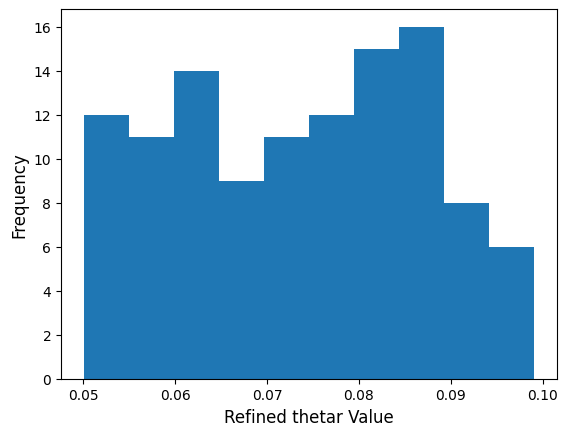

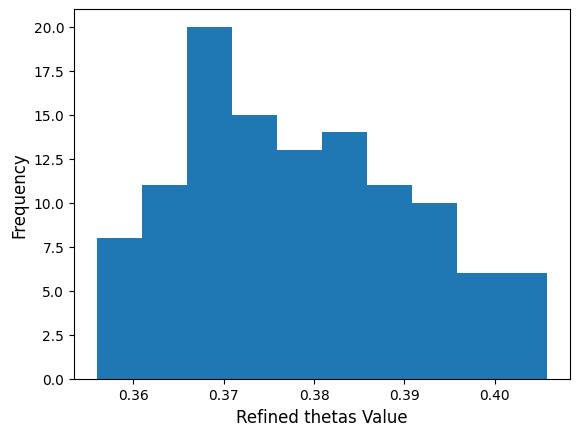

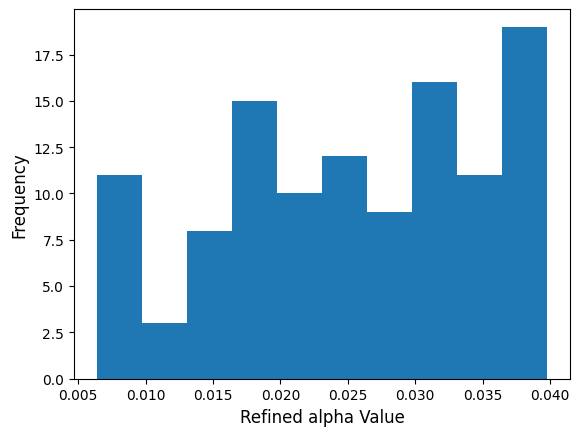

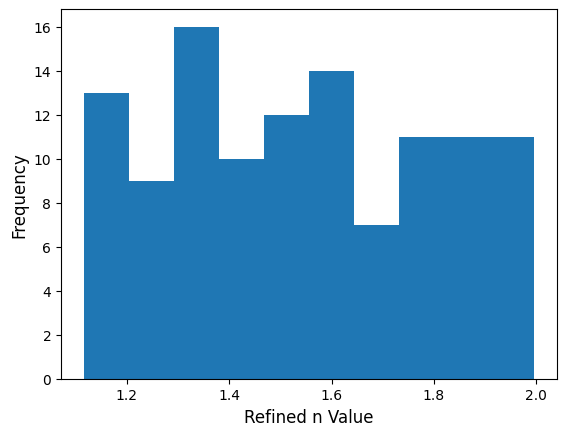

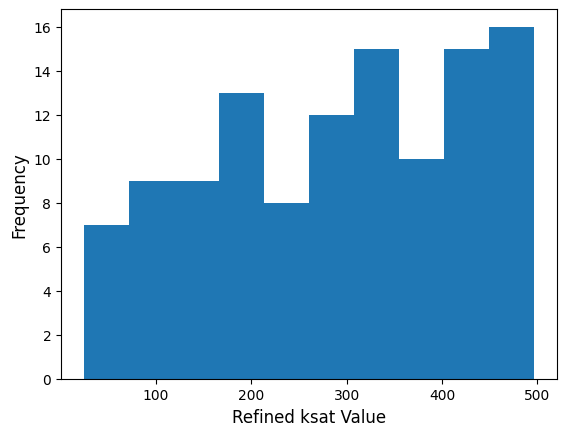

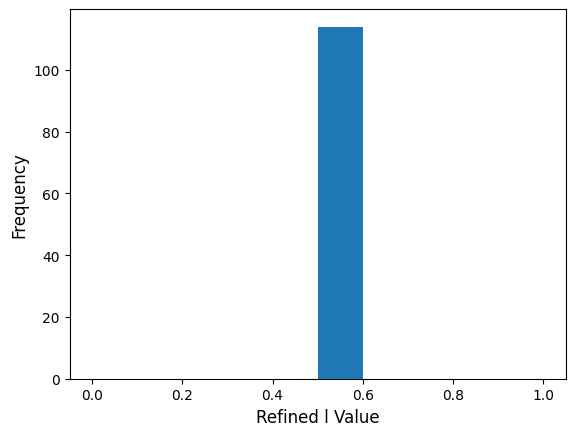

In [113]:
for name in param_names:
    ana.plot_refined_parameters(param=name, indx=0)

Or, compare the pre- and post- calibration parameter distributions. Obviously in this case our pre-distribution was just a Uniform distribution for a given range.

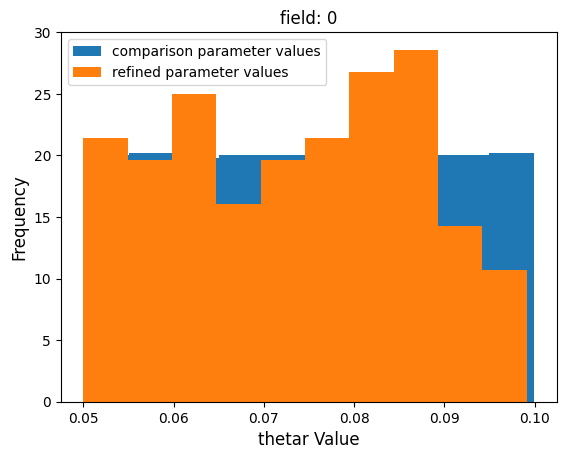

In [114]:
ana.compare_parameter_distributions('thetar', comp_dstb=cal_ds.thetar_samples[:, 0], indx=0, density=True)

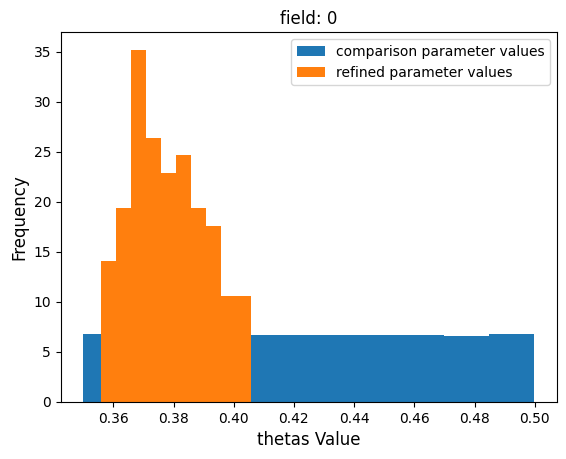

In [115]:
ana.compare_parameter_distributions('thetas', comp_dstb=cal_ds.thetas_samples[:, 0], indx=0, density=True)

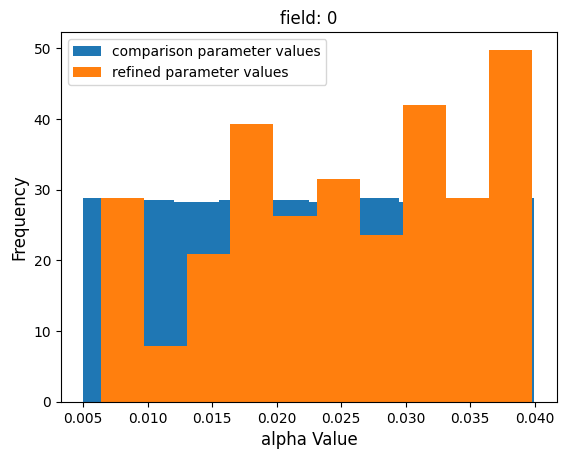

In [116]:
ana.compare_parameter_distributions('alpha', comp_dstb=cal_ds.alpha_samples[:, 0], indx=0, density=True)

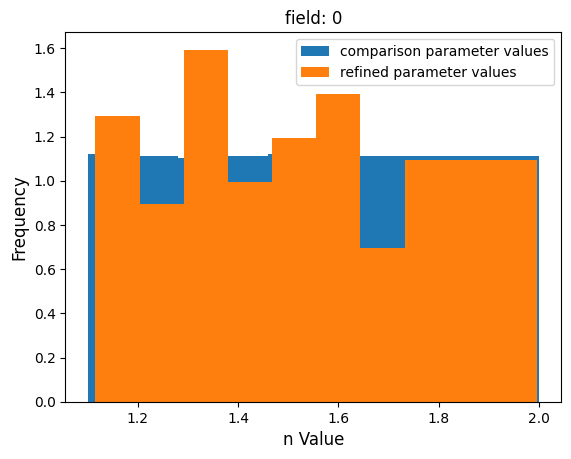

In [117]:
ana.compare_parameter_distributions('n', comp_dstb=cal_ds.n_samples[:, 0], indx=0, density=True)

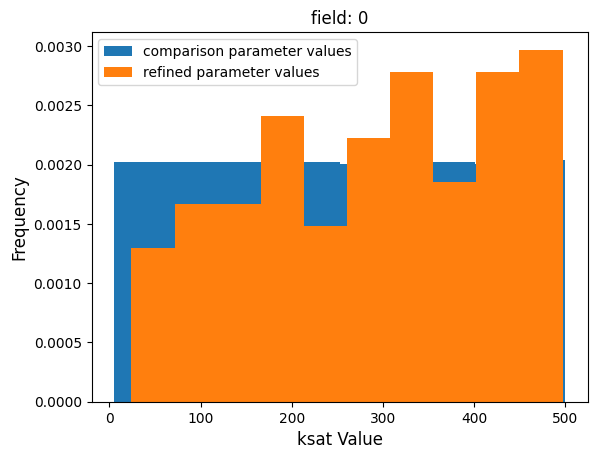

In [118]:
ana.compare_parameter_distributions('ksat', comp_dstb=cal_ds.ksat_samples[:, 0], indx=0, density=True)

We can use the analyzer class to also look at the distribution of objective function values for each model over the number of repititions.

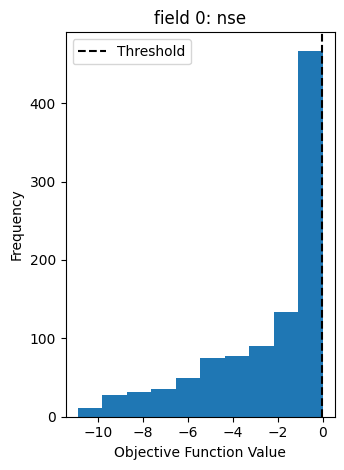

In [119]:
ana.plot_objective_functions(0, threshold=True)

Plot the 95PPU with observation data and the best simulation result for the current interation.

In [120]:
obsdata = np.array(np1.drop(columns=["Date"]))

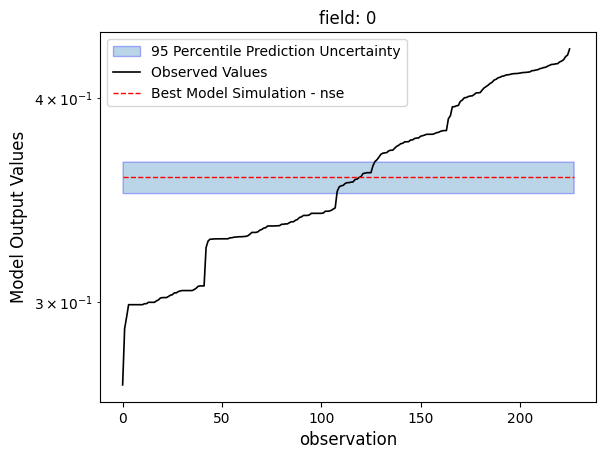

In [121]:
nobsdat = obsdata
ana.plot_ppu(0, best_sim=True, obs_data=nobsdat, sort=True)
# The observation data is sorted from low to high

We can plot the values (for each model) of the best objective function result that defines the best simulation for the current iteration.

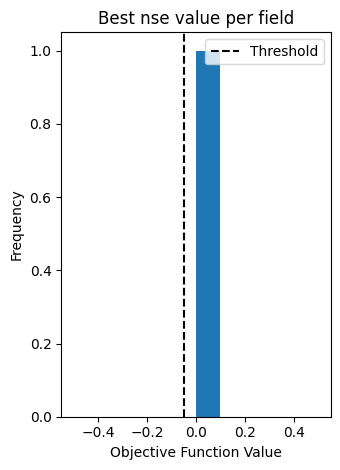

In [122]:
ana.plot_best_objfuncs(threshold=True)

We can also plot the number of refined parameter sets (the parameter sets for each model that were not filtered out by the objective function thresholds).

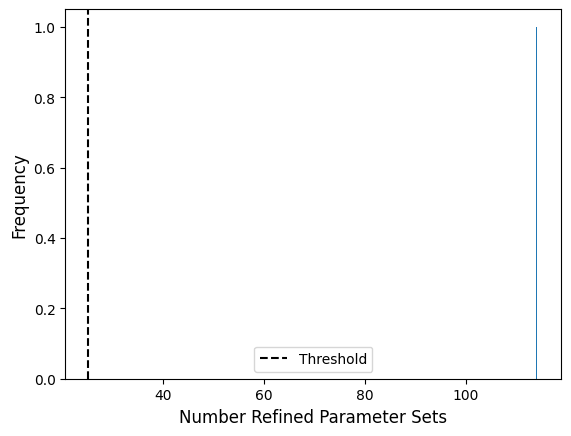

In [123]:
ana.plot_number_refined_params(threshold=True)

Next we can observe how the parameter distributions were altered during the current iteration.

First, we'll select only the successful models.

 The ```.sample()``` method will return index arrays if certain threshold requirements are not met. While most of the work writes directly to the database, I assign the output "results" variable to capture any failed iterations. This can be used later to filter those problem indexes out.

In [124]:
results

array([0])

Now we loop through each successful model and use the analyzer class method ```.calc_param_distribution_change()``` which uses the Wasserstein Distance to measure the difference between the pre- and post- iteration parameter distributions.

In [126]:
np.array(ana.calc_param_distribution_change('n', comp_dstb=cal_ds.n_samples.values[:,0], indx=0))


array(0.01391688)

In [ ]:
n_chng = ana.calc_param_distribution_change('n', comp_dstb=cal_ds.n_samples.values[:,0], indx=0)

n_wd = np.array(n_chng)


In [ ]:
n_chng

In [ ]:
n_wd

The Wasserstein distance measures a relative amount of change that would need to occur to transform one distribution into the other. A value of 0.0 would mean the two ditributions are identical whereas a larger value means the two distributions are more different. Plotting the results for all the successful models, you see that the coef parameter did not change as much before and after this iteration (which is because mathematically it is less sensitive). The exp parameter though showed much higher values for nearly every successful model.

In [ ]:
fig, axs = plt.subplots(1, 2)
axs[0].hist(n_wd)
#axs[1].hist(exp_wd)
axs[0].set_xlabel("coef Wasserstein Distance")
#axs[1].set_xlabel("exp Wasserstein Distance")
axs[0].set_ylabel("Frequency")
#axs[1].set_ylabel("Frequency")
plt.tight_layout()
plt.show()

Finally, the last test we can do, is to compare the calibrated parameters with the initial input parameters (since in this theoretical example we know what each model's parameter was). We could do this in a probabalistic way, comparing the distribution of the refined parameters, or the median of the refined distribution, or we could use the parameter value with the best objective function result...this is visualized in the following plot...

You can see that the median and the best simulation are slightly different from the true parameter value but both are pretty close. Let's look at all the models together using the best simulation parameter sets...

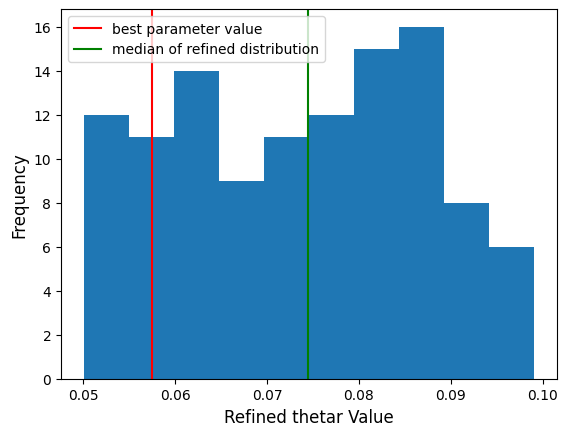

In [133]:
ax = plt.axes()
#ax.axvline(target_exp[1500], color='black', ls='--', label='target parameter value')
ax.axvline(cal_ds.best_parameter_set.sel(objective_functions='nse', parameters='thetar', field=1).values, color='red', label='best parameter value')
ax.axvline(np.nanmedian(cal_ds.thetar_refined.values[:,0]), color='green', label='median of refined distribution')
ax.legend()
ana.plot_refined_parameters('thetar', 0, ax=ax)

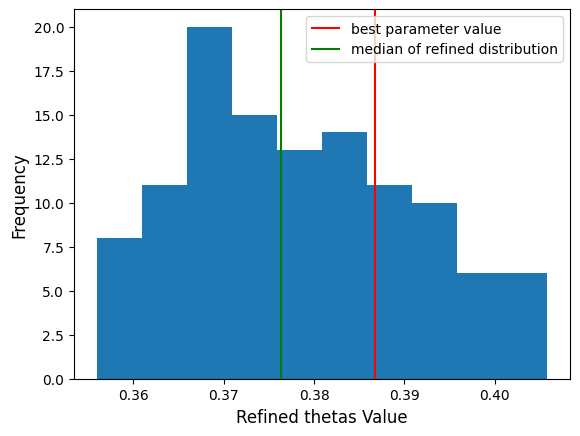

In [131]:
ax = plt.axes()
#ax.axvline(target_exp[1500], color='black', ls='--', label='target parameter value')
ax.axvline(cal_ds.best_parameter_set.sel(objective_functions='nse', parameters='thetas', field=1).values, color='red', label='best parameter value')
ax.axvline(np.nanmedian(cal_ds.thetas_refined.values[:,0]), color='green', label='median of refined distribution')
ax.legend()
ana.plot_refined_parameters('thetas', 0, ax=ax)

In [ ]:
ax = plt.axes()
#ax.axvline(target_exp[1500], color='black', ls='--', label='target parameter value')
ax.axvline(cal_ds.best_parameter_set.sel(objective_functions='nse', parameters='thetas', field=1).values, color='red', label='best parameter value')
ax.axvline(np.nanmedian(cal_ds.thetas_refined.values[:,0]), color='green', label='median of refined distribution')
ax.legend()
ana.plot_refined_parameters('thetas', 0, ax=ax)

While most of the models had a parameter error close to 0.0, there is still a decent spread to these differences. This is because our objective function threshold was rather lax. Let's do another iteration with a much more stringent threshold...

But first, lets deal with our failed models, those that did not retain more than 25 refined parameter sets and/or had a p-factor < 0.35.

These probably failed because they were not well represented in the parameter samples...that can be fixed by increasing the sample size, or relaxing the objective function thresholds. A recommended approach for dealing with these would be to remove them completely and run a separate calibration for those problematic models. For this example, we will isolate those models and use our diagnostics to narrow our parameter search range and see if we can get them to meet the criteria, then we will add them back into our 1st iteration run before beginning iteration 2. If you have a model with significant runtime, you might choose to relax the objective functions instead of add more samples or do additional calibration schemes first. Just don't relax them TOO MUCH!!

Let's save our database as a netcdf first. Just to show that we can, and in case we want to recall any of that information later (remember, our Analyzer class can accept an xarray Dataset so we can revisit iteration 1 diagnostics whenever OR compare them to later iterations).

In [ ]:
# cal_ds.to_netcdf(r"C:\Users\CND571\Documents\swim_sixmile\Sixmile_SWIM_MSCUA_2OF_Iteration_1.nc")

### "Fixing" Failed Fields

Now we will isolate the relevant observation data for our failed models.

In [ ]:
failed_obsdat = obsdata[:, failed]

Now, we can check our best parameter set from iteration 1 because even though the models failed our criteria, they still had 1000 different simulations and a "best" objective function result.

In [ ]:
for par in swim_parnames:
    print(par)
    print(cal_ds.best_parameter_set.sel(objective_functions='rmse', parameters=par).values[failed])

## Single parameter
# print(cal_ds.best_parameter_set.sel(objective_functions='rmse', parameters='ndvi_alpha').values[failed])

# print(cal_ds.best_parameter_set.sel(objective_functions='rmse', parameters=swim_parnames).values[failed])

We'll need a new setup class for the failed models. We just change a few things here from our previous setup:
1) adjust the parameter ranges
2) change our parameter dimensions to match the number of failed results
3) change our observation data to the failed observation data selection

That's all, everything else stays the same.

In [ ]:
class MscuaSetupf1:
    # Define parameters here (before __init__) as variables
    coef = spotpy.parameter.Uniform(low=0.01, high=0.03)
    exp = spotpy.parameter.Uniform(low=1.0, high=1.4)

    def __init__(self, objective_funcs, dbase: Optional[Union[str, Path, MultiDimDb]] = None):
        self.parameter_dimension = {
            'coef': failed_obsdat.shape[1],
            'exp': failed_obsdat.shape[1],
        }
        self.param_dim_names = {
            'coef': 'curve',
            'exp': 'curve',
        }
        self.indata = mdindata
        self.observation_data = failed_obsdat
        
        if isinstance(objective_funcs, list):
            self.objfuncs = objective_funcs
        else:
            self.objfuncs = [objective_funcs]
   
    def simulation(self, paramdict):
        modout = exp_model(self.indata, **paramdict)

        return modout
        
    def evaluation(self):
        return self.observation_data

    def objectivefunction(self, observation, simulation):
        results = {}
        for o in tqdm.tqdm(self.objfuncs, desc="Calculating Objective Functions", leave=False):
            r = o(observation=observation, simulation=simulation, return_dict=True, axis=1)
            results.update(r)
        
        return results

Initialize the sampler and run ```.sample()``` just as before.

In [ ]:
failed_setup = MscuaSetupf1(nrmse_md)
failed_sampler = MsCua(failed_setup)

In [ ]:
failed_results = failed_sampler.sample(1000, {'nrmse': 0.6})

SUCCESS, by narrowing the parameter search ranges for our problem models, they have all met the criteria. Let's add them back to our original iteration database (you could also do this by editing the xarray dataset/netcdf, either way).

In [ ]:
for k,v in sampler.database.refined_parameters.items():
    v[:,failed] = failed_sampler.database.refined_parameters[k]

Now we can check this operation was successful and see that no model has fewer than 25 refined parameter sets.

In [ ]:
nans = np.isnan(sampler.database.refined_parameters['coef'])
nz = np.count_nonzero(~nans, axis=0)
print(nz.min())

### Calibration Iteration 2

Alright, next iteration time. Again, we make a setup class. This time, it is identical to our iteration 1 setup class except now, we are going to use the spotpy List parameter class instead of Uniform. And, to initialize it we will pass it the refined parameters from our 1st iteration. What this does functionally is similar to what we just did with the failed models. We are now running the whole algorithm again but starting from a more representative parameter distribution.

In [ ]:
class MscuaSetupIter2:
    # Define parameters here (before __init__) as variables
    aw = spotpy.parameter.List('aw', sampler.database.refined_parameters['aw'])
    rew = spotpy.parameter.List('rew', sampler.database.refined_parameters['rew'])
    tew = spotpy.parameter.List('tew', sampler.database.refined_parameters['tew'])
    ndvi_alpha = spotpy.parameter.List('ndvi_alpha', sampler.database.refined_parameters['ndvi_alpha'])
    ndvi_beta = spotpy.parameter.List('ndvi_beta', sampler.database.refined_parameters['ndvi_beta'])
    mad = spotpy.parameter.List('mad', sampler.database.refined_parameters['mad'])
    swe_alpha = spotpy.parameter.List('swe_alpha', sampler.database.refined_parameters['swe_alpha'])
    swe_beta = spotpy.parameter.List('swe_beta', sampler.database.refined_parameters['swe_beta'])

    def __init__(self, objective_funcs, dbase: Optional[Union[str, Path, MultiDimDb]] = None):
        self.parameter_dimension = {
            "aw": 15, 
            "rew": 15, 
            "tew": 15, 
            "ndvi_alpha": 15, 
            "ndvi_beta": 15, 
            "mad": 15, 
            "swe_alpha": 15, 
            "swe_beta": 15
        }
        self.param_dim_names = {
            "aw": 'field', 
            "rew": 'field', 
            "tew": 'field', 
            "ndvi_alpha": 'field', 
            "ndvi_beta": 'field', 
            "mad": 'field', 
            "swe_alpha": 'field', 
            "swe_beta": 'field'
        }
        self.indata = fields.input
        self.observation_data = obsdata_1
        
        if isinstance(objective_funcs, list):
            self.objfuncs = objective_funcs
        else:
            self.objfuncs = [objective_funcs]
   
    def simulation(self, paramdict):
        modout = obs_field_cycle.field_day_loop_nc_4_dict(config, fields, params=paramdict)
        modout = np.concatenate([modout[0], modout[1]])
        return modout
        
    def evaluation(self):
        return self.observation_data

    def objectivefunction(self, observation, simulation):
        results = {}
        for o in tqdm.tqdm(self.objfuncs, desc="Calculating Objective Functions", leave=False):
            r = o(observation=observation, simulation=simulation, return_dict=True, axis=1)
            results.update(r)
        
        return results


In [ ]:
iter2_setup = MscuaSetupIter2([rmse_eta_md, rmse_swe_md])
iter2_sampler = MsCua(iter2_setup)

When we go to sample this time, let's lower our threshold to 0.4 from 0.6. This should give us more refined parameters but also filter lots out again.

In [ ]:
iter2_results = iter2_sampler.sample(1000, {'rmse_eta': 1.15, 'rmse_swe': 200}, use_distribution=False)

# I might want to try the nrmse and see if I can get more uniform results across fields.

Alright, that was a success, didn't have any failed models. Let's set up the Analyzer and run the same/similar diagnostics.

In [ ]:
iter2_ds = iter2_sampler.database.to_xarray()

In [ ]:
iter2_ana = MsCuaAnalyzer(iter2_ds)

In [ ]:
ex_idx = 13
## All parameters, one field
for par in swim_parnames:
    iter2_ana.compare_parameter_distributions(par, comp_dstb=cal_ds[f'{par}_refined'].values[:,ex_idx], indx=ex_idx, density=True)

# iter2_ana.compare_parameter_distributions('exp', comp_dstb=cal_ds.exp_refined.values[:,ex_idx], indx=ex_idx, density=True)

In [ ]:
ex_idx = 0

print(f"RMSE_ETA, Field {ex_idx}")

for par in swim_parnames:
    ax = plt.axes()
    # ax.axvline(target_exp[ex_idx], color='black', ls='--', label='target parameter value')
    ax.axvline(iter2_ds.best_parameter_set.sel(objective_functions='rmse_eta', parameters=par, field=ex_idx+1).values, 
            color='red', label='best parameter value')
    ax.axvline(np.nanmedian(iter2_ds[f'{par}_refined'].values[:,ex_idx]), color='green', label='median of refined distribution')
    ax.legend()
    iter2_ana.plot_refined_parameters(par, ex_idx, ax=ax)

# ax = plt.axes()
# ax.axvline(target_coef[ex_idx], color='black', ls='--', label='target parameter value')
# ax.axvline(iter2_ds.best_parameter_set.sel(objective_functions='nrmse', parameters='coef', curve=ex_idx+1).values, 
#            color='red', label='best parameter value')
# ax.axvline(np.nanmedian(iter2_ds.coef_refined.values[:,ex_idx]), color='green', label='median of refined distribution')
# ax.legend()
# iter2_ana.plot_refined_parameters('coef', ex_idx, ax=ax)

In [ ]:
print(f"RMSE_SWE, Field {ex_idx}")

for par in swim_parnames:
    ax = plt.axes()
    # ax.axvline(target_exp[ex_idx], color='black', ls='--', label='target parameter value')
    ax.axvline(iter2_ds.best_parameter_set.sel(objective_functions='rmse_swe', parameters=par, field=ex_idx+1).values, 
            color='red', label='best parameter value')
    ax.axvline(np.nanmedian(iter2_ds[f'{par}_refined'].values[:,ex_idx]), color='green', label='median of refined distribution')
    ax.legend()
    iter2_ana.plot_refined_parameters(par, ex_idx, ax=ax)

# ax = plt.axes()
# ax.axvline(target_exp[ex_idx], color='black', ls='--', label='target parameter value')
# ax.axvline(iter2_ds.best_parameter_set.sel(objective_functions='nrmse', parameters='exp', curve=ex_idx+1).values, color='red', label='best parameter value')
# ax.axvline(np.nanmedian(iter2_ds.exp_refined.values[:,ex_idx]), color='green', label='median of refined distribution')
# ax.legend()
# iter2_ana.plot_refined_parameters('exp', ex_idx, ax=ax)

In [ ]:
ex_idx = 4
iter2_ana.plot_ppu(ex_idx, best_sim=False, obs_data=nobsdat, sort=True)
iter2_ana.plot_ppu(ex_idx, best_sim=False, obs_data=nobsdat, sort=False)

In [ ]:
for i in range(15):
    iter2_ana.plot_objective_functions(i, threshold=True)

In [ ]:
iter2_ana.plot_best_objfuncs(threshold=True)

In [ ]:
# fig, axs = plt.subplots(1, 2, figsize=(8, 4))
# axs[0].hist(target_exp - iter2_ds.best_parameter_set.sel(objective_functions='nrmse', parameters='exp').values)
# axs[0].set_ylabel("Frequency")
# axs[0].set_xlabel("exp parameter error")
# axs[1].hist(target_coef - iter2_ds.best_parameter_set.sel(objective_functions='nrmse', parameters='coef').values)
# axs[1].set_ylabel("Frequency")
# axs[1].set_xlabel("coef parameter error")
# plt.tight_layout()
# plt.show()

### Calibration Iteration 3

Great, it looks like all diagnostic metrics improved. Now, using a probablistic approach like MSCUA is different than an optimization algorthim because we have to use our best judgement and statistical tests to decide when it has "converged." These results look pretty good, we've significantly lowered our 95PPU bounds, better NRMSE distributions, and parameter error with the true values have much narrower distributions around 0.0. Given that I added noise into the theoretical example, we will never be able to truly replicate the original parameter values for ALL models (especially because noise was scaled based on parameter values). SO, you could argue that we are done, but let's see what happens with a 3rd iteration because...we can!!

In [ ]:
class MscuaSetupIter3:
    # Define parameters here (before __init__) as variables
    coef = spotpy.parameter.List('coef', iter2_ds.coef_refined.values)
    exp = spotpy.parameter.List('exp', iter2_ds.exp_refined.values)

    def __init__(self, objective_funcs, dbase: Optional[Union[str, Path, MultiDimDb]] = None):
        self.parameter_dimension = {
            'coef': num_models,
            'exp': num_models,
        }
        self.param_dim_names = {
            'coef': 'curve',
            'exp': 'curve',
        }
        self.indata = mdindata
        self.observation_data = obsdata
        
        if isinstance(objective_funcs, list):
            self.objfuncs = objective_funcs
        else:
            self.objfuncs = [objective_funcs]
   
    def simulation(self, paramdict):
        modout = exp_model(self.indata, **paramdict)

        return modout
        
    def evaluation(self):
        return self.observation_data

    def objectivefunction(self, observation, simulation):
        results = {}
        for o in tqdm.tqdm(self.objfuncs, desc="Calculating Objective Functions", leave=False):
            r = o(observation=observation, simulation=simulation, return_dict=True, axis=1)
            results.update(r)
        
        return results

In [ ]:
iter3_setup = MscuaSetupIter3(nrmse_md)
iter3_sampler = MsCua(iter3_setup)

For this 3rd one, let's get crazy and half the objective function threshold.

In [ ]:
iter3_results = iter3_sampler.sample(1000, {'nrmse': 0.2}, use_distribution=False)

Again, successful run, let's look at the diagnostics...

In [ ]:
iter3_ds = iter3_sampler.database.to_xarray()
iter3_ana = MsCuaAnalyzer(iter3_ds)

The 3rd iteration really did not alter our example parameter distributions all that much.

In [ ]:
iter3_ana.compare_parameter_distributions('exp', comp_dstb=iter2_ds.exp_refined.values[:,ex_idx], indx=ex_idx, density=True)

Our refined parameter sets look to be mellowing out, and our best simulation is just bouncing around that range (suggests we are now within the "noise" envelope for our target parameter).

In [ ]:
ax = plt.axes()
ax.axvline(target_coef[ex_idx], color='black', ls='--', label='target parameter value')
ax.axvline(iter3_ds.best_parameter_set.sel(objective_functions='nrmse', parameters='coef', curve=ex_idx+1).values, 
           color='red', label='best parameter value')
ax.axvline(np.nanmedian(iter3_ds.coef_refined.values[:,ex_idx]), color='green', label='median of refined distribution')
ax.legend()
iter3_ana.plot_refined_parameters('coef', ex_idx, ax=ax)

In [ ]:
ax = plt.axes()
ax.axvline(target_exp[ex_idx], color='black', ls='--', label='target parameter value')
ax.axvline(iter3_ds.best_parameter_set.sel(objective_functions='nrmse', parameters='exp', curve=ex_idx+1).values, 
           color='red', label='best parameter value')
ax.axvline(np.nanmedian(iter3_ds.exp_refined.values[:,ex_idx]), color='green', label='median of refined distribution')
ax.legend()
iter3_ana.plot_refined_parameters('exp', ex_idx, ax=ax)

One thing that did change, is our 95PPU bounds, they've gotten much tighter.

In [ ]:
iter3_ana.plot_ppu(indx=ex_idx, best_sim=True, obs_data=nobsdat, sort=True)

For our example model, the distribution of NRMSE values really didn't change.

In [ ]:
iter3_ana.plot_objective_functions(ex_idx, threshold=True)

Similarily, our BEST objective function values across all models may have improved slightly, but not by much.

In [ ]:
iter3_ana.plot_best_objfuncs(threshold=True)

Comparing to the actual parameter values, we see not much improvement either (again, we're solidly now bouncing around the "noise" envelope).

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(8, 4))
axs[0].hist(target_exp - iter3_ds.best_parameter_set.sel(objective_functions='nrmse', parameters='exp').values)
axs[0].set_ylabel("Frequency")
axs[0].set_xlabel("exp parameter error")
axs[1].hist(target_coef - iter3_ds.best_parameter_set.sel(objective_functions='nrmse', parameters='coef').values)
axs[1].set_ylabel("Frequency")
axs[1].set_xlabel("coef parameter error")
plt.tight_layout()
plt.show()

One other check we can do again is the Wasserstein Distance. Remember we calculated this from iteration 1 to see how much the initial distributions changed.

In [ ]:
exp_chng = []
coef_chng = []
for i in success:
    exp_dist = iter3_ana.calc_param_distribution_change('exp', comp_dstb=iter2_ds.exp_samples.values[:,i], indx=i)
    coef_dist = iter3_ana.calc_param_distribution_change('coef', comp_dstb=iter2_ds.coef_samples.values[:,i], indx=i)
    exp_chng.append(exp_dist)
    coef_chng.append(coef_dist)
exp_wd = np.array(exp_chng)
coef_wd = np.array(coef_chng)

In [ ]:
fig, axs = plt.subplots(1, 2)
axs[0].hist(coef_wd)
axs[1].hist(exp_wd)
axs[0].set_xlabel("coef Wasserstein Distance")
axs[1].set_xlabel("exp Wasserstein Distance")
axs[0].set_ylabel("Frequency")
axs[1].set_ylabel("Frequency")
plt.tight_layout()
plt.show()

This is a pretty telling check, we've pretty drastically changed these distributions meaning our parameter distributions are not really changing in the 3rd iteration. Remember we have max Wasserstein Distance for the "exp" parameter that were over 1.0, now they seem to have normalized around 0.13.

In [ ]:
indx = ex_idx
i1_srt_idx = np.argsort(cal_ds["95PPU_lower"].values[:,indx])
i2_srt_idx = np.argsort(iter2_ds["95PPU_lower"].values[:,indx])
i3_srt_idx = np.argsort(iter3_ds["95PPU_lower"].values[:,indx])
ax = plt.axes()
ax.fill_between(np.arange(cal_ds["95PPU_lower"].values.shape[0]), 
                            cal_ds["95PPU_upper"].values[i1_srt_idx,indx], 
                            cal_ds["95PPU_lower"].values[i1_srt_idx,indx], 
                            label="Iteration 1 95PPU",
                            ec='red',
                            facecolor='red',
                            alpha=0.3)
ax.fill_between(np.arange(iter2_ds["95PPU_lower"].values.shape[0]), 
                            iter2_ds["95PPU_upper"].values[i2_srt_idx,indx], 
                            iter2_ds["95PPU_lower"].values[i2_srt_idx,indx], 
                            label="Iteration 2 95PPU",
                            ec='blue',
                            facecolor='blue',
                            alpha=0.3)
ax.fill_between(np.arange(iter3_ds["95PPU_lower"].values.shape[0]), 
                            iter3_ds["95PPU_upper"].values[i3_srt_idx,indx], 
                            iter3_ds["95PPU_lower"].values[i3_srt_idx,indx], 
                            label="Iteration 3 95PPU",
                            ec='green',
                            facecolor='green',
                            alpha=0.3)
ax.set_ylabel('Model Output Values')
ax.set_xlabel('Observation')
ax.legend()
plt.show()

So, the main benefit to adding a 3rd iteration was to reduce the calibrated model uncertainty. The "best" simulations did not really change much from iteration to iteration but the 95PPU got smaller and smaller, which we would expect as we make our objective function threshold more stringent. The above plot shows the decrease of the 95PPU with each iteration.